In [1]:
import sys
sys.path.append('/home/xinyiz/pamrats')

In [2]:
import time
import os

import scanpy as sc
import numpy as np
import scipy.sparse as sp

import torch
from torch import optim


import gae.gae.optimizer as optimizer
import gae.gae.model
import gae.gae.preprocessing as preprocessing

import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import umap
import pandas as pd
from sklearn.preprocessing import scale
from sklearn.preprocessing import MinMaxScaler
import json
import matplotlib.image as mpimg
import networkx as nx

from sklearn.neighbors import NearestNeighbors
from sklearn.metrics.pairwise import euclidean_distances

In [3]:
datadir='/home/xinyi/staci_validation/10xVisiumADFFPE/'
tissuepospath='VisiumFFPE_Mouse_Brain_Alzheimers_AppNote_aggr_tissue_positions_list.csv'
tissuepos=pd.read_csv(os.path.join(datadir,tissuepospath),header=None)

tissuepos.index=tissuepos.iloc[:,0]
# scalefactor=0.150015
libraryID=pd.read_csv(os.path.join(datadir,'VisiumFFPE_Mouse_Brain_Alzheimers_AppNote_aggregation.csv'))
features=sc.read_10x_h5(os.path.join(datadir,'VisiumFFPE_Mouse_Brain_Alzheimers_AppNote_filtered_feature_bc_matrix.h5'))

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [4]:
features.obs['x']=tissuepos.loc[features.obs.index,4]
features.obs['y']=tissuepos.loc[features.obs.index,5]
features.obs['barcodes']=features.obs.index
sampleidx=features.obs['barcodes'].apply(lambda x: x.split('-')[1])
samplenameList=np.zeros(sampleidx.size).astype(str)
for s in np.unique(sampleidx):
    samplenameList[sampleidx==s]=libraryID['library_id'][int(s)-1]
features.obs['samplename']=samplenameList
features.var_names_make_unique()
features=features[:,np.array(np.sum(features.X,axis=0)>3).flatten()]

In [5]:
# Settings
# os.environ["CUDA_VISIBLE_DEVICES"] = "2" 
cudadevice0=0
cudadevice1=1
use_cuda=True
fastmode=False #Validate during training pass
seed=3
useSavedMaskedEdges=True
maskedgeName='knn6_connectivity'
nneighbors=6
epochs=13240
saveFreq=490
lr=0.01 #initial learning rate
lr_adv=0.001
weight_decay=0 #Weight for L2 loss on embedding matrix.

hidden1=30000 #Number of units in hidden layer 1
hidden2=30000 #Number of units in hidden layer 2
fc_dim1=30000
adv_hidden=128

dropout=0.01
testNodes=0.1 #fraction of total nodes for testing
valNodes=0.05 #fraction of total nodes for validation
XreconWeight=240
# clfweight=20
advWeight=2
# randFeatureSubset=None
model_str='fc1_dca_sharded'
clf=None
adv=None #'clf_fc1_control_eq' #'clf_fc1'
protein=None #'scaled_binary'
proteinWeights=0.05
adj_decodeName=None #gala or None
ridgeL=0.01
shareGenePi=True

training_sample_X='logminmax'
switchFreq=10
standardizeX=False
name='10xAD_01_dca_over_FCXonly' 
useA=False #set to True to incorporate adjacency reconstruction loss
logsavepath='/data/xinyi/log/train_gae_visium_validation/'+name
modelsavepath='/data/xinyi/models/train_gae_visium_validation/'+name
plotsavepath='/data/xinyi/plots/train_gae_visium_validation/'+name

if not os.path.exists(logsavepath):
    os.mkdir(logsavepath)
if not os.path.exists(modelsavepath):
    os.mkdir(modelsavepath)
if not os.path.exists(plotsavepath):
    os.mkdir(plotsavepath)


# Set cuda and seed
np.random.seed(seed)
if use_cuda and (not torch.cuda.is_available()):
    print('cuda not available')
    use_cuda=False
torch.manual_seed(seed)
if use_cuda:
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.enabled = True

# Load data
# if randFeatureSubset != None:
#     idx=np.random.choice(features.shape[1],randFeatureSubset,replace=False)
#     features=features[:,idx]


In [6]:
def getA_knn(samplename,k,a_mode,savepath=None):
    sobj_coord_np=features.obs.loc[features.obs.index[features.obs['samplename']==samplename],['x','y']].to_numpy()
    nbrs = NearestNeighbors(n_neighbors=k, algorithm='ball_tree').fit(sobj_coord_np)
    a=nbrs.kneighbors_graph(sobj_coord_np,mode=a_mode)
    if a_mode=='connectivity':
        a=a-sp.identity(sobj_coord_np.shape[0],format='csr')
    if a_mode=='distance':
        a[a!=0]=1/a[a!=0]
    if savepath !=None:
        sp.save_npz(savepath,a)
    return a

In [7]:
def plotA(coord,adj):
    g=nx.from_numpy_matrix(adj)
    pos={}
    for n in range(coord.shape[0]):
        pos[n]=(coord[n][0],coord[n][1])
    fig, ax = plt.subplots(dpi=400)
    nx.draw(g,pos,node_size=1,width=0.1)
    plt.savefig(os.path.join(plotsavepath,samplename+'_connectedA'))
    plt.show()

In [8]:
savedirlist={}
featureslist={}
features_raw_list={}
adj_list={}
coordlist={}
commonGenes=[]
    
for samplename in np.unique(features.obs['samplename']):
    print(samplename)
    
    adj_list[samplename]=getA_knn(samplename,nneighbors+1,'connectivity')
    if training_sample_X=='logminmax':
        featurelog_train=np.log2(features.X[features.obs['samplename']==samplename].toarray()+1/2)
        scaler = MinMaxScaler()
        featurelog_train_minmax=np.transpose(scaler.fit_transform(np.transpose(featurelog_train)))
        featureslist[samplename+'X_'+training_sample_X]=torch.tensor(featurelog_train_minmax)
    features_raw_list[samplename+'X_'+'raw']=torch.tensor(features.X[features.obs['samplename']==samplename].toarray())

    
num_features=features.shape[1]
print(num_features)
adjnormlist={}
pos_weightlist={}
normlist={}
for ai in adj_list.keys():
    adjnormlist[ai]=preprocessing.preprocess_graph(adj_list[ai])
    
    pos_weightlist[ai] = torch.tensor(float(adj_list[ai].shape[0] * adj_list[ai].shape[0] - adj_list[ai].sum()) / adj_list[ai].sum()) #using full unmasked adj
    normlist[ai] = adj_list[ai].shape[0] * adj_list[ai].shape[0] / float((adj_list[ai].shape[0] * adj_list[ai].shape[0] - adj_list[ai].sum()) * 2)
    
    adj_label=adj_list[ai] + sp.eye(adj_list[ai].shape[0])
    adj_list[ai]=torch.tensor(adj_label.toarray())
    
        

Transgenic_17p9_rep1
Transgenic_17p9_rep2
Transgenic_2p5_rep1
Transgenic_2p5_rep2
Transgenic_5p7_rep1
Transgenic_5p7_rep2
Wildtype_13p4_rep1
Wildtype_13p4_rep2
Wildtype_2p5_rep1
Wildtype_2p5_rep2
Wildtype_5p7_rep1
Wildtype_5p7_rep2
17186
0
0
0
0
0
0
0
0
0
0
0
0


Transgenic_17p9_rep1


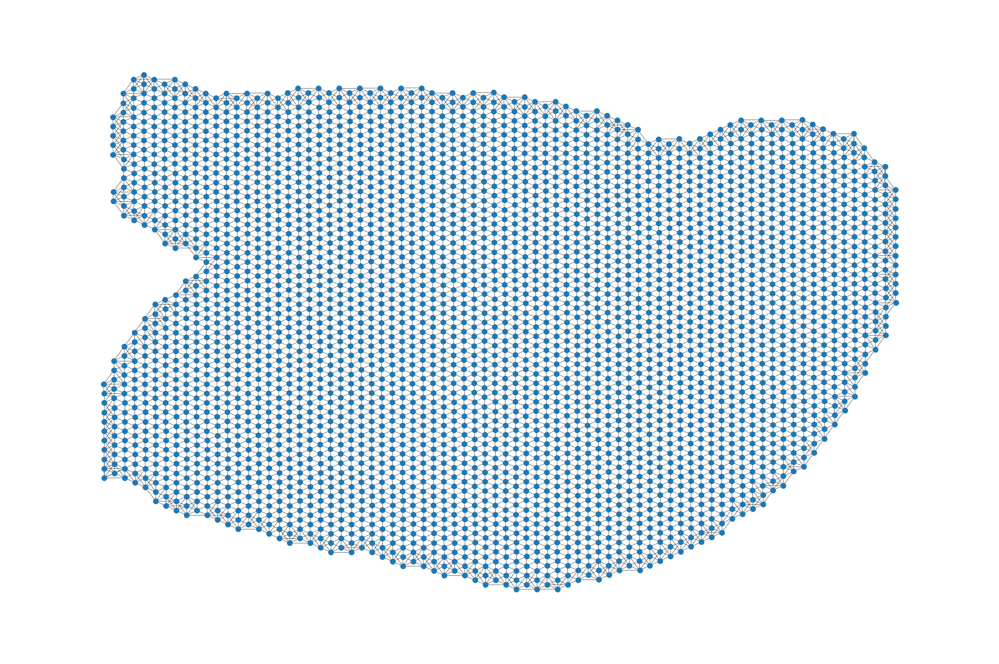

Transgenic_17p9_rep2


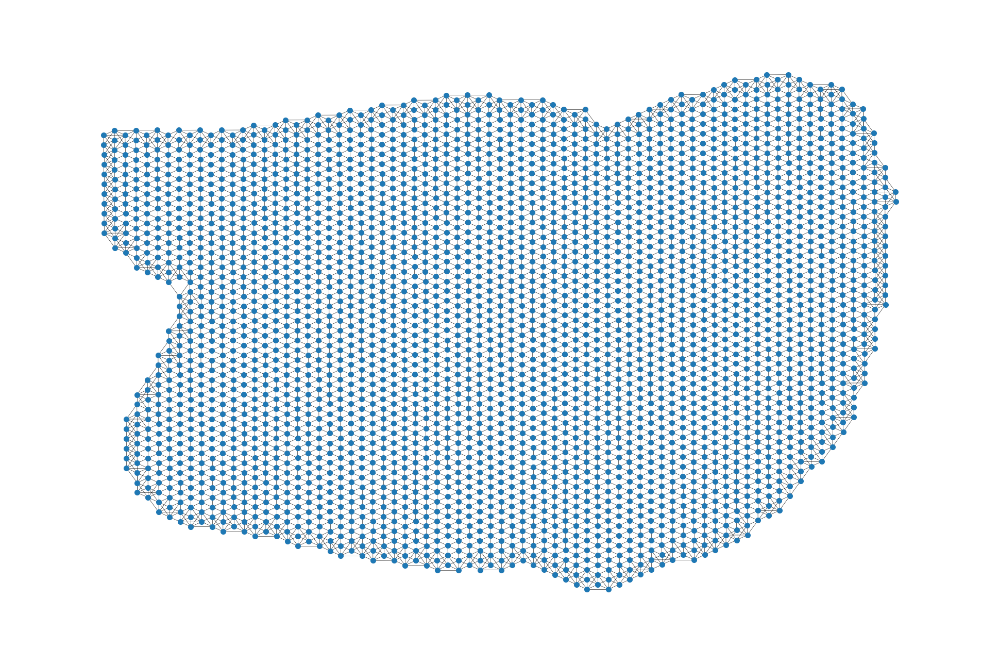

Transgenic_2p5_rep1


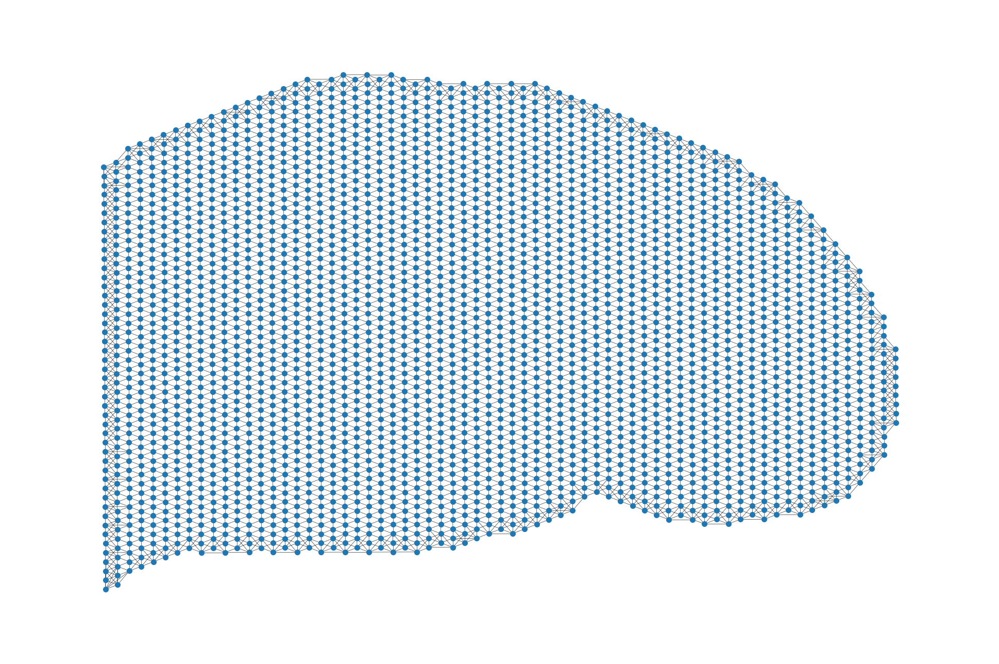

Transgenic_2p5_rep2


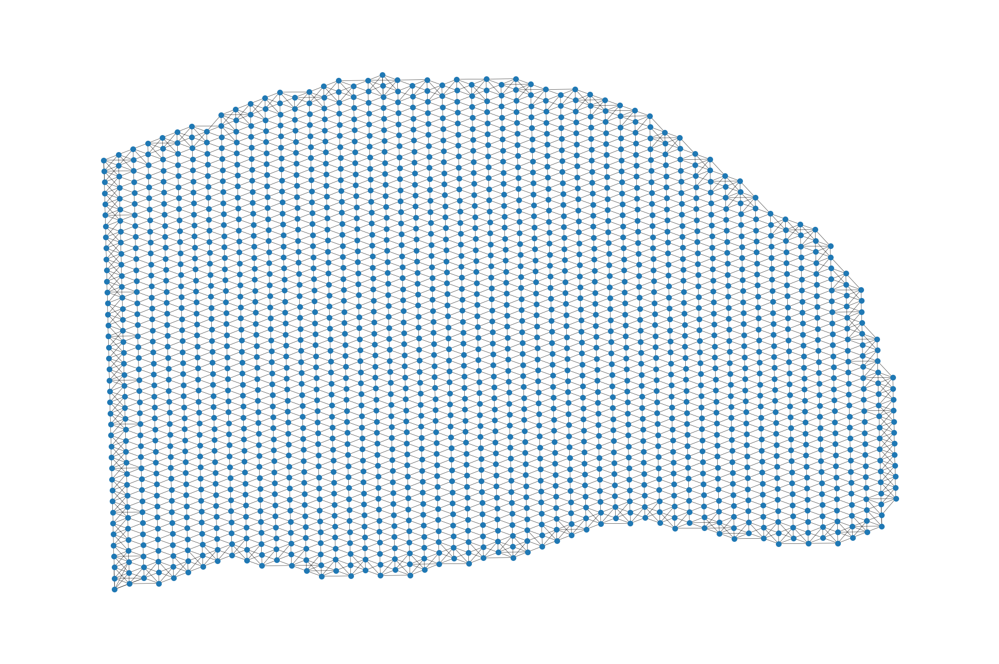

Transgenic_5p7_rep1


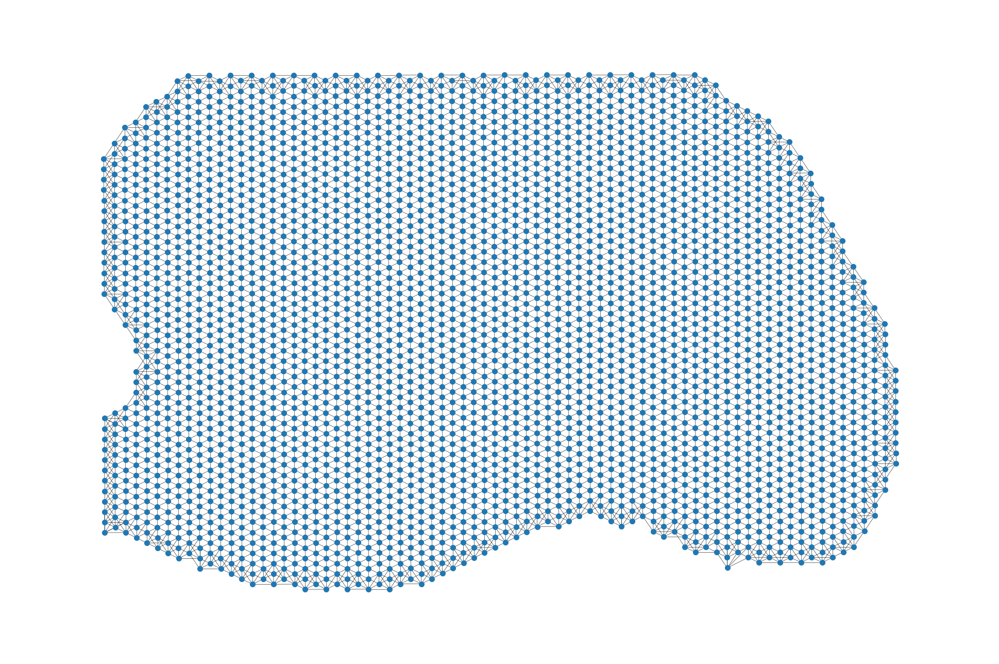

Transgenic_5p7_rep2


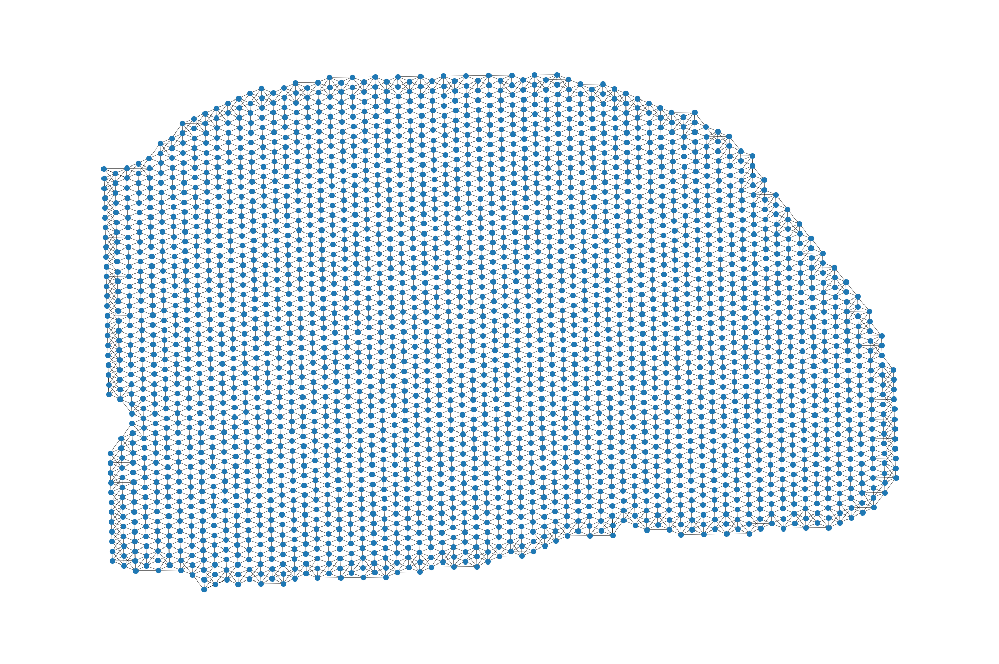

Wildtype_13p4_rep1


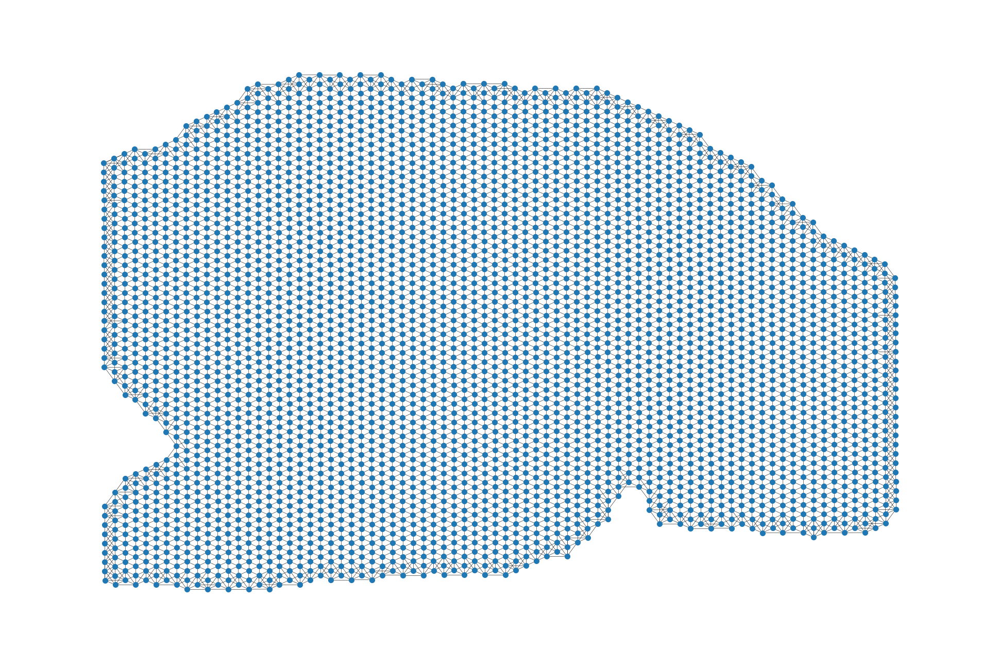

Wildtype_13p4_rep2


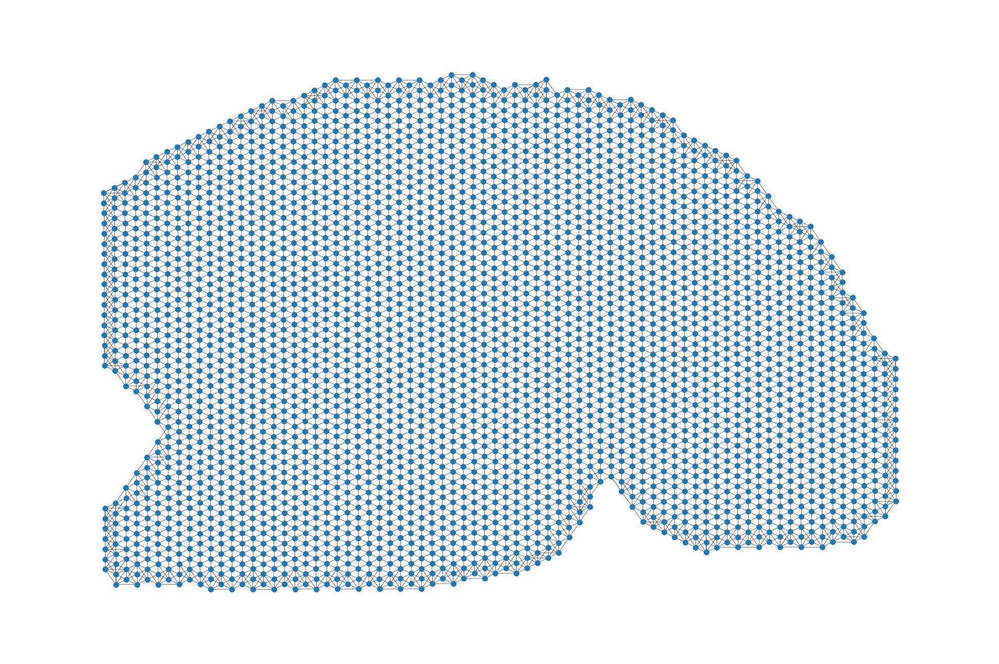

Wildtype_2p5_rep1


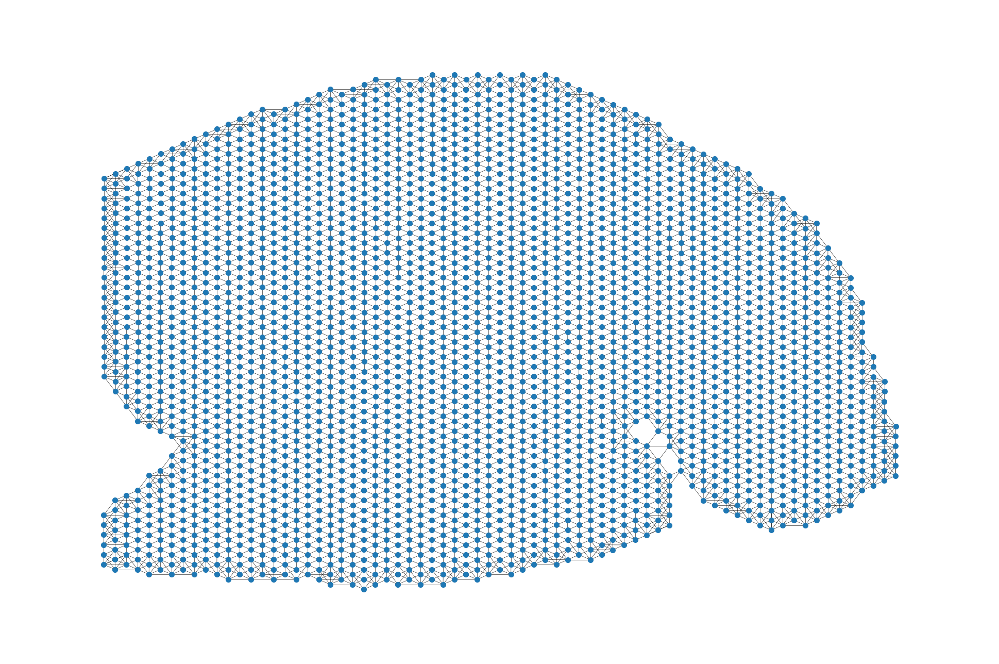

Wildtype_2p5_rep2


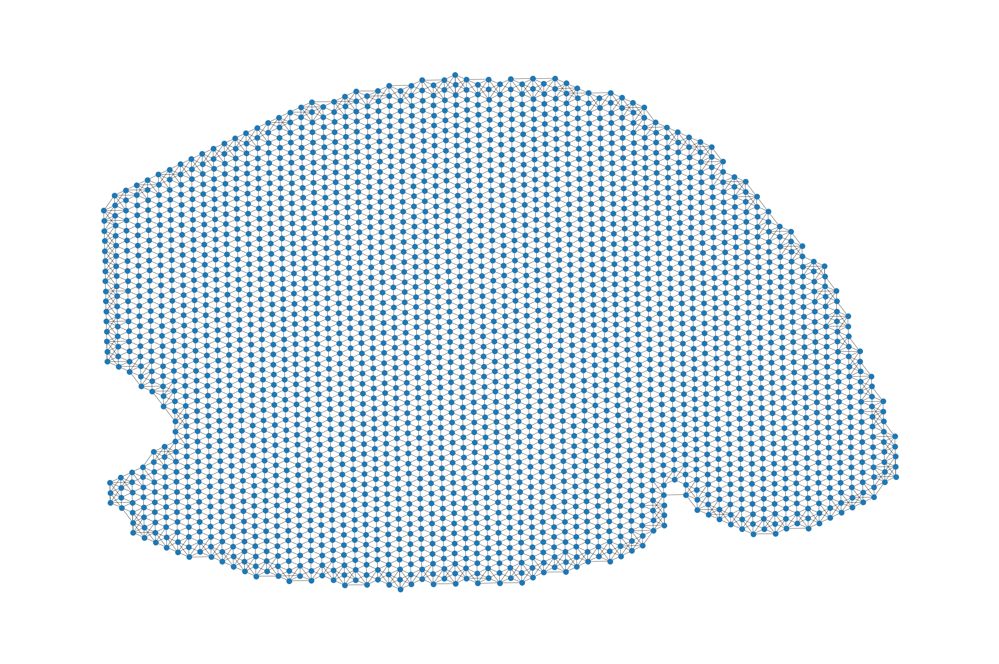

Wildtype_5p7_rep1


In [ ]:
for samplename in adj_list.keys():
    print(samplename)
    sobj_coord_np=features.obs.loc[features.obs.index[features.obs['samplename']==samplename],['x','y']].to_numpy()
    plotA(sobj_coord_np,adj_list[samplename].numpy()-sp.eye(sobj_coord_np.shape[0]))



In [9]:
# loop over all train/validation sets

mse=torch.nn.MSELoss()
# mse=torch.nn.MSELoss(reduction=None)
# Create model
if model_str=='gcn_vae_xa':
    model = gae.gae.model.GCNModelVAE_XA(num_features, hidden1, hidden2,fc_dim1,fc_dim2,fc_dim3,fc_dim4, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_MSE
    loss_a=optimizer.optimizer_CE
elif model_str == 'gcn_vae_gcnX_inprA':
    model = gae.gae.model.GCNModelVAE_gcnX_inprA(num_features, hidden1, hidden2,gcn_dim1, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_MSE
    loss_a=optimizer.optimizer_CE
    
elif model_str == 'gcn_vae_gcnX_inprA_w':
    model = gae.gae.model.GCNModelVAE_gcnX_inprA_w(num_features, hidden1, hidden2,gcn_dim1, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_MSE
    loss_a=optimizer.optimizer_CE    
    
elif model_str=='gcn_vae_xa_e3':
    model = gae.gae.model.GCNModelVAE_XA_e3(num_features, hidden1, hidden2,hidden3,fc_dim1,fc_dim2,fc_dim3,fc_dim4, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_MSE
    loss_a=optimizer.optimizer_CE
    
elif model_str == 'gcn_vae_xa_e1':
    model = gae.gae.model.GCNModelVAE_XA_e1(num_features, hidden1, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_MSE
    loss_a=optimizer.optimizer_CE

elif model_str == 'gcn_vae_xa_e2_d1':
    model = gae.gae.model.GCNModelVAE_XA_e2_d1(num_features, hidden1,hidden2, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_MSE
    loss_a=optimizer.optimizer_CE
    
elif model_str=='gcn_vae_xa_e2_d1_dca_sharded':
    model = gae.gae.model.GCNModelVAE_XA_e2_d1_DCA_sharded(num_features, hidden1,hidden2,fc_dim1, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_zinb
    loss_a=optimizer.optimizer_CE
    
elif model_str=='gcn_vae_xa_e2_d1_dca':
    model = gae.gae.model.GCNModelVAE_XA_e2_d1_DCA(num_features, hidden1,hidden2,fc_dim1, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_zinb
    loss_a=optimizer.optimizer_CE
    
elif model_str=='gcn_vae_xa_e2_d1_dca_fca':
    model = gae.gae.model.GCNModelVAE_XA_e2_d1_DCA_fca(num_features, hidden1,hidden2,fc_dim1, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_zinb
    loss_a=optimizer.optimizer_CE

elif model_str=='gcn_vae_xa_e2_d1_dcaFork':
    model = gae.gae.model.GCNModelVAE_XA_e2_d1_DCAfork(num_features, hidden1,hidden2,fc_dim1, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_zinb
    loss_a=optimizer.optimizer_CE

elif model_str=='gcn_vae_xa_e2_d1_dcaElemPi':
    model = gae.gae.model.GCNModelVAE_XA_e2_d1_DCAelemPi(num_features, hidden1,hidden2,fc_dim1, dropout,shareGenePi)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_zinb
    loss_a=optimizer.optimizer_CE

elif model_str=='gcn_vae_xa_e2_d1_dcaConstantDisp':
    model = gae.gae.model.GCNModelVAE_XA_e2_d1_DCA_constantDisp(num_features, hidden1,hidden2,fc_dim1, dropout,shareGenePi)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_zinb
    loss_a=optimizer.optimizer_CE    
    
elif model_str == 'gcn_vae_xa_e4_d1':
    model = gae.gae.model.GCNModelVAE_XA_e4_d1(num_features, hidden1,hidden2,hidden3,hidden4, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_MSE
    loss_a=optimizer.optimizer_CE    
    
elif model_str=='fc':
    model = gae.gae.model.FCVAE(num_features, hidden1, hidden2,hidden3,hidden4,hidden5,fc_dim1,fc_dim2,fc_dim3,fc_dim4, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_MSE
#     loss_x=mse
    loss_a=optimizer.optimizer_CE
elif model_str=='fcae':
    model = gae.gae.model.FCAE(num_features, hidden1, hidden2,hidden3,hidden4,hidden5,fc_dim1,fc_dim2,fc_dim3,fc_dim4, dropout)
    loss_x=optimizer.optimizer_MSE
#     loss_x=mse

elif model_str=='fcae1':
    model = gae.gae.model.FCAE1(num_features, dropout,hidden1)
    loss_x=optimizer.optimizer_MSE
#     loss_x=mse
elif model_str=='fcae2':
    model = gae.gae.model.FCAE2(num_features, dropout,hidden1,hidden2)
    loss_x=optimizer.optimizer_MSE

elif model_str=='fc1':
    model = gae.gae.model.FCVAE1(num_features, hidden1,dropout)
    loss_x=optimizer.optimizer_MSE
    loss_kl=optimizer.optimizer_kl
    loss_a=optimizer.optimizer_CE

elif model_str=='fc1_fca':
    model = gae.gae.model.FCVAE1_fca(num_features, hidden1,dropout)
    loss_x=optimizer.optimizer_MSE
    loss_kl=optimizer.optimizer_kl
    loss_a=optimizer.optimizer_CE
    
elif model_str=='fc1_dca':
    model = gae.gae.model.FCVAE1_DCA(num_features, hidden1,fc_dim1, dropout)
    loss_x=optimizer.optimizer_zinb
    loss_kl=optimizer.optimizer_kl
    loss_a=optimizer.optimizer_CE
    
elif model_str=='fc1_dca_sharded':
    model = gae.gae.model.FCVAE1_DCA_sharded(num_features, hidden1,fc_dim1, dropout)
    loss_x=optimizer.optimizer_zinb
    loss_kl=optimizer.optimizer_kl
    loss_a=optimizer.optimizer_CE

if clf=='clf_fc1':
    modelClf=gae.gae.model.Clf_fc1(hidden2, dropout,clf_hidden,ct_unique.size)
    loss_clf=torch.nn.CrossEntropyLoss()
    
if adv=='clf_fc1' or adv=='clf_fc1_eq' or adv=='clf_fc1_control' or adv=='clf_fc1_control_eq':
    modelAdv=gae.gae.model.Clf_fc1(hidden2, dropout,adv_hidden,sampleLabellist_ae['control13'].size()[1])
    loss_adv=optimizer.optimizer_CEclf
    


optimizerVAEXA = optim.SGD(model.parameters(), lr=lr, weight_decay=weight_decay)
if clf:
    optimizerClf=optim.Adam(modelClf.parameters(), lr=lr, weight_decay=weight_decay)
if adv:
    optimizerAdv=optim.Adam(modelAdv.parameters(), lr=lr_adv, weight_decay=weight_decay)    


In [10]:
    
if not os.path.exists(os.path.join(plotsavepath,'trace')):
    os.mkdir(os.path.join(plotsavepath,'trace'))
    
def train(epoch):
    t = time.time()
    model.train()
    optimizerVAEXA.zero_grad(True)
    
    if adj_decodeName==None:
        adj_recon,mu,logvar,z,features_recon = model(features, adj_norm)
    #     features_recon, z, mu, logvar=model(features.float())
    else:
        adj_recon,mu,logvar,z,features_recon = model(features, adj_norm,adj_decode)
        
    adj_recon=adj_recon.cuda(0)
    mu=mu.cuda(0)
    logvar=logvar.cuda(0)
    z=z.cuda(0)
#     features_recon=features_recon.cuda(0)
    
    if clf:
        modelClf.train()
        optimizerClf.zero_grad()
        clfOut=modelClf(z)
    if adv and (training_samples_t in list(sampleLabellist_ae.keys())) and (training_samples_t != targetBatch):
        modelAdv.eval()
        advOut=modelAdv(z)
    
    loss_kl_train=loss_kl(mu, logvar, train_nodes_idx)
    if 'dca' in model_str:
        loss_x_train=loss_x(features_recon, features.cuda(0),train_nodes_idx,XreconWeight,ridgeL,features_raw)
    else:
        loss_x_train=loss_x(features_recon, features.cuda(0),train_nodes_idx,XreconWeight,mse)
    loss_a_train=loss_a(adj_recon, adj_label, pos_weight, norm,train_nodes_idx)
    loss=loss_kl_train+loss_x_train 
    if useA:
        loss=loss+loss_a_train
    loss.backward()
    optimizerVAEXA.step()
        
    with torch.no_grad():
        if not fastmode:
            # Evaluate validation set performance separately,
            # deactivates dropout during validation run & no variation in z.
            model.eval()
            if adj_decodeName==None:
                adj_recon,mu,logvar,z, features_recon = model(features, adj_norm)
        #         features_recon, z, mu, logvar=model(features.float())
            else:
                adj_recon,mu,logvar,z, features_recon = model(features, adj_norm,adj_decode)

        adj_recon=adj_recon.cuda(0)
        mu=mu.cuda(0)
        logvar=logvar.cuda(0)
        z=z.cuda(0)
    #     features_recon=features_recon.cuda(0)

        if clf:
            modelClf.eval()
            clfOut=modelClf(z)
        if adv and (training_samples_t in list(sampleLabellist_ae.keys())) and (training_samples_t != targetBatch):
            advOut=modelAdv(z)
        if 'dca' in model_str:
            loss_x_val=loss_x(features_recon, features.cuda(0),val_nodes_idx,XreconWeight,ridgeL,features_raw)
        else:
            loss_x_val=loss_x(features_recon, features,val_nodes_idx,XreconWeight,mse)
        loss_a_val=loss_a(adj_recon, adj_label, pos_weight, norm,val_nodes_idx)
        loss_val=loss_x_val
        if useA:
            loss_val=loss_val+loss_a_val
    print(training_samples_t+' Epoch: {:04d}'.format(epoch),
#           'loss_train: {:.4f}'.format(loss.item()),
          'loss_kl_train: {:.4f}'.format(loss_kl_train.item()),
          'loss_x_train: {:.4f}'.format(loss_x_train.item()),
          'loss_a_train: {:.4f}'.format(loss_a_train.item()),
#           'loss_clf_train: {:.4f}'.format(loss_clf_train.item()),
#           'loss_val: {:.4f}'.format(loss_val.item()),
          'loss_x_val: {:.4f}'.format(loss_x_val.item()),
          'loss_a_val: {:.4f}'.format(loss_a_val.item()),
#           'loss_clf_val: {:.4f}'.format(loss_clf_val.item()),
          'time: {:.4f}s'.format(time.time() - t))
    return time.time() - t,float(loss),float(loss_kl_train),float(loss_x_train),float(loss_a_train),float(loss_val),float(loss_x_val),float(loss_a_val)        

    
# print('cross-validation ',seti)
train_loss_ep=[None]*epochs
train_loss_kl_ep=[None]*epochs
train_loss_x_ep=[None]*epochs
train_loss_a_ep=[None]*epochs
train_loss_clf_ep=[None]*epochs
train_loss_adv_ep=[None]*epochs
train_loss_advD_ep=[None]*epochs
val_loss_ep=[None]*epochs
val_loss_x_ep=[None]*epochs
val_loss_a_ep=[None]*epochs
val_loss_clf_ep=[None]*epochs
val_loss_adv_ep=[None]*epochs
val_loss_advD_ep=[None]*epochs

timePerEpoch=[None]*epochs

t_ep=time.time()

def trace_handler(p):
    output= p.key_averages().table(sort_by="self_cuda_time_total", row_limit=10)
    with open(os.path.join(plotsavepath,'trace', "averages.txt"), 'a') as f:
        f.write(output)
    print(output)
    p.export_chrome_trace(os.path.join(plotsavepath,'trace',str(p.step_num) + ".json"))

with torch.profiler.profile(
    activities=[torch.profiler.ProfilerActivity.CPU, torch.profiler.ProfilerActivity.CUDA],
    profile_memory=True,
    schedule=torch.profiler.schedule(
        wait=1,
        warmup=3,
        active=6),
    on_trace_ready=trace_handler
) as p:        

    for ep in range(epochs):
    # for ep in range(10000,20000):
        t=int(ep/switchFreq)%np.unique(samplenameList).size
        training_samples_t=np.unique(samplenameList)[t]
        print(training_samples_t)
        
        adj_norm=adjnormlist[training_samples_t]
    #     adj_label=adj_list[training_samples_t]
        features=featureslist[training_samples_t+'X_'+training_sample_X]
    #     adj_norm=adjnormlist[training_samples_t].cuda().float()
        adj_label=adj_list[training_samples_t].cuda(0).float()
    #     features=featureslist[training_samples_t+'X_'+training_sample_X].cuda().float()
        pos_weight=pos_weightlist[training_samples_t]
        norm=normlist[training_samples_t]
        if 'dca' in model_str:
    #         features_raw=features_raw_list[training_samples_t+'X_raw']
            features_raw=features_raw_list[training_samples_t+'X_raw'].cuda()
        num_nodes,_ = features.shape

        maskedgeres= preprocessing.mask_nodes_edges(features.shape[0],testNodeSize=testNodes,valNodeSize=valNodes)
        train_nodes_idx,val_nodes_idx,test_nodes_idx = maskedgeres
        if use_cuda:
            train_nodes_idx=train_nodes_idx.cuda(0)
            val_nodes_idx=val_nodes_idx.cuda(0)
            test_nodes_idx=test_nodes_idx.cuda(0)
            
        with torch.profiler.record_function("train_and_validate"):
            timePerEpoch[ep],train_loss_ep[ep],train_loss_kl_ep[ep],train_loss_x_ep[ep],train_loss_a_ep[ep],val_loss_ep[ep],val_loss_x_ep[ep],val_loss_a_ep[ep]=train(ep)


        if ep%saveFreq == 0 and ep!=0:
            torch.save(model.state_dict(), os.path.join(modelsavepath,str(ep)+'.pt'))
        p.step()



Transgenic_17p9_rep1


/home/xinyi/pamrats/gae/gae/optimizer.py:56: UserWarning: Specified kernel cache directory could not be created! This disables kernel caching. Specified directory is /home/xinyi/.cache/torch/kernels. This warning will appear only once per process. (Triggered internally at  ../aten/src/ATen/native/cuda/jit_utils.cpp:860.)
  nbloss1=torch.lgamma(theta+eps) + torch.lgamma(y_true+1.0) - torch.lgamma(y_true+theta+eps)


Transgenic_17p9_rep1 Epoch: 0000 loss_kl_train: 33.9420 loss_x_train: 170.9323 loss_a_train: 2322.5935 loss_x_val: 167.0797 loss_a_val: 54.4548 time: 3.9408s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0001 loss_kl_train: 31.8695 loss_x_train: 154.1994 loss_a_train: 2330.9011 loss_x_val: 166.4596 loss_a_val: 50.7181 time: 3.3338s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0002 loss_kl_train: 30.7510 loss_x_train: 140.9935 loss_a_train: 2335.1941 loss_x_val: 165.5616 loss_a_val: 47.6361 time: 3.3520s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0003 loss_kl_train: 29.8766 loss_x_train: 130.3898 loss_a_train: 2335.4246 loss_x_val: 164.4477 loss_a_val: 45.1663 time: 3.3445s
Transgenic_17p9_rep1


[W CPUAllocator.cpp:219] Memory block of unknown size was allocated before the profiling started, profiler results will not include the deallocation event


Transgenic_17p9_rep1 Epoch: 0004 loss_kl_train: 29.1599 loss_x_train: 121.7343 loss_a_train: 2323.3779 loss_x_val: 163.2158 loss_a_val: 43.2750 time: 3.3590s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0005 loss_kl_train: 28.5581 loss_x_train: 114.5503 loss_a_train: 2332.6763 loss_x_val: 161.9283 loss_a_val: 41.9299 time: 3.3366s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0006 loss_kl_train: 28.0359 loss_x_train: 108.5589 loss_a_train: 2331.5713 loss_x_val: 160.6244 loss_a_val: 41.0999 time: 3.3372s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0007 loss_kl_train: 27.5778 loss_x_train: 103.4596 loss_a_train: 2336.5068 loss_x_val: 159.3321 loss_a_val: 40.7671 time: 3.3491s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0008 loss_kl_train: 27.1707 loss_x_train: 99.1031 loss_a_train: 2328.7302 loss_x_val: 158.0765 loss_a_val: 40.9137 time: 3.3591s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0009 loss_kl_train: 26.7998 loss_x_train: 95.3532 loss_a_train: 2330.4167 loss

Transgenic_2p5_rep1 Epoch: 0020 loss_kl_train: 32.9283 loss_x_train: 82.5854 loss_a_train: 2319.5564 loss_x_val: 154.2277 loss_a_val: 97.4780 time: 2.9431s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0021 loss_kl_train: 31.2031 loss_x_train: 80.7366 loss_a_train: 2310.5581 loss_x_val: 153.5253 loss_a_val: 103.9855 time: 2.9461s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0022 loss_kl_train: 30.3440 loss_x_train: 79.4253 loss_a_train: 2315.7268 loss_x_val: 152.8566 loss_a_val: 111.4626 time: 2.9504s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0023 loss_kl_train: 29.6838 loss_x_train: 78.3076 loss_a_train: 2311.7524 loss_x_val: 152.2236 loss_a_val: 119.9971 time: 2.9498s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0024 loss_kl_train: 29.1321 loss_x_train: 77.3461 loss_a_train: 2308.4822 loss_x_val: 151.6190 loss_a_val: 129.6638 time: 2.9557s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0025 loss_kl_train: 28.6579 loss_x_train: 76.4699 loss_a_train: 2315.8506 loss_x_val: 151

Transgenic_5p7_rep1 Epoch: 0040 loss_kl_train: 26.3018 loss_x_train: 63.7787 loss_a_train: 2323.7158 loss_x_val: 138.7579 loss_a_val: 497.4698 time: 3.2885s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0041 loss_kl_train: 25.3853 loss_x_train: 63.1450 loss_a_train: 2319.4780 loss_x_val: 138.0099 loss_a_val: 536.0038 time: 3.3012s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0042 loss_kl_train: 24.9159 loss_x_train: 62.7317 loss_a_train: 2315.8562 loss_x_val: 137.2724 loss_a_val: 577.2609 time: 3.3070s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0043 loss_kl_train: 24.5425 loss_x_train: 62.3878 loss_a_train: 2331.1865 loss_x_val: 136.5170 loss_a_val: 621.0922 time: 3.3038s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0044 loss_kl_train: 24.2367 loss_x_train: 62.0884 loss_a_train: 2326.7737 loss_x_val: 135.7692 loss_a_val: 667.3052 time: 3.3142s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0045 loss_kl_train: 23.9594 loss_x_train: 61.7967 loss_a_train: 2317.9058 loss_x_val: 13

Wildtype_13p4_rep1 Epoch: 0060 loss_kl_train: 22.0261 loss_x_train: 54.6356 loss_a_train: 2334.4590 loss_x_val: 121.3788 loss_a_val: 1606.5179 time: 3.8046s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0061 loss_kl_train: 21.6197 loss_x_train: 54.4548 loss_a_train: 2331.1306 loss_x_val: 120.6533 loss_a_val: 1643.2081 time: 3.7045s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0062 loss_kl_train: 21.3391 loss_x_train: 54.2997 loss_a_train: 2335.4819 loss_x_val: 119.9444 loss_a_val: 1679.3900 time: 3.6996s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0063 loss_kl_train: 21.1305 loss_x_train: 54.1507 loss_a_train: 2333.4768 loss_x_val: 119.2645 loss_a_val: 1714.7905 time: 3.6938s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0064 loss_kl_train: 20.9534 loss_x_train: 53.9979 loss_a_train: 2329.6514 loss_x_val: 118.6296 loss_a_val: 1749.0626 time: 3.6921s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0065 loss_kl_train: 20.7864 loss_x_train: 53.8751 loss_a_train: 2329.5576 loss_x_val: 118.0209

Wildtype_2p5_rep1 Epoch: 0080 loss_kl_train: 28.2896 loss_x_train: 62.9068 loss_a_train: 2318.3672 loss_x_val: 119.5288 loss_a_val: 2283.8481 time: 3.0356s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0081 loss_kl_train: 27.5405 loss_x_train: 62.6710 loss_a_train: 2314.4321 loss_x_val: 119.8314 loss_a_val: 2254.2693 time: 3.0372s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0082 loss_kl_train: 27.0888 loss_x_train: 62.4990 loss_a_train: 2315.0933 loss_x_val: 120.1190 loss_a_val: 2231.3760 time: 3.0340s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0083 loss_kl_train: 26.7346 loss_x_train: 62.3542 loss_a_train: 2318.2273 loss_x_val: 120.3826 loss_a_val: 2214.2495 time: 3.0365s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0084 loss_kl_train: 26.4344 loss_x_train: 62.2341 loss_a_train: 2314.3765 loss_x_val: 120.6287 loss_a_val: 2201.6685 time: 3.0377s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0085 loss_kl_train: 26.1624 loss_x_train: 62.1112 loss_a_train: 2313.1978 loss_x_val: 120.8478 loss_a_val

Wildtype_5p7_rep1 Epoch: 0100 loss_kl_train: 24.7492 loss_x_train: 58.0920 loss_a_train: 2307.3186 loss_x_val: 120.9239 loss_a_val: 2240.0759 time: 3.4346s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0101 loss_kl_train: 24.2597 loss_x_train: 57.9874 loss_a_train: 2306.3335 loss_x_val: 120.9638 loss_a_val: 2241.1987 time: 3.4243s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0102 loss_kl_train: 23.9732 loss_x_train: 57.9134 loss_a_train: 2301.5566 loss_x_val: 120.9718 loss_a_val: 2244.3384 time: 3.4377s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0103 loss_kl_train: 23.7049 loss_x_train: 57.8157 loss_a_train: 2303.3481 loss_x_val: 120.9603 loss_a_val: 2248.9209 time: 3.4476s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0104 loss_kl_train: 23.4905 loss_x_train: 57.7427 loss_a_train: 2306.1997 loss_x_val: 120.9217 loss_a_val: 2254.5088 time: 3.4284s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0105 loss_kl_train: 23.2736 loss_x_train: 57.6606 loss_a_train: 2304.0205 loss_x_val: 120.8621 loss_a_val

Transgenic_17p9_rep1 Epoch: 0120 loss_kl_train: 19.8019 loss_x_train: 53.6284 loss_a_train: 2333.8269 loss_x_val: 110.7442 loss_a_val: 2450.6680 time: 3.4499s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0121 loss_kl_train: 19.6780 loss_x_train: 53.5434 loss_a_train: 2334.2876 loss_x_val: 110.2764 loss_a_val: 2427.0701 time: 3.4668s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0122 loss_kl_train: 19.5821 loss_x_train: 53.4625 loss_a_train: 2333.6409 loss_x_val: 109.8667 loss_a_val: 2408.2029 time: 3.4647s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0123 loss_kl_train: 19.4833 loss_x_train: 53.3933 loss_a_train: 2337.2603 loss_x_val: 109.5108 loss_a_val: 2393.1660 time: 3.4614s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0124 loss_kl_train: 19.3982 loss_x_train: 53.3390 loss_a_train: 2326.7314 loss_x_val: 109.1914 loss_a_val: 2381.2441 time: 3.4540s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0125 loss_kl_train: 19.3211 loss_x_train: 53.2828 loss_a_train: 2335.300

Transgenic_2p5_rep1 Epoch: 0140 loss_kl_train: 21.8188 loss_x_train: 58.5899 loss_a_train: 2303.8203 loss_x_val: 109.6434 loss_a_val: 2527.4165 time: 3.0051s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0141 loss_kl_train: 21.6469 loss_x_train: 58.4695 loss_a_train: 2308.3110 loss_x_val: 109.3809 loss_a_val: 2484.6272 time: 3.0153s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0142 loss_kl_train: 21.5219 loss_x_train: 58.3820 loss_a_train: 2313.0203 loss_x_val: 109.1913 loss_a_val: 2451.1189 time: 3.0230s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0143 loss_kl_train: 21.3956 loss_x_train: 58.3039 loss_a_train: 2307.0977 loss_x_val: 109.0611 loss_a_val: 2424.9023 time: 3.0148s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0144 loss_kl_train: 21.2819 loss_x_train: 58.2439 loss_a_train: 2304.9231 loss_x_val: 108.9775 loss_a_val: 2404.6704 time: 3.0241s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0145 loss_kl_train: 21.1712 loss_x_train: 58.1820 loss_a_train: 2309.3474 loss_x_va

Transgenic_5p7_rep1 Epoch: 0160 loss_kl_train: 18.8494 loss_x_train: 52.7610 loss_a_train: 2312.9775 loss_x_val: 107.5368 loss_a_val: 2400.1921 time: 3.3275s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0161 loss_kl_train: 18.6998 loss_x_train: 52.7018 loss_a_train: 2307.7910 loss_x_val: 106.9790 loss_a_val: 2371.4912 time: 3.3352s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0162 loss_kl_train: 18.5864 loss_x_train: 52.6535 loss_a_train: 2315.1870 loss_x_val: 106.4983 loss_a_val: 2349.3484 time: 3.3450s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0163 loss_kl_train: 18.4834 loss_x_train: 52.6179 loss_a_train: 2319.2036 loss_x_val: 106.0815 loss_a_val: 2332.0708 time: 3.3443s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0164 loss_kl_train: 18.4041 loss_x_train: 52.5850 loss_a_train: 2310.6204 loss_x_val: 105.7160 loss_a_val: 2318.4250 time: 3.3447s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0165 loss_kl_train: 18.3226 loss_x_train: 52.5469 loss_a_train: 2314.1484 loss_x_va

Wildtype_13p4_rep1 Epoch: 0180 loss_kl_train: 16.8255 loss_x_train: 47.9324 loss_a_train: 2340.2310 loss_x_val: 101.3080 loss_a_val: 2422.8384 time: 3.7029s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0181 loss_kl_train: 16.7428 loss_x_train: 47.8940 loss_a_train: 2340.7036 loss_x_val: 100.9177 loss_a_val: 2394.4697 time: 3.7261s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0182 loss_kl_train: 16.6750 loss_x_train: 47.8686 loss_a_train: 2334.6545 loss_x_val: 100.5642 loss_a_val: 2371.2065 time: 3.7056s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0183 loss_kl_train: 16.6066 loss_x_train: 47.8413 loss_a_train: 2340.2842 loss_x_val: 100.2555 loss_a_val: 2352.3369 time: 3.7226s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0184 loss_kl_train: 16.5472 loss_x_train: 47.8148 loss_a_train: 2344.3447 loss_x_val: 99.9773 loss_a_val: 2336.6575 time: 3.7086s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0185 loss_kl_train: 16.4970 loss_x_train: 47.7875 loss_a_train: 2338.2510 loss_x_val: 99.7179 l

Wildtype_2p5_rep1 Epoch: 0200 loss_kl_train: 21.9099 loss_x_train: 57.3620 loss_a_train: 2311.5227 loss_x_val: 105.1546 loss_a_val: 2461.1482 time: 3.0197s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0201 loss_kl_train: 21.7758 loss_x_train: 57.3017 loss_a_train: 2312.3098 loss_x_val: 105.5576 loss_a_val: 2413.2024 time: 3.0308s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0202 loss_kl_train: 21.6486 loss_x_train: 57.2671 loss_a_train: 2313.7090 loss_x_val: 105.9456 loss_a_val: 2375.0859 time: 3.0245s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0203 loss_kl_train: 21.5314 loss_x_train: 57.2374 loss_a_train: 2312.8008 loss_x_val: 106.3010 loss_a_val: 2345.0471 time: 3.0348s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0204 loss_kl_train: 21.4420 loss_x_train: 57.2069 loss_a_train: 2312.1572 loss_x_val: 106.6398 loss_a_val: 2321.5642 time: 3.0357s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0205 loss_kl_train: 21.3379 loss_x_train: 57.1796 loss_a_train: 2310.1243 loss_x_val: 106.9525 loss_a_val

Wildtype_5p7_rep1 Epoch: 0220 loss_kl_train: 19.5789 loss_x_train: 53.8872 loss_a_train: 2297.8516 loss_x_val: 109.2544 loss_a_val: 2353.9500 time: 3.4378s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0221 loss_kl_train: 19.4739 loss_x_train: 53.8607 loss_a_train: 2296.5569 loss_x_val: 109.2541 loss_a_val: 2351.2290 time: 3.4444s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0222 loss_kl_train: 19.3638 loss_x_train: 53.8326 loss_a_train: 2294.3167 loss_x_val: 109.2345 loss_a_val: 2350.1201 time: 3.4325s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0223 loss_kl_train: 19.2702 loss_x_train: 53.8010 loss_a_train: 2289.5891 loss_x_val: 109.1956 loss_a_val: 2350.0962 time: 3.4271s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0224 loss_kl_train: 19.1873 loss_x_train: 53.7782 loss_a_train: 2296.3140 loss_x_val: 109.1341 loss_a_val: 2350.7266 time: 3.4376s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0225 loss_kl_train: 19.0987 loss_x_train: 53.7543 loss_a_train: 2295.7139 loss_x_val: 109.0758 loss_a_val

Transgenic_17p9_rep1 Epoch: 0240 loss_kl_train: 16.5798 loss_x_train: 50.4934 loss_a_train: 2333.6064 loss_x_val: 100.7002 loss_a_val: 2545.8303 time: 3.4609s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0241 loss_kl_train: 16.5265 loss_x_train: 50.4615 loss_a_train: 2336.7297 loss_x_val: 100.1843 loss_a_val: 2516.3408 time: 3.4595s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0242 loss_kl_train: 16.4739 loss_x_train: 50.4303 loss_a_train: 2335.8564 loss_x_val: 99.7387 loss_a_val: 2492.1399 time: 3.4851s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0243 loss_kl_train: 16.4296 loss_x_train: 50.4085 loss_a_train: 2338.0129 loss_x_val: 99.3635 loss_a_val: 2472.6306 time: 3.4624s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0244 loss_kl_train: 16.3853 loss_x_train: 50.3854 loss_a_train: 2336.0862 loss_x_val: 99.0213 loss_a_val: 2456.2129 time: 3.4621s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0245 loss_kl_train: 16.3405 loss_x_train: 50.3754 loss_a_train: 2336.5952 l

Transgenic_2p5_rep1 Epoch: 0260 loss_kl_train: 18.4497 loss_x_train: 55.9006 loss_a_train: 2302.7590 loss_x_val: 100.7987 loss_a_val: 2552.0371 time: 3.0226s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0261 loss_kl_train: 18.3661 loss_x_train: 55.8570 loss_a_train: 2303.7825 loss_x_val: 100.4836 loss_a_val: 2506.5776 time: 3.0239s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0262 loss_kl_train: 18.2982 loss_x_train: 55.8197 loss_a_train: 2303.1926 loss_x_val: 100.2325 loss_a_val: 2470.9946 time: 3.0263s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0263 loss_kl_train: 18.2228 loss_x_train: 55.7864 loss_a_train: 2300.3567 loss_x_val: 100.0481 loss_a_val: 2443.5032 time: 3.0158s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0264 loss_kl_train: 18.1475 loss_x_train: 55.7642 loss_a_train: 2310.5786 loss_x_val: 99.9169 loss_a_val: 2422.5693 time: 3.0174s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0265 loss_kl_train: 18.0943 loss_x_train: 55.7351 loss_a_train: 2303.6375 loss_x_val

Transgenic_5p7_rep1 Epoch: 0280 loss_kl_train: 15.8940 loss_x_train: 50.7525 loss_a_train: 2313.1775 loss_x_val: 99.2657 loss_a_val: 2472.2217 time: 3.3368s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0281 loss_kl_train: 15.8198 loss_x_train: 50.7249 loss_a_train: 2311.0676 loss_x_val: 98.7020 loss_a_val: 2438.2495 time: 3.3497s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0282 loss_kl_train: 15.7511 loss_x_train: 50.7081 loss_a_train: 2306.6401 loss_x_val: 98.2444 loss_a_val: 2411.1267 time: 3.3585s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0283 loss_kl_train: 15.7012 loss_x_train: 50.6917 loss_a_train: 2314.2271 loss_x_val: 97.8390 loss_a_val: 2389.4434 time: 3.3570s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0284 loss_kl_train: 15.6537 loss_x_train: 50.6798 loss_a_train: 2310.3098 loss_x_val: 97.4911 loss_a_val: 2371.7776 time: 3.3582s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0285 loss_kl_train: 15.6134 loss_x_train: 50.6666 loss_a_train: 2309.5854 loss_x_val: 97

Wildtype_13p4_rep1 Epoch: 0300 loss_kl_train: 14.3892 loss_x_train: 46.2532 loss_a_train: 2339.4631 loss_x_val: 93.9022 loss_a_val: 2446.3572 time: 3.7009s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0301 loss_kl_train: 14.3477 loss_x_train: 46.2373 loss_a_train: 2339.3584 loss_x_val: 93.4415 loss_a_val: 2415.3232 time: 3.6976s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0302 loss_kl_train: 14.3116 loss_x_train: 46.2210 loss_a_train: 2338.3381 loss_x_val: 93.0421 loss_a_val: 2389.9263 time: 3.7067s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0303 loss_kl_train: 14.2655 loss_x_train: 46.2092 loss_a_train: 2339.9712 loss_x_val: 92.6911 loss_a_val: 2368.9451 time: 3.6992s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0304 loss_kl_train: 14.2395 loss_x_train: 46.2005 loss_a_train: 2340.4871 loss_x_val: 92.3871 loss_a_val: 2351.6843 time: 3.7049s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0305 loss_kl_train: 14.2057 loss_x_train: 46.1885 loss_a_train: 2342.0083 loss_x_val: 92.1148 loss_

Wildtype_2p5_rep1 Epoch: 0320 loss_kl_train: 19.0540 loss_x_train: 55.7094 loss_a_train: 2310.2429 loss_x_val: 98.0218 loss_a_val: 2448.0051 time: 3.0364s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0321 loss_kl_train: 18.9779 loss_x_train: 55.6918 loss_a_train: 2317.7612 loss_x_val: 98.3299 loss_a_val: 2397.6375 time: 3.0285s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0322 loss_kl_train: 18.9228 loss_x_train: 55.6636 loss_a_train: 2307.9951 loss_x_val: 98.6416 loss_a_val: 2357.7268 time: 3.0319s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0323 loss_kl_train: 18.8548 loss_x_train: 55.6495 loss_a_train: 2308.2734 loss_x_val: 98.9428 loss_a_val: 2326.3762 time: 3.0412s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0324 loss_kl_train: 18.7890 loss_x_train: 55.6346 loss_a_train: 2303.4141 loss_x_val: 99.2230 loss_a_val: 2301.7712 time: 3.0409s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0325 loss_kl_train: 18.7387 loss_x_train: 55.6189 loss_a_train: 2307.5366 loss_x_val: 99.5019 loss_a_val: 2283

Wildtype_5p7_rep1 Epoch: 0340 loss_kl_train: 17.0094 loss_x_train: 52.4337 loss_a_train: 2290.8862 loss_x_val: 101.6788 loss_a_val: 2364.0669 time: 3.4374s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0341 loss_kl_train: 16.9521 loss_x_train: 52.4072 loss_a_train: 2288.1409 loss_x_val: 101.6238 loss_a_val: 2358.3767 time: 3.4473s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0342 loss_kl_train: 16.8909 loss_x_train: 52.3962 loss_a_train: 2285.2512 loss_x_val: 101.5678 loss_a_val: 2354.4763 time: 3.4387s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0343 loss_kl_train: 16.8453 loss_x_train: 52.3815 loss_a_train: 2289.0159 loss_x_val: 101.4915 loss_a_val: 2351.6697 time: 3.4338s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0344 loss_kl_train: 16.7879 loss_x_train: 52.3713 loss_a_train: 2291.8528 loss_x_val: 101.4016 loss_a_val: 2349.8513 time: 3.4500s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0345 loss_kl_train: 16.7488 loss_x_train: 52.3622 loss_a_train: 2288.1675 loss_x_val: 101.3161 loss_a_val

Transgenic_17p9_rep1 Epoch: 0360 loss_kl_train: 14.6587 loss_x_train: 49.2881 loss_a_train: 2334.1665 loss_x_val: 94.0337 loss_a_val: 2566.7793 time: 3.4758s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0361 loss_kl_train: 14.6250 loss_x_train: 49.2708 loss_a_train: 2333.1553 loss_x_val: 93.5300 loss_a_val: 2535.6221 time: 3.4695s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0362 loss_kl_train: 14.6047 loss_x_train: 49.2610 loss_a_train: 2333.6785 loss_x_val: 93.0997 loss_a_val: 2509.8872 time: 3.4573s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0363 loss_kl_train: 14.5697 loss_x_train: 49.2445 loss_a_train: 2337.0984 loss_x_val: 92.7227 loss_a_val: 2488.7639 time: 3.4705s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0364 loss_kl_train: 14.5485 loss_x_train: 49.2381 loss_a_train: 2335.3638 loss_x_val: 92.4013 loss_a_val: 2471.2280 time: 3.4619s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0365 loss_kl_train: 14.5162 loss_x_train: 49.2276 loss_a_train: 2335.3264 los

Wildtype_13p4_rep1 Epoch: 0420 loss_kl_train: 12.8752 loss_x_train: 45.4687 loss_a_train: 2340.6594 loss_x_val: 88.5877 loss_a_val: 2445.2275 time: 3.7198s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0421 loss_kl_train: 12.8474 loss_x_train: 45.4633 loss_a_train: 2338.9736 loss_x_val: 88.1641 loss_a_val: 2414.6809 time: 3.6946s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0422 loss_kl_train: 12.8194 loss_x_train: 45.4501 loss_a_train: 2335.4929 loss_x_val: 87.7808 loss_a_val: 2389.2771 time: 3.6945s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0423 loss_kl_train: 12.7962 loss_x_train: 45.4442 loss_a_train: 2339.8018 loss_x_val: 87.4508 loss_a_val: 2368.4629 time: 3.7108s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0424 loss_kl_train: 12.7824 loss_x_train: 45.4365 loss_a_train: 2341.7075 loss_x_val: 87.1663 loss_a_val: 2351.0728 time: 3.7147s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0425 loss_kl_train: 12.7620 loss_x_train: 45.4332 loss_a_train: 2336.8970 loss_x_val: 86.9250 loss_

Wildtype_2p5_rep1 Epoch: 0440 loss_kl_train: 17.3004 loss_x_train: 54.8959 loss_a_train: 2306.2180 loss_x_val: 92.9444 loss_a_val: 2428.7617 time: 3.0419s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0441 loss_kl_train: 17.2468 loss_x_train: 54.8740 loss_a_train: 2306.9170 loss_x_val: 93.2498 loss_a_val: 2378.4004 time: 3.0380s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0442 loss_kl_train: 17.2161 loss_x_train: 54.8612 loss_a_train: 2302.4360 loss_x_val: 93.5381 loss_a_val: 2338.5610 time: 3.0320s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0443 loss_kl_train: 17.1688 loss_x_train: 54.8465 loss_a_train: 2303.7009 loss_x_val: 93.8285 loss_a_val: 2307.3860 time: 3.0416s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0444 loss_kl_train: 17.1372 loss_x_train: 54.8362 loss_a_train: 2306.3486 loss_x_val: 94.0858 loss_a_val: 2283.2371 time: 3.0440s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0445 loss_kl_train: 17.0949 loss_x_train: 54.8261 loss_a_train: 2307.6958 loss_x_val: 94.3485 loss_a_val: 2264

Wildtype_5p7_rep1 Epoch: 0460 loss_kl_train: 15.3993 loss_x_train: 51.6865 loss_a_train: 2281.4604 loss_x_val: 95.8200 loss_a_val: 2355.2163 time: 3.4463s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0461 loss_kl_train: 15.3728 loss_x_train: 51.6683 loss_a_train: 2290.6406 loss_x_val: 95.7777 loss_a_val: 2349.1226 time: 3.4382s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0462 loss_kl_train: 15.3291 loss_x_train: 51.6552 loss_a_train: 2284.9353 loss_x_val: 95.7369 loss_a_val: 2344.8389 time: 3.4420s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0463 loss_kl_train: 15.3026 loss_x_train: 51.6517 loss_a_train: 2281.3582 loss_x_val: 95.6786 loss_a_val: 2341.5964 time: 3.4357s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0464 loss_kl_train: 15.2697 loss_x_train: 51.6422 loss_a_train: 2289.3896 loss_x_val: 95.6095 loss_a_val: 2339.3169 time: 3.4332s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0465 loss_kl_train: 15.2396 loss_x_train: 51.6342 loss_a_train: 2284.8267 loss_x_val: 95.5383 loss_a_val: 2337

Transgenic_17p9_rep1 Epoch: 0480 loss_kl_train: 13.3980 loss_x_train: 48.6436 loss_a_train: 2336.6306 loss_x_val: 89.1567 loss_a_val: 2573.3396 time: 3.4586s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0481 loss_kl_train: 13.3818 loss_x_train: 48.6289 loss_a_train: 2329.6562 loss_x_val: 88.7243 loss_a_val: 2542.6536 time: 3.4625s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0482 loss_kl_train: 13.3606 loss_x_train: 48.6216 loss_a_train: 2328.0598 loss_x_val: 88.3487 loss_a_val: 2517.2463 time: 3.4599s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0483 loss_kl_train: 13.3428 loss_x_train: 48.6160 loss_a_train: 2337.9485 loss_x_val: 88.0042 loss_a_val: 2495.7981 time: 3.4531s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0484 loss_kl_train: 13.3233 loss_x_train: 48.6066 loss_a_train: 2331.3301 loss_x_val: 87.7277 loss_a_val: 2478.2561 time: 3.4621s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0485 loss_kl_train: 13.3076 loss_x_train: 48.6017 loss_a_train: 2334.1343 los

Transgenic_2p5_rep1 Epoch: 0500 loss_kl_train: 15.1798 loss_x_train: 54.1388 loss_a_train: 2293.7239 loss_x_val: 90.5249 loss_a_val: 2534.7781 time: 3.0177s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0501 loss_kl_train: 15.1378 loss_x_train: 54.1170 loss_a_train: 2296.2268 loss_x_val: 90.2909 loss_a_val: 2489.8542 time: 3.0273s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0502 loss_kl_train: 15.1033 loss_x_train: 54.0994 loss_a_train: 2295.7771 loss_x_val: 90.1195 loss_a_val: 2455.3291 time: 3.0202s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0503 loss_kl_train: 15.0779 loss_x_train: 54.0824 loss_a_train: 2301.0928 loss_x_val: 89.9737 loss_a_val: 2428.5420 time: 3.0187s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0504 loss_kl_train: 15.0454 loss_x_train: 54.0724 loss_a_train: 2301.6553 loss_x_val: 89.8700 loss_a_val: 2408.4016 time: 3.0238s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0505 loss_kl_train: 15.0117 loss_x_train: 54.0621 loss_a_train: 2302.9026 loss_x_val: 89

Transgenic_5p7_rep1 Epoch: 0520 loss_kl_train: 12.9965 loss_x_train: 49.3415 loss_a_train: 2304.5413 loss_x_val: 89.8382 loss_a_val: 2521.1294 time: 3.3290s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0521 loss_kl_train: 12.9637 loss_x_train: 49.3318 loss_a_train: 2298.5059 loss_x_val: 89.3924 loss_a_val: 2485.3594 time: 3.3599s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0522 loss_kl_train: 12.9358 loss_x_train: 49.3223 loss_a_train: 2308.2537 loss_x_val: 89.0106 loss_a_val: 2456.0381 time: 3.3397s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0523 loss_kl_train: 12.9150 loss_x_train: 49.3167 loss_a_train: 2304.5203 loss_x_val: 88.7045 loss_a_val: 2432.2471 time: 3.3466s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0524 loss_kl_train: 12.8923 loss_x_train: 49.3104 loss_a_train: 2301.8420 loss_x_val: 88.4532 loss_a_val: 2413.0776 time: 3.3543s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0525 loss_kl_train: 12.8773 loss_x_train: 49.3078 loss_a_train: 2302.7334 loss_x_val: 88

Wildtype_13p4_rep1 Epoch: 0540 loss_kl_train: 11.8443 loss_x_train: 44.9997 loss_a_train: 2340.1897 loss_x_val: 84.3466 loss_a_val: 2439.3545 time: 3.7160s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0541 loss_kl_train: 11.8292 loss_x_train: 44.9938 loss_a_train: 2332.4958 loss_x_val: 83.9847 loss_a_val: 2409.7766 time: 3.7217s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0542 loss_kl_train: 11.8126 loss_x_train: 44.9850 loss_a_train: 2335.3652 loss_x_val: 83.6778 loss_a_val: 2385.6812 time: 3.7132s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0543 loss_kl_train: 11.7842 loss_x_train: 44.9764 loss_a_train: 2336.2769 loss_x_val: 83.3933 loss_a_val: 2365.5239 time: 3.7189s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0544 loss_kl_train: 11.7820 loss_x_train: 44.9729 loss_a_train: 2344.1880 loss_x_val: 83.1407 loss_a_val: 2348.8374 time: 3.7090s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0545 loss_kl_train: 11.7675 loss_x_train: 44.9718 loss_a_train: 2332.7693 loss_x_val: 82.9391 loss_

Wildtype_2p5_rep1 Epoch: 0560 loss_kl_train: 16.0959 loss_x_train: 54.3825 loss_a_train: 2302.7922 loss_x_val: 88.9576 loss_a_val: 2419.9114 time: 3.0346s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0561 loss_kl_train: 16.0769 loss_x_train: 54.3646 loss_a_train: 2301.2834 loss_x_val: 89.2876 loss_a_val: 2369.2217 time: 3.0340s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0562 loss_kl_train: 16.0479 loss_x_train: 54.3536 loss_a_train: 2304.0002 loss_x_val: 89.5932 loss_a_val: 2329.3286 time: 3.0504s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0563 loss_kl_train: 16.0105 loss_x_train: 54.3404 loss_a_train: 2298.5093 loss_x_val: 89.8864 loss_a_val: 2297.8337 time: 3.0446s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0564 loss_kl_train: 15.9843 loss_x_train: 54.3360 loss_a_train: 2297.5959 loss_x_val: 90.1644 loss_a_val: 2273.5701 time: 3.0485s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0565 loss_kl_train: 15.9609 loss_x_train: 54.3223 loss_a_train: 2300.8352 loss_x_val: 90.4261 loss_a_val: 2254

Wildtype_5p7_rep1 Epoch: 0580 loss_kl_train: 14.2990 loss_x_train: 51.2128 loss_a_train: 2283.4055 loss_x_val: 91.0097 loss_a_val: 2343.2795 time: 3.4330s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0581 loss_kl_train: 14.2708 loss_x_train: 51.1973 loss_a_train: 2289.2014 loss_x_val: 91.0109 loss_a_val: 2337.9319 time: 3.4546s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0582 loss_kl_train: 14.2364 loss_x_train: 51.1865 loss_a_train: 2277.6133 loss_x_val: 91.0068 loss_a_val: 2334.1167 time: 3.4272s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0583 loss_kl_train: 14.2246 loss_x_train: 51.1823 loss_a_train: 2281.9651 loss_x_val: 90.9880 loss_a_val: 2331.3220 time: 3.4474s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0584 loss_kl_train: 14.1937 loss_x_train: 51.1736 loss_a_train: 2286.2070 loss_x_val: 90.9641 loss_a_val: 2329.7517 time: 3.4401s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0585 loss_kl_train: 14.1698 loss_x_train: 51.1663 loss_a_train: 2285.9412 loss_x_val: 90.9231 loss_a_val: 2328

Transgenic_17p9_rep1 Epoch: 0600 loss_kl_train: 12.5106 loss_x_train: 48.2185 loss_a_train: 2333.4824 loss_x_val: 85.2866 loss_a_val: 2576.7886 time: 3.4662s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0601 loss_kl_train: 12.4936 loss_x_train: 48.2112 loss_a_train: 2329.5293 loss_x_val: 84.8982 loss_a_val: 2546.6929 time: 3.4604s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0602 loss_kl_train: 12.4816 loss_x_train: 48.2043 loss_a_train: 2330.1479 loss_x_val: 84.5646 loss_a_val: 2521.8530 time: 3.4571s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0603 loss_kl_train: 12.4668 loss_x_train: 48.2001 loss_a_train: 2328.7695 loss_x_val: 84.2758 loss_a_val: 2501.0789 time: 3.4577s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0604 loss_kl_train: 12.4516 loss_x_train: 48.1937 loss_a_train: 2330.7212 loss_x_val: 84.0089 loss_a_val: 2483.5337 time: 3.4599s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0605 loss_kl_train: 12.4392 loss_x_train: 48.1913 loss_a_train: 2334.1772 los

Transgenic_2p5_rep1 Epoch: 0620 loss_kl_train: 14.2542 loss_x_train: 53.7057 loss_a_train: 2293.5718 loss_x_val: 86.8826 loss_a_val: 2534.1733 time: 3.0196s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0621 loss_kl_train: 14.2335 loss_x_train: 53.6861 loss_a_train: 2297.6809 loss_x_val: 86.7135 loss_a_val: 2489.0601 time: 3.0253s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0622 loss_kl_train: 14.1951 loss_x_train: 53.6662 loss_a_train: 2303.5007 loss_x_val: 86.5894 loss_a_val: 2454.0605 time: 3.0200s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0623 loss_kl_train: 14.1744 loss_x_train: 53.6600 loss_a_train: 2302.9248 loss_x_val: 86.4922 loss_a_val: 2427.2417 time: 3.0238s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0624 loss_kl_train: 14.1489 loss_x_train: 53.6517 loss_a_train: 2298.6597 loss_x_val: 86.4168 loss_a_val: 2406.4482 time: 3.0265s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0625 loss_kl_train: 14.1287 loss_x_train: 53.6425 loss_a_train: 2301.0205 loss_x_val: 86

Transgenic_5p7_rep1 Epoch: 0640 loss_kl_train: 12.1740 loss_x_train: 48.9870 loss_a_train: 2301.0349 loss_x_val: 86.4955 loss_a_val: 2526.4272 time: 3.3444s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0641 loss_kl_train: 12.1470 loss_x_train: 48.9778 loss_a_train: 2298.4612 loss_x_val: 86.1120 loss_a_val: 2490.7954 time: 3.3510s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0642 loss_kl_train: 12.1265 loss_x_train: 48.9671 loss_a_train: 2299.1738 loss_x_val: 85.7986 loss_a_val: 2462.0479 time: 3.3557s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0643 loss_kl_train: 12.1131 loss_x_train: 48.9626 loss_a_train: 2300.2412 loss_x_val: 85.5227 loss_a_val: 2438.1953 time: 3.3539s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0644 loss_kl_train: 12.0926 loss_x_train: 48.9561 loss_a_train: 2300.8591 loss_x_val: 85.2818 loss_a_val: 2418.4792 time: 3.3401s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0645 loss_kl_train: 12.0809 loss_x_train: 48.9490 loss_a_train: 2302.5410 loss_x_val: 85

Wildtype_13p4_rep1 Epoch: 0660 loss_kl_train: 11.0923 loss_x_train: 44.6760 loss_a_train: 2334.7239 loss_x_val: 80.7967 loss_a_val: 2432.8025 time: 3.7130s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0661 loss_kl_train: 11.0737 loss_x_train: 44.6699 loss_a_train: 2334.4995 loss_x_val: 80.4833 loss_a_val: 2404.4255 time: 3.7155s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0662 loss_kl_train: 11.0599 loss_x_train: 44.6635 loss_a_train: 2332.0552 loss_x_val: 80.2166 loss_a_val: 2381.1462 time: 3.7091s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0663 loss_kl_train: 11.0544 loss_x_train: 44.6574 loss_a_train: 2334.9231 loss_x_val: 79.9810 loss_a_val: 2361.7705 time: 3.7062s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0664 loss_kl_train: 11.0433 loss_x_train: 44.6525 loss_a_train: 2329.3472 loss_x_val: 79.7921 loss_a_val: 2345.8328 time: 3.7088s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0665 loss_kl_train: 11.0299 loss_x_train: 44.6487 loss_a_train: 2338.7803 loss_x_val: 79.6190 loss_

Wildtype_2p5_rep1 Epoch: 0680 loss_kl_train: 15.2244 loss_x_train: 54.0247 loss_a_train: 2299.9624 loss_x_val: 85.5327 loss_a_val: 2414.2153 time: 3.0363s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0681 loss_kl_train: 15.1993 loss_x_train: 54.0020 loss_a_train: 2300.5994 loss_x_val: 85.8935 loss_a_val: 2362.9207 time: 3.0323s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0682 loss_kl_train: 15.1822 loss_x_train: 53.9903 loss_a_train: 2296.7344 loss_x_val: 86.2353 loss_a_val: 2322.4880 time: 3.0422s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0683 loss_kl_train: 15.1549 loss_x_train: 53.9822 loss_a_train: 2297.3997 loss_x_val: 86.5745 loss_a_val: 2291.2502 time: 3.0303s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0684 loss_kl_train: 15.1330 loss_x_train: 53.9756 loss_a_train: 2299.0916 loss_x_val: 86.8570 loss_a_val: 2266.5085 time: 3.0365s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0685 loss_kl_train: 15.1080 loss_x_train: 53.9664 loss_a_train: 2304.4175 loss_x_val: 87.1179 loss_a_val: 2247

Wildtype_5p7_rep1 Epoch: 0700 loss_kl_train: 13.4589 loss_x_train: 50.8704 loss_a_train: 2279.4294 loss_x_val: 86.8001 loss_a_val: 2331.7153 time: 3.4294s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0701 loss_kl_train: 13.4456 loss_x_train: 50.8599 loss_a_train: 2282.2976 loss_x_val: 86.8677 loss_a_val: 2327.3511 time: 3.4298s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0702 loss_kl_train: 13.4222 loss_x_train: 50.8552 loss_a_train: 2278.9995 loss_x_val: 86.9249 loss_a_val: 2324.4817 time: 3.4362s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0703 loss_kl_train: 13.3962 loss_x_train: 50.8464 loss_a_train: 2283.9331 loss_x_val: 86.9680 loss_a_val: 2322.8245 time: 3.4448s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0704 loss_kl_train: 13.3789 loss_x_train: 50.8414 loss_a_train: 2281.1172 loss_x_val: 87.0000 loss_a_val: 2321.7568 time: 3.4400s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0705 loss_kl_train: 13.3634 loss_x_train: 50.8375 loss_a_train: 2279.3088 loss_x_val: 87.0131 loss_a_val: 2321

Transgenic_17p9_rep1 Epoch: 0720 loss_kl_train: 11.8300 loss_x_train: 47.9190 loss_a_train: 2327.7578 loss_x_val: 81.9712 loss_a_val: 2579.9124 time: 3.4628s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0721 loss_kl_train: 11.8317 loss_x_train: 47.9115 loss_a_train: 2333.3970 loss_x_val: 81.6360 loss_a_val: 2550.5857 time: 3.4606s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0722 loss_kl_train: 11.8124 loss_x_train: 47.9042 loss_a_train: 2327.1404 loss_x_val: 81.3421 loss_a_val: 2526.2646 time: 3.4650s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0723 loss_kl_train: 11.8073 loss_x_train: 47.9028 loss_a_train: 2322.5161 loss_x_val: 81.0798 loss_a_val: 2505.6548 time: 3.4488s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0724 loss_kl_train: 11.7935 loss_x_train: 47.8971 loss_a_train: 2325.3704 loss_x_val: 80.8570 loss_a_val: 2488.7021 time: 3.4703s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0725 loss_kl_train: 11.7821 loss_x_train: 47.8908 loss_a_train: 2331.3494 los

Transgenic_2p5_rep1 Epoch: 0740 loss_kl_train: 13.5560 loss_x_train: 53.3891 loss_a_train: 2301.0720 loss_x_val: 83.6552 loss_a_val: 2533.7776 time: 3.0157s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0741 loss_kl_train: 13.5311 loss_x_train: 53.3673 loss_a_train: 2295.6362 loss_x_val: 83.5379 loss_a_val: 2487.9812 time: 3.0231s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0742 loss_kl_train: 13.5074 loss_x_train: 53.3574 loss_a_train: 2299.3740 loss_x_val: 83.4342 loss_a_val: 2451.9795 time: 3.0172s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0743 loss_kl_train: 13.4913 loss_x_train: 53.3444 loss_a_train: 2296.4612 loss_x_val: 83.3768 loss_a_val: 2424.1804 time: 3.0220s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0744 loss_kl_train: 13.4686 loss_x_train: 53.3377 loss_a_train: 2295.6707 loss_x_val: 83.3459 loss_a_val: 2403.5229 time: 3.0321s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0745 loss_kl_train: 13.4444 loss_x_train: 53.3294 loss_a_train: 2292.2622 loss_x_val: 83

Transgenic_5p7_rep1 Epoch: 0760 loss_kl_train: 11.5444 loss_x_train: 48.7173 loss_a_train: 2297.8384 loss_x_val: 83.5847 loss_a_val: 2528.3127 time: 3.3498s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0761 loss_kl_train: 11.5258 loss_x_train: 48.7078 loss_a_train: 2294.0051 loss_x_val: 83.2603 loss_a_val: 2493.3352 time: 3.3432s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0762 loss_kl_train: 11.5112 loss_x_train: 48.7007 loss_a_train: 2299.5447 loss_x_val: 82.9574 loss_a_val: 2464.2273 time: 3.3400s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0763 loss_kl_train: 11.4976 loss_x_train: 48.6962 loss_a_train: 2299.8538 loss_x_val: 82.7128 loss_a_val: 2440.6218 time: 3.3300s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0764 loss_kl_train: 11.4831 loss_x_train: 48.6910 loss_a_train: 2292.3667 loss_x_val: 82.5116 loss_a_val: 2421.0491 time: 3.3458s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0765 loss_kl_train: 11.4690 loss_x_train: 48.6881 loss_a_train: 2301.4114 loss_x_val: 82

Wildtype_13p4_rep1 Epoch: 0780 loss_kl_train: 10.5092 loss_x_train: 44.4335 loss_a_train: 2332.7324 loss_x_val: 77.6225 loss_a_val: 2426.4197 time: 3.6990s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0781 loss_kl_train: 10.5013 loss_x_train: 44.4250 loss_a_train: 2329.9902 loss_x_val: 77.3702 loss_a_val: 2399.0552 time: 3.7009s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0782 loss_kl_train: 10.4985 loss_x_train: 44.4214 loss_a_train: 2331.4399 loss_x_val: 77.1436 loss_a_val: 2376.3489 time: 3.7038s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0783 loss_kl_train: 10.4778 loss_x_train: 44.4141 loss_a_train: 2328.9097 loss_x_val: 76.9551 loss_a_val: 2357.6003 time: 3.7118s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0784 loss_kl_train: 10.4656 loss_x_train: 44.4117 loss_a_train: 2333.4719 loss_x_val: 76.7785 loss_a_val: 2342.0901 time: 3.7024s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0785 loss_kl_train: 10.4613 loss_x_train: 44.4100 loss_a_train: 2330.1272 loss_x_val: 76.6376 loss_

Wildtype_2p5_rep1 Epoch: 0800 loss_kl_train: 14.5232 loss_x_train: 53.7435 loss_a_train: 2301.6956 loss_x_val: 82.4468 loss_a_val: 2410.4551 time: 3.0336s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0801 loss_kl_train: 14.5162 loss_x_train: 53.7241 loss_a_train: 2297.7209 loss_x_val: 82.8639 loss_a_val: 2358.3208 time: 3.0379s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0802 loss_kl_train: 14.5017 loss_x_train: 53.7098 loss_a_train: 2296.6748 loss_x_val: 83.2285 loss_a_val: 2316.9629 time: 3.0273s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0803 loss_kl_train: 14.4758 loss_x_train: 53.7016 loss_a_train: 2295.5720 loss_x_val: 83.5803 loss_a_val: 2284.4412 time: 3.0368s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0804 loss_kl_train: 14.4579 loss_x_train: 53.6964 loss_a_train: 2298.9299 loss_x_val: 83.8903 loss_a_val: 2259.1917 time: 3.0346s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0805 loss_kl_train: 14.4542 loss_x_train: 53.6898 loss_a_train: 2297.1685 loss_x_val: 84.1789 loss_a_val: 2239

Wildtype_5p7_rep1 Epoch: 0820 loss_kl_train: 12.8018 loss_x_train: 50.6098 loss_a_train: 2276.3093 loss_x_val: 83.1800 loss_a_val: 2324.9175 time: 3.4457s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0821 loss_kl_train: 12.7846 loss_x_train: 50.6029 loss_a_train: 2272.9983 loss_x_val: 83.3035 loss_a_val: 2321.2510 time: 3.4371s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0822 loss_kl_train: 12.7694 loss_x_train: 50.5943 loss_a_train: 2278.4976 loss_x_val: 83.4025 loss_a_val: 2319.0737 time: 3.4384s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0823 loss_kl_train: 12.7524 loss_x_train: 50.5886 loss_a_train: 2278.0415 loss_x_val: 83.4923 loss_a_val: 2318.1133 time: 3.4393s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0824 loss_kl_train: 12.7293 loss_x_train: 50.5850 loss_a_train: 2278.0581 loss_x_val: 83.5459 loss_a_val: 2317.2654 time: 3.4513s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0825 loss_kl_train: 12.7194 loss_x_train: 50.5796 loss_a_train: 2276.0623 loss_x_val: 83.5965 loss_a_val: 2317

Transgenic_17p9_rep1 Epoch: 0840 loss_kl_train: 11.2998 loss_x_train: 47.6849 loss_a_train: 2325.2485 loss_x_val: 78.9907 loss_a_val: 2583.6555 time: 3.4621s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0841 loss_kl_train: 11.3010 loss_x_train: 47.6785 loss_a_train: 2323.7659 loss_x_val: 78.6934 loss_a_val: 2555.0383 time: 3.4625s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0842 loss_kl_train: 11.2892 loss_x_train: 47.6698 loss_a_train: 2324.7053 loss_x_val: 78.4199 loss_a_val: 2530.6169 time: 3.4661s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0843 loss_kl_train: 11.2779 loss_x_train: 47.6690 loss_a_train: 2325.4578 loss_x_val: 78.1892 loss_a_val: 2510.5066 time: 3.4747s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0844 loss_kl_train: 11.2739 loss_x_train: 47.6671 loss_a_train: 2325.3079 loss_x_val: 77.9853 loss_a_val: 2493.4360 time: 3.4567s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0845 loss_kl_train: 11.2557 loss_x_train: 47.6653 loss_a_train: 2328.6738 los

Transgenic_2p5_rep1 Epoch: 0860 loss_kl_train: 12.9914 loss_x_train: 53.1361 loss_a_train: 2288.7310 loss_x_val: 80.6889 loss_a_val: 2532.7944 time: 3.0142s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0861 loss_kl_train: 12.9804 loss_x_train: 53.1205 loss_a_train: 2288.5920 loss_x_val: 80.6389 loss_a_val: 2486.5481 time: 3.0259s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0862 loss_kl_train: 12.9568 loss_x_train: 53.1049 loss_a_train: 2291.8970 loss_x_val: 80.6015 loss_a_val: 2450.7327 time: 3.0130s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0863 loss_kl_train: 12.9327 loss_x_train: 53.0959 loss_a_train: 2292.7126 loss_x_val: 80.5866 loss_a_val: 2422.8523 time: 3.0240s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0864 loss_kl_train: 12.9237 loss_x_train: 53.0888 loss_a_train: 2292.6699 loss_x_val: 80.5757 loss_a_val: 2401.2795 time: 3.0301s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0865 loss_kl_train: 12.9068 loss_x_train: 53.0873 loss_a_train: 2292.2109 loss_x_val: 80

Transgenic_5p7_rep1 Epoch: 0880 loss_kl_train: 11.0445 loss_x_train: 48.5031 loss_a_train: 2291.6472 loss_x_val: 80.8359 loss_a_val: 2527.3958 time: 3.3392s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0881 loss_kl_train: 11.0300 loss_x_train: 48.4945 loss_a_train: 2296.2036 loss_x_val: 80.5252 loss_a_val: 2492.4587 time: 3.3390s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0882 loss_kl_train: 11.0176 loss_x_train: 48.4852 loss_a_train: 2291.8232 loss_x_val: 80.2680 loss_a_val: 2463.9336 time: 3.3509s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0883 loss_kl_train: 11.0063 loss_x_train: 48.4836 loss_a_train: 2295.5225 loss_x_val: 80.0508 loss_a_val: 2440.3835 time: 3.3384s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0884 loss_kl_train: 10.9990 loss_x_train: 48.4803 loss_a_train: 2295.3169 loss_x_val: 79.8671 loss_a_val: 2420.8909 time: 3.3417s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0885 loss_kl_train: 10.9875 loss_x_train: 48.4764 loss_a_train: 2293.1506 loss_x_val: 79

Wildtype_13p4_rep1 Epoch: 0900 loss_kl_train: 10.0469 loss_x_train: 44.2393 loss_a_train: 2327.8896 loss_x_val: 74.7705 loss_a_val: 2420.1543 time: 3.6958s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0901 loss_kl_train: 10.0373 loss_x_train: 44.2328 loss_a_train: 2328.8633 loss_x_val: 74.5478 loss_a_val: 2393.0115 time: 3.6965s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0902 loss_kl_train: 10.0330 loss_x_train: 44.2271 loss_a_train: 2325.1487 loss_x_val: 74.3741 loss_a_val: 2371.0476 time: 3.6996s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0903 loss_kl_train: 10.0207 loss_x_train: 44.2251 loss_a_train: 2324.0598 loss_x_val: 74.2153 loss_a_val: 2352.7119 time: 3.7054s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0904 loss_kl_train: 10.0147 loss_x_train: 44.2200 loss_a_train: 2322.4805 loss_x_val: 74.0896 loss_a_val: 2337.8125 time: 3.7148s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0905 loss_kl_train: 10.0029 loss_x_train: 44.2181 loss_a_train: 2329.0637 loss_x_val: 73.9674 loss_

Wildtype_2p5_rep1 Epoch: 0920 loss_kl_train: 13.9779 loss_x_train: 53.5166 loss_a_train: 2293.0623 loss_x_val: 79.6377 loss_a_val: 2404.8032 time: 3.0300s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0921 loss_kl_train: 13.9577 loss_x_train: 53.5008 loss_a_train: 2288.9214 loss_x_val: 80.1054 loss_a_val: 2351.9902 time: 3.0380s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0922 loss_kl_train: 13.9438 loss_x_train: 53.4887 loss_a_train: 2295.4104 loss_x_val: 80.5152 loss_a_val: 2310.1267 time: 3.0277s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0923 loss_kl_train: 13.9393 loss_x_train: 53.4778 loss_a_train: 2291.5298 loss_x_val: 80.8941 loss_a_val: 2277.3020 time: 3.0335s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0924 loss_kl_train: 13.9136 loss_x_train: 53.4694 loss_a_train: 2292.4065 loss_x_val: 81.2349 loss_a_val: 2251.6155 time: 3.0408s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0925 loss_kl_train: 13.9026 loss_x_train: 53.4700 loss_a_train: 2296.2729 loss_x_val: 81.5444 loss_a_val: 2231

Wildtype_5p7_rep1 Epoch: 0940 loss_kl_train: 12.2649 loss_x_train: 50.4061 loss_a_train: 2270.3005 loss_x_val: 79.9070 loss_a_val: 2320.6257 time: 3.4416s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0941 loss_kl_train: 12.2475 loss_x_train: 50.3944 loss_a_train: 2274.6150 loss_x_val: 80.0689 loss_a_val: 2317.1838 time: 3.4442s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0942 loss_kl_train: 12.2367 loss_x_train: 50.3877 loss_a_train: 2270.3621 loss_x_val: 80.2188 loss_a_val: 2315.2866 time: 3.4429s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0943 loss_kl_train: 12.2158 loss_x_train: 50.3818 loss_a_train: 2274.0159 loss_x_val: 80.3307 loss_a_val: 2314.1960 time: 3.4422s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0944 loss_kl_train: 12.2051 loss_x_train: 50.3802 loss_a_train: 2273.9844 loss_x_val: 80.4252 loss_a_val: 2313.8049 time: 3.4513s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0945 loss_kl_train: 12.1958 loss_x_train: 50.3742 loss_a_train: 2270.6331 loss_x_val: 80.5067 loss_a_val: 2313

Transgenic_17p9_rep1 Epoch: 0960 loss_kl_train: 10.8691 loss_x_train: 47.4974 loss_a_train: 2323.4512 loss_x_val: 76.2565 loss_a_val: 2588.3062 time: 3.4491s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0961 loss_kl_train: 10.8648 loss_x_train: 47.4886 loss_a_train: 2321.3101 loss_x_val: 75.9909 loss_a_val: 2559.7993 time: 3.4478s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0962 loss_kl_train: 10.8529 loss_x_train: 47.4844 loss_a_train: 2325.6731 loss_x_val: 75.7528 loss_a_val: 2535.9600 time: 3.4604s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0963 loss_kl_train: 10.8499 loss_x_train: 47.4808 loss_a_train: 2321.0786 loss_x_val: 75.5466 loss_a_val: 2515.8567 time: 3.4650s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0964 loss_kl_train: 10.8387 loss_x_train: 47.4787 loss_a_train: 2320.7949 loss_x_val: 75.3680 loss_a_val: 2499.0515 time: 3.4662s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0965 loss_kl_train: 10.8369 loss_x_train: 47.4776 loss_a_train: 2322.7456 los

Transgenic_2p5_rep1 Epoch: 0980 loss_kl_train: 12.5316 loss_x_train: 52.9316 loss_a_train: 2287.0056 loss_x_val: 77.8680 loss_a_val: 2531.1384 time: 3.0159s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0981 loss_kl_train: 12.5156 loss_x_train: 52.9131 loss_a_train: 2290.4419 loss_x_val: 77.8740 loss_a_val: 2484.7776 time: 3.0021s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0982 loss_kl_train: 12.5053 loss_x_train: 52.9034 loss_a_train: 2291.2793 loss_x_val: 77.8658 loss_a_val: 2448.0757 time: 3.0086s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0983 loss_kl_train: 12.4850 loss_x_train: 52.8929 loss_a_train: 2292.9531 loss_x_val: 77.8788 loss_a_val: 2419.6028 time: 3.0100s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0984 loss_kl_train: 12.4716 loss_x_train: 52.8861 loss_a_train: 2287.1843 loss_x_val: 77.9188 loss_a_val: 2398.2354 time: 3.0110s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0985 loss_kl_train: 12.4600 loss_x_train: 52.8802 loss_a_train: 2290.6865 loss_x_val: 77

Transgenic_5p7_rep1 Epoch: 1000 loss_kl_train: 10.6345 loss_x_train: 48.3278 loss_a_train: 2287.8381 loss_x_val: 78.2084 loss_a_val: 2527.3511 time: 3.3339s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1001 loss_kl_train: 10.6188 loss_x_train: 48.3198 loss_a_train: 2288.2041 loss_x_val: 77.9231 loss_a_val: 2491.6519 time: 3.3329s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1002 loss_kl_train: 10.6102 loss_x_train: 48.3134 loss_a_train: 2292.3191 loss_x_val: 77.7013 loss_a_val: 2463.1326 time: 3.3433s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1003 loss_kl_train: 10.6123 loss_x_train: 48.3091 loss_a_train: 2287.4900 loss_x_val: 77.5019 loss_a_val: 2438.9851 time: 3.3389s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1004 loss_kl_train: 10.5935 loss_x_train: 48.3037 loss_a_train: 2291.4534 loss_x_val: 77.3406 loss_a_val: 2419.1609 time: 3.3297s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1005 loss_kl_train: 10.5888 loss_x_train: 48.2999 loss_a_train: 2287.4187 loss_x_val: 77

Wildtype_13p4_rep1 Epoch: 1020 loss_kl_train: 9.6596 loss_x_train: 44.0821 loss_a_train: 2323.7937 loss_x_val: 72.1234 loss_a_val: 2414.5234 time: 3.7031s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1021 loss_kl_train: 9.6562 loss_x_train: 44.0744 loss_a_train: 2323.6863 loss_x_val: 71.9474 loss_a_val: 2388.2874 time: 3.7222s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1022 loss_kl_train: 9.6478 loss_x_train: 44.0693 loss_a_train: 2327.7544 loss_x_val: 71.7836 loss_a_val: 2366.4438 time: 3.7146s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1023 loss_kl_train: 9.6414 loss_x_train: 44.0677 loss_a_train: 2327.2073 loss_x_val: 71.6424 loss_a_val: 2348.3403 time: 3.7153s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1024 loss_kl_train: 9.6341 loss_x_train: 44.0639 loss_a_train: 2322.1985 loss_x_val: 71.5150 loss_a_val: 2333.0164 time: 3.7074s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1025 loss_kl_train: 9.6304 loss_x_train: 44.0603 loss_a_train: 2326.3889 loss_x_val: 71.4182 loss_a_val:

Wildtype_2p5_rep1 Epoch: 1040 loss_kl_train: 13.5069 loss_x_train: 53.3275 loss_a_train: 2288.9771 loss_x_val: 77.0089 loss_a_val: 2400.1511 time: 3.0277s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1041 loss_kl_train: 13.4958 loss_x_train: 53.3154 loss_a_train: 2285.5664 loss_x_val: 77.5162 loss_a_val: 2346.3159 time: 3.0381s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1042 loss_kl_train: 13.4793 loss_x_train: 53.3024 loss_a_train: 2285.6543 loss_x_val: 77.9824 loss_a_val: 2303.9084 time: 3.0425s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1043 loss_kl_train: 13.4622 loss_x_train: 53.2944 loss_a_train: 2285.5540 loss_x_val: 78.4095 loss_a_val: 2270.6111 time: 3.0362s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1044 loss_kl_train: 13.4562 loss_x_train: 53.2902 loss_a_train: 2287.0251 loss_x_val: 78.7808 loss_a_val: 2244.5010 time: 3.0305s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1045 loss_kl_train: 13.4416 loss_x_train: 53.2830 loss_a_train: 2289.1873 loss_x_val: 79.1210 loss_a_val: 2224

Wildtype_5p7_rep1 Epoch: 1060 loss_kl_train: 11.8104 loss_x_train: 50.2339 loss_a_train: 2277.2881 loss_x_val: 76.9393 loss_a_val: 2318.7329 time: 3.4327s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1061 loss_kl_train: 11.7961 loss_x_train: 50.2219 loss_a_train: 2270.3462 loss_x_val: 77.1250 loss_a_val: 2315.1799 time: 3.4387s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1062 loss_kl_train: 11.7814 loss_x_train: 50.2148 loss_a_train: 2268.0081 loss_x_val: 77.2874 loss_a_val: 2313.0332 time: 3.4433s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1063 loss_kl_train: 11.7702 loss_x_train: 50.2115 loss_a_train: 2266.1904 loss_x_val: 77.4161 loss_a_val: 2311.6638 time: 3.4485s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1064 loss_kl_train: 11.7585 loss_x_train: 50.2053 loss_a_train: 2270.5112 loss_x_val: 77.5295 loss_a_val: 2311.2925 time: 3.4489s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1065 loss_kl_train: 11.7453 loss_x_train: 50.2021 loss_a_train: 2268.1494 loss_x_val: 77.6284 loss_a_val: 2311

Transgenic_17p9_rep1 Epoch: 1080 loss_kl_train: 10.5054 loss_x_train: 47.3401 loss_a_train: 2320.6338 loss_x_val: 73.5843 loss_a_val: 2592.1111 time: 3.4668s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1081 loss_kl_train: 10.4938 loss_x_train: 47.3322 loss_a_train: 2318.8271 loss_x_val: 73.3407 loss_a_val: 2563.6392 time: 3.4588s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1082 loss_kl_train: 10.4917 loss_x_train: 47.3258 loss_a_train: 2319.4097 loss_x_val: 73.1383 loss_a_val: 2539.8494 time: 3.4566s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1083 loss_kl_train: 10.4825 loss_x_train: 47.3234 loss_a_train: 2323.5491 loss_x_val: 72.9528 loss_a_val: 2519.7473 time: 3.4573s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1084 loss_kl_train: 10.4765 loss_x_train: 47.3210 loss_a_train: 2319.9998 loss_x_val: 72.7742 loss_a_val: 2502.4185 time: 3.4706s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1085 loss_kl_train: 10.4739 loss_x_train: 47.3192 loss_a_train: 2322.8857 los

Transgenic_2p5_rep1 Epoch: 1100 loss_kl_train: 12.1370 loss_x_train: 52.7613 loss_a_train: 2286.0757 loss_x_val: 75.1968 loss_a_val: 2528.5645 time: 3.0103s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1101 loss_kl_train: 12.1282 loss_x_train: 52.7434 loss_a_train: 2286.8208 loss_x_val: 75.2484 loss_a_val: 2481.6714 time: 3.0134s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1102 loss_kl_train: 12.1148 loss_x_train: 52.7276 loss_a_train: 2285.2300 loss_x_val: 75.2994 loss_a_val: 2444.9167 time: 3.0266s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1103 loss_kl_train: 12.1018 loss_x_train: 52.7227 loss_a_train: 2289.6221 loss_x_val: 75.3311 loss_a_val: 2415.8992 time: 3.0257s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1104 loss_kl_train: 12.0885 loss_x_train: 52.7182 loss_a_train: 2286.5854 loss_x_val: 75.3776 loss_a_val: 2393.5940 time: 3.0299s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1105 loss_kl_train: 12.0793 loss_x_train: 52.7111 loss_a_train: 2284.9651 loss_x_val: 75

Transgenic_5p7_rep1 Epoch: 1120 loss_kl_train: 10.2895 loss_x_train: 48.1782 loss_a_train: 2282.8735 loss_x_val: 75.7063 loss_a_val: 2528.5037 time: 3.3508s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1121 loss_kl_train: 10.2807 loss_x_train: 48.1694 loss_a_train: 2284.4663 loss_x_val: 75.4368 loss_a_val: 2491.9739 time: 3.3399s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1122 loss_kl_train: 10.2699 loss_x_train: 48.1613 loss_a_train: 2289.3242 loss_x_val: 75.2433 loss_a_val: 2463.0229 time: 3.3306s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1123 loss_kl_train: 10.2624 loss_x_train: 48.1574 loss_a_train: 2285.5977 loss_x_val: 75.0652 loss_a_val: 2438.5105 time: 3.3493s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1124 loss_kl_train: 10.2603 loss_x_train: 48.1572 loss_a_train: 2287.9011 loss_x_val: 74.9024 loss_a_val: 2417.9905 time: 3.3491s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1125 loss_kl_train: 10.2472 loss_x_train: 48.1523 loss_a_train: 2285.8931 loss_x_val: 74

Wildtype_13p4_rep1 Epoch: 1140 loss_kl_train: 9.3390 loss_x_train: 43.9468 loss_a_train: 2321.0889 loss_x_val: 69.6269 loss_a_val: 2409.3289 time: 3.7040s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1141 loss_kl_train: 9.3340 loss_x_train: 43.9400 loss_a_train: 2324.6829 loss_x_val: 69.4789 loss_a_val: 2383.4429 time: 3.6950s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1142 loss_kl_train: 9.3315 loss_x_train: 43.9344 loss_a_train: 2321.3254 loss_x_val: 69.3638 loss_a_val: 2362.0205 time: 3.6971s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1143 loss_kl_train: 9.3228 loss_x_train: 43.9328 loss_a_train: 2322.4375 loss_x_val: 69.2548 loss_a_val: 2344.1919 time: 3.6974s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1144 loss_kl_train: 9.3177 loss_x_train: 43.9303 loss_a_train: 2324.3228 loss_x_val: 69.1618 loss_a_val: 2329.2749 time: 3.7115s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1145 loss_kl_train: 9.3089 loss_x_train: 43.9271 loss_a_train: 2323.3516 loss_x_val: 69.0754 loss_a_val:

Wildtype_2p5_rep1 Epoch: 1160 loss_kl_train: 13.1091 loss_x_train: 53.1684 loss_a_train: 2288.0007 loss_x_val: 74.5922 loss_a_val: 2393.2913 time: 3.0255s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1161 loss_kl_train: 13.1004 loss_x_train: 53.1518 loss_a_train: 2284.9028 loss_x_val: 75.1382 loss_a_val: 2338.6536 time: 3.0234s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1162 loss_kl_train: 13.0917 loss_x_train: 53.1423 loss_a_train: 2284.1648 loss_x_val: 75.6224 loss_a_val: 2295.4861 time: 3.0297s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1163 loss_kl_train: 13.0731 loss_x_train: 53.1336 loss_a_train: 2277.7759 loss_x_val: 76.0414 loss_a_val: 2260.9871 time: 3.0267s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1164 loss_kl_train: 13.0575 loss_x_train: 53.1277 loss_a_train: 2282.9446 loss_x_val: 76.4296 loss_a_val: 2234.5361 time: 3.0388s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1165 loss_kl_train: 13.0506 loss_x_train: 53.1257 loss_a_train: 2282.3235 loss_x_val: 76.7969 loss_a_val: 2214

Wildtype_5p7_rep1 Epoch: 1180 loss_kl_train: 11.4028 loss_x_train: 50.0801 loss_a_train: 2264.3523 loss_x_val: 74.1999 loss_a_val: 2318.5508 time: 3.4407s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1181 loss_kl_train: 11.4117 loss_x_train: 50.0733 loss_a_train: 2268.1829 loss_x_val: 74.3857 loss_a_val: 2314.5557 time: 3.4260s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1182 loss_kl_train: 11.3915 loss_x_train: 50.0668 loss_a_train: 2267.5742 loss_x_val: 74.5565 loss_a_val: 2312.0881 time: 3.4321s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1183 loss_kl_train: 11.3856 loss_x_train: 50.0612 loss_a_train: 2263.7690 loss_x_val: 74.7041 loss_a_val: 2310.5671 time: 3.4381s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1184 loss_kl_train: 11.3723 loss_x_train: 50.0611 loss_a_train: 2266.1560 loss_x_val: 74.8322 loss_a_val: 2309.8547 time: 3.4290s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1185 loss_kl_train: 11.3670 loss_x_train: 50.0541 loss_a_train: 2265.0449 loss_x_val: 74.9343 loss_a_val: 2309

Transgenic_17p9_rep1 Epoch: 1200 loss_kl_train: 10.1908 loss_x_train: 47.1996 loss_a_train: 2316.1152 loss_x_val: 71.0181 loss_a_val: 2596.7764 time: 3.4450s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1201 loss_kl_train: 10.1857 loss_x_train: 47.1971 loss_a_train: 2316.4731 loss_x_val: 70.8112 loss_a_val: 2568.0945 time: 3.4494s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1202 loss_kl_train: 10.1806 loss_x_train: 47.1935 loss_a_train: 2318.5188 loss_x_val: 70.6228 loss_a_val: 2543.7571 time: 3.4542s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1203 loss_kl_train: 10.1708 loss_x_train: 47.1890 loss_a_train: 2320.0793 loss_x_val: 70.4522 loss_a_val: 2523.2075 time: 3.4519s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1204 loss_kl_train: 10.1718 loss_x_train: 47.1867 loss_a_train: 2315.9795 loss_x_val: 70.3010 loss_a_val: 2505.5706 time: 3.4558s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1205 loss_kl_train: 10.1656 loss_x_train: 47.1852 loss_a_train: 2314.6782 los

Transgenic_2p5_rep1 Epoch: 1220 loss_kl_train: 11.8133 loss_x_train: 52.6113 loss_a_train: 2280.8169 loss_x_val: 72.6712 loss_a_val: 2523.6877 time: 3.0145s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1221 loss_kl_train: 11.7962 loss_x_train: 52.5905 loss_a_train: 2286.8838 loss_x_val: 72.7452 loss_a_val: 2476.4841 time: 3.0063s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1222 loss_kl_train: 11.7745 loss_x_train: 52.5807 loss_a_train: 2281.0293 loss_x_val: 72.8224 loss_a_val: 2439.5266 time: 3.0240s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1223 loss_kl_train: 11.7751 loss_x_train: 52.5726 loss_a_train: 2283.0752 loss_x_val: 72.8814 loss_a_val: 2410.3235 time: 3.0105s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1224 loss_kl_train: 11.7621 loss_x_train: 52.5674 loss_a_train: 2279.5146 loss_x_val: 72.9428 loss_a_val: 2387.9011 time: 3.0289s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1225 loss_kl_train: 11.7389 loss_x_train: 52.5614 loss_a_train: 2282.2363 loss_x_val: 72

Transgenic_5p7_rep1 Epoch: 1240 loss_kl_train: 9.9905 loss_x_train: 48.0456 loss_a_train: 2282.1062 loss_x_val: 73.2546 loss_a_val: 2530.9893 time: 3.3274s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1241 loss_kl_train: 9.9809 loss_x_train: 48.0374 loss_a_train: 2281.5369 loss_x_val: 73.0238 loss_a_val: 2494.2251 time: 3.3330s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1242 loss_kl_train: 9.9685 loss_x_train: 48.0307 loss_a_train: 2276.6914 loss_x_val: 72.8368 loss_a_val: 2463.9521 time: 3.3443s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1243 loss_kl_train: 9.9624 loss_x_train: 48.0288 loss_a_train: 2283.7710 loss_x_val: 72.6960 loss_a_val: 2439.5876 time: 3.3282s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1244 loss_kl_train: 9.9565 loss_x_train: 48.0257 loss_a_train: 2282.3879 loss_x_val: 72.5539 loss_a_val: 2418.2227 time: 3.3247s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1245 loss_kl_train: 9.9525 loss_x_train: 48.0215 loss_a_train: 2282.5000 loss_x_val: 72.4282 

Wildtype_13p4_rep1 Epoch: 1260 loss_kl_train: 9.0590 loss_x_train: 43.8298 loss_a_train: 2320.7849 loss_x_val: 67.2716 loss_a_val: 2404.3601 time: 3.7027s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1261 loss_kl_train: 9.0503 loss_x_train: 43.8237 loss_a_train: 2319.9597 loss_x_val: 67.1617 loss_a_val: 2378.8059 time: 3.7091s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1262 loss_kl_train: 9.0549 loss_x_train: 43.8159 loss_a_train: 2321.6514 loss_x_val: 67.0673 loss_a_val: 2357.6814 time: 3.7064s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1263 loss_kl_train: 9.0385 loss_x_train: 43.8137 loss_a_train: 2321.9055 loss_x_val: 66.9881 loss_a_val: 2340.2483 time: 3.7040s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1264 loss_kl_train: 9.0403 loss_x_train: 43.8129 loss_a_train: 2321.1667 loss_x_val: 66.9218 loss_a_val: 2325.5793 time: 3.7125s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1265 loss_kl_train: 9.0321 loss_x_train: 43.8105 loss_a_train: 2322.6201 loss_x_val: 66.8657 loss_a_val:

Wildtype_2p5_rep1 Epoch: 1280 loss_kl_train: 12.7573 loss_x_train: 53.0256 loss_a_train: 2280.6497 loss_x_val: 72.2951 loss_a_val: 2384.5679 time: 3.0259s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1281 loss_kl_train: 12.7562 loss_x_train: 53.0147 loss_a_train: 2286.3235 loss_x_val: 72.8570 loss_a_val: 2329.1223 time: 3.0236s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1282 loss_kl_train: 12.7422 loss_x_train: 53.0023 loss_a_train: 2284.8025 loss_x_val: 73.3553 loss_a_val: 2285.0815 time: 3.0293s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1283 loss_kl_train: 12.7368 loss_x_train: 52.9913 loss_a_train: 2280.7766 loss_x_val: 73.7928 loss_a_val: 2250.3447 time: 3.0459s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1284 loss_kl_train: 12.7173 loss_x_train: 52.9853 loss_a_train: 2281.2236 loss_x_val: 74.1939 loss_a_val: 2223.4861 time: 3.0415s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1285 loss_kl_train: 12.7087 loss_x_train: 52.9872 loss_a_train: 2282.3167 loss_x_val: 74.5573 loss_a_val: 2203

Wildtype_5p7_rep1 Epoch: 1300 loss_kl_train: 11.0665 loss_x_train: 49.9492 loss_a_train: 2257.5029 loss_x_val: 71.6697 loss_a_val: 2319.6067 time: 3.4386s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1301 loss_kl_train: 11.0586 loss_x_train: 49.9400 loss_a_train: 2260.9829 loss_x_val: 71.8576 loss_a_val: 2314.6687 time: 3.4362s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1302 loss_kl_train: 11.0512 loss_x_train: 49.9349 loss_a_train: 2263.7258 loss_x_val: 72.0209 loss_a_val: 2311.1738 time: 3.4468s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1303 loss_kl_train: 11.0448 loss_x_train: 49.9304 loss_a_train: 2260.2031 loss_x_val: 72.1721 loss_a_val: 2309.0525 time: 3.4407s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1304 loss_kl_train: 11.0346 loss_x_train: 49.9261 loss_a_train: 2260.8269 loss_x_val: 72.3020 loss_a_val: 2307.9241 time: 3.4449s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1305 loss_kl_train: 11.0301 loss_x_train: 49.9251 loss_a_train: 2257.4729 loss_x_val: 72.4152 loss_a_val: 2307

Transgenic_17p9_rep1 Epoch: 1320 loss_kl_train: 9.9138 loss_x_train: 47.0787 loss_a_train: 2318.6387 loss_x_val: 68.5274 loss_a_val: 2600.4014 time: 3.4601s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1321 loss_kl_train: 9.9062 loss_x_train: 47.0752 loss_a_train: 2320.9509 loss_x_val: 68.3345 loss_a_val: 2571.1267 time: 3.4589s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1322 loss_kl_train: 9.9060 loss_x_train: 47.0707 loss_a_train: 2314.4990 loss_x_val: 68.1680 loss_a_val: 2546.5098 time: 3.4702s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1323 loss_kl_train: 9.8974 loss_x_train: 47.0674 loss_a_train: 2317.0449 loss_x_val: 68.0247 loss_a_val: 2525.9128 time: 3.4605s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1324 loss_kl_train: 9.8952 loss_x_train: 47.0638 loss_a_train: 2315.6680 loss_x_val: 67.8914 loss_a_val: 2507.9524 time: 3.4535s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1325 loss_kl_train: 9.8883 loss_x_train: 47.0604 loss_a_train: 2317.0403 loss_x_va

Transgenic_2p5_rep1 Epoch: 1340 loss_kl_train: 11.5087 loss_x_train: 52.4752 loss_a_train: 2279.6995 loss_x_val: 70.2375 loss_a_val: 2517.0808 time: 3.0053s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1341 loss_kl_train: 11.4984 loss_x_train: 52.4557 loss_a_train: 2284.8059 loss_x_val: 70.3412 loss_a_val: 2469.8469 time: 3.0138s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1342 loss_kl_train: 11.4886 loss_x_train: 52.4467 loss_a_train: 2277.4177 loss_x_val: 70.4167 loss_a_val: 2432.2690 time: 3.0179s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1343 loss_kl_train: 11.4741 loss_x_train: 52.4402 loss_a_train: 2280.2073 loss_x_val: 70.5000 loss_a_val: 2403.3560 time: 3.0239s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1344 loss_kl_train: 11.4684 loss_x_train: 52.4359 loss_a_train: 2282.8472 loss_x_val: 70.5629 loss_a_val: 2380.6389 time: 3.0185s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1345 loss_kl_train: 11.4545 loss_x_train: 52.4273 loss_a_train: 2277.9333 loss_x_val: 70

Transgenic_5p7_rep1 Epoch: 1360 loss_kl_train: 9.7260 loss_x_train: 47.9286 loss_a_train: 2278.0261 loss_x_val: 70.9614 loss_a_val: 2535.7317 time: 3.3299s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1361 loss_kl_train: 9.7228 loss_x_train: 47.9198 loss_a_train: 2277.9434 loss_x_val: 70.7380 loss_a_val: 2497.7981 time: 3.3320s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1362 loss_kl_train: 9.7136 loss_x_train: 47.9157 loss_a_train: 2275.9949 loss_x_val: 70.5735 loss_a_val: 2466.9036 time: 3.3371s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1363 loss_kl_train: 9.7077 loss_x_train: 47.9111 loss_a_train: 2280.7380 loss_x_val: 70.4195 loss_a_val: 2440.7012 time: 3.3419s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1364 loss_kl_train: 9.6993 loss_x_train: 47.9075 loss_a_train: 2275.6775 loss_x_val: 70.2839 loss_a_val: 2418.5808 time: 3.3393s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1365 loss_kl_train: 9.6948 loss_x_train: 47.9062 loss_a_train: 2274.8325 loss_x_val: 70.1699 

Wildtype_13p4_rep1 Epoch: 1380 loss_kl_train: 8.8130 loss_x_train: 43.7254 loss_a_train: 2317.7935 loss_x_val: 65.1070 loss_a_val: 2400.5273 time: 3.6999s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1381 loss_kl_train: 8.8091 loss_x_train: 43.7153 loss_a_train: 2315.9578 loss_x_val: 65.0240 loss_a_val: 2375.0984 time: 3.7007s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1382 loss_kl_train: 8.8026 loss_x_train: 43.7136 loss_a_train: 2317.4314 loss_x_val: 64.9548 loss_a_val: 2354.0532 time: 3.7067s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1383 loss_kl_train: 8.8007 loss_x_train: 43.7099 loss_a_train: 2318.5051 loss_x_val: 64.8959 loss_a_val: 2336.5037 time: 3.7036s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1384 loss_kl_train: 8.7968 loss_x_train: 43.7060 loss_a_train: 2318.1423 loss_x_val: 64.8328 loss_a_val: 2321.4438 time: 3.7148s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1385 loss_kl_train: 8.7923 loss_x_train: 43.7034 loss_a_train: 2320.5015 loss_x_val: 64.7714 loss_a_val:

Wildtype_2p5_rep1 Epoch: 1400 loss_kl_train: 12.4536 loss_x_train: 52.9028 loss_a_train: 2278.0271 loss_x_val: 70.1626 loss_a_val: 2373.4304 time: 3.0271s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1401 loss_kl_train: 12.4327 loss_x_train: 52.8841 loss_a_train: 2280.8955 loss_x_val: 70.7277 loss_a_val: 2317.0229 time: 3.0286s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1402 loss_kl_train: 12.4321 loss_x_train: 52.8795 loss_a_train: 2280.5505 loss_x_val: 71.2383 loss_a_val: 2272.5928 time: 3.0277s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1403 loss_kl_train: 12.4229 loss_x_train: 52.8690 loss_a_train: 2275.5383 loss_x_val: 71.6928 loss_a_val: 2237.5359 time: 3.0306s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1404 loss_kl_train: 12.4251 loss_x_train: 52.8653 loss_a_train: 2276.1145 loss_x_val: 72.1040 loss_a_val: 2210.3020 time: 3.0376s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1405 loss_kl_train: 12.4078 loss_x_train: 52.8573 loss_a_train: 2279.0930 loss_x_val: 72.4544 loss_a_val: 2189

Wildtype_5p7_rep1 Epoch: 1420 loss_kl_train: 10.7662 loss_x_train: 49.8318 loss_a_train: 2261.6113 loss_x_val: 69.3204 loss_a_val: 2321.5107 time: 3.4197s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1421 loss_kl_train: 10.7553 loss_x_train: 49.8245 loss_a_train: 2253.9617 loss_x_val: 69.5077 loss_a_val: 2315.5127 time: 3.4494s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1422 loss_kl_train: 10.7468 loss_x_train: 49.8177 loss_a_train: 2257.6548 loss_x_val: 69.6679 loss_a_val: 2311.2219 time: 3.4233s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1423 loss_kl_train: 10.7446 loss_x_train: 49.8151 loss_a_train: 2260.3201 loss_x_val: 69.8098 loss_a_val: 2308.0979 time: 3.4292s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1424 loss_kl_train: 10.7350 loss_x_train: 49.8083 loss_a_train: 2259.8809 loss_x_val: 69.9285 loss_a_val: 2306.1021 time: 3.4316s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1425 loss_kl_train: 10.7253 loss_x_train: 49.8043 loss_a_train: 2253.5979 loss_x_val: 70.0322 loss_a_val: 2304

Transgenic_17p9_rep1 Epoch: 1440 loss_kl_train: 9.6715 loss_x_train: 46.9679 loss_a_train: 2315.5212 loss_x_val: 66.1652 loss_a_val: 2605.6448 time: 3.4614s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1441 loss_kl_train: 9.6667 loss_x_train: 46.9635 loss_a_train: 2317.6340 loss_x_val: 66.0069 loss_a_val: 2576.2500 time: 3.4602s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1442 loss_kl_train: 9.6629 loss_x_train: 46.9597 loss_a_train: 2312.9146 loss_x_val: 65.8551 loss_a_val: 2550.6655 time: 3.4616s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1443 loss_kl_train: 9.6587 loss_x_train: 46.9555 loss_a_train: 2317.8191 loss_x_val: 65.7210 loss_a_val: 2529.2871 time: 3.4737s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1444 loss_kl_train: 9.6626 loss_x_train: 46.9551 loss_a_train: 2315.4521 loss_x_val: 65.6026 loss_a_val: 2511.1309 time: 3.4611s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1445 loss_kl_train: 9.6504 loss_x_train: 46.9518 loss_a_train: 2322.1042 loss_x_va

Transgenic_2p5_rep1 Epoch: 1460 loss_kl_train: 11.2388 loss_x_train: 52.3543 loss_a_train: 2273.5520 loss_x_val: 67.9613 loss_a_val: 2508.5635 time: 3.0121s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1461 loss_kl_train: 11.2381 loss_x_train: 52.3361 loss_a_train: 2282.4617 loss_x_val: 68.0698 loss_a_val: 2461.1426 time: 3.0205s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1462 loss_kl_train: 11.2245 loss_x_train: 52.3288 loss_a_train: 2278.0854 loss_x_val: 68.1710 loss_a_val: 2424.1218 time: 3.0108s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1463 loss_kl_train: 11.2121 loss_x_train: 52.3182 loss_a_train: 2276.7766 loss_x_val: 68.2522 loss_a_val: 2395.0625 time: 3.0143s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1464 loss_kl_train: 11.1982 loss_x_train: 52.3152 loss_a_train: 2276.3953 loss_x_val: 68.3206 loss_a_val: 2372.4729 time: 3.0236s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1465 loss_kl_train: 11.1989 loss_x_train: 52.3072 loss_a_train: 2278.3318 loss_x_val: 68

Transgenic_5p7_rep1 Epoch: 1480 loss_kl_train: 9.4923 loss_x_train: 47.8230 loss_a_train: 2277.6646 loss_x_val: 68.6773 loss_a_val: 2540.0764 time: 3.3078s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1481 loss_kl_train: 9.4864 loss_x_train: 47.8144 loss_a_train: 2274.9519 loss_x_val: 68.4986 loss_a_val: 2501.7212 time: 3.3227s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1482 loss_kl_train: 9.4799 loss_x_train: 47.8080 loss_a_train: 2276.4290 loss_x_val: 68.3419 loss_a_val: 2469.6882 time: 3.3349s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1483 loss_kl_train: 9.4760 loss_x_train: 47.8057 loss_a_train: 2273.0464 loss_x_val: 68.2031 loss_a_val: 2442.5549 time: 3.3193s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1484 loss_kl_train: 9.4703 loss_x_train: 47.8030 loss_a_train: 2273.8645 loss_x_val: 68.0732 loss_a_val: 2419.3704 time: 3.3178s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1485 loss_kl_train: 9.4663 loss_x_train: 47.7982 loss_a_train: 2272.3682 loss_x_val: 67.9894 

Wildtype_13p4_rep1 Epoch: 1500 loss_kl_train: 8.5925 loss_x_train: 43.6281 loss_a_train: 2316.0037 loss_x_val: 63.0334 loss_a_val: 2395.2954 time: 3.6884s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1501 loss_kl_train: 8.5924 loss_x_train: 43.6208 loss_a_train: 2315.0737 loss_x_val: 62.9801 loss_a_val: 2369.9758 time: 3.7028s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1502 loss_kl_train: 8.5860 loss_x_train: 43.6172 loss_a_train: 2319.5359 loss_x_val: 62.9308 loss_a_val: 2348.9846 time: 3.6923s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1503 loss_kl_train: 8.5815 loss_x_train: 43.6122 loss_a_train: 2314.7817 loss_x_val: 62.8939 loss_a_val: 2331.5435 time: 3.7156s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1504 loss_kl_train: 8.5823 loss_x_train: 43.6118 loss_a_train: 2317.4683 loss_x_val: 62.8533 loss_a_val: 2316.8708 time: 3.7113s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1505 loss_kl_train: 8.5807 loss_x_train: 43.6111 loss_a_train: 2318.1162 loss_x_val: 62.8140 loss_a_val:

Wildtype_2p5_rep1 Epoch: 1520 loss_kl_train: 12.1725 loss_x_train: 52.7849 loss_a_train: 2275.2915 loss_x_val: 68.1479 loss_a_val: 2359.6113 time: 3.0202s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1521 loss_kl_train: 12.1640 loss_x_train: 52.7714 loss_a_train: 2275.7405 loss_x_val: 68.7276 loss_a_val: 2302.7993 time: 3.0254s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1522 loss_kl_train: 12.1627 loss_x_train: 52.7599 loss_a_train: 2276.1650 loss_x_val: 69.2495 loss_a_val: 2257.9832 time: 3.0333s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1523 loss_kl_train: 12.1563 loss_x_train: 52.7541 loss_a_train: 2273.8633 loss_x_val: 69.7089 loss_a_val: 2222.5229 time: 3.0281s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1524 loss_kl_train: 12.1404 loss_x_train: 52.7524 loss_a_train: 2274.0793 loss_x_val: 70.1094 loss_a_val: 2194.9104 time: 3.0256s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1525 loss_kl_train: 12.1390 loss_x_train: 52.7449 loss_a_train: 2269.6436 loss_x_val: 70.4542 loss_a_val: 2173

Wildtype_5p7_rep1 Epoch: 1540 loss_kl_train: 10.4911 loss_x_train: 49.7231 loss_a_train: 2257.8660 loss_x_val: 67.1773 loss_a_val: 2324.3462 time: 3.4301s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1541 loss_kl_train: 10.4857 loss_x_train: 49.7166 loss_a_train: 2251.2163 loss_x_val: 67.3453 loss_a_val: 2316.9570 time: 3.4398s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1542 loss_kl_train: 10.4783 loss_x_train: 49.7114 loss_a_train: 2251.2522 loss_x_val: 67.5015 loss_a_val: 2311.3589 time: 3.4338s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1543 loss_kl_train: 10.4774 loss_x_train: 49.7062 loss_a_train: 2250.8289 loss_x_val: 67.6226 loss_a_val: 2306.7490 time: 3.4254s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1544 loss_kl_train: 10.4624 loss_x_train: 49.7015 loss_a_train: 2251.1909 loss_x_val: 67.7293 loss_a_val: 2303.4661 time: 3.4281s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1545 loss_kl_train: 10.4613 loss_x_train: 49.6976 loss_a_train: 2255.0688 loss_x_val: 67.8164 loss_a_val: 2300

Transgenic_17p9_rep1 Epoch: 1560 loss_kl_train: 9.4530 loss_x_train: 46.8691 loss_a_train: 2316.7869 loss_x_val: 63.9359 loss_a_val: 2611.1216 time: 3.4569s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1561 loss_kl_train: 9.4536 loss_x_train: 46.8634 loss_a_train: 2313.0967 loss_x_val: 63.7911 loss_a_val: 2580.4365 time: 3.4621s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1562 loss_kl_train: 9.4440 loss_x_train: 46.8580 loss_a_train: 2308.9424 loss_x_val: 63.6678 loss_a_val: 2554.6538 time: 3.4636s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1563 loss_kl_train: 9.4450 loss_x_train: 46.8537 loss_a_train: 2316.1646 loss_x_val: 63.5494 loss_a_val: 2532.6829 time: 3.4570s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1564 loss_kl_train: 9.4416 loss_x_train: 46.8526 loss_a_train: 2317.1716 loss_x_val: 63.4325 loss_a_val: 2513.5173 time: 3.4748s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1565 loss_kl_train: 9.4341 loss_x_train: 46.8503 loss_a_train: 2312.4504 loss_x_va

Transgenic_2p5_rep1 Epoch: 1580 loss_kl_train: 11.0019 loss_x_train: 52.2446 loss_a_train: 2276.5344 loss_x_val: 65.8656 loss_a_val: 2499.1953 time: 3.0234s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1581 loss_kl_train: 11.0004 loss_x_train: 52.2279 loss_a_train: 2275.5693 loss_x_val: 65.9918 loss_a_val: 2452.1409 time: 3.0208s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1582 loss_kl_train: 10.9839 loss_x_train: 52.2168 loss_a_train: 2272.1763 loss_x_val: 66.0973 loss_a_val: 2415.3289 time: 3.0116s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1583 loss_kl_train: 10.9749 loss_x_train: 52.2106 loss_a_train: 2277.7866 loss_x_val: 66.1768 loss_a_val: 2386.4319 time: 3.0239s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1584 loss_kl_train: 10.9685 loss_x_train: 52.2035 loss_a_train: 2277.3794 loss_x_val: 66.2476 loss_a_val: 2364.2922 time: 3.0175s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1585 loss_kl_train: 10.9572 loss_x_train: 52.1991 loss_a_train: 2276.9756 loss_x_val: 66

Transgenic_5p7_rep1 Epoch: 1600 loss_kl_train: 9.2868 loss_x_train: 47.7234 loss_a_train: 2271.1292 loss_x_val: 66.5681 loss_a_val: 2549.7849 time: 3.3295s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1601 loss_kl_train: 9.2806 loss_x_train: 47.7148 loss_a_train: 2268.0125 loss_x_val: 66.4075 loss_a_val: 2509.8604 time: 3.3382s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1602 loss_kl_train: 9.2722 loss_x_train: 47.7100 loss_a_train: 2270.5359 loss_x_val: 66.2611 loss_a_val: 2476.1523 time: 3.3399s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1603 loss_kl_train: 9.2653 loss_x_train: 47.7045 loss_a_train: 2267.5725 loss_x_val: 66.1414 loss_a_val: 2447.9988 time: 3.3386s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1604 loss_kl_train: 9.2664 loss_x_train: 47.7037 loss_a_train: 2269.4402 loss_x_val: 66.0379 loss_a_val: 2424.2944 time: 3.3380s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1605 loss_kl_train: 9.2595 loss_x_train: 47.6997 loss_a_train: 2271.2378 loss_x_val: 65.9557 

Wildtype_13p4_rep1 Epoch: 1620 loss_kl_train: 8.4035 loss_x_train: 43.5415 loss_a_train: 2316.5156 loss_x_val: 61.1200 loss_a_val: 2390.9695 time: 3.7069s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1621 loss_kl_train: 8.4000 loss_x_train: 43.5330 loss_a_train: 2317.1738 loss_x_val: 61.0921 loss_a_val: 2365.8923 time: 3.6964s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1622 loss_kl_train: 8.3964 loss_x_train: 43.5320 loss_a_train: 2318.3174 loss_x_val: 61.0603 loss_a_val: 2344.7920 time: 3.6895s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1623 loss_kl_train: 8.3898 loss_x_train: 43.5244 loss_a_train: 2313.5542 loss_x_val: 61.0235 loss_a_val: 2326.8833 time: 3.6996s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1624 loss_kl_train: 8.3903 loss_x_train: 43.5236 loss_a_train: 2319.7148 loss_x_val: 60.9974 loss_a_val: 2312.1836 time: 3.7018s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1625 loss_kl_train: 8.3882 loss_x_train: 43.5201 loss_a_train: 2314.7014 loss_x_val: 60.9727 loss_a_val:

Wildtype_2p5_rep1 Epoch: 1640 loss_kl_train: 11.9266 loss_x_train: 52.6816 loss_a_train: 2268.8450 loss_x_val: 66.3235 loss_a_val: 2343.3359 time: 3.0270s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1641 loss_kl_train: 11.9168 loss_x_train: 52.6641 loss_a_train: 2270.3035 loss_x_val: 66.8978 loss_a_val: 2286.0449 time: 3.0364s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1642 loss_kl_train: 11.9060 loss_x_train: 52.6535 loss_a_train: 2273.0630 loss_x_val: 67.4038 loss_a_val: 2240.8667 time: 3.0234s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1643 loss_kl_train: 11.9060 loss_x_train: 52.6475 loss_a_train: 2270.5654 loss_x_val: 67.8516 loss_a_val: 2205.3306 time: 3.0326s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1644 loss_kl_train: 11.8907 loss_x_train: 52.6453 loss_a_train: 2270.2932 loss_x_val: 68.2370 loss_a_val: 2177.4673 time: 3.0253s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1645 loss_kl_train: 11.8941 loss_x_train: 52.6420 loss_a_train: 2271.4204 loss_x_val: 68.5826 loss_a_val: 2156

Wildtype_5p7_rep1 Epoch: 1660 loss_kl_train: 10.2476 loss_x_train: 49.6240 loss_a_train: 2247.8271 loss_x_val: 65.2461 loss_a_val: 2327.9741 time: 3.4289s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1661 loss_kl_train: 10.2374 loss_x_train: 49.6188 loss_a_train: 2249.8374 loss_x_val: 65.3923 loss_a_val: 2319.0334 time: 3.4242s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1662 loss_kl_train: 10.2295 loss_x_train: 49.6109 loss_a_train: 2247.6282 loss_x_val: 65.5165 loss_a_val: 2311.7009 time: 3.4413s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1663 loss_kl_train: 10.2337 loss_x_train: 49.6050 loss_a_train: 2248.0105 loss_x_val: 65.6282 loss_a_val: 2306.0789 time: 3.4252s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1664 loss_kl_train: 10.2169 loss_x_train: 49.6038 loss_a_train: 2246.8811 loss_x_val: 65.7269 loss_a_val: 2301.6643 time: 3.4274s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1665 loss_kl_train: 10.2163 loss_x_train: 49.5985 loss_a_train: 2246.7490 loss_x_val: 65.8175 loss_a_val: 2298

Transgenic_17p9_rep1 Epoch: 1680 loss_kl_train: 9.2618 loss_x_train: 46.7747 loss_a_train: 2312.1636 loss_x_val: 61.8588 loss_a_val: 2616.6333 time: 3.4528s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1681 loss_kl_train: 9.2600 loss_x_train: 46.7696 loss_a_train: 2315.8376 loss_x_val: 61.7288 loss_a_val: 2585.0989 time: 3.4549s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1682 loss_kl_train: 9.2529 loss_x_train: 46.7613 loss_a_train: 2313.5974 loss_x_val: 61.6099 loss_a_val: 2558.0029 time: 3.4506s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1683 loss_kl_train: 9.2472 loss_x_train: 46.7586 loss_a_train: 2313.8718 loss_x_val: 61.5058 loss_a_val: 2535.2751 time: 3.4607s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1684 loss_kl_train: 9.2509 loss_x_train: 46.7571 loss_a_train: 2311.3513 loss_x_val: 61.4116 loss_a_val: 2515.6626 time: 3.4493s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1685 loss_kl_train: 9.2463 loss_x_train: 46.7558 loss_a_train: 2311.7805 loss_x_va

Transgenic_2p5_rep1 Epoch: 1700 loss_kl_train: 10.7870 loss_x_train: 52.1398 loss_a_train: 2276.9187 loss_x_val: 63.9458 loss_a_val: 2487.4250 time: 3.0221s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1701 loss_kl_train: 10.7708 loss_x_train: 52.1209 loss_a_train: 2273.1218 loss_x_val: 64.0702 loss_a_val: 2440.7920 time: 3.0161s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1702 loss_kl_train: 10.7709 loss_x_train: 52.1142 loss_a_train: 2273.2214 loss_x_val: 64.1779 loss_a_val: 2404.6230 time: 3.0185s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1703 loss_kl_train: 10.7554 loss_x_train: 52.1029 loss_a_train: 2272.5583 loss_x_val: 64.2730 loss_a_val: 2376.8223 time: 3.0144s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1704 loss_kl_train: 10.7471 loss_x_train: 52.1020 loss_a_train: 2272.7117 loss_x_val: 64.3503 loss_a_val: 2355.2393 time: 3.0333s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1705 loss_kl_train: 10.7460 loss_x_train: 52.0951 loss_a_train: 2269.1855 loss_x_val: 64

Transgenic_5p7_rep1 Epoch: 1720 loss_kl_train: 9.0988 loss_x_train: 47.6293 loss_a_train: 2272.6658 loss_x_val: 64.6148 loss_a_val: 2561.9675 time: 3.3453s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1721 loss_kl_train: 9.0895 loss_x_train: 47.6240 loss_a_train: 2267.9275 loss_x_val: 64.4647 loss_a_val: 2520.3948 time: 3.3240s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1722 loss_kl_train: 9.0867 loss_x_train: 47.6176 loss_a_train: 2267.6985 loss_x_val: 64.3447 loss_a_val: 2485.6851 time: 3.3382s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1723 loss_kl_train: 9.0843 loss_x_train: 47.6147 loss_a_train: 2262.8945 loss_x_val: 64.2498 loss_a_val: 2456.4890 time: 3.3272s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1724 loss_kl_train: 9.0782 loss_x_train: 47.6122 loss_a_train: 2266.3875 loss_x_val: 64.1513 loss_a_val: 2431.4338 time: 3.3410s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1725 loss_kl_train: 9.0776 loss_x_train: 47.6088 loss_a_train: 2266.4402 loss_x_val: 64.0776 

Wildtype_13p4_rep1 Epoch: 1740 loss_kl_train: 8.2266 loss_x_train: 43.4566 loss_a_train: 2314.3818 loss_x_val: 59.3762 loss_a_val: 2387.0127 time: 3.7004s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1741 loss_kl_train: 8.2240 loss_x_train: 43.4515 loss_a_train: 2316.7898 loss_x_val: 59.3509 loss_a_val: 2361.4617 time: 3.6886s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1742 loss_kl_train: 8.2185 loss_x_train: 43.4450 loss_a_train: 2317.2654 loss_x_val: 59.3335 loss_a_val: 2340.3308 time: 3.7059s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1743 loss_kl_train: 8.2180 loss_x_train: 43.4415 loss_a_train: 2319.9414 loss_x_val: 59.3141 loss_a_val: 2322.5869 time: 3.7083s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1744 loss_kl_train: 8.2175 loss_x_train: 43.4391 loss_a_train: 2318.1558 loss_x_val: 59.2917 loss_a_val: 2307.3252 time: 3.7135s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1745 loss_kl_train: 8.2140 loss_x_train: 43.4382 loss_a_train: 2317.2861 loss_x_val: 59.2732 loss_a_val:

Wildtype_2p5_rep1 Epoch: 1760 loss_kl_train: 11.6964 loss_x_train: 52.5814 loss_a_train: 2271.1628 loss_x_val: 64.6522 loss_a_val: 2325.6836 time: 3.0261s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1761 loss_kl_train: 11.6958 loss_x_train: 52.5657 loss_a_train: 2265.1465 loss_x_val: 65.2070 loss_a_val: 2267.7612 time: 3.0352s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1762 loss_kl_train: 11.6874 loss_x_train: 52.5544 loss_a_train: 2270.1987 loss_x_val: 65.6937 loss_a_val: 2222.0444 time: 3.0295s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1763 loss_kl_train: 11.6739 loss_x_train: 52.5498 loss_a_train: 2266.2563 loss_x_val: 66.1338 loss_a_val: 2186.4915 time: 3.0338s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1764 loss_kl_train: 11.6690 loss_x_train: 52.5466 loss_a_train: 2270.8230 loss_x_val: 66.5095 loss_a_val: 2158.7148 time: 3.0223s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1765 loss_kl_train: 11.6600 loss_x_train: 52.5415 loss_a_train: 2266.3508 loss_x_val: 66.8634 loss_a_val: 2137

Wildtype_5p7_rep1 Epoch: 1780 loss_kl_train: 10.0173 loss_x_train: 49.5291 loss_a_train: 2241.0696 loss_x_val: 63.4842 loss_a_val: 2332.3628 time: 3.4262s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1781 loss_kl_train: 10.0192 loss_x_train: 49.5243 loss_a_train: 2245.7917 loss_x_val: 63.6143 loss_a_val: 2321.6045 time: 3.4330s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1782 loss_kl_train: 10.0111 loss_x_train: 49.5166 loss_a_train: 2243.2563 loss_x_val: 63.7336 loss_a_val: 2313.1328 time: 3.4306s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1783 loss_kl_train: 10.0026 loss_x_train: 49.5128 loss_a_train: 2243.9150 loss_x_val: 63.8326 loss_a_val: 2306.2979 time: 3.4367s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1784 loss_kl_train: 9.9957 loss_x_train: 49.5077 loss_a_train: 2246.9851 loss_x_val: 63.9180 loss_a_val: 2300.9719 time: 3.4266s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1785 loss_kl_train: 9.9926 loss_x_train: 49.5040 loss_a_train: 2246.5884 loss_x_val: 63.9961 loss_a_val: 2296.4

Transgenic_17p9_rep1 Epoch: 1800 loss_kl_train: 9.0886 loss_x_train: 46.6850 loss_a_train: 2315.0996 loss_x_val: 59.9970 loss_a_val: 2623.9409 time: 3.4409s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1801 loss_kl_train: 9.0804 loss_x_train: 46.6774 loss_a_train: 2312.9736 loss_x_val: 59.8818 loss_a_val: 2591.3738 time: 3.4649s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1802 loss_kl_train: 9.0751 loss_x_train: 46.6738 loss_a_train: 2310.2356 loss_x_val: 59.7776 loss_a_val: 2563.5444 time: 3.4577s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1803 loss_kl_train: 9.0769 loss_x_train: 46.6707 loss_a_train: 2311.5222 loss_x_val: 59.6839 loss_a_val: 2539.9021 time: 3.4545s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1804 loss_kl_train: 9.0742 loss_x_train: 46.6674 loss_a_train: 2314.9729 loss_x_val: 59.5953 loss_a_val: 2519.5889 time: 3.4549s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1805 loss_kl_train: 9.0666 loss_x_train: 46.6680 loss_a_train: 2310.2068 loss_x_va

Transgenic_2p5_rep1 Epoch: 1820 loss_kl_train: 10.5911 loss_x_train: 52.0435 loss_a_train: 2271.2332 loss_x_val: 62.2418 loss_a_val: 2475.7568 time: 3.0212s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1821 loss_kl_train: 10.5792 loss_x_train: 52.0253 loss_a_train: 2273.3813 loss_x_val: 62.3715 loss_a_val: 2430.2029 time: 3.0063s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1822 loss_kl_train: 10.5678 loss_x_train: 52.0144 loss_a_train: 2269.6575 loss_x_val: 62.4695 loss_a_val: 2394.5354 time: 3.0096s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1823 loss_kl_train: 10.5644 loss_x_train: 52.0072 loss_a_train: 2271.4177 loss_x_val: 62.5577 loss_a_val: 2367.3667 time: 3.0100s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1824 loss_kl_train: 10.5551 loss_x_train: 52.0047 loss_a_train: 2272.0015 loss_x_val: 62.6398 loss_a_val: 2346.8474 time: 3.0081s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1825 loss_kl_train: 10.5479 loss_x_train: 51.9974 loss_a_train: 2272.6765 loss_x_val: 62

Transgenic_5p7_rep1 Epoch: 1840 loss_kl_train: 8.9244 loss_x_train: 47.5440 loss_a_train: 2262.6785 loss_x_val: 62.8103 loss_a_val: 2575.0239 time: 3.3182s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1841 loss_kl_train: 8.9168 loss_x_train: 47.5360 loss_a_train: 2268.9424 loss_x_val: 62.6801 loss_a_val: 2532.4421 time: 3.3411s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1842 loss_kl_train: 8.9122 loss_x_train: 47.5321 loss_a_train: 2262.1228 loss_x_val: 62.5778 loss_a_val: 2496.5747 time: 3.3320s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1843 loss_kl_train: 8.9146 loss_x_train: 47.5275 loss_a_train: 2265.0962 loss_x_val: 62.4803 loss_a_val: 2465.8821 time: 3.3390s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1844 loss_kl_train: 8.9076 loss_x_train: 47.5238 loss_a_train: 2268.9265 loss_x_val: 62.3914 loss_a_val: 2439.9133 time: 3.3331s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1845 loss_kl_train: 8.9047 loss_x_train: 47.5232 loss_a_train: 2263.3596 loss_x_val: 62.3225 

Wildtype_13p4_rep1 Epoch: 1860 loss_kl_train: 8.0639 loss_x_train: 43.3780 loss_a_train: 2316.1257 loss_x_val: 57.7796 loss_a_val: 2383.2886 time: 3.7085s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1861 loss_kl_train: 8.0630 loss_x_train: 43.3732 loss_a_train: 2318.8774 loss_x_val: 57.7635 loss_a_val: 2357.2612 time: 3.7018s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1862 loss_kl_train: 8.0640 loss_x_train: 43.3673 loss_a_train: 2319.6982 loss_x_val: 57.7563 loss_a_val: 2335.7405 time: 3.6822s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1863 loss_kl_train: 8.0581 loss_x_train: 43.3652 loss_a_train: 2319.2346 loss_x_val: 57.7412 loss_a_val: 2317.5864 time: 3.6981s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1864 loss_kl_train: 8.0526 loss_x_train: 43.3623 loss_a_train: 2314.4231 loss_x_val: 57.7299 loss_a_val: 2302.3296 time: 3.6905s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1865 loss_kl_train: 8.0569 loss_x_train: 43.3589 loss_a_train: 2315.7617 loss_x_val: 57.7157 loss_a_val:

Wildtype_2p5_rep1 Epoch: 1880 loss_kl_train: 11.4874 loss_x_train: 52.4896 loss_a_train: 2268.1594 loss_x_val: 63.1349 loss_a_val: 2307.7893 time: 3.0259s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1881 loss_kl_train: 11.4869 loss_x_train: 52.4743 loss_a_train: 2267.1328 loss_x_val: 63.6530 loss_a_val: 2249.3235 time: 3.0334s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1882 loss_kl_train: 11.4798 loss_x_train: 52.4637 loss_a_train: 2263.3499 loss_x_val: 64.1318 loss_a_val: 2203.3774 time: 3.0276s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1883 loss_kl_train: 11.4699 loss_x_train: 52.4562 loss_a_train: 2261.6570 loss_x_val: 64.5618 loss_a_val: 2167.8230 time: 3.0324s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1884 loss_kl_train: 11.4610 loss_x_train: 52.4539 loss_a_train: 2266.8467 loss_x_val: 64.9347 loss_a_val: 2140.4041 time: 3.0333s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 1885 loss_kl_train: 11.4668 loss_x_train: 52.4490 loss_a_train: 2269.1885 loss_x_val: 65.2671 loss_a_val: 2119

Wildtype_5p7_rep1 Epoch: 1900 loss_kl_train: 9.8257 loss_x_train: 49.4426 loss_a_train: 2239.5017 loss_x_val: 61.9351 loss_a_val: 2337.9114 time: 3.4271s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1901 loss_kl_train: 9.8111 loss_x_train: 49.4351 loss_a_train: 2244.4526 loss_x_val: 62.0422 loss_a_val: 2325.2278 time: 3.4336s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1902 loss_kl_train: 9.8063 loss_x_train: 49.4312 loss_a_train: 2242.5962 loss_x_val: 62.1405 loss_a_val: 2315.1450 time: 3.4322s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1903 loss_kl_train: 9.7985 loss_x_train: 49.4248 loss_a_train: 2239.7449 loss_x_val: 62.2261 loss_a_val: 2306.9038 time: 3.4236s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1904 loss_kl_train: 9.7990 loss_x_train: 49.4216 loss_a_train: 2241.5298 loss_x_val: 62.3021 loss_a_val: 2300.2102 time: 3.4423s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 1905 loss_kl_train: 9.7929 loss_x_train: 49.4169 loss_a_train: 2240.8552 loss_x_val: 62.3729 loss_a_val: 2294.7952 

Transgenic_17p9_rep1 Epoch: 1920 loss_kl_train: 8.9258 loss_x_train: 46.6016 loss_a_train: 2313.1907 loss_x_val: 58.3288 loss_a_val: 2633.7688 time: 3.4528s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1921 loss_kl_train: 8.9237 loss_x_train: 46.5933 loss_a_train: 2316.7705 loss_x_val: 58.2172 loss_a_val: 2599.7292 time: 3.4499s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1922 loss_kl_train: 8.9136 loss_x_train: 46.5890 loss_a_train: 2311.4475 loss_x_val: 58.1238 loss_a_val: 2570.8071 time: 3.4572s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1923 loss_kl_train: 8.9109 loss_x_train: 46.5864 loss_a_train: 2311.1533 loss_x_val: 58.0360 loss_a_val: 2545.9895 time: 3.4411s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1924 loss_kl_train: 8.9114 loss_x_train: 46.5854 loss_a_train: 2310.6592 loss_x_val: 57.9602 loss_a_val: 2524.9902 time: 3.4557s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 1925 loss_kl_train: 8.9088 loss_x_train: 46.5824 loss_a_train: 2310.6936 loss_x_va

Transgenic_2p5_rep1 Epoch: 1940 loss_kl_train: 10.4009 loss_x_train: 51.9524 loss_a_train: 2269.1069 loss_x_val: 60.7406 loss_a_val: 2463.6812 time: 3.0166s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1941 loss_kl_train: 10.4003 loss_x_train: 51.9347 loss_a_train: 2266.3691 loss_x_val: 60.8689 loss_a_val: 2418.9221 time: 3.0061s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1942 loss_kl_train: 10.3865 loss_x_train: 51.9250 loss_a_train: 2266.8313 loss_x_val: 60.9811 loss_a_val: 2384.5625 time: 3.0201s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1943 loss_kl_train: 10.3787 loss_x_train: 51.9133 loss_a_train: 2267.0012 loss_x_val: 61.0689 loss_a_val: 2358.4141 time: 3.0177s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1944 loss_kl_train: 10.3717 loss_x_train: 51.9104 loss_a_train: 2269.9966 loss_x_val: 61.1487 loss_a_val: 2338.8132 time: 3.0085s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 1945 loss_kl_train: 10.3659 loss_x_train: 51.9038 loss_a_train: 2267.1257 loss_x_val: 61

Transgenic_5p7_rep1 Epoch: 1960 loss_kl_train: 8.7689 loss_x_train: 47.4624 loss_a_train: 2261.1279 loss_x_val: 61.2360 loss_a_val: 2591.7173 time: 3.3220s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1961 loss_kl_train: 8.7593 loss_x_train: 47.4547 loss_a_train: 2260.0032 loss_x_val: 61.1173 loss_a_val: 2547.4099 time: 3.2903s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1962 loss_kl_train: 8.7578 loss_x_train: 47.4511 loss_a_train: 2263.2146 loss_x_val: 61.0275 loss_a_val: 2510.1389 time: 3.3024s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1963 loss_kl_train: 8.7562 loss_x_train: 47.4460 loss_a_train: 2263.5466 loss_x_val: 60.9355 loss_a_val: 2478.3496 time: 3.2967s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1964 loss_kl_train: 8.7498 loss_x_train: 47.4426 loss_a_train: 2261.5615 loss_x_val: 60.8620 loss_a_val: 2451.3821 time: 3.3092s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 1965 loss_kl_train: 8.7475 loss_x_train: 47.4413 loss_a_train: 2260.4961 loss_x_val: 60.7953 

Wildtype_13p4_rep1 Epoch: 1980 loss_kl_train: 7.9237 loss_x_train: 43.3060 loss_a_train: 2315.0588 loss_x_val: 56.3814 loss_a_val: 2380.7881 time: 3.6799s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1981 loss_kl_train: 7.9168 loss_x_train: 43.2968 loss_a_train: 2315.5093 loss_x_val: 56.3757 loss_a_val: 2354.5083 time: 3.6904s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1982 loss_kl_train: 7.9199 loss_x_train: 43.2941 loss_a_train: 2321.1067 loss_x_val: 56.3653 loss_a_val: 2332.4553 time: 3.7076s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1983 loss_kl_train: 7.9115 loss_x_train: 43.2906 loss_a_train: 2315.7156 loss_x_val: 56.3585 loss_a_val: 2313.8665 time: 3.7168s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1984 loss_kl_train: 7.9115 loss_x_train: 43.2865 loss_a_train: 2316.0981 loss_x_val: 56.3436 loss_a_val: 2298.0791 time: 3.7149s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 1985 loss_kl_train: 7.9074 loss_x_train: 43.2855 loss_a_train: 2321.1294 loss_x_val: 56.3283 loss_a_val:

Wildtype_2p5_rep1 Epoch: 2000 loss_kl_train: 11.2886 loss_x_train: 52.4008 loss_a_train: 2263.3325 loss_x_val: 61.7878 loss_a_val: 2288.7764 time: 3.0412s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2001 loss_kl_train: 11.2894 loss_x_train: 52.3857 loss_a_train: 2261.8052 loss_x_val: 62.3035 loss_a_val: 2230.5432 time: 3.0350s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2002 loss_kl_train: 11.2762 loss_x_train: 52.3719 loss_a_train: 2264.7649 loss_x_val: 62.7539 loss_a_val: 2184.7239 time: 3.0375s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2003 loss_kl_train: 11.2726 loss_x_train: 52.3689 loss_a_train: 2261.0862 loss_x_val: 63.1651 loss_a_val: 2149.2769 time: 3.0428s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2004 loss_kl_train: 11.2711 loss_x_train: 52.3652 loss_a_train: 2261.3044 loss_x_val: 63.5327 loss_a_val: 2122.1890 time: 3.0399s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2005 loss_kl_train: 11.2691 loss_x_train: 52.3611 loss_a_train: 2263.9978 loss_x_val: 63.8561 loss_a_val: 2101

Wildtype_5p7_rep1 Epoch: 2020 loss_kl_train: 9.6293 loss_x_train: 49.3616 loss_a_train: 2242.8997 loss_x_val: 60.5469 loss_a_val: 2343.6802 time: 3.4222s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2021 loss_kl_train: 9.6171 loss_x_train: 49.3524 loss_a_train: 2239.0386 loss_x_val: 60.6461 loss_a_val: 2329.6147 time: 3.4368s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2022 loss_kl_train: 9.6181 loss_x_train: 49.3470 loss_a_train: 2236.8101 loss_x_val: 60.7304 loss_a_val: 2317.9360 time: 3.4501s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2023 loss_kl_train: 9.6124 loss_x_train: 49.3420 loss_a_train: 2241.7234 loss_x_val: 60.8043 loss_a_val: 2308.3782 time: 3.4438s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2024 loss_kl_train: 9.6113 loss_x_train: 49.3395 loss_a_train: 2237.0645 loss_x_val: 60.8718 loss_a_val: 2300.5979 time: 3.4376s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2025 loss_kl_train: 9.6060 loss_x_train: 49.3372 loss_a_train: 2241.3123 loss_x_val: 60.9269 loss_a_val: 2294.0950 

Transgenic_17p9_rep1 Epoch: 2040 loss_kl_train: 8.7715 loss_x_train: 46.5209 loss_a_train: 2313.6296 loss_x_val: 56.8778 loss_a_val: 2644.3193 time: 3.4450s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2041 loss_kl_train: 8.7698 loss_x_train: 46.5138 loss_a_train: 2312.4563 loss_x_val: 56.7789 loss_a_val: 2608.9375 time: 3.4577s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2042 loss_kl_train: 8.7637 loss_x_train: 46.5086 loss_a_train: 2312.4517 loss_x_val: 56.6944 loss_a_val: 2579.0081 time: 3.4574s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2043 loss_kl_train: 8.7681 loss_x_train: 46.5036 loss_a_train: 2315.3867 loss_x_val: 56.6137 loss_a_val: 2553.3672 time: 3.4500s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2044 loss_kl_train: 8.7644 loss_x_train: 46.5020 loss_a_train: 2313.3589 loss_x_val: 56.5436 loss_a_val: 2531.4836 time: 3.4611s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2045 loss_kl_train: 8.7577 loss_x_train: 46.4993 loss_a_train: 2310.9077 loss_x_va

Transgenic_2p5_rep1 Epoch: 2060 loss_kl_train: 10.2341 loss_x_train: 51.8672 loss_a_train: 2265.2253 loss_x_val: 59.4245 loss_a_val: 2452.3286 time: 3.0185s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2061 loss_kl_train: 10.2317 loss_x_train: 51.8477 loss_a_train: 2264.7371 loss_x_val: 59.5538 loss_a_val: 2408.7664 time: 3.0112s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2062 loss_kl_train: 10.2204 loss_x_train: 51.8394 loss_a_train: 2265.5710 loss_x_val: 59.6647 loss_a_val: 2375.4316 time: 3.0231s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2063 loss_kl_train: 10.2112 loss_x_train: 51.8275 loss_a_train: 2268.4551 loss_x_val: 59.7464 loss_a_val: 2350.2004 time: 3.0160s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2064 loss_kl_train: 10.2101 loss_x_train: 51.8264 loss_a_train: 2264.4304 loss_x_val: 59.8306 loss_a_val: 2331.6072 time: 3.0369s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2065 loss_kl_train: 10.1976 loss_x_train: 51.8212 loss_a_train: 2266.3589 loss_x_val: 59

Transgenic_5p7_rep1 Epoch: 2080 loss_kl_train: 8.6251 loss_x_train: 47.3846 loss_a_train: 2260.2515 loss_x_val: 59.7894 loss_a_val: 2608.0837 time: 3.3426s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2081 loss_kl_train: 8.6165 loss_x_train: 47.3780 loss_a_train: 2259.0227 loss_x_val: 59.6882 loss_a_val: 2562.4167 time: 3.3403s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2082 loss_kl_train: 8.6160 loss_x_train: 47.3732 loss_a_train: 2257.9026 loss_x_val: 59.6034 loss_a_val: 2523.8118 time: 3.3469s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2083 loss_kl_train: 8.6096 loss_x_train: 47.3697 loss_a_train: 2259.9482 loss_x_val: 59.5307 loss_a_val: 2490.9822 time: 3.3435s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2084 loss_kl_train: 8.6099 loss_x_train: 47.3678 loss_a_train: 2256.8550 loss_x_val: 59.4687 loss_a_val: 2462.9297 time: 3.3309s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2085 loss_kl_train: 8.6038 loss_x_train: 47.3628 loss_a_train: 2257.1091 loss_x_val: 59.4060 

Wildtype_13p4_rep1 Epoch: 2100 loss_kl_train: 7.7906 loss_x_train: 43.2355 loss_a_train: 2317.2356 loss_x_val: 55.1131 loss_a_val: 2378.3616 time: 3.7037s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2101 loss_kl_train: 7.7829 loss_x_train: 43.2289 loss_a_train: 2318.3149 loss_x_val: 55.1086 loss_a_val: 2351.4785 time: 3.7140s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2102 loss_kl_train: 7.7840 loss_x_train: 43.2212 loss_a_train: 2316.2947 loss_x_val: 55.1040 loss_a_val: 2328.9497 time: 3.7033s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2103 loss_kl_train: 7.7830 loss_x_train: 43.2206 loss_a_train: 2315.5134 loss_x_val: 55.1023 loss_a_val: 2310.1606 time: 3.7185s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2104 loss_kl_train: 7.7780 loss_x_train: 43.2178 loss_a_train: 2314.9036 loss_x_val: 55.0971 loss_a_val: 2294.1877 time: 3.7086s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2105 loss_kl_train: 7.7773 loss_x_train: 43.2167 loss_a_train: 2316.5081 loss_x_val: 55.0903 loss_a_val:

Wildtype_2p5_rep1 Epoch: 2120 loss_kl_train: 11.1122 loss_x_train: 52.3169 loss_a_train: 2260.8149 loss_x_val: 60.5831 loss_a_val: 2271.0764 time: 3.0248s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2121 loss_kl_train: 11.1090 loss_x_train: 52.3001 loss_a_train: 2256.5903 loss_x_val: 61.0695 loss_a_val: 2212.6123 time: 3.0391s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2122 loss_kl_train: 11.1108 loss_x_train: 52.2930 loss_a_train: 2262.1418 loss_x_val: 61.5097 loss_a_val: 2167.0342 time: 3.0288s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2123 loss_kl_train: 11.1022 loss_x_train: 52.2871 loss_a_train: 2262.8052 loss_x_val: 61.9030 loss_a_val: 2131.8477 time: 3.0327s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2124 loss_kl_train: 11.0852 loss_x_train: 52.2802 loss_a_train: 2258.5774 loss_x_val: 62.2612 loss_a_val: 2105.1868 time: 3.0285s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2125 loss_kl_train: 11.0864 loss_x_train: 52.2774 loss_a_train: 2255.2615 loss_x_val: 62.5794 loss_a_val: 2085

Wildtype_5p7_rep1 Epoch: 2140 loss_kl_train: 9.4541 loss_x_train: 49.2823 loss_a_train: 2239.6609 loss_x_val: 59.3545 loss_a_val: 2350.1174 time: 3.4412s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2141 loss_kl_train: 9.4511 loss_x_train: 49.2731 loss_a_train: 2235.7415 loss_x_val: 59.4378 loss_a_val: 2334.2053 time: 3.4342s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2142 loss_kl_train: 9.4426 loss_x_train: 49.2674 loss_a_train: 2231.1318 loss_x_val: 59.5144 loss_a_val: 2321.1821 time: 3.4302s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2143 loss_kl_train: 9.4408 loss_x_train: 49.2636 loss_a_train: 2235.4275 loss_x_val: 59.5834 loss_a_val: 2310.5779 time: 3.4489s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2144 loss_kl_train: 9.4334 loss_x_train: 49.2608 loss_a_train: 2233.1262 loss_x_val: 59.6477 loss_a_val: 2301.6804 time: 3.4340s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2145 loss_kl_train: 9.4323 loss_x_train: 49.2569 loss_a_train: 2237.3313 loss_x_val: 59.6972 loss_a_val: 2294.3391 

Transgenic_17p9_rep1 Epoch: 2160 loss_kl_train: 8.6386 loss_x_train: 46.4392 loss_a_train: 2316.1624 loss_x_val: 55.6073 loss_a_val: 2655.6401 time: 3.4495s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2161 loss_kl_train: 8.6263 loss_x_train: 46.4357 loss_a_train: 2312.7288 loss_x_val: 55.5204 loss_a_val: 2618.9934 time: 3.4688s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2162 loss_kl_train: 8.6276 loss_x_train: 46.4297 loss_a_train: 2305.8853 loss_x_val: 55.4460 loss_a_val: 2587.8127 time: 3.4569s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2163 loss_kl_train: 8.6219 loss_x_train: 46.4282 loss_a_train: 2311.7312 loss_x_val: 55.3745 loss_a_val: 2561.1877 time: 3.4587s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2164 loss_kl_train: 8.6231 loss_x_train: 46.4272 loss_a_train: 2309.9648 loss_x_val: 55.3081 loss_a_val: 2538.2695 time: 3.4671s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2165 loss_kl_train: 8.6194 loss_x_train: 46.4264 loss_a_train: 2311.6453 loss_x_va

Transgenic_2p5_rep1 Epoch: 2180 loss_kl_train: 10.0749 loss_x_train: 51.7834 loss_a_train: 2264.8618 loss_x_val: 58.2928 loss_a_val: 2441.8821 time: 3.0144s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2181 loss_kl_train: 10.0694 loss_x_train: 51.7675 loss_a_train: 2265.2695 loss_x_val: 58.4205 loss_a_val: 2399.3997 time: 3.0165s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2182 loss_kl_train: 10.0645 loss_x_train: 51.7578 loss_a_train: 2261.6277 loss_x_val: 58.5302 loss_a_val: 2367.0718 time: 3.0117s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2183 loss_kl_train: 10.0571 loss_x_train: 51.7468 loss_a_train: 2267.2039 loss_x_val: 58.6222 loss_a_val: 2343.0066 time: 3.0066s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2184 loss_kl_train: 10.0492 loss_x_train: 51.7453 loss_a_train: 2264.2458 loss_x_val: 58.6970 loss_a_val: 2325.2175 time: 3.0207s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2185 loss_kl_train: 10.0411 loss_x_train: 51.7400 loss_a_train: 2267.6558 loss_x_val: 58

Transgenic_5p7_rep1 Epoch: 2200 loss_kl_train: 8.4913 loss_x_train: 47.3130 loss_a_train: 2256.7476 loss_x_val: 58.5449 loss_a_val: 2625.3555 time: 3.3370s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2201 loss_kl_train: 8.4850 loss_x_train: 47.3044 loss_a_train: 2254.9324 loss_x_val: 58.4586 loss_a_val: 2578.5693 time: 3.3425s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2202 loss_kl_train: 8.4757 loss_x_train: 47.2988 loss_a_train: 2256.8242 loss_x_val: 58.3789 loss_a_val: 2538.8254 time: 3.3436s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2203 loss_kl_train: 8.4777 loss_x_train: 47.2951 loss_a_train: 2256.6580 loss_x_val: 58.3103 loss_a_val: 2504.9043 time: 3.3509s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2204 loss_kl_train: 8.4723 loss_x_train: 47.2925 loss_a_train: 2256.7290 loss_x_val: 58.2480 loss_a_val: 2475.8579 time: 3.3419s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2205 loss_kl_train: 8.4720 loss_x_train: 47.2903 loss_a_train: 2255.4624 loss_x_val: 58.1953 

Wildtype_13p4_rep1 Epoch: 2220 loss_kl_train: 7.6629 loss_x_train: 43.1679 loss_a_train: 2316.9749 loss_x_val: 54.0141 loss_a_val: 2376.3250 time: 3.7037s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2221 loss_kl_train: 7.6594 loss_x_train: 43.1606 loss_a_train: 2321.2922 loss_x_val: 54.0068 loss_a_val: 2348.9114 time: 3.7074s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2222 loss_kl_train: 7.6588 loss_x_train: 43.1545 loss_a_train: 2318.5642 loss_x_val: 53.9970 loss_a_val: 2325.8328 time: 3.7057s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2223 loss_kl_train: 7.6602 loss_x_train: 43.1525 loss_a_train: 2321.0283 loss_x_val: 53.9930 loss_a_val: 2306.5889 time: 3.7064s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2224 loss_kl_train: 7.6549 loss_x_train: 43.1493 loss_a_train: 2319.3152 loss_x_val: 53.9879 loss_a_val: 2290.2166 time: 3.7114s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2225 loss_kl_train: 7.6530 loss_x_train: 43.1483 loss_a_train: 2321.2256 loss_x_val: 53.9786 loss_a_val:

Wildtype_2p5_rep1 Epoch: 2240 loss_kl_train: 10.9461 loss_x_train: 52.2368 loss_a_train: 2259.7698 loss_x_val: 59.5466 loss_a_val: 2255.2722 time: 3.0278s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2241 loss_kl_train: 10.9468 loss_x_train: 52.2236 loss_a_train: 2258.1318 loss_x_val: 60.0055 loss_a_val: 2196.6208 time: 3.0414s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2242 loss_kl_train: 10.9413 loss_x_train: 52.2131 loss_a_train: 2259.3818 loss_x_val: 60.4233 loss_a_val: 2151.1108 time: 3.0318s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2243 loss_kl_train: 10.9356 loss_x_train: 52.2078 loss_a_train: 2254.6155 loss_x_val: 60.8096 loss_a_val: 2116.1780 time: 3.0259s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2244 loss_kl_train: 10.9270 loss_x_train: 52.2017 loss_a_train: 2255.9993 loss_x_val: 61.1539 loss_a_val: 2089.7510 time: 3.0494s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2245 loss_kl_train: 10.9204 loss_x_train: 52.1992 loss_a_train: 2253.3882 loss_x_val: 61.4627 loss_a_val: 2070

Wildtype_5p7_rep1 Epoch: 2260 loss_kl_train: 9.2888 loss_x_train: 49.2092 loss_a_train: 2231.6614 loss_x_val: 58.3336 loss_a_val: 2357.2964 time: 3.4435s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2261 loss_kl_train: 9.2846 loss_x_train: 49.2003 loss_a_train: 2234.9187 loss_x_val: 58.4032 loss_a_val: 2339.7769 time: 3.4438s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2262 loss_kl_train: 9.2806 loss_x_train: 49.1956 loss_a_train: 2236.1648 loss_x_val: 58.4669 loss_a_val: 2325.3987 time: 3.4385s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2263 loss_kl_train: 9.2780 loss_x_train: 49.1902 loss_a_train: 2232.9890 loss_x_val: 58.5311 loss_a_val: 2313.6948 time: 3.4413s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2264 loss_kl_train: 9.2714 loss_x_train: 49.1858 loss_a_train: 2228.8853 loss_x_val: 58.5794 loss_a_val: 2303.7629 time: 3.4479s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2265 loss_kl_train: 9.2731 loss_x_train: 49.1843 loss_a_train: 2231.1155 loss_x_val: 58.6238 loss_a_val: 2295.3428 

Transgenic_17p9_rep1 Epoch: 2280 loss_kl_train: 8.5054 loss_x_train: 46.3676 loss_a_train: 2311.0308 loss_x_val: 54.5242 loss_a_val: 2666.4788 time: 3.4569s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2281 loss_kl_train: 8.4981 loss_x_train: 46.3629 loss_a_train: 2313.2559 loss_x_val: 54.4404 loss_a_val: 2628.7114 time: 3.4531s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2282 loss_kl_train: 8.5047 loss_x_train: 46.3584 loss_a_train: 2312.5203 loss_x_val: 54.3674 loss_a_val: 2596.5205 time: 3.4601s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2283 loss_kl_train: 8.5003 loss_x_train: 46.3582 loss_a_train: 2308.8440 loss_x_val: 54.3025 loss_a_val: 2568.9241 time: 3.4635s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2284 loss_kl_train: 8.4926 loss_x_train: 46.3539 loss_a_train: 2309.4512 loss_x_val: 54.2389 loss_a_val: 2545.1707 time: 3.4430s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2285 loss_kl_train: 8.4929 loss_x_train: 46.3507 loss_a_train: 2311.6675 loss_x_va

Transgenic_2p5_rep1 Epoch: 2300 loss_kl_train: 9.9236 loss_x_train: 51.7055 loss_a_train: 2262.3352 loss_x_val: 57.3170 loss_a_val: 2432.4714 time: 3.0137s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2301 loss_kl_train: 9.9230 loss_x_train: 51.6921 loss_a_train: 2264.5161 loss_x_val: 57.4408 loss_a_val: 2390.9302 time: 3.0189s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2302 loss_kl_train: 9.9166 loss_x_train: 51.6774 loss_a_train: 2261.8750 loss_x_val: 57.5489 loss_a_val: 2359.6475 time: 3.0089s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2303 loss_kl_train: 9.9061 loss_x_train: 51.6715 loss_a_train: 2263.3967 loss_x_val: 57.6334 loss_a_val: 2336.3560 time: 3.0253s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2304 loss_kl_train: 9.8992 loss_x_train: 51.6646 loss_a_train: 2265.9521 loss_x_val: 57.7058 loss_a_val: 2319.5479 time: 3.0306s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2305 loss_kl_train: 9.8917 loss_x_train: 51.6618 loss_a_train: 2263.3635 loss_x_val: 57.7713 

Transgenic_5p7_rep1 Epoch: 2320 loss_kl_train: 8.3595 loss_x_train: 47.2455 loss_a_train: 2256.5474 loss_x_val: 57.4328 loss_a_val: 2642.2146 time: 3.3311s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2321 loss_kl_train: 8.3612 loss_x_train: 47.2373 loss_a_train: 2253.8293 loss_x_val: 57.3542 loss_a_val: 2594.0181 time: 3.3374s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2322 loss_kl_train: 8.3549 loss_x_train: 47.2333 loss_a_train: 2252.6306 loss_x_val: 57.2788 loss_a_val: 2552.9187 time: 3.3382s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2323 loss_kl_train: 8.3537 loss_x_train: 47.2278 loss_a_train: 2251.6184 loss_x_val: 57.2204 loss_a_val: 2518.0496 time: 3.3346s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2324 loss_kl_train: 8.3480 loss_x_train: 47.2266 loss_a_train: 2252.2786 loss_x_val: 57.1681 loss_a_val: 2487.8728 time: 3.3356s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2325 loss_kl_train: 8.3463 loss_x_train: 47.2229 loss_a_train: 2248.0742 loss_x_val: 57.1227 

Wildtype_13p4_rep1 Epoch: 2340 loss_kl_train: 7.5504 loss_x_train: 43.1056 loss_a_train: 2317.2756 loss_x_val: 53.0488 loss_a_val: 2374.1597 time: 3.6939s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2341 loss_kl_train: 7.5476 loss_x_train: 43.0970 loss_a_train: 2317.6501 loss_x_val: 53.0413 loss_a_val: 2346.1396 time: 3.6909s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2342 loss_kl_train: 7.5477 loss_x_train: 43.0923 loss_a_train: 2318.4797 loss_x_val: 53.0348 loss_a_val: 2322.7480 time: 3.6966s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2343 loss_kl_train: 7.5449 loss_x_train: 43.0876 loss_a_train: 2317.8904 loss_x_val: 53.0288 loss_a_val: 2303.0037 time: 3.7063s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2344 loss_kl_train: 7.5398 loss_x_train: 43.0865 loss_a_train: 2318.0515 loss_x_val: 53.0228 loss_a_val: 2286.3557 time: 3.7071s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2345 loss_kl_train: 7.5392 loss_x_train: 43.0853 loss_a_train: 2322.3870 loss_x_val: 53.0147 loss_a_val:

Wildtype_2p5_rep1 Epoch: 2360 loss_kl_train: 10.7982 loss_x_train: 52.1601 loss_a_train: 2258.9424 loss_x_val: 58.6625 loss_a_val: 2240.2913 time: 3.0290s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2361 loss_kl_train: 10.7782 loss_x_train: 52.1483 loss_a_train: 2259.8306 loss_x_val: 59.0956 loss_a_val: 2181.8394 time: 3.0329s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2362 loss_kl_train: 10.7817 loss_x_train: 52.1364 loss_a_train: 2255.1567 loss_x_val: 59.4927 loss_a_val: 2136.4146 time: 3.0357s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2363 loss_kl_train: 10.7722 loss_x_train: 52.1303 loss_a_train: 2254.2705 loss_x_val: 59.8541 loss_a_val: 2101.8765 time: 3.0355s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2364 loss_kl_train: 10.7722 loss_x_train: 52.1278 loss_a_train: 2255.3962 loss_x_val: 60.1839 loss_a_val: 2075.7974 time: 3.0266s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2365 loss_kl_train: 10.7673 loss_x_train: 52.1247 loss_a_train: 2255.1006 loss_x_val: 60.4787 loss_a_val: 2056

Wildtype_5p7_rep1 Epoch: 2380 loss_kl_train: 9.1358 loss_x_train: 49.1363 loss_a_train: 2226.7678 loss_x_val: 57.4274 loss_a_val: 2363.2505 time: 3.4327s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2381 loss_kl_train: 9.1314 loss_x_train: 49.1307 loss_a_train: 2231.5762 loss_x_val: 57.4926 loss_a_val: 2344.8159 time: 3.4419s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2382 loss_kl_train: 9.1286 loss_x_train: 49.1250 loss_a_train: 2230.5789 loss_x_val: 57.5525 loss_a_val: 2329.5171 time: 3.4328s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2383 loss_kl_train: 9.1224 loss_x_train: 49.1195 loss_a_train: 2229.0522 loss_x_val: 57.6057 loss_a_val: 2316.6819 time: 3.4414s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2384 loss_kl_train: 9.1260 loss_x_train: 49.1150 loss_a_train: 2229.0310 loss_x_val: 57.6545 loss_a_val: 2305.9224 time: 3.4412s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2385 loss_kl_train: 9.1176 loss_x_train: 49.1148 loss_a_train: 2229.5132 loss_x_val: 57.6927 loss_a_val: 2296.8262 

Transgenic_17p9_rep1 Epoch: 2400 loss_kl_train: 8.3845 loss_x_train: 46.3027 loss_a_train: 2312.7800 loss_x_val: 53.6036 loss_a_val: 2678.1733 time: 3.4776s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2401 loss_kl_train: 8.3768 loss_x_train: 46.2962 loss_a_train: 2306.0630 loss_x_val: 53.5314 loss_a_val: 2639.0735 time: 3.4679s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2402 loss_kl_train: 8.3799 loss_x_train: 46.2941 loss_a_train: 2309.1860 loss_x_val: 53.4620 loss_a_val: 2605.7312 time: 3.4614s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2403 loss_kl_train: 8.3773 loss_x_train: 46.2883 loss_a_train: 2314.7502 loss_x_val: 53.3951 loss_a_val: 2577.2163 time: 3.4629s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2404 loss_kl_train: 8.3764 loss_x_train: 46.2845 loss_a_train: 2311.1160 loss_x_val: 53.3386 loss_a_val: 2552.8550 time: 3.4655s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2405 loss_kl_train: 8.3693 loss_x_train: 46.2830 loss_a_train: 2309.5798 loss_x_va

Transgenic_2p5_rep1 Epoch: 2420 loss_kl_train: 9.7921 loss_x_train: 51.6337 loss_a_train: 2264.1541 loss_x_val: 56.4803 loss_a_val: 2423.5005 time: 3.0202s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2421 loss_kl_train: 9.7811 loss_x_train: 51.6195 loss_a_train: 2265.9395 loss_x_val: 56.5989 loss_a_val: 2382.9993 time: 3.0201s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2422 loss_kl_train: 9.7776 loss_x_train: 51.6065 loss_a_train: 2257.8469 loss_x_val: 56.7071 loss_a_val: 2352.6501 time: 3.0134s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2423 loss_kl_train: 9.7695 loss_x_train: 51.5979 loss_a_train: 2260.1858 loss_x_val: 56.7926 loss_a_val: 2330.4275 time: 3.0253s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2424 loss_kl_train: 9.7678 loss_x_train: 51.5921 loss_a_train: 2260.9880 loss_x_val: 56.8684 loss_a_val: 2314.3789 time: 3.0229s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2425 loss_kl_train: 9.7595 loss_x_train: 51.5897 loss_a_train: 2261.6130 loss_x_val: 56.9324 

Transgenic_5p7_rep1 Epoch: 2440 loss_kl_train: 8.2426 loss_x_train: 47.1791 loss_a_train: 2250.7920 loss_x_val: 56.4485 loss_a_val: 2657.8110 time: 3.3378s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2441 loss_kl_train: 8.2386 loss_x_train: 47.1743 loss_a_train: 2252.2271 loss_x_val: 56.3777 loss_a_val: 2608.4126 time: 3.3420s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2442 loss_kl_train: 8.2354 loss_x_train: 47.1667 loss_a_train: 2251.1711 loss_x_val: 56.3163 loss_a_val: 2566.4272 time: 3.3414s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2443 loss_kl_train: 8.2350 loss_x_train: 47.1632 loss_a_train: 2249.8079 loss_x_val: 56.2611 loss_a_val: 2530.6804 time: 3.3467s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2444 loss_kl_train: 8.2303 loss_x_train: 47.1595 loss_a_train: 2246.4626 loss_x_val: 56.2109 loss_a_val: 2499.6116 time: 3.3352s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2445 loss_kl_train: 8.2303 loss_x_train: 47.1586 loss_a_train: 2250.5442 loss_x_val: 56.1673 

Wildtype_13p4_rep1 Epoch: 2460 loss_kl_train: 7.4414 loss_x_train: 43.0450 loss_a_train: 2318.8003 loss_x_val: 52.2185 loss_a_val: 2372.8210 time: 3.7025s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2461 loss_kl_train: 7.4373 loss_x_train: 43.0392 loss_a_train: 2317.5671 loss_x_val: 52.2089 loss_a_val: 2344.3140 time: 3.6872s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2462 loss_kl_train: 7.4314 loss_x_train: 43.0335 loss_a_train: 2316.8235 loss_x_val: 52.2052 loss_a_val: 2320.6082 time: 3.6980s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2463 loss_kl_train: 7.4350 loss_x_train: 43.0295 loss_a_train: 2319.0757 loss_x_val: 52.1971 loss_a_val: 2300.5549 time: 3.7168s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2464 loss_kl_train: 7.4294 loss_x_train: 43.0282 loss_a_train: 2315.9211 loss_x_val: 52.1919 loss_a_val: 2283.6013 time: 3.6967s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2465 loss_kl_train: 7.4326 loss_x_train: 43.0246 loss_a_train: 2314.4214 loss_x_val: 52.1906 loss_a_val:

Wildtype_2p5_rep1 Epoch: 2480 loss_kl_train: 10.6422 loss_x_train: 52.0931 loss_a_train: 2253.5122 loss_x_val: 57.8887 loss_a_val: 2227.6399 time: 3.0375s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2481 loss_kl_train: 10.6439 loss_x_train: 52.0777 loss_a_train: 2252.5667 loss_x_val: 58.3002 loss_a_val: 2169.1897 time: 3.0408s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2482 loss_kl_train: 10.6353 loss_x_train: 52.0669 loss_a_train: 2250.7344 loss_x_val: 58.6814 loss_a_val: 2123.8611 time: 3.0492s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2483 loss_kl_train: 10.6294 loss_x_train: 52.0637 loss_a_train: 2254.7263 loss_x_val: 59.0242 loss_a_val: 2089.2568 time: 3.0330s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2484 loss_kl_train: 10.6225 loss_x_train: 52.0603 loss_a_train: 2252.7744 loss_x_val: 59.3350 loss_a_val: 2063.2378 time: 3.0474s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2485 loss_kl_train: 10.6173 loss_x_train: 52.0544 loss_a_train: 2253.3376 loss_x_val: 59.6164 loss_a_val: 2044

Wildtype_5p7_rep1 Epoch: 2500 loss_kl_train: 9.0034 loss_x_train: 49.0748 loss_a_train: 2229.6682 loss_x_val: 56.6450 loss_a_val: 2369.7634 time: 3.4446s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2501 loss_kl_train: 8.9911 loss_x_train: 49.0628 loss_a_train: 2226.7703 loss_x_val: 56.7027 loss_a_val: 2349.8560 time: 3.4550s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2502 loss_kl_train: 8.9913 loss_x_train: 49.0594 loss_a_train: 2228.6204 loss_x_val: 56.7536 loss_a_val: 2333.4189 time: 3.4435s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2503 loss_kl_train: 8.9824 loss_x_train: 49.0554 loss_a_train: 2227.8335 loss_x_val: 56.8006 loss_a_val: 2319.6289 time: 3.4453s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2504 loss_kl_train: 8.9825 loss_x_train: 49.0521 loss_a_train: 2224.1821 loss_x_val: 56.8431 loss_a_val: 2307.9014 time: 3.4353s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2505 loss_kl_train: 8.9681 loss_x_train: 49.0490 loss_a_train: 2224.1433 loss_x_val: 56.8785 loss_a_val: 2298.0305 

Transgenic_17p9_rep1 Epoch: 2520 loss_kl_train: 8.2700 loss_x_train: 46.2375 loss_a_train: 2310.9783 loss_x_val: 52.7992 loss_a_val: 2688.0923 time: 3.4647s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2521 loss_kl_train: 8.2676 loss_x_train: 46.2303 loss_a_train: 2311.7231 loss_x_val: 52.7224 loss_a_val: 2647.9258 time: 3.4643s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2522 loss_kl_train: 8.2632 loss_x_train: 46.2273 loss_a_train: 2308.8079 loss_x_val: 52.6566 loss_a_val: 2613.8369 time: 3.4603s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2523 loss_kl_train: 8.2612 loss_x_train: 46.2267 loss_a_train: 2308.4829 loss_x_val: 52.5961 loss_a_val: 2584.3840 time: 3.4655s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2524 loss_kl_train: 8.2614 loss_x_train: 46.2228 loss_a_train: 2311.8530 loss_x_val: 52.5394 loss_a_val: 2559.1025 time: 3.4582s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2525 loss_kl_train: 8.2569 loss_x_train: 46.2205 loss_a_train: 2307.6360 loss_x_va

Transgenic_2p5_rep1 Epoch: 2540 loss_kl_train: 9.6580 loss_x_train: 51.5671 loss_a_train: 2259.1257 loss_x_val: 55.7583 loss_a_val: 2415.1428 time: 3.0254s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2541 loss_kl_train: 9.6475 loss_x_train: 51.5512 loss_a_train: 2257.8542 loss_x_val: 55.8812 loss_a_val: 2375.5286 time: 3.0184s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2542 loss_kl_train: 9.6435 loss_x_train: 51.5408 loss_a_train: 2259.0269 loss_x_val: 55.9845 loss_a_val: 2345.9553 time: 3.0213s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2543 loss_kl_train: 9.6359 loss_x_train: 51.5301 loss_a_train: 2258.7000 loss_x_val: 56.0701 loss_a_val: 2324.5120 time: 3.0288s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2544 loss_kl_train: 9.6317 loss_x_train: 51.5254 loss_a_train: 2260.6785 loss_x_val: 56.1452 loss_a_val: 2309.4097 time: 3.0332s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2545 loss_kl_train: 9.6228 loss_x_train: 51.5224 loss_a_train: 2265.2112 loss_x_val: 56.1997 

Transgenic_5p7_rep1 Epoch: 2560 loss_kl_train: 8.1333 loss_x_train: 47.1197 loss_a_train: 2248.1079 loss_x_val: 55.5903 loss_a_val: 2672.5571 time: 3.6889s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2561 loss_kl_train: 8.1281 loss_x_train: 47.1108 loss_a_train: 2251.1526 loss_x_val: 55.5201 loss_a_val: 2622.0703 time: 3.6737s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2562 loss_kl_train: 8.1252 loss_x_train: 47.1052 loss_a_train: 2246.8020 loss_x_val: 55.4658 loss_a_val: 2579.1724 time: 3.7291s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2563 loss_kl_train: 8.1202 loss_x_train: 47.1039 loss_a_train: 2248.0171 loss_x_val: 55.4145 loss_a_val: 2542.3391 time: 3.7059s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2564 loss_kl_train: 8.1206 loss_x_train: 47.1002 loss_a_train: 2248.6377 loss_x_val: 55.3686 loss_a_val: 2510.6335 time: 3.7080s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2565 loss_kl_train: 8.1155 loss_x_train: 47.0951 loss_a_train: 2246.9441 loss_x_val: 55.3250 

Wildtype_13p4_rep1 Epoch: 2580 loss_kl_train: 7.3309 loss_x_train: 42.9878 loss_a_train: 2314.2791 loss_x_val: 51.4909 loss_a_val: 2370.5491 time: 4.2152s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2581 loss_kl_train: 7.3374 loss_x_train: 42.9818 loss_a_train: 2320.4478 loss_x_val: 51.4817 loss_a_val: 2341.9265 time: 4.1066s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2582 loss_kl_train: 7.3319 loss_x_train: 42.9767 loss_a_train: 2321.3425 loss_x_val: 51.4734 loss_a_val: 2317.8860 time: 4.1616s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2583 loss_kl_train: 7.3305 loss_x_train: 42.9736 loss_a_train: 2318.6550 loss_x_val: 51.4664 loss_a_val: 2297.6355 time: 4.2318s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2584 loss_kl_train: 7.3304 loss_x_train: 42.9710 loss_a_train: 2319.8459 loss_x_val: 51.4587 loss_a_val: 2280.5293 time: 4.1250s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2585 loss_kl_train: 7.3260 loss_x_train: 42.9672 loss_a_train: 2315.4202 loss_x_val: 51.4532 loss_a_val:

Wildtype_2p5_rep1 Epoch: 2600 loss_kl_train: 10.4973 loss_x_train: 52.0279 loss_a_train: 2250.1243 loss_x_val: 57.2148 loss_a_val: 2215.7729 time: 3.0408s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2601 loss_kl_train: 10.4967 loss_x_train: 52.0119 loss_a_train: 2250.3525 loss_x_val: 57.6056 loss_a_val: 2157.2336 time: 3.0388s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2602 loss_kl_train: 10.4908 loss_x_train: 51.9995 loss_a_train: 2251.0073 loss_x_val: 57.9681 loss_a_val: 2112.1626 time: 3.0259s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2603 loss_kl_train: 10.4870 loss_x_train: 51.9964 loss_a_train: 2248.0144 loss_x_val: 58.2968 loss_a_val: 2077.9241 time: 3.0431s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2604 loss_kl_train: 10.4858 loss_x_train: 51.9893 loss_a_train: 2252.6917 loss_x_val: 58.5914 loss_a_val: 2052.3660 time: 3.0422s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2605 loss_kl_train: 10.4730 loss_x_train: 51.9872 loss_a_train: 2251.1309 loss_x_val: 58.8620 loss_a_val: 2033

Wildtype_5p7_rep1 Epoch: 2620 loss_kl_train: 8.8629 loss_x_train: 49.0138 loss_a_train: 2224.2854 loss_x_val: 55.9725 loss_a_val: 2375.5544 time: 3.4642s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2621 loss_kl_train: 8.8626 loss_x_train: 49.0017 loss_a_train: 2223.8906 loss_x_val: 56.0231 loss_a_val: 2354.6304 time: 3.4524s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2622 loss_kl_train: 8.8578 loss_x_train: 48.9960 loss_a_train: 2225.4443 loss_x_val: 56.0690 loss_a_val: 2337.1838 time: 3.4613s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2623 loss_kl_train: 8.8571 loss_x_train: 48.9942 loss_a_train: 2221.4482 loss_x_val: 56.1136 loss_a_val: 2322.4478 time: 3.4522s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2624 loss_kl_train: 8.8474 loss_x_train: 48.9880 loss_a_train: 2227.0322 loss_x_val: 56.1480 loss_a_val: 2310.0867 time: 3.4428s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2625 loss_kl_train: 8.8483 loss_x_train: 48.9880 loss_a_train: 2224.9561 loss_x_val: 56.1801 loss_a_val: 2299.5129 

Transgenic_17p9_rep1 Epoch: 2640 loss_kl_train: 8.1603 loss_x_train: 46.1770 loss_a_train: 2309.5627 loss_x_val: 52.0983 loss_a_val: 2696.8984 time: 3.4658s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2641 loss_kl_train: 8.1616 loss_x_train: 46.1716 loss_a_train: 2310.6179 loss_x_val: 52.0275 loss_a_val: 2655.6252 time: 3.4874s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2642 loss_kl_train: 8.1614 loss_x_train: 46.1647 loss_a_train: 2309.0408 loss_x_val: 51.9677 loss_a_val: 2620.7529 time: 3.4908s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2643 loss_kl_train: 8.1572 loss_x_train: 46.1642 loss_a_train: 2309.0393 loss_x_val: 51.9126 loss_a_val: 2590.7576 time: 3.4772s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2644 loss_kl_train: 8.1547 loss_x_train: 46.1593 loss_a_train: 2308.9690 loss_x_val: 51.8640 loss_a_val: 2564.9841 time: 3.4757s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2645 loss_kl_train: 8.1553 loss_x_train: 46.1597 loss_a_train: 2306.2454 loss_x_va

Transgenic_2p5_rep1 Epoch: 2660 loss_kl_train: 9.5307 loss_x_train: 51.5046 loss_a_train: 2258.8816 loss_x_val: 55.1358 loss_a_val: 2407.2747 time: 3.0311s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2661 loss_kl_train: 9.5225 loss_x_train: 51.4867 loss_a_train: 2262.7393 loss_x_val: 55.2490 loss_a_val: 2368.4124 time: 3.0310s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2662 loss_kl_train: 9.5149 loss_x_train: 51.4761 loss_a_train: 2252.6379 loss_x_val: 55.3487 loss_a_val: 2339.5630 time: 3.0285s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2663 loss_kl_train: 9.5191 loss_x_train: 51.4685 loss_a_train: 2256.9392 loss_x_val: 55.4333 loss_a_val: 2318.7949 time: 3.0295s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2664 loss_kl_train: 9.5049 loss_x_train: 51.4598 loss_a_train: 2261.2539 loss_x_val: 55.5015 loss_a_val: 2304.3264 time: 3.0421s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2665 loss_kl_train: 9.5064 loss_x_train: 51.4562 loss_a_train: 2257.1799 loss_x_val: 55.5645 

Transgenic_5p7_rep1 Epoch: 2680 loss_kl_train: 8.0276 loss_x_train: 47.0647 loss_a_train: 2246.3464 loss_x_val: 54.8425 loss_a_val: 2685.7947 time: 3.3420s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2681 loss_kl_train: 8.0284 loss_x_train: 47.0529 loss_a_train: 2244.9324 loss_x_val: 54.7834 loss_a_val: 2634.5032 time: 3.3558s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2682 loss_kl_train: 8.0183 loss_x_train: 47.0484 loss_a_train: 2244.1345 loss_x_val: 54.7339 loss_a_val: 2590.7749 time: 3.3532s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2683 loss_kl_train: 8.0166 loss_x_train: 47.0444 loss_a_train: 2247.1724 loss_x_val: 54.6882 loss_a_val: 2553.2148 time: 3.3404s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2684 loss_kl_train: 8.0166 loss_x_train: 47.0404 loss_a_train: 2244.5520 loss_x_val: 54.6454 loss_a_val: 2520.9082 time: 3.3474s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2685 loss_kl_train: 8.0120 loss_x_train: 47.0389 loss_a_train: 2247.8132 loss_x_val: 54.6021 

Wildtype_13p4_rep1 Epoch: 2700 loss_kl_train: 7.2413 loss_x_train: 42.9356 loss_a_train: 2316.7341 loss_x_val: 50.8470 loss_a_val: 2368.6423 time: 3.6985s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2701 loss_kl_train: 7.2403 loss_x_train: 42.9272 loss_a_train: 2315.7068 loss_x_val: 50.8390 loss_a_val: 2339.6177 time: 3.7154s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2702 loss_kl_train: 7.2341 loss_x_train: 42.9219 loss_a_train: 2317.3452 loss_x_val: 50.8303 loss_a_val: 2315.3052 time: 3.7079s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2703 loss_kl_train: 7.2331 loss_x_train: 42.9173 loss_a_train: 2316.5950 loss_x_val: 50.8243 loss_a_val: 2294.8657 time: 3.7267s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2704 loss_kl_train: 7.2376 loss_x_train: 42.9167 loss_a_train: 2315.1763 loss_x_val: 50.8188 loss_a_val: 2277.5215 time: 3.7016s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2705 loss_kl_train: 7.2341 loss_x_train: 42.9153 loss_a_train: 2318.3738 loss_x_val: 50.8133 loss_a_val:

Wildtype_2p5_rep1 Epoch: 2720 loss_kl_train: 10.3640 loss_x_train: 51.9641 loss_a_train: 2252.1318 loss_x_val: 56.6136 loss_a_val: 2206.0027 time: 3.0354s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2721 loss_kl_train: 10.3654 loss_x_train: 51.9524 loss_a_train: 2253.2808 loss_x_val: 56.9808 loss_a_val: 2147.5635 time: 3.0434s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2722 loss_kl_train: 10.3595 loss_x_train: 51.9415 loss_a_train: 2245.7510 loss_x_val: 57.3278 loss_a_val: 2102.5938 time: 3.0466s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2723 loss_kl_train: 10.3546 loss_x_train: 51.9357 loss_a_train: 2249.1553 loss_x_val: 57.6434 loss_a_val: 2068.3455 time: 3.0322s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2724 loss_kl_train: 10.3572 loss_x_train: 51.9271 loss_a_train: 2247.1697 loss_x_val: 57.9338 loss_a_val: 2042.9226 time: 3.0435s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2725 loss_kl_train: 10.3371 loss_x_train: 51.9215 loss_a_train: 2251.8271 loss_x_val: 58.1939 loss_a_val: 2024

Wildtype_5p7_rep1 Epoch: 2740 loss_kl_train: 8.7335 loss_x_train: 48.9522 loss_a_train: 2220.3555 loss_x_val: 55.3895 loss_a_val: 2381.4456 time: 3.4420s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2741 loss_kl_train: 8.7352 loss_x_train: 48.9420 loss_a_train: 2225.2856 loss_x_val: 55.4346 loss_a_val: 2359.7097 time: 3.4538s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2742 loss_kl_train: 8.7279 loss_x_train: 48.9383 loss_a_train: 2218.7717 loss_x_val: 55.4765 loss_a_val: 2341.2849 time: 3.4158s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2743 loss_kl_train: 8.7245 loss_x_train: 48.9355 loss_a_train: 2221.2495 loss_x_val: 55.5128 loss_a_val: 2325.7686 time: 3.4360s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2744 loss_kl_train: 8.7205 loss_x_train: 48.9287 loss_a_train: 2219.9749 loss_x_val: 55.5478 loss_a_val: 2312.8623 time: 3.4365s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2745 loss_kl_train: 8.7202 loss_x_train: 48.9298 loss_a_train: 2221.6624 loss_x_val: 55.5722 loss_a_val: 2301.7847 

Transgenic_17p9_rep1 Epoch: 2760 loss_kl_train: 8.0594 loss_x_train: 46.1206 loss_a_train: 2307.6404 loss_x_val: 51.5139 loss_a_val: 2705.4468 time: 3.4631s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2761 loss_kl_train: 8.0578 loss_x_train: 46.1123 loss_a_train: 2309.4998 loss_x_val: 51.4449 loss_a_val: 2663.4297 time: 3.4669s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2762 loss_kl_train: 8.0601 loss_x_train: 46.1085 loss_a_train: 2308.0291 loss_x_val: 51.3830 loss_a_val: 2627.5342 time: 3.4605s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2763 loss_kl_train: 8.0548 loss_x_train: 46.1047 loss_a_train: 2309.7998 loss_x_val: 51.3297 loss_a_val: 2596.7253 time: 3.4601s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2764 loss_kl_train: 8.0566 loss_x_train: 46.1044 loss_a_train: 2303.2739 loss_x_val: 51.2837 loss_a_val: 2570.3069 time: 3.4520s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2765 loss_kl_train: 8.0497 loss_x_train: 46.1025 loss_a_train: 2308.6394 loss_x_va

Transgenic_2p5_rep1 Epoch: 2780 loss_kl_train: 9.4138 loss_x_train: 51.4437 loss_a_train: 2260.6260 loss_x_val: 54.6005 loss_a_val: 2399.9392 time: 2.9982s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2781 loss_kl_train: 9.4031 loss_x_train: 51.4254 loss_a_train: 2253.2000 loss_x_val: 54.7156 loss_a_val: 2361.6558 time: 3.0188s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2782 loss_kl_train: 9.3982 loss_x_train: 51.4151 loss_a_train: 2257.5415 loss_x_val: 54.8069 loss_a_val: 2333.4326 time: 3.0216s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2783 loss_kl_train: 9.3960 loss_x_train: 51.4075 loss_a_train: 2253.9045 loss_x_val: 54.8868 loss_a_val: 2313.1758 time: 3.0178s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2784 loss_kl_train: 9.3865 loss_x_train: 51.4012 loss_a_train: 2254.5613 loss_x_val: 54.9581 loss_a_val: 2299.1914 time: 3.0228s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2785 loss_kl_train: 9.3823 loss_x_train: 51.3951 loss_a_train: 2251.7507 loss_x_val: 55.0196 

Transgenic_5p7_rep1 Epoch: 2800 loss_kl_train: 7.9295 loss_x_train: 47.0066 loss_a_train: 2239.8809 loss_x_val: 54.1717 loss_a_val: 2697.3491 time: 3.3432s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2801 loss_kl_train: 7.9246 loss_x_train: 47.0000 loss_a_train: 2241.0037 loss_x_val: 54.1215 loss_a_val: 2645.4038 time: 3.3433s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2802 loss_kl_train: 7.9211 loss_x_train: 46.9938 loss_a_train: 2242.8313 loss_x_val: 54.0703 loss_a_val: 2600.8108 time: 3.3407s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2803 loss_kl_train: 7.9210 loss_x_train: 46.9915 loss_a_train: 2245.1362 loss_x_val: 54.0243 loss_a_val: 2562.4658 time: 3.3574s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2804 loss_kl_train: 7.9139 loss_x_train: 46.9835 loss_a_train: 2237.2883 loss_x_val: 53.9892 loss_a_val: 2529.4243 time: 3.3452s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2805 loss_kl_train: 7.9149 loss_x_train: 46.9849 loss_a_train: 2241.9109 loss_x_val: 53.9580 

Wildtype_13p4_rep1 Epoch: 2820 loss_kl_train: 7.1488 loss_x_train: 42.8862 loss_a_train: 2315.3325 loss_x_val: 50.2882 loss_a_val: 2366.3696 time: 3.7122s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2821 loss_kl_train: 7.1474 loss_x_train: 42.8788 loss_a_train: 2312.9910 loss_x_val: 50.2783 loss_a_val: 2337.0186 time: 3.7166s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2822 loss_kl_train: 7.1475 loss_x_train: 42.8725 loss_a_train: 2315.8801 loss_x_val: 50.2688 loss_a_val: 2312.4995 time: 3.7154s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2823 loss_kl_train: 7.1395 loss_x_train: 42.8680 loss_a_train: 2315.6401 loss_x_val: 50.2653 loss_a_val: 2292.0732 time: 3.7123s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2824 loss_kl_train: 7.1409 loss_x_train: 42.8677 loss_a_train: 2314.7891 loss_x_val: 50.2619 loss_a_val: 2274.6038 time: 3.7157s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2825 loss_kl_train: 7.1418 loss_x_train: 42.8627 loss_a_train: 2319.5107 loss_x_val: 50.2554 loss_a_val:

Wildtype_2p5_rep1 Epoch: 2840 loss_kl_train: 10.2424 loss_x_train: 51.9089 loss_a_train: 2246.9006 loss_x_val: 56.1122 loss_a_val: 2196.8486 time: 3.0475s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2841 loss_kl_train: 10.2408 loss_x_train: 51.8918 loss_a_train: 2243.9250 loss_x_val: 56.4685 loss_a_val: 2138.4456 time: 3.0434s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2842 loss_kl_train: 10.2253 loss_x_train: 51.8799 loss_a_train: 2246.5686 loss_x_val: 56.7934 loss_a_val: 2093.2190 time: 3.0420s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2843 loss_kl_train: 10.2325 loss_x_train: 51.8759 loss_a_train: 2245.9609 loss_x_val: 57.0978 loss_a_val: 2059.2327 time: 3.0408s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2844 loss_kl_train: 10.2258 loss_x_train: 51.8707 loss_a_train: 2248.0334 loss_x_val: 57.3727 loss_a_val: 2034.0253 time: 3.0385s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2845 loss_kl_train: 10.2221 loss_x_train: 51.8676 loss_a_train: 2247.0771 loss_x_val: 57.6214 loss_a_val: 2015

Wildtype_5p7_rep1 Epoch: 2860 loss_kl_train: 8.6175 loss_x_train: 48.8969 loss_a_train: 2217.3892 loss_x_val: 54.8617 loss_a_val: 2385.9124 time: 3.4358s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2861 loss_kl_train: 8.6126 loss_x_train: 48.8885 loss_a_train: 2217.0737 loss_x_val: 54.9045 loss_a_val: 2363.4004 time: 3.4412s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2862 loss_kl_train: 8.6099 loss_x_train: 48.8839 loss_a_train: 2221.5588 loss_x_val: 54.9426 loss_a_val: 2344.1489 time: 3.4491s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2863 loss_kl_train: 8.6091 loss_x_train: 48.8800 loss_a_train: 2221.2468 loss_x_val: 54.9720 loss_a_val: 2327.9221 time: 3.4491s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2864 loss_kl_train: 8.6090 loss_x_train: 48.8783 loss_a_train: 2219.7817 loss_x_val: 55.0017 loss_a_val: 2314.2146 time: 3.4436s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2865 loss_kl_train: 8.6036 loss_x_train: 48.8740 loss_a_train: 2219.8167 loss_x_val: 55.0280 loss_a_val: 2302.5837 

Transgenic_17p9_rep1 Epoch: 2880 loss_kl_train: 7.9606 loss_x_train: 46.0652 loss_a_train: 2307.3105 loss_x_val: 50.9875 loss_a_val: 2712.5503 time: 3.4634s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2881 loss_kl_train: 7.9599 loss_x_train: 46.0613 loss_a_train: 2307.3938 loss_x_val: 50.9211 loss_a_val: 2669.5129 time: 3.4633s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2882 loss_kl_train: 7.9601 loss_x_train: 46.0545 loss_a_train: 2305.6499 loss_x_val: 50.8653 loss_a_val: 2632.8916 time: 3.4687s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2883 loss_kl_train: 7.9621 loss_x_train: 46.0518 loss_a_train: 2307.2109 loss_x_val: 50.8161 loss_a_val: 2601.5959 time: 3.4682s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2884 loss_kl_train: 7.9517 loss_x_train: 46.0489 loss_a_train: 2304.3743 loss_x_val: 50.7750 loss_a_val: 2574.8582 time: 3.4825s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 2885 loss_kl_train: 7.9527 loss_x_train: 46.0498 loss_a_train: 2304.4941 loss_x_va

Transgenic_2p5_rep1 Epoch: 2900 loss_kl_train: 9.2986 loss_x_train: 51.3858 loss_a_train: 2254.4968 loss_x_val: 54.1289 loss_a_val: 2392.7131 time: 3.0120s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2901 loss_kl_train: 9.2932 loss_x_train: 51.3681 loss_a_train: 2255.9053 loss_x_val: 54.2377 loss_a_val: 2354.9927 time: 3.0294s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2902 loss_kl_train: 9.2862 loss_x_train: 51.3583 loss_a_train: 2254.6187 loss_x_val: 54.3279 loss_a_val: 2327.4214 time: 3.0243s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2903 loss_kl_train: 9.2898 loss_x_train: 51.3491 loss_a_train: 2253.5225 loss_x_val: 54.4066 loss_a_val: 2307.7341 time: 3.0234s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2904 loss_kl_train: 9.2737 loss_x_train: 51.3413 loss_a_train: 2256.5574 loss_x_val: 54.4708 loss_a_val: 2294.3984 time: 3.0293s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 2905 loss_kl_train: 9.2734 loss_x_train: 51.3381 loss_a_train: 2257.9207 loss_x_val: 54.5276 

Transgenic_5p7_rep1 Epoch: 2920 loss_kl_train: 7.8319 loss_x_train: 46.9581 loss_a_train: 2238.9258 loss_x_val: 53.5778 loss_a_val: 2708.4438 time: 3.3329s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2921 loss_kl_train: 7.8282 loss_x_train: 46.9465 loss_a_train: 2240.1323 loss_x_val: 53.5252 loss_a_val: 2655.7805 time: 3.3390s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2922 loss_kl_train: 7.8217 loss_x_train: 46.9411 loss_a_train: 2238.7849 loss_x_val: 53.4811 loss_a_val: 2610.4114 time: 3.3515s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2923 loss_kl_train: 7.8260 loss_x_train: 46.9386 loss_a_train: 2238.0125 loss_x_val: 53.4437 loss_a_val: 2571.5496 time: 3.3385s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2924 loss_kl_train: 7.8208 loss_x_train: 46.9329 loss_a_train: 2240.4504 loss_x_val: 53.4075 loss_a_val: 2537.8975 time: 3.3434s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 2925 loss_kl_train: 7.8197 loss_x_train: 46.9344 loss_a_train: 2238.2720 loss_x_val: 53.3768 

Wildtype_13p4_rep1 Epoch: 2940 loss_kl_train: 7.0613 loss_x_train: 42.8371 loss_a_train: 2311.6689 loss_x_val: 49.8062 loss_a_val: 2363.7141 time: 3.7144s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2941 loss_kl_train: 7.0610 loss_x_train: 42.8303 loss_a_train: 2314.2708 loss_x_val: 49.7971 loss_a_val: 2334.5581 time: 3.6546s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2942 loss_kl_train: 7.0573 loss_x_train: 42.8231 loss_a_train: 2315.4988 loss_x_val: 49.7864 loss_a_val: 2309.9988 time: 3.6738s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2943 loss_kl_train: 7.0547 loss_x_train: 42.8197 loss_a_train: 2313.0515 loss_x_val: 49.7778 loss_a_val: 2289.2202 time: 3.6738s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2944 loss_kl_train: 7.0534 loss_x_train: 42.8208 loss_a_train: 2314.8162 loss_x_val: 49.7725 loss_a_val: 2271.7354 time: 3.6939s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 2945 loss_kl_train: 7.0514 loss_x_train: 42.8145 loss_a_train: 2311.5745 loss_x_val: 49.7683 loss_a_val:

Wildtype_2p5_rep1 Epoch: 2960 loss_kl_train: 10.1185 loss_x_train: 51.8482 loss_a_train: 2242.7012 loss_x_val: 55.6674 loss_a_val: 2189.2166 time: 3.0362s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2961 loss_kl_train: 10.1115 loss_x_train: 51.8346 loss_a_train: 2242.0227 loss_x_val: 56.0012 loss_a_val: 2130.7412 time: 3.0451s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2962 loss_kl_train: 10.1109 loss_x_train: 51.8252 loss_a_train: 2244.6323 loss_x_val: 56.3157 loss_a_val: 2085.7834 time: 3.0426s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2963 loss_kl_train: 10.1141 loss_x_train: 51.8206 loss_a_train: 2244.6040 loss_x_val: 56.6079 loss_a_val: 2051.9319 time: 3.0351s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2964 loss_kl_train: 10.1018 loss_x_train: 51.8142 loss_a_train: 2242.9224 loss_x_val: 56.8722 loss_a_val: 2026.7952 time: 3.0492s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 2965 loss_kl_train: 10.1075 loss_x_train: 51.8114 loss_a_train: 2244.5464 loss_x_val: 57.1143 loss_a_val: 2008

Wildtype_5p7_rep1 Epoch: 2980 loss_kl_train: 8.5040 loss_x_train: 48.8445 loss_a_train: 2218.3882 loss_x_val: 54.4124 loss_a_val: 2390.5859 time: 3.4318s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2981 loss_kl_train: 8.4999 loss_x_train: 48.8348 loss_a_train: 2219.3477 loss_x_val: 54.4460 loss_a_val: 2367.1401 time: 3.4405s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2982 loss_kl_train: 8.4984 loss_x_train: 48.8319 loss_a_train: 2215.7988 loss_x_val: 54.4803 loss_a_val: 2347.2825 time: 3.4471s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2983 loss_kl_train: 8.4909 loss_x_train: 48.8270 loss_a_train: 2219.2957 loss_x_val: 54.5111 loss_a_val: 2330.5842 time: 3.4660s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2984 loss_kl_train: 8.4879 loss_x_train: 48.8202 loss_a_train: 2219.0105 loss_x_val: 54.5405 loss_a_val: 2316.5051 time: 3.4556s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 2985 loss_kl_train: 8.4870 loss_x_train: 48.8196 loss_a_train: 2215.4670 loss_x_val: 54.5650 loss_a_val: 2304.3582 

Transgenic_17p9_rep1 Epoch: 3000 loss_kl_train: 7.8740 loss_x_train: 46.0166 loss_a_train: 2307.0850 loss_x_val: 50.5303 loss_a_val: 2718.6213 time: 3.4768s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3001 loss_kl_train: 7.8709 loss_x_train: 46.0078 loss_a_train: 2303.5269 loss_x_val: 50.4671 loss_a_val: 2674.9153 time: 3.4990s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3002 loss_kl_train: 7.8744 loss_x_train: 46.0055 loss_a_train: 2305.0303 loss_x_val: 50.4121 loss_a_val: 2637.7373 time: 3.4648s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3003 loss_kl_train: 7.8691 loss_x_train: 46.0013 loss_a_train: 2305.3206 loss_x_val: 50.3648 loss_a_val: 2605.8364 time: 3.4712s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3004 loss_kl_train: 7.8652 loss_x_train: 45.9991 loss_a_train: 2306.0935 loss_x_val: 50.3202 loss_a_val: 2578.3384 time: 3.4726s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3005 loss_kl_train: 7.8623 loss_x_train: 45.9980 loss_a_train: 2305.0674 loss_x_va

Transgenic_2p5_rep1 Epoch: 3020 loss_kl_train: 9.1895 loss_x_train: 51.3363 loss_a_train: 2253.8281 loss_x_val: 53.7123 loss_a_val: 2385.8767 time: 3.0148s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3021 loss_kl_train: 9.1792 loss_x_train: 51.3152 loss_a_train: 2248.6326 loss_x_val: 53.8198 loss_a_val: 2348.6384 time: 3.0376s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3022 loss_kl_train: 9.1762 loss_x_train: 51.3036 loss_a_train: 2253.0127 loss_x_val: 53.9059 loss_a_val: 2321.5337 time: 3.0367s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3023 loss_kl_train: 9.1677 loss_x_train: 51.2949 loss_a_train: 2254.2185 loss_x_val: 53.9804 loss_a_val: 2302.3596 time: 3.0116s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3024 loss_kl_train: 9.1701 loss_x_train: 51.2905 loss_a_train: 2255.6558 loss_x_val: 54.0425 loss_a_val: 2289.3032 time: 3.0220s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3025 loss_kl_train: 9.1632 loss_x_train: 51.2851 loss_a_train: 2250.9734 loss_x_val: 54.0978 

Transgenic_5p7_rep1 Epoch: 3040 loss_kl_train: 7.7396 loss_x_train: 46.9095 loss_a_train: 2239.7729 loss_x_val: 53.0509 loss_a_val: 2717.7476 time: 3.3473s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3041 loss_kl_train: 7.7378 loss_x_train: 46.9010 loss_a_train: 2239.0806 loss_x_val: 53.0014 loss_a_val: 2664.1372 time: 3.3424s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3042 loss_kl_train: 7.7328 loss_x_train: 46.8929 loss_a_train: 2236.9768 loss_x_val: 52.9587 loss_a_val: 2618.3284 time: 3.3524s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3043 loss_kl_train: 7.7298 loss_x_train: 46.8908 loss_a_train: 2235.3792 loss_x_val: 52.9221 loss_a_val: 2578.8975 time: 3.3404s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3044 loss_kl_train: 7.7300 loss_x_train: 46.8862 loss_a_train: 2239.7798 loss_x_val: 52.8848 loss_a_val: 2544.7656 time: 3.3457s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3045 loss_kl_train: 7.7281 loss_x_train: 46.8835 loss_a_train: 2236.1709 loss_x_val: 52.8560 

Wildtype_13p4_rep1 Epoch: 3060 loss_kl_train: 6.9811 loss_x_train: 42.7924 loss_a_train: 2313.4524 loss_x_val: 49.3532 loss_a_val: 2361.3054 time: 3.7034s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3061 loss_kl_train: 6.9767 loss_x_train: 42.7851 loss_a_train: 2311.6624 loss_x_val: 49.3429 loss_a_val: 2331.7603 time: 3.7095s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3062 loss_kl_train: 6.9760 loss_x_train: 42.7780 loss_a_train: 2307.7976 loss_x_val: 49.3385 loss_a_val: 2307.1692 time: 3.8079s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3063 loss_kl_train: 6.9758 loss_x_train: 42.7767 loss_a_train: 2313.5225 loss_x_val: 49.3323 loss_a_val: 2286.4231 time: 3.7291s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3064 loss_kl_train: 6.9745 loss_x_train: 42.7740 loss_a_train: 2313.7573 loss_x_val: 49.3264 loss_a_val: 2268.8293 time: 3.7922s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3065 loss_kl_train: 6.9716 loss_x_train: 42.7725 loss_a_train: 2313.8357 loss_x_val: 49.3220 loss_a_val:

Wildtype_2p5_rep1 Epoch: 3080 loss_kl_train: 10.0014 loss_x_train: 51.7980 loss_a_train: 2238.3152 loss_x_val: 55.2764 loss_a_val: 2182.6418 time: 3.0260s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3081 loss_kl_train: 10.0020 loss_x_train: 51.7810 loss_a_train: 2244.0601 loss_x_val: 55.5948 loss_a_val: 2124.2893 time: 3.0425s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3082 loss_kl_train: 10.0010 loss_x_train: 51.7751 loss_a_train: 2245.5439 loss_x_val: 55.8925 loss_a_val: 2079.2683 time: 3.0277s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3083 loss_kl_train: 9.9894 loss_x_train: 51.7653 loss_a_train: 2242.1162 loss_x_val: 56.1706 loss_a_val: 2045.2767 time: 3.0352s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3084 loss_kl_train: 9.9854 loss_x_train: 51.7639 loss_a_train: 2244.6133 loss_x_val: 56.4255 loss_a_val: 2020.3834 time: 3.0277s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3085 loss_kl_train: 9.9841 loss_x_train: 51.7613 loss_a_train: 2239.2778 loss_x_val: 56.6595 loss_a_val: 2002.53

Wildtype_5p7_rep1 Epoch: 3100 loss_kl_train: 8.4018 loss_x_train: 48.7963 loss_a_train: 2213.3845 loss_x_val: 54.0141 loss_a_val: 2394.6265 time: 3.4324s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3101 loss_kl_train: 8.3965 loss_x_train: 48.7886 loss_a_train: 2216.5474 loss_x_val: 54.0436 loss_a_val: 2370.1506 time: 3.4292s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3102 loss_kl_train: 8.3978 loss_x_train: 48.7855 loss_a_train: 2215.4426 loss_x_val: 54.0729 loss_a_val: 2349.7312 time: 3.4330s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3103 loss_kl_train: 8.3839 loss_x_train: 48.7767 loss_a_train: 2215.0586 loss_x_val: 54.0989 loss_a_val: 2332.3120 time: 3.4355s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3104 loss_kl_train: 8.3875 loss_x_train: 48.7723 loss_a_train: 2216.5891 loss_x_val: 54.1235 loss_a_val: 2317.6726 time: 3.4385s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3105 loss_kl_train: 8.3754 loss_x_train: 48.7709 loss_a_train: 2212.4319 loss_x_val: 54.1450 loss_a_val: 2305.1270 

Transgenic_17p9_rep1 Epoch: 3120 loss_kl_train: 7.7807 loss_x_train: 45.9662 loss_a_train: 2304.4473 loss_x_val: 50.1319 loss_a_val: 2723.3552 time: 3.4496s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3121 loss_kl_train: 7.7870 loss_x_train: 45.9600 loss_a_train: 2298.6611 loss_x_val: 50.0719 loss_a_val: 2678.9429 time: 3.4779s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3122 loss_kl_train: 7.7818 loss_x_train: 45.9563 loss_a_train: 2303.0420 loss_x_val: 50.0179 loss_a_val: 2641.3582 time: 3.4735s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3123 loss_kl_train: 7.7811 loss_x_train: 45.9523 loss_a_train: 2299.2034 loss_x_val: 49.9751 loss_a_val: 2609.0649 time: 3.4536s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3124 loss_kl_train: 7.7823 loss_x_train: 45.9503 loss_a_train: 2304.5383 loss_x_val: 49.9357 loss_a_val: 2581.3777 time: 3.4734s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3125 loss_kl_train: 7.7759 loss_x_train: 45.9502 loss_a_train: 2302.9932 loss_x_va

Transgenic_2p5_rep1 Epoch: 3140 loss_kl_train: 9.0830 loss_x_train: 51.2783 loss_a_train: 2253.6506 loss_x_val: 53.3495 loss_a_val: 2379.2512 time: 3.0090s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3141 loss_kl_train: 9.0808 loss_x_train: 51.2645 loss_a_train: 2257.7617 loss_x_val: 53.4472 loss_a_val: 2342.4578 time: 3.0164s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3142 loss_kl_train: 9.0754 loss_x_train: 51.2505 loss_a_train: 2251.3589 loss_x_val: 53.5317 loss_a_val: 2315.7031 time: 3.0193s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3143 loss_kl_train: 9.0704 loss_x_train: 51.2452 loss_a_train: 2250.7898 loss_x_val: 53.6053 loss_a_val: 2296.9280 time: 3.0173s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3144 loss_kl_train: 9.0656 loss_x_train: 51.2386 loss_a_train: 2250.7053 loss_x_val: 53.6661 loss_a_val: 2284.2871 time: 3.0215s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3145 loss_kl_train: 9.0602 loss_x_train: 51.2349 loss_a_train: 2250.9446 loss_x_val: 53.7195 

Transgenic_5p7_rep1 Epoch: 3160 loss_kl_train: 7.6539 loss_x_train: 46.8641 loss_a_train: 2235.5581 loss_x_val: 52.5743 loss_a_val: 2726.6543 time: 3.3255s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3161 loss_kl_train: 7.6498 loss_x_train: 46.8545 loss_a_train: 2239.7920 loss_x_val: 52.5287 loss_a_val: 2672.5798 time: 3.3410s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3162 loss_kl_train: 7.6464 loss_x_train: 46.8482 loss_a_train: 2236.1008 loss_x_val: 52.4907 loss_a_val: 2626.0400 time: 3.3317s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3163 loss_kl_train: 7.6481 loss_x_train: 46.8441 loss_a_train: 2231.6062 loss_x_val: 52.4574 loss_a_val: 2585.9771 time: 3.3321s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3164 loss_kl_train: 7.6415 loss_x_train: 46.8418 loss_a_train: 2236.3328 loss_x_val: 52.4236 loss_a_val: 2551.4062 time: 3.3513s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3165 loss_kl_train: 7.6416 loss_x_train: 46.8391 loss_a_train: 2233.9084 loss_x_val: 52.3983 

Wildtype_13p4_rep1 Epoch: 3180 loss_kl_train: 6.8986 loss_x_train: 42.7506 loss_a_train: 2311.3442 loss_x_val: 48.9748 loss_a_val: 2359.1150 time: 3.6947s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3181 loss_kl_train: 6.8954 loss_x_train: 42.7416 loss_a_train: 2311.4297 loss_x_val: 48.9658 loss_a_val: 2329.5352 time: 3.7166s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3182 loss_kl_train: 6.8973 loss_x_train: 42.7353 loss_a_train: 2310.3848 loss_x_val: 48.9574 loss_a_val: 2304.7168 time: 3.7141s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3183 loss_kl_train: 6.8995 loss_x_train: 42.7341 loss_a_train: 2310.1040 loss_x_val: 48.9495 loss_a_val: 2283.9675 time: 3.7385s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3184 loss_kl_train: 6.8917 loss_x_train: 42.7301 loss_a_train: 2311.6494 loss_x_val: 48.9458 loss_a_val: 2266.3843 time: 3.7056s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3185 loss_kl_train: 6.8924 loss_x_train: 42.7300 loss_a_train: 2313.1584 loss_x_val: 48.9407 loss_a_val:

Wildtype_2p5_rep1 Epoch: 3200 loss_kl_train: 9.8919 loss_x_train: 51.7472 loss_a_train: 2242.1360 loss_x_val: 54.9221 loss_a_val: 2176.2935 time: 3.0372s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3201 loss_kl_train: 9.8902 loss_x_train: 51.7318 loss_a_train: 2242.0049 loss_x_val: 55.2273 loss_a_val: 2117.9312 time: 3.0338s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3202 loss_kl_train: 9.8791 loss_x_train: 51.7213 loss_a_train: 2239.9272 loss_x_val: 55.5157 loss_a_val: 2073.1763 time: 3.0309s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3203 loss_kl_train: 9.8766 loss_x_train: 51.7153 loss_a_train: 2238.5208 loss_x_val: 55.7867 loss_a_val: 2039.4500 time: 3.0264s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3204 loss_kl_train: 9.8761 loss_x_train: 51.7139 loss_a_train: 2238.2698 loss_x_val: 56.0356 loss_a_val: 2014.7302 time: 3.0331s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3205 loss_kl_train: 9.8732 loss_x_train: 51.7103 loss_a_train: 2238.9795 loss_x_val: 56.2576 loss_a_val: 1996.8793 

Wildtype_5p7_rep1 Epoch: 3220 loss_kl_train: 8.2912 loss_x_train: 48.7472 loss_a_train: 2209.3354 loss_x_val: 53.6512 loss_a_val: 2398.1414 time: 3.4421s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3221 loss_kl_train: 8.2993 loss_x_train: 48.7387 loss_a_train: 2208.4512 loss_x_val: 53.6836 loss_a_val: 2373.2046 time: 3.4412s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3222 loss_kl_train: 8.2953 loss_x_train: 48.7350 loss_a_train: 2210.5828 loss_x_val: 53.7118 loss_a_val: 2351.9895 time: 3.4362s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3223 loss_kl_train: 8.2862 loss_x_train: 48.7293 loss_a_train: 2208.2874 loss_x_val: 53.7389 loss_a_val: 2334.1482 time: 3.4486s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3224 loss_kl_train: 8.2822 loss_x_train: 48.7262 loss_a_train: 2208.6614 loss_x_val: 53.7618 loss_a_val: 2318.9546 time: 3.4396s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3225 loss_kl_train: 8.2806 loss_x_train: 48.7248 loss_a_train: 2207.1130 loss_x_val: 53.7832 loss_a_val: 2306.0166 

Transgenic_17p9_rep1 Epoch: 3240 loss_kl_train: 7.7022 loss_x_train: 45.9198 loss_a_train: 2305.3711 loss_x_val: 49.7734 loss_a_val: 2728.0686 time: 3.4568s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3241 loss_kl_train: 7.6974 loss_x_train: 45.9139 loss_a_train: 2302.1802 loss_x_val: 49.7147 loss_a_val: 2683.1685 time: 3.4726s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3242 loss_kl_train: 7.7011 loss_x_train: 45.9122 loss_a_train: 2300.0483 loss_x_val: 49.6633 loss_a_val: 2644.8184 time: 3.4775s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3243 loss_kl_train: 7.7001 loss_x_train: 45.9079 loss_a_train: 2303.7607 loss_x_val: 49.6183 loss_a_val: 2611.9587 time: 3.4706s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3244 loss_kl_train: 7.6957 loss_x_train: 45.9074 loss_a_train: 2299.7944 loss_x_val: 49.5813 loss_a_val: 2583.8589 time: 3.4867s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3245 loss_kl_train: 7.6942 loss_x_train: 45.9045 loss_a_train: 2299.1294 loss_x_va

Transgenic_2p5_rep1 Epoch: 3260 loss_kl_train: 8.9865 loss_x_train: 51.2333 loss_a_train: 2252.3596 loss_x_val: 53.0239 loss_a_val: 2372.9998 time: 3.0282s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3261 loss_kl_train: 8.9802 loss_x_train: 51.2145 loss_a_train: 2251.4424 loss_x_val: 53.1188 loss_a_val: 2336.5923 time: 3.0189s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3262 loss_kl_train: 8.9748 loss_x_train: 51.2039 loss_a_train: 2251.1973 loss_x_val: 53.2009 loss_a_val: 2310.1841 time: 3.0286s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3263 loss_kl_train: 8.9733 loss_x_train: 51.1943 loss_a_train: 2247.8647 loss_x_val: 53.2712 loss_a_val: 2291.6948 time: 3.0364s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3264 loss_kl_train: 8.9672 loss_x_train: 51.1903 loss_a_train: 2250.3928 loss_x_val: 53.3302 loss_a_val: 2279.4768 time: 3.0290s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3265 loss_kl_train: 8.9627 loss_x_train: 51.1850 loss_a_train: 2253.1055 loss_x_val: 53.3801 

Transgenic_5p7_rep1 Epoch: 3280 loss_kl_train: 7.5682 loss_x_train: 46.8188 loss_a_train: 2230.9807 loss_x_val: 52.1488 loss_a_val: 2734.6340 time: 3.3425s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3281 loss_kl_train: 7.5648 loss_x_train: 46.8095 loss_a_train: 2237.0955 loss_x_val: 52.1020 loss_a_val: 2679.5769 time: 3.3343s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3282 loss_kl_train: 7.5655 loss_x_train: 46.8041 loss_a_train: 2233.1499 loss_x_val: 52.0644 loss_a_val: 2632.5005 time: 3.3337s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3283 loss_kl_train: 7.5623 loss_x_train: 46.8011 loss_a_train: 2233.1125 loss_x_val: 52.0352 loss_a_val: 2591.8669 time: 3.3459s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3284 loss_kl_train: 7.5586 loss_x_train: 46.7962 loss_a_train: 2236.7378 loss_x_val: 52.0030 loss_a_val: 2556.5603 time: 3.3439s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3285 loss_kl_train: 7.5569 loss_x_train: 46.7946 loss_a_train: 2236.4927 loss_x_val: 51.9715 

Wildtype_13p4_rep1 Epoch: 3300 loss_kl_train: 6.8248 loss_x_train: 42.7094 loss_a_train: 2311.6069 loss_x_val: 48.6264 loss_a_val: 2356.1948 time: 3.7724s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3301 loss_kl_train: 6.8211 loss_x_train: 42.7016 loss_a_train: 2304.9778 loss_x_val: 48.6159 loss_a_val: 2326.5369 time: 3.7175s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3302 loss_kl_train: 6.8187 loss_x_train: 42.6981 loss_a_train: 2307.2302 loss_x_val: 48.6101 loss_a_val: 2301.8552 time: 3.8032s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3303 loss_kl_train: 6.8177 loss_x_train: 42.6919 loss_a_train: 2308.7693 loss_x_val: 48.6055 loss_a_val: 2280.9207 time: 3.7059s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3304 loss_kl_train: 6.8182 loss_x_train: 42.6902 loss_a_train: 2309.6169 loss_x_val: 48.5983 loss_a_val: 2263.2290 time: 3.7007s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3305 loss_kl_train: 6.8184 loss_x_train: 42.6873 loss_a_train: 2309.0908 loss_x_val: 48.5936 loss_a_val:

Wildtype_2p5_rep1 Epoch: 3320 loss_kl_train: 9.7918 loss_x_train: 51.6990 loss_a_train: 2241.3044 loss_x_val: 54.6107 loss_a_val: 2170.2827 time: 3.0343s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3321 loss_kl_train: 9.7815 loss_x_train: 51.6854 loss_a_train: 2235.3081 loss_x_val: 54.9054 loss_a_val: 2111.8918 time: 3.0287s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3322 loss_kl_train: 9.7827 loss_x_train: 51.6757 loss_a_train: 2236.7097 loss_x_val: 55.1818 loss_a_val: 2067.2363 time: 3.0381s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3323 loss_kl_train: 9.7790 loss_x_train: 51.6695 loss_a_train: 2239.3896 loss_x_val: 55.4406 loss_a_val: 2033.5720 time: 3.0487s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3324 loss_kl_train: 9.7754 loss_x_train: 51.6653 loss_a_train: 2239.5791 loss_x_val: 55.6769 loss_a_val: 2008.7821 time: 3.0440s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3325 loss_kl_train: 9.7665 loss_x_train: 51.6607 loss_a_train: 2237.4360 loss_x_val: 55.8901 loss_a_val: 1991.0574 

Wildtype_5p7_rep1 Epoch: 3340 loss_kl_train: 8.1914 loss_x_train: 48.7041 loss_a_train: 2207.3765 loss_x_val: 53.3313 loss_a_val: 2401.8745 time: 3.4260s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3341 loss_kl_train: 8.1976 loss_x_train: 48.6964 loss_a_train: 2208.4880 loss_x_val: 53.3596 loss_a_val: 2376.1409 time: 3.4370s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3342 loss_kl_train: 8.1880 loss_x_train: 48.6898 loss_a_train: 2212.4880 loss_x_val: 53.3827 loss_a_val: 2354.4473 time: 3.4491s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3343 loss_kl_train: 8.1914 loss_x_train: 48.6875 loss_a_train: 2206.0190 loss_x_val: 53.4070 loss_a_val: 2336.0330 time: 3.4438s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3344 loss_kl_train: 8.1851 loss_x_train: 48.6806 loss_a_train: 2208.4639 loss_x_val: 53.4256 loss_a_val: 2320.3872 time: 3.4462s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3345 loss_kl_train: 8.1835 loss_x_train: 48.6785 loss_a_train: 2208.9819 loss_x_val: 53.4428 loss_a_val: 2307.0720 

Transgenic_17p9_rep1 Epoch: 3360 loss_kl_train: 7.6191 loss_x_train: 45.8798 loss_a_train: 2301.3533 loss_x_val: 49.4621 loss_a_val: 2731.5425 time: 3.4494s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3361 loss_kl_train: 7.6173 loss_x_train: 45.8706 loss_a_train: 2299.7527 loss_x_val: 49.4065 loss_a_val: 2686.1731 time: 3.4587s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3362 loss_kl_train: 7.6173 loss_x_train: 45.8661 loss_a_train: 2301.9592 loss_x_val: 49.3555 loss_a_val: 2647.5308 time: 3.4759s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3363 loss_kl_train: 7.6137 loss_x_train: 45.8630 loss_a_train: 2301.1702 loss_x_val: 49.3119 loss_a_val: 2614.2778 time: 3.4676s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3364 loss_kl_train: 7.6144 loss_x_train: 45.8621 loss_a_train: 2299.3535 loss_x_val: 49.2748 loss_a_val: 2585.8120 time: 3.4586s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3365 loss_kl_train: 7.6149 loss_x_train: 45.8618 loss_a_train: 2301.2888 loss_x_va

Transgenic_2p5_rep1 Epoch: 3380 loss_kl_train: 8.8959 loss_x_train: 51.1891 loss_a_train: 2252.7820 loss_x_val: 52.7360 loss_a_val: 2366.7417 time: 3.0176s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3381 loss_kl_train: 8.8863 loss_x_train: 51.1698 loss_a_train: 2250.3870 loss_x_val: 52.8247 loss_a_val: 2330.5701 time: 3.0217s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3382 loss_kl_train: 8.8766 loss_x_train: 51.1566 loss_a_train: 2248.6206 loss_x_val: 52.9032 loss_a_val: 2304.5024 time: 3.0242s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3383 loss_kl_train: 8.8736 loss_x_train: 51.1478 loss_a_train: 2247.1089 loss_x_val: 52.9693 loss_a_val: 2286.2795 time: 3.0223s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3384 loss_kl_train: 8.8622 loss_x_train: 51.1423 loss_a_train: 2247.9719 loss_x_val: 53.0284 loss_a_val: 2274.3132 time: 3.0306s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3385 loss_kl_train: 8.8667 loss_x_train: 51.1375 loss_a_train: 2246.0500 loss_x_val: 53.0792 

Transgenic_5p7_rep1 Epoch: 3400 loss_kl_train: 7.4885 loss_x_train: 46.7769 loss_a_train: 2232.7463 loss_x_val: 51.7702 loss_a_val: 2741.5776 time: 3.3458s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3401 loss_kl_train: 7.4833 loss_x_train: 46.7680 loss_a_train: 2234.3794 loss_x_val: 51.7259 loss_a_val: 2686.1653 time: 3.3596s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3402 loss_kl_train: 7.4845 loss_x_train: 46.7636 loss_a_train: 2231.4441 loss_x_val: 51.6892 loss_a_val: 2638.5015 time: 3.3598s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3403 loss_kl_train: 7.4830 loss_x_train: 46.7578 loss_a_train: 2225.7485 loss_x_val: 51.6588 loss_a_val: 2597.2615 time: 3.3453s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3404 loss_kl_train: 7.4780 loss_x_train: 46.7550 loss_a_train: 2231.7329 loss_x_val: 51.6289 loss_a_val: 2561.6951 time: 3.3534s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3405 loss_kl_train: 7.4809 loss_x_train: 46.7518 loss_a_train: 2228.7576 loss_x_val: 51.6035 

Wildtype_13p4_rep1 Epoch: 3420 loss_kl_train: 6.7536 loss_x_train: 42.6704 loss_a_train: 2306.5149 loss_x_val: 48.3231 loss_a_val: 2353.7205 time: 3.7195s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3421 loss_kl_train: 6.7488 loss_x_train: 42.6619 loss_a_train: 2305.8074 loss_x_val: 48.3113 loss_a_val: 2324.0811 time: 3.7317s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3422 loss_kl_train: 6.7500 loss_x_train: 42.6561 loss_a_train: 2307.5640 loss_x_val: 48.3049 loss_a_val: 2299.2761 time: 3.7267s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3423 loss_kl_train: 6.7449 loss_x_train: 42.6540 loss_a_train: 2307.7126 loss_x_val: 48.2990 loss_a_val: 2278.4971 time: 3.7026s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3424 loss_kl_train: 6.7452 loss_x_train: 42.6504 loss_a_train: 2304.3025 loss_x_val: 48.2939 loss_a_val: 2260.8044 time: 3.7161s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3425 loss_kl_train: 6.7468 loss_x_train: 42.6483 loss_a_train: 2304.7024 loss_x_val: 48.2937 loss_a_val:

Wildtype_2p5_rep1 Epoch: 3440 loss_kl_train: 9.6860 loss_x_train: 51.6568 loss_a_train: 2233.2773 loss_x_val: 54.3350 loss_a_val: 2165.7627 time: 3.0323s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3441 loss_kl_train: 9.6845 loss_x_train: 51.6406 loss_a_train: 2235.5015 loss_x_val: 54.6200 loss_a_val: 2107.4810 time: 3.0451s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3442 loss_kl_train: 9.6789 loss_x_train: 51.6321 loss_a_train: 2236.1594 loss_x_val: 54.8880 loss_a_val: 2062.7087 time: 3.0238s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3443 loss_kl_train: 9.6744 loss_x_train: 51.6251 loss_a_train: 2234.4402 loss_x_val: 55.1409 loss_a_val: 2028.9561 time: 3.0299s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3444 loss_kl_train: 9.6739 loss_x_train: 51.6189 loss_a_train: 2233.9268 loss_x_val: 55.3743 loss_a_val: 2004.4384 time: 3.0438s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3445 loss_kl_train: 9.6717 loss_x_train: 51.6198 loss_a_train: 2233.1929 loss_x_val: 55.5838 loss_a_val: 1986.9099 

Wildtype_5p7_rep1 Epoch: 3460 loss_kl_train: 8.1006 loss_x_train: 48.6654 loss_a_train: 2207.3225 loss_x_val: 53.0462 loss_a_val: 2405.1472 time: 3.4421s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3461 loss_kl_train: 8.1013 loss_x_train: 48.6543 loss_a_train: 2208.3252 loss_x_val: 53.0689 loss_a_val: 2378.7258 time: 3.4388s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3462 loss_kl_train: 8.0986 loss_x_train: 48.6493 loss_a_train: 2210.2241 loss_x_val: 53.0910 loss_a_val: 2356.3105 time: 3.4422s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3463 loss_kl_train: 8.0999 loss_x_train: 48.6458 loss_a_train: 2209.6858 loss_x_val: 53.1081 loss_a_val: 2337.4619 time: 3.4385s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3464 loss_kl_train: 8.0985 loss_x_train: 48.6410 loss_a_train: 2204.8223 loss_x_val: 53.1286 loss_a_val: 2321.4521 time: 3.4452s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3465 loss_kl_train: 8.0926 loss_x_train: 48.6403 loss_a_train: 2205.6331 loss_x_val: 53.1454 loss_a_val: 2307.7891 

Transgenic_17p9_rep1 Epoch: 3480 loss_kl_train: 7.5438 loss_x_train: 45.8354 loss_a_train: 2302.1672 loss_x_val: 49.1709 loss_a_val: 2734.4553 time: 3.4773s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3481 loss_kl_train: 7.5424 loss_x_train: 45.8308 loss_a_train: 2296.8125 loss_x_val: 49.1173 loss_a_val: 2688.4050 time: 3.4660s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3482 loss_kl_train: 7.5402 loss_x_train: 45.8247 loss_a_train: 2293.2839 loss_x_val: 49.0732 loss_a_val: 2649.1743 time: 3.4727s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3483 loss_kl_train: 7.5423 loss_x_train: 45.8237 loss_a_train: 2298.6101 loss_x_val: 49.0307 loss_a_val: 2615.5737 time: 3.4868s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3484 loss_kl_train: 7.5356 loss_x_train: 45.8213 loss_a_train: 2299.8069 loss_x_val: 48.9937 loss_a_val: 2586.7244 time: 3.4876s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3485 loss_kl_train: 7.5353 loss_x_train: 45.8213 loss_a_train: 2296.5303 loss_x_va

Transgenic_2p5_rep1 Epoch: 3500 loss_kl_train: 8.7940 loss_x_train: 51.1438 loss_a_train: 2245.4019 loss_x_val: 52.4737 loss_a_val: 2360.7869 time: 3.0268s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3501 loss_kl_train: 8.7943 loss_x_train: 51.1267 loss_a_train: 2253.6497 loss_x_val: 52.5601 loss_a_val: 2324.8433 time: 3.0204s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3502 loss_kl_train: 8.7875 loss_x_train: 51.1131 loss_a_train: 2248.2068 loss_x_val: 52.6345 loss_a_val: 2298.9639 time: 3.0180s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3503 loss_kl_train: 8.7790 loss_x_train: 51.1052 loss_a_train: 2247.9116 loss_x_val: 52.7009 loss_a_val: 2281.2004 time: 3.0336s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3504 loss_kl_train: 8.7824 loss_x_train: 51.0974 loss_a_train: 2245.8979 loss_x_val: 52.7572 loss_a_val: 2269.6064 time: 3.0224s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3505 loss_kl_train: 8.7781 loss_x_train: 51.0938 loss_a_train: 2245.0281 loss_x_val: 52.8090 

Transgenic_5p7_rep1 Epoch: 3520 loss_kl_train: 7.4109 loss_x_train: 46.7363 loss_a_train: 2226.1667 loss_x_val: 51.4428 loss_a_val: 2748.2908 time: 3.3347s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3521 loss_kl_train: 7.4084 loss_x_train: 46.7263 loss_a_train: 2230.5637 loss_x_val: 51.4016 loss_a_val: 2692.2200 time: 3.3453s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3522 loss_kl_train: 7.4048 loss_x_train: 46.7220 loss_a_train: 2231.7473 loss_x_val: 51.3660 loss_a_val: 2644.1831 time: 3.3452s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3523 loss_kl_train: 7.3988 loss_x_train: 46.7166 loss_a_train: 2229.1953 loss_x_val: 51.3312 loss_a_val: 2602.4929 time: 3.3288s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3524 loss_kl_train: 7.4050 loss_x_train: 46.7154 loss_a_train: 2227.6833 loss_x_val: 51.3040 loss_a_val: 2566.5706 time: 3.3537s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3525 loss_kl_train: 7.3997 loss_x_train: 46.7129 loss_a_train: 2224.9949 loss_x_val: 51.2793 

Wildtype_13p4_rep1 Epoch: 3540 loss_kl_train: 6.6785 loss_x_train: 42.6342 loss_a_train: 2305.1775 loss_x_val: 48.0508 loss_a_val: 2351.0325 time: 3.7000s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3541 loss_kl_train: 6.6782 loss_x_train: 42.6264 loss_a_train: 2307.4507 loss_x_val: 48.0385 loss_a_val: 2321.3071 time: 3.7949s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3542 loss_kl_train: 6.6783 loss_x_train: 42.6220 loss_a_train: 2303.0491 loss_x_val: 48.0280 loss_a_val: 2296.4067 time: 3.7131s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3543 loss_kl_train: 6.6797 loss_x_train: 42.6191 loss_a_train: 2307.4180 loss_x_val: 48.0210 loss_a_val: 2275.6753 time: 3.7063s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3544 loss_kl_train: 6.6771 loss_x_train: 42.6149 loss_a_train: 2307.4429 loss_x_val: 48.0152 loss_a_val: 2258.0071 time: 3.7190s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3545 loss_kl_train: 6.6723 loss_x_train: 42.6111 loss_a_train: 2301.7690 loss_x_val: 48.0124 loss_a_val:

Wildtype_2p5_rep1 Epoch: 3560 loss_kl_train: 9.5838 loss_x_train: 51.6118 loss_a_train: 2235.8679 loss_x_val: 54.0864 loss_a_val: 2160.8896 time: 3.0364s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3561 loss_kl_train: 9.5903 loss_x_train: 51.5981 loss_a_train: 2235.5979 loss_x_val: 54.3580 loss_a_val: 2102.6465 time: 3.0351s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3562 loss_kl_train: 9.5822 loss_x_train: 51.5867 loss_a_train: 2234.2019 loss_x_val: 54.6169 loss_a_val: 2057.8770 time: 3.0274s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3563 loss_kl_train: 9.5694 loss_x_train: 51.5820 loss_a_train: 2232.5549 loss_x_val: 54.8559 loss_a_val: 2024.1760 time: 3.0355s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3564 loss_kl_train: 9.5759 loss_x_train: 51.5795 loss_a_train: 2237.8181 loss_x_val: 55.0745 loss_a_val: 1999.6591 time: 3.0453s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3565 loss_kl_train: 9.5726 loss_x_train: 51.5761 loss_a_train: 2234.2886 loss_x_val: 55.2754 loss_a_val: 1982.3788 

Wildtype_5p7_rep1 Epoch: 3580 loss_kl_train: 8.0064 loss_x_train: 48.6241 loss_a_train: 2203.8027 loss_x_val: 52.7868 loss_a_val: 2408.1318 time: 3.4385s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3581 loss_kl_train: 8.0069 loss_x_train: 48.6136 loss_a_train: 2201.5322 loss_x_val: 52.8092 loss_a_val: 2381.1392 time: 3.4345s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3582 loss_kl_train: 8.0116 loss_x_train: 48.6097 loss_a_train: 2206.4512 loss_x_val: 52.8311 loss_a_val: 2358.3208 time: 3.4478s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3583 loss_kl_train: 8.0005 loss_x_train: 48.6049 loss_a_train: 2201.2527 loss_x_val: 52.8524 loss_a_val: 2339.1636 time: 3.4451s
Wildtype_5p7_rep1


[W CPUAllocator.cpp:219] Memory block of unknown size was allocated before the profiling started, profiler results will not include the deallocation event


Wildtype_5p7_rep1 Epoch: 3584 loss_kl_train: 8.0038 loss_x_train: 48.6037 loss_a_train: 2205.8506 loss_x_val: 52.8667 loss_a_val: 2322.6528 time: 3.4421s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3585 loss_kl_train: 7.9980 loss_x_train: 48.5970 loss_a_train: 2205.8669 loss_x_val: 52.8797 loss_a_val: 2308.7644 time: 3.4556s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3586 loss_kl_train: 8.0032 loss_x_train: 48.5950 loss_a_train: 2204.6475 loss_x_val: 52.8941 loss_a_val: 2296.7271 time: 3.4540s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3587 loss_kl_train: 7.9986 loss_x_train: 48.5952 loss_a_train: 2204.8442 loss_x_val: 52.9050 loss_a_val: 2286.3000 time: 3.4393s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3588 loss_kl_train: 7.9938 loss_x_train: 48.5896 loss_a_train: 2203.8701 loss_x_val: 52.9149 loss_a_val: 2277.4854 time: 3.4501s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3589 loss_kl_train: 7.9932 loss_x_train: 48.5917 loss_a_train: 2203.5886 loss_x_val: 52.9243 loss_a_val: 2269.7451 

Transgenic_17p9_rep1 Epoch: 3600 loss_kl_train: 7.4669 loss_x_train: 45.7973 loss_a_train: 2293.5386 loss_x_val: 48.9154 loss_a_val: 2737.2676 time: 3.4709s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3601 loss_kl_train: 7.4657 loss_x_train: 45.7914 loss_a_train: 2295.7200 loss_x_val: 48.8623 loss_a_val: 2690.6245 time: 3.4652s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3602 loss_kl_train: 7.4723 loss_x_train: 45.7885 loss_a_train: 2297.5093 loss_x_val: 48.8182 loss_a_val: 2651.0217 time: 3.4554s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3603 loss_kl_train: 7.4671 loss_x_train: 45.7838 loss_a_train: 2292.0784 loss_x_val: 48.7812 loss_a_val: 2617.1702 time: 3.4660s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3604 loss_kl_train: 7.4638 loss_x_train: 45.7822 loss_a_train: 2293.5825 loss_x_val: 48.7481 loss_a_val: 2587.9561 time: 3.4761s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3605 loss_kl_train: 7.4598 loss_x_train: 45.7803 loss_a_train: 2293.5305 loss_x_va

Transgenic_2p5_rep1 Epoch: 3620 loss_kl_train: 8.7052 loss_x_train: 51.1049 loss_a_train: 2249.1099 loss_x_val: 52.2404 loss_a_val: 2355.1086 time: 3.0300s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3621 loss_kl_train: 8.7040 loss_x_train: 51.0859 loss_a_train: 2246.9727 loss_x_val: 52.3249 loss_a_val: 2319.5242 time: 3.0352s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3622 loss_kl_train: 8.7006 loss_x_train: 51.0718 loss_a_train: 2247.8301 loss_x_val: 52.3977 loss_a_val: 2294.0012 time: 3.0394s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3623 loss_kl_train: 8.7025 loss_x_train: 51.0635 loss_a_train: 2250.4375 loss_x_val: 52.4590 loss_a_val: 2276.4292 time: 3.0242s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3624 loss_kl_train: 8.6958 loss_x_train: 51.0568 loss_a_train: 2243.9978 loss_x_val: 52.5150 loss_a_val: 2264.8940 time: 3.0238s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3625 loss_kl_train: 8.6884 loss_x_train: 51.0519 loss_a_train: 2246.6643 loss_x_val: 52.5629 

Transgenic_5p7_rep1 Epoch: 3640 loss_kl_train: 7.3364 loss_x_train: 46.6994 loss_a_train: 2226.6184 loss_x_val: 51.1147 loss_a_val: 2754.3806 time: 3.3356s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3641 loss_kl_train: 7.3347 loss_x_train: 46.6899 loss_a_train: 2223.8831 loss_x_val: 51.0769 loss_a_val: 2697.7817 time: 3.3514s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3642 loss_kl_train: 7.3331 loss_x_train: 46.6859 loss_a_train: 2225.8904 loss_x_val: 51.0396 loss_a_val: 2648.8171 time: 3.3500s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3643 loss_kl_train: 7.3299 loss_x_train: 46.6802 loss_a_train: 2221.7061 loss_x_val: 51.0122 loss_a_val: 2606.6799 time: 3.3518s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3644 loss_kl_train: 7.3233 loss_x_train: 46.6777 loss_a_train: 2225.3882 loss_x_val: 50.9838 loss_a_val: 2570.1489 time: 3.3341s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3645 loss_kl_train: 7.3250 loss_x_train: 46.6739 loss_a_train: 2222.1079 loss_x_val: 50.9616 

Wildtype_13p4_rep1 Epoch: 3660 loss_kl_train: 6.6127 loss_x_train: 42.5985 loss_a_train: 2305.2168 loss_x_val: 47.7986 loss_a_val: 2348.0962 time: 3.7824s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3661 loss_kl_train: 6.6143 loss_x_train: 42.5912 loss_a_train: 2301.3638 loss_x_val: 47.7876 loss_a_val: 2318.3606 time: 3.7124s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3662 loss_kl_train: 6.6134 loss_x_train: 42.5872 loss_a_train: 2304.4299 loss_x_val: 47.7783 loss_a_val: 2293.6072 time: 3.7192s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3663 loss_kl_train: 6.6125 loss_x_train: 42.5827 loss_a_train: 2299.1345 loss_x_val: 47.7748 loss_a_val: 2272.8325 time: 3.7109s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3664 loss_kl_train: 6.6079 loss_x_train: 42.5821 loss_a_train: 2302.7014 loss_x_val: 47.7711 loss_a_val: 2255.1892 time: 3.7028s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3665 loss_kl_train: 6.6074 loss_x_train: 42.5761 loss_a_train: 2300.2148 loss_x_val: 47.7679 loss_a_val:

Wildtype_2p5_rep1 Epoch: 3680 loss_kl_train: 9.4898 loss_x_train: 51.5715 loss_a_train: 2235.7971 loss_x_val: 53.8662 loss_a_val: 2156.5103 time: 3.0275s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3681 loss_kl_train: 9.4844 loss_x_train: 51.5579 loss_a_train: 2231.5215 loss_x_val: 54.1281 loss_a_val: 2098.0469 time: 3.0553s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3682 loss_kl_train: 9.4865 loss_x_train: 51.5481 loss_a_train: 2230.9353 loss_x_val: 54.3744 loss_a_val: 2053.3772 time: 3.0422s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3683 loss_kl_train: 9.4811 loss_x_train: 51.5418 loss_a_train: 2232.6973 loss_x_val: 54.6050 loss_a_val: 2019.6769 time: 3.0437s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3684 loss_kl_train: 9.4767 loss_x_train: 51.5392 loss_a_train: 2226.4563 loss_x_val: 54.8219 loss_a_val: 1994.9641 time: 3.0369s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3685 loss_kl_train: 9.4742 loss_x_train: 51.5327 loss_a_train: 2231.5874 loss_x_val: 55.0161 loss_a_val: 1977.7614 

Wildtype_5p7_rep1 Epoch: 3700 loss_kl_train: 7.9271 loss_x_train: 48.5867 loss_a_train: 2204.2893 loss_x_val: 52.5510 loss_a_val: 2410.7512 time: 3.4410s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3701 loss_kl_train: 7.9214 loss_x_train: 48.5756 loss_a_train: 2202.5947 loss_x_val: 52.5718 loss_a_val: 2383.2324 time: 3.4350s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3702 loss_kl_train: 7.9224 loss_x_train: 48.5709 loss_a_train: 2196.8752 loss_x_val: 52.5950 loss_a_val: 2360.0762 time: 3.4501s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3703 loss_kl_train: 7.9226 loss_x_train: 48.5645 loss_a_train: 2205.7664 loss_x_val: 52.6089 loss_a_val: 2340.4238 time: 3.4351s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3704 loss_kl_train: 7.9165 loss_x_train: 48.5612 loss_a_train: 2203.4429 loss_x_val: 52.6238 loss_a_val: 2323.8342 time: 3.4537s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3705 loss_kl_train: 7.9151 loss_x_train: 48.5584 loss_a_train: 2203.0913 loss_x_val: 52.6385 loss_a_val: 2309.5847 

Transgenic_17p9_rep1 Epoch: 3720 loss_kl_train: 7.4009 loss_x_train: 45.7618 loss_a_train: 2295.6692 loss_x_val: 48.6880 loss_a_val: 2739.1970 time: 3.4621s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3721 loss_kl_train: 7.3975 loss_x_train: 45.7547 loss_a_train: 2292.5867 loss_x_val: 48.6378 loss_a_val: 2692.3784 time: 3.4721s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3722 loss_kl_train: 7.3901 loss_x_train: 45.7505 loss_a_train: 2293.3279 loss_x_val: 48.5927 loss_a_val: 2652.1782 time: 3.4543s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3723 loss_kl_train: 7.3977 loss_x_train: 45.7495 loss_a_train: 2293.2788 loss_x_val: 48.5556 loss_a_val: 2617.9751 time: 3.4744s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3724 loss_kl_train: 7.3938 loss_x_train: 45.7469 loss_a_train: 2296.5588 loss_x_val: 48.5227 loss_a_val: 2588.5593 time: 3.4682s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3725 loss_kl_train: 7.3906 loss_x_train: 45.7423 loss_a_train: 2294.3110 loss_x_va

Transgenic_2p5_rep1 Epoch: 3740 loss_kl_train: 8.6237 loss_x_train: 51.0635 loss_a_train: 2242.5625 loss_x_val: 52.0335 loss_a_val: 2349.6641 time: 3.0311s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3741 loss_kl_train: 8.6156 loss_x_train: 51.0440 loss_a_train: 2244.0046 loss_x_val: 52.1163 loss_a_val: 2314.4370 time: 3.0187s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3742 loss_kl_train: 8.6137 loss_x_train: 51.0306 loss_a_train: 2245.2065 loss_x_val: 52.1883 loss_a_val: 2289.0920 time: 3.0237s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3743 loss_kl_train: 8.6105 loss_x_train: 51.0244 loss_a_train: 2244.0220 loss_x_val: 52.2484 loss_a_val: 2271.6313 time: 3.0113s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3744 loss_kl_train: 8.6055 loss_x_train: 51.0150 loss_a_train: 2245.8672 loss_x_val: 52.3000 loss_a_val: 2260.4236 time: 3.0278s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3745 loss_kl_train: 8.6016 loss_x_train: 51.0137 loss_a_train: 2245.9355 loss_x_val: 52.3450 

Transgenic_5p7_rep1 Epoch: 3760 loss_kl_train: 7.2657 loss_x_train: 46.6614 loss_a_train: 2221.3853 loss_x_val: 50.8273 loss_a_val: 2759.2390 time: 3.3462s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3761 loss_kl_train: 7.2608 loss_x_train: 46.6538 loss_a_train: 2227.7576 loss_x_val: 50.7863 loss_a_val: 2701.9551 time: 3.3374s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3762 loss_kl_train: 7.2625 loss_x_train: 46.6488 loss_a_train: 2222.0708 loss_x_val: 50.7533 loss_a_val: 2652.8232 time: 3.3454s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3763 loss_kl_train: 7.2606 loss_x_train: 46.6420 loss_a_train: 2221.6025 loss_x_val: 50.7254 loss_a_val: 2610.1331 time: 3.3439s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3764 loss_kl_train: 7.2560 loss_x_train: 46.6419 loss_a_train: 2225.2288 loss_x_val: 50.7007 loss_a_val: 2573.6199 time: 3.3590s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3765 loss_kl_train: 7.2563 loss_x_train: 46.6383 loss_a_train: 2220.7024 loss_x_val: 50.6773 

Wildtype_13p4_rep1 Epoch: 3780 loss_kl_train: 6.5516 loss_x_train: 42.5667 loss_a_train: 2299.3738 loss_x_val: 47.5720 loss_a_val: 2345.0566 time: 3.7273s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3781 loss_kl_train: 6.5522 loss_x_train: 42.5579 loss_a_train: 2300.1099 loss_x_val: 47.5609 loss_a_val: 2315.5083 time: 3.7087s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3782 loss_kl_train: 6.5500 loss_x_train: 42.5530 loss_a_train: 2300.6748 loss_x_val: 47.5527 loss_a_val: 2290.8704 time: 3.7158s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3783 loss_kl_train: 6.5475 loss_x_train: 42.5491 loss_a_train: 2297.8623 loss_x_val: 47.5481 loss_a_val: 2270.1267 time: 3.7100s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3784 loss_kl_train: 6.5469 loss_x_train: 42.5469 loss_a_train: 2300.0269 loss_x_val: 47.5458 loss_a_val: 2252.6860 time: 3.7125s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3785 loss_kl_train: 6.5421 loss_x_train: 42.5429 loss_a_train: 2301.8147 loss_x_val: 47.5425 loss_a_val:

Wildtype_2p5_rep1 Epoch: 3800 loss_kl_train: 9.3972 loss_x_train: 51.5345 loss_a_train: 2232.5642 loss_x_val: 53.6601 loss_a_val: 2152.7122 time: 3.0488s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3801 loss_kl_train: 9.4001 loss_x_train: 51.5180 loss_a_train: 2226.1628 loss_x_val: 53.9165 loss_a_val: 2094.4333 time: 3.0501s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3802 loss_kl_train: 9.3921 loss_x_train: 51.5102 loss_a_train: 2233.6016 loss_x_val: 54.1563 loss_a_val: 2049.6887 time: 3.0588s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3803 loss_kl_train: 9.3935 loss_x_train: 51.5077 loss_a_train: 2226.7288 loss_x_val: 54.3826 loss_a_val: 2016.1044 time: 3.0480s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3804 loss_kl_train: 9.3928 loss_x_train: 51.4983 loss_a_train: 2229.3359 loss_x_val: 54.5907 loss_a_val: 1991.6853 time: 3.0492s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3805 loss_kl_train: 9.3814 loss_x_train: 51.4976 loss_a_train: 2229.2102 loss_x_val: 54.7791 loss_a_val: 1974.4059 

Wildtype_5p7_rep1 Epoch: 3820 loss_kl_train: 7.8412 loss_x_train: 48.5503 loss_a_train: 2198.5178 loss_x_val: 52.3492 loss_a_val: 2413.6245 time: 3.4343s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3821 loss_kl_train: 7.8407 loss_x_train: 48.5388 loss_a_train: 2201.5908 loss_x_val: 52.3685 loss_a_val: 2385.7092 time: 3.4245s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3822 loss_kl_train: 7.8385 loss_x_train: 48.5341 loss_a_train: 2195.7351 loss_x_val: 52.3880 loss_a_val: 2361.8506 time: 3.4526s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3823 loss_kl_train: 7.8367 loss_x_train: 48.5292 loss_a_train: 2201.9326 loss_x_val: 52.4018 loss_a_val: 2341.8052 time: 3.4341s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3824 loss_kl_train: 7.8350 loss_x_train: 48.5253 loss_a_train: 2200.4583 loss_x_val: 52.4157 loss_a_val: 2324.6875 time: 3.4442s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3825 loss_kl_train: 7.8330 loss_x_train: 48.5233 loss_a_train: 2202.4995 loss_x_val: 52.4260 loss_a_val: 2309.9807 

Transgenic_17p9_rep1 Epoch: 3840 loss_kl_train: 7.3279 loss_x_train: 45.7266 loss_a_train: 2287.7754 loss_x_val: 48.4845 loss_a_val: 2740.7495 time: 3.4738s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3841 loss_kl_train: 7.3271 loss_x_train: 45.7196 loss_a_train: 2294.0693 loss_x_val: 48.4344 loss_a_val: 2693.6738 time: 3.4723s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3842 loss_kl_train: 7.3297 loss_x_train: 45.7150 loss_a_train: 2292.5569 loss_x_val: 48.3911 loss_a_val: 2653.4182 time: 3.4756s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3843 loss_kl_train: 7.3295 loss_x_train: 45.7135 loss_a_train: 2294.2876 loss_x_val: 48.3535 loss_a_val: 2618.8521 time: 3.4709s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3844 loss_kl_train: 7.3244 loss_x_train: 45.7106 loss_a_train: 2293.6404 loss_x_val: 48.3217 loss_a_val: 2589.1299 time: 3.4696s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3845 loss_kl_train: 7.3246 loss_x_train: 45.7077 loss_a_train: 2296.6997 loss_x_va

Transgenic_2p5_rep1 Epoch: 3860 loss_kl_train: 8.5387 loss_x_train: 51.0236 loss_a_train: 2245.5110 loss_x_val: 51.8314 loss_a_val: 2344.0137 time: 3.0355s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3861 loss_kl_train: 8.5328 loss_x_train: 51.0054 loss_a_train: 2242.3848 loss_x_val: 51.9097 loss_a_val: 2308.7725 time: 3.0362s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3862 loss_kl_train: 8.5297 loss_x_train: 50.9938 loss_a_train: 2243.0334 loss_x_val: 51.9809 loss_a_val: 2283.6533 time: 3.0307s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3863 loss_kl_train: 8.5282 loss_x_train: 50.9839 loss_a_train: 2243.6636 loss_x_val: 52.0403 loss_a_val: 2266.3557 time: 3.0220s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3864 loss_kl_train: 8.5271 loss_x_train: 50.9774 loss_a_train: 2242.5344 loss_x_val: 52.0924 loss_a_val: 2255.2222 time: 3.0425s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3865 loss_kl_train: 8.5198 loss_x_train: 50.9728 loss_a_train: 2241.7844 loss_x_val: 52.1368 

Transgenic_5p7_rep1 Epoch: 3880 loss_kl_train: 7.1963 loss_x_train: 46.6287 loss_a_train: 2219.4895 loss_x_val: 50.5799 loss_a_val: 2764.3669 time: 3.3353s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3881 loss_kl_train: 7.1945 loss_x_train: 46.6185 loss_a_train: 2223.0303 loss_x_val: 50.5409 loss_a_val: 2706.7253 time: 3.3315s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3882 loss_kl_train: 7.1920 loss_x_train: 46.6107 loss_a_train: 2220.7437 loss_x_val: 50.5094 loss_a_val: 2657.2136 time: 3.3407s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3883 loss_kl_train: 7.1875 loss_x_train: 46.6063 loss_a_train: 2218.0706 loss_x_val: 50.4819 loss_a_val: 2614.2039 time: 3.3514s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3884 loss_kl_train: 7.1915 loss_x_train: 46.6060 loss_a_train: 2222.9578 loss_x_val: 50.4534 loss_a_val: 2576.8979 time: 3.3467s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 3885 loss_kl_train: 7.1922 loss_x_train: 46.6029 loss_a_train: 2220.4890 loss_x_val: 50.4299 

Wildtype_13p4_rep1 Epoch: 3900 loss_kl_train: 6.4917 loss_x_train: 42.5343 loss_a_train: 2299.9116 loss_x_val: 47.3645 loss_a_val: 2342.4739 time: 3.7310s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3901 loss_kl_train: 6.4889 loss_x_train: 42.5237 loss_a_train: 2296.1189 loss_x_val: 47.3555 loss_a_val: 2312.9783 time: 3.7151s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3902 loss_kl_train: 6.4791 loss_x_train: 42.5207 loss_a_train: 2297.1682 loss_x_val: 47.3471 loss_a_val: 2288.3066 time: 3.8181s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3903 loss_kl_train: 6.4851 loss_x_train: 42.5150 loss_a_train: 2299.4370 loss_x_val: 47.3419 loss_a_val: 2267.5703 time: 3.7318s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3904 loss_kl_train: 6.4836 loss_x_train: 42.5136 loss_a_train: 2299.4521 loss_x_val: 47.3373 loss_a_val: 2250.1956 time: 3.7837s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 3905 loss_kl_train: 6.4851 loss_x_train: 42.5138 loss_a_train: 2299.0552 loss_x_val: 47.3340 loss_a_val:

Wildtype_2p5_rep1 Epoch: 3920 loss_kl_train: 9.3088 loss_x_train: 51.4972 loss_a_train: 2227.7229 loss_x_val: 53.4715 loss_a_val: 2149.0083 time: 3.0352s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3921 loss_kl_train: 9.3073 loss_x_train: 51.4827 loss_a_train: 2227.2532 loss_x_val: 53.7164 loss_a_val: 2090.6538 time: 3.0027s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3922 loss_kl_train: 9.3059 loss_x_train: 51.4725 loss_a_train: 2229.3796 loss_x_val: 53.9493 loss_a_val: 2046.0819 time: 3.0225s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3923 loss_kl_train: 9.2998 loss_x_train: 51.4665 loss_a_train: 2226.8574 loss_x_val: 54.1673 loss_a_val: 2012.6482 time: 3.0174s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3924 loss_kl_train: 9.2914 loss_x_train: 51.4602 loss_a_train: 2228.9590 loss_x_val: 54.3691 loss_a_val: 1988.3235 time: 3.0194s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 3925 loss_kl_train: 9.2931 loss_x_train: 51.4593 loss_a_train: 2227.8206 loss_x_val: 54.5529 loss_a_val: 1971.2518 

Wildtype_5p7_rep1 Epoch: 3940 loss_kl_train: 7.7587 loss_x_train: 48.5153 loss_a_train: 2198.0706 loss_x_val: 52.1504 loss_a_val: 2416.0686 time: 3.4207s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3941 loss_kl_train: 7.7600 loss_x_train: 48.5059 loss_a_train: 2197.3513 loss_x_val: 52.1667 loss_a_val: 2387.5352 time: 3.4458s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3942 loss_kl_train: 7.7581 loss_x_train: 48.4991 loss_a_train: 2199.5649 loss_x_val: 52.1828 loss_a_val: 2363.4070 time: 3.4489s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3943 loss_kl_train: 7.7569 loss_x_train: 48.4933 loss_a_train: 2197.0554 loss_x_val: 52.1989 loss_a_val: 2343.1387 time: 3.4475s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3944 loss_kl_train: 7.7604 loss_x_train: 48.4911 loss_a_train: 2200.9265 loss_x_val: 52.2114 loss_a_val: 2325.7720 time: 3.4419s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 3945 loss_kl_train: 7.7466 loss_x_train: 48.4878 loss_a_train: 2196.6558 loss_x_val: 52.2247 loss_a_val: 2310.8604 

Transgenic_17p9_rep1 Epoch: 3960 loss_kl_train: 7.2662 loss_x_train: 45.6928 loss_a_train: 2289.9299 loss_x_val: 48.2904 loss_a_val: 2741.8687 time: 3.4699s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3961 loss_kl_train: 7.2565 loss_x_train: 45.6845 loss_a_train: 2289.2307 loss_x_val: 48.2432 loss_a_val: 2694.3008 time: 3.4799s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3962 loss_kl_train: 7.2651 loss_x_train: 45.6800 loss_a_train: 2290.8550 loss_x_val: 48.2027 loss_a_val: 2653.7092 time: 3.4689s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3963 loss_kl_train: 7.2628 loss_x_train: 45.6769 loss_a_train: 2287.9915 loss_x_val: 48.1703 loss_a_val: 2619.0352 time: 3.4753s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3964 loss_kl_train: 7.2583 loss_x_train: 45.6771 loss_a_train: 2286.4172 loss_x_val: 48.1422 loss_a_val: 2589.1589 time: 3.4772s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 3965 loss_kl_train: 7.2571 loss_x_train: 45.6725 loss_a_train: 2292.2173 loss_x_va

Transgenic_2p5_rep1 Epoch: 3980 loss_kl_train: 8.4616 loss_x_train: 50.9887 loss_a_train: 2238.6909 loss_x_val: 51.6681 loss_a_val: 2339.0850 time: 3.0096s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3981 loss_kl_train: 8.4596 loss_x_train: 50.9687 loss_a_train: 2243.7854 loss_x_val: 51.7435 loss_a_val: 2303.8909 time: 3.0333s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3982 loss_kl_train: 8.4494 loss_x_train: 50.9558 loss_a_train: 2239.8943 loss_x_val: 51.8109 loss_a_val: 2278.9753 time: 3.0233s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3983 loss_kl_train: 8.4517 loss_x_train: 50.9445 loss_a_train: 2244.2273 loss_x_val: 51.8683 loss_a_val: 2261.8384 time: 3.0236s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3984 loss_kl_train: 8.4456 loss_x_train: 50.9400 loss_a_train: 2240.4609 loss_x_val: 51.9180 loss_a_val: 2250.7578 time: 3.0315s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 3985 loss_kl_train: 8.4403 loss_x_train: 50.9361 loss_a_train: 2241.1174 loss_x_val: 51.9607 

Transgenic_5p7_rep1 Epoch: 4000 loss_kl_train: 7.1224 loss_x_train: 46.5927 loss_a_train: 2219.3176 loss_x_val: 50.3373 loss_a_val: 2768.8584 time: 3.3399s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4001 loss_kl_train: 7.1232 loss_x_train: 46.5854 loss_a_train: 2218.8513 loss_x_val: 50.3002 loss_a_val: 2710.6582 time: 3.3528s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4002 loss_kl_train: 7.1234 loss_x_train: 46.5783 loss_a_train: 2217.5874 loss_x_val: 50.2680 loss_a_val: 2660.4834 time: 3.3564s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4003 loss_kl_train: 7.1234 loss_x_train: 46.5757 loss_a_train: 2217.2288 loss_x_val: 50.2414 loss_a_val: 2617.3364 time: 3.3302s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4004 loss_kl_train: 7.1190 loss_x_train: 46.5745 loss_a_train: 2220.3330 loss_x_val: 50.2158 loss_a_val: 2579.8660 time: 3.3484s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4005 loss_kl_train: 7.1205 loss_x_train: 46.5693 loss_a_train: 2219.3499 loss_x_val: 50.1897 

Wildtype_13p4_rep1 Epoch: 4020 loss_kl_train: 6.4294 loss_x_train: 42.5041 loss_a_train: 2298.6255 loss_x_val: 47.1786 loss_a_val: 2339.4832 time: 3.7017s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4021 loss_kl_train: 6.4280 loss_x_train: 42.4933 loss_a_train: 2293.8145 loss_x_val: 47.1687 loss_a_val: 2310.0183 time: 3.8036s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4022 loss_kl_train: 6.4295 loss_x_train: 42.4865 loss_a_train: 2295.5352 loss_x_val: 47.1604 loss_a_val: 2285.4585 time: 3.7053s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4023 loss_kl_train: 6.4255 loss_x_train: 42.4866 loss_a_train: 2296.2593 loss_x_val: 47.1553 loss_a_val: 2264.7463 time: 3.7212s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4024 loss_kl_train: 6.4256 loss_x_train: 42.4839 loss_a_train: 2294.1121 loss_x_val: 47.1532 loss_a_val: 2247.3774 time: 3.7076s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4025 loss_kl_train: 6.4264 loss_x_train: 42.4813 loss_a_train: 2297.1311 loss_x_val: 47.1506 loss_a_val:

Wildtype_2p5_rep1 Epoch: 4040 loss_kl_train: 9.2229 loss_x_train: 51.4591 loss_a_train: 2224.2300 loss_x_val: 53.3097 loss_a_val: 2145.4001 time: 3.0290s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4041 loss_kl_train: 9.2260 loss_x_train: 51.4481 loss_a_train: 2224.5166 loss_x_val: 53.5469 loss_a_val: 2087.0642 time: 3.0344s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4042 loss_kl_train: 9.2200 loss_x_train: 51.4371 loss_a_train: 2223.7390 loss_x_val: 53.7748 loss_a_val: 2042.6753 time: 3.0286s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4043 loss_kl_train: 9.2177 loss_x_train: 51.4318 loss_a_train: 2224.5454 loss_x_val: 53.9870 loss_a_val: 2009.3164 time: 3.0465s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4044 loss_kl_train: 9.2136 loss_x_train: 51.4243 loss_a_train: 2226.2668 loss_x_val: 54.1844 loss_a_val: 1985.1543 time: 3.0402s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4045 loss_kl_train: 9.2162 loss_x_train: 51.4251 loss_a_train: 2226.2820 loss_x_val: 54.3625 loss_a_val: 1968.0709 

Wildtype_5p7_rep1 Epoch: 4060 loss_kl_train: 7.6868 loss_x_train: 48.4799 loss_a_train: 2194.7605 loss_x_val: 51.9773 loss_a_val: 2418.6631 time: 3.4348s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4061 loss_kl_train: 7.6840 loss_x_train: 48.4737 loss_a_train: 2199.6956 loss_x_val: 51.9910 loss_a_val: 2389.6084 time: 3.4297s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4062 loss_kl_train: 7.6818 loss_x_train: 48.4664 loss_a_train: 2196.1277 loss_x_val: 52.0076 loss_a_val: 2365.1230 time: 3.4455s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4063 loss_kl_train: 7.6849 loss_x_train: 48.4617 loss_a_train: 2193.6814 loss_x_val: 52.0222 loss_a_val: 2344.2942 time: 3.4454s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4064 loss_kl_train: 7.6790 loss_x_train: 48.4578 loss_a_train: 2193.2693 loss_x_val: 52.0361 loss_a_val: 2326.5920 time: 3.4405s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4065 loss_kl_train: 7.6799 loss_x_train: 48.4536 loss_a_train: 2195.8147 loss_x_val: 52.0463 loss_a_val: 2311.3501 

Transgenic_17p9_rep1 Epoch: 4080 loss_kl_train: 7.2016 loss_x_train: 45.6599 loss_a_train: 2284.5417 loss_x_val: 48.1170 loss_a_val: 2742.6697 time: 3.4512s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4081 loss_kl_train: 7.1954 loss_x_train: 45.6521 loss_a_train: 2286.0344 loss_x_val: 48.0717 loss_a_val: 2694.7500 time: 3.4704s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4082 loss_kl_train: 7.1978 loss_x_train: 45.6486 loss_a_train: 2285.0254 loss_x_val: 48.0342 loss_a_val: 2653.8369 time: 3.4663s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4083 loss_kl_train: 7.1980 loss_x_train: 45.6456 loss_a_train: 2288.4766 loss_x_val: 47.9992 loss_a_val: 2618.8357 time: 3.4572s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4084 loss_kl_train: 7.1921 loss_x_train: 45.6438 loss_a_train: 2287.7632 loss_x_val: 47.9704 loss_a_val: 2588.8525 time: 3.4577s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4085 loss_kl_train: 7.1916 loss_x_train: 45.6404 loss_a_train: 2287.5925 loss_x_va

Transgenic_2p5_rep1 Epoch: 4100 loss_kl_train: 8.3793 loss_x_train: 50.9556 loss_a_train: 2239.5471 loss_x_val: 51.5033 loss_a_val: 2333.9199 time: 3.0212s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4101 loss_kl_train: 8.3779 loss_x_train: 50.9347 loss_a_train: 2239.8530 loss_x_val: 51.5770 loss_a_val: 2299.0344 time: 3.0166s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4102 loss_kl_train: 8.3725 loss_x_train: 50.9212 loss_a_train: 2239.0129 loss_x_val: 51.6415 loss_a_val: 2274.1917 time: 3.0291s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4103 loss_kl_train: 8.3713 loss_x_train: 50.9142 loss_a_train: 2241.0125 loss_x_val: 51.6961 loss_a_val: 2257.2214 time: 3.0177s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4104 loss_kl_train: 8.3684 loss_x_train: 50.9029 loss_a_train: 2241.0044 loss_x_val: 51.7425 loss_a_val: 2246.5210 time: 3.0249s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4105 loss_kl_train: 8.3598 loss_x_train: 50.8996 loss_a_train: 2241.9795 loss_x_val: 51.7829 

Transgenic_5p7_rep1 Epoch: 4120 loss_kl_train: 7.0642 loss_x_train: 46.5636 loss_a_train: 2214.2996 loss_x_val: 50.1316 loss_a_val: 2773.6821 time: 3.3470s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4121 loss_kl_train: 7.0627 loss_x_train: 46.5539 loss_a_train: 2218.7061 loss_x_val: 50.0928 loss_a_val: 2714.8472 time: 3.3437s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4122 loss_kl_train: 7.0581 loss_x_train: 46.5488 loss_a_train: 2220.3242 loss_x_val: 50.0592 loss_a_val: 2664.2366 time: 3.3400s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4123 loss_kl_train: 7.0564 loss_x_train: 46.5416 loss_a_train: 2213.5803 loss_x_val: 50.0328 loss_a_val: 2620.4536 time: 3.3448s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4124 loss_kl_train: 7.0584 loss_x_train: 46.5408 loss_a_train: 2213.3914 loss_x_val: 50.0079 loss_a_val: 2582.3000 time: 3.3478s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4125 loss_kl_train: 7.0571 loss_x_train: 46.5383 loss_a_train: 2215.2107 loss_x_val: 49.9839 

Wildtype_13p4_rep1 Epoch: 4140 loss_kl_train: 6.3723 loss_x_train: 42.4733 loss_a_train: 2294.1323 loss_x_val: 47.0083 loss_a_val: 2337.0010 time: 3.7756s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4141 loss_kl_train: 6.3684 loss_x_train: 42.4652 loss_a_train: 2294.1633 loss_x_val: 46.9976 loss_a_val: 2307.4871 time: 3.7024s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4142 loss_kl_train: 6.3693 loss_x_train: 42.4593 loss_a_train: 2294.5923 loss_x_val: 46.9902 loss_a_val: 2282.9702 time: 3.7080s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4143 loss_kl_train: 6.3677 loss_x_train: 42.4557 loss_a_train: 2296.8184 loss_x_val: 46.9841 loss_a_val: 2262.5005 time: 3.7135s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4144 loss_kl_train: 6.3679 loss_x_train: 42.4534 loss_a_train: 2293.8479 loss_x_val: 46.9810 loss_a_val: 2245.1218 time: 3.6966s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4145 loss_kl_train: 6.3638 loss_x_train: 42.4515 loss_a_train: 2293.7229 loss_x_val: 46.9777 loss_a_val:

Wildtype_2p5_rep1 Epoch: 4160 loss_kl_train: 9.1441 loss_x_train: 51.4238 loss_a_train: 2221.9172 loss_x_val: 53.1584 loss_a_val: 2142.8188 time: 3.0251s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4161 loss_kl_train: 9.1377 loss_x_train: 51.4111 loss_a_train: 2225.4885 loss_x_val: 53.3885 loss_a_val: 2084.5203 time: 3.0435s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4162 loss_kl_train: 9.1361 loss_x_train: 51.4053 loss_a_train: 2225.0625 loss_x_val: 53.6087 loss_a_val: 2040.0552 time: 3.0535s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4163 loss_kl_train: 9.1338 loss_x_train: 51.3982 loss_a_train: 2224.9897 loss_x_val: 53.8154 loss_a_val: 2006.5066 time: 3.0472s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4164 loss_kl_train: 9.1366 loss_x_train: 51.3918 loss_a_train: 2223.7976 loss_x_val: 54.0045 loss_a_val: 1982.0938 time: 3.0560s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4165 loss_kl_train: 9.1299 loss_x_train: 51.3913 loss_a_train: 2228.0720 loss_x_val: 54.1748 loss_a_val: 1964.9801 

Wildtype_5p7_rep1 Epoch: 4180 loss_kl_train: 7.6123 loss_x_train: 48.4516 loss_a_train: 2192.5376 loss_x_val: 51.8212 loss_a_val: 2420.1311 time: 3.4394s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4181 loss_kl_train: 7.6096 loss_x_train: 48.4406 loss_a_train: 2194.9385 loss_x_val: 51.8344 loss_a_val: 2390.7712 time: 3.4369s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4182 loss_kl_train: 7.6098 loss_x_train: 48.4356 loss_a_train: 2195.4680 loss_x_val: 51.8477 loss_a_val: 2365.8840 time: 3.4284s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4183 loss_kl_train: 7.6007 loss_x_train: 48.4284 loss_a_train: 2193.5483 loss_x_val: 51.8590 loss_a_val: 2344.7546 time: 3.4372s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4184 loss_kl_train: 7.6047 loss_x_train: 48.4268 loss_a_train: 2192.5813 loss_x_val: 51.8699 loss_a_val: 2326.7656 time: 3.4385s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4185 loss_kl_train: 7.6021 loss_x_train: 48.4210 loss_a_train: 2192.4114 loss_x_val: 51.8804 loss_a_val: 2311.5322 

Transgenic_17p9_rep1 Epoch: 4200 loss_kl_train: 7.1373 loss_x_train: 45.6276 loss_a_train: 2287.4241 loss_x_val: 47.9546 loss_a_val: 2743.2224 time: 3.4657s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4201 loss_kl_train: 7.1373 loss_x_train: 45.6209 loss_a_train: 2287.1238 loss_x_val: 47.9106 loss_a_val: 2694.9729 time: 3.4589s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4202 loss_kl_train: 7.1350 loss_x_train: 45.6178 loss_a_train: 2284.3682 loss_x_val: 47.8738 loss_a_val: 2653.9565 time: 3.4767s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4203 loss_kl_train: 7.1334 loss_x_train: 45.6140 loss_a_train: 2287.0037 loss_x_val: 47.8421 loss_a_val: 2618.9961 time: 3.4742s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4204 loss_kl_train: 7.1339 loss_x_train: 45.6130 loss_a_train: 2289.4407 loss_x_val: 47.8112 loss_a_val: 2588.4414 time: 3.4652s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4205 loss_kl_train: 7.1293 loss_x_train: 45.6111 loss_a_train: 2285.1897 loss_x_va

Transgenic_2p5_rep1 Epoch: 4220 loss_kl_train: 8.3129 loss_x_train: 50.9209 loss_a_train: 2240.7554 loss_x_val: 51.3603 loss_a_val: 2329.1472 time: 3.0241s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4221 loss_kl_train: 8.3059 loss_x_train: 50.9031 loss_a_train: 2240.8926 loss_x_val: 51.4316 loss_a_val: 2294.3394 time: 3.0140s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4222 loss_kl_train: 8.3033 loss_x_train: 50.8883 loss_a_train: 2241.3455 loss_x_val: 51.4946 loss_a_val: 2269.5757 time: 3.0299s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4223 loss_kl_train: 8.2959 loss_x_train: 50.8783 loss_a_train: 2240.3862 loss_x_val: 51.5459 loss_a_val: 2252.6238 time: 3.0247s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4224 loss_kl_train: 8.2961 loss_x_train: 50.8720 loss_a_train: 2236.8921 loss_x_val: 51.5921 loss_a_val: 2242.0029 time: 3.0130s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4225 loss_kl_train: 8.2896 loss_x_train: 50.8648 loss_a_train: 2237.6873 loss_x_val: 51.6322 

Transgenic_5p7_rep1 Epoch: 4240 loss_kl_train: 6.9987 loss_x_train: 46.5324 loss_a_train: 2213.1970 loss_x_val: 49.9379 loss_a_val: 2777.1741 time: 3.3421s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4241 loss_kl_train: 7.0008 loss_x_train: 46.5204 loss_a_train: 2212.5547 loss_x_val: 49.9017 loss_a_val: 2717.9583 time: 3.3430s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4242 loss_kl_train: 6.9963 loss_x_train: 46.5165 loss_a_train: 2212.5774 loss_x_val: 49.8663 loss_a_val: 2666.5879 time: 3.3498s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4243 loss_kl_train: 6.9949 loss_x_train: 46.5111 loss_a_train: 2209.8052 loss_x_val: 49.8399 loss_a_val: 2622.4968 time: 3.3364s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4244 loss_kl_train: 6.9935 loss_x_train: 46.5094 loss_a_train: 2215.3518 loss_x_val: 49.8144 loss_a_val: 2584.2754 time: 3.3413s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4245 loss_kl_train: 6.9954 loss_x_train: 46.5062 loss_a_train: 2215.9250 loss_x_val: 49.7884 

Wildtype_13p4_rep1 Epoch: 4260 loss_kl_train: 6.3105 loss_x_train: 42.4468 loss_a_train: 2288.4329 loss_x_val: 46.8554 loss_a_val: 2334.2639 time: 3.7461s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4261 loss_kl_train: 6.3113 loss_x_train: 42.4359 loss_a_train: 2291.5627 loss_x_val: 46.8437 loss_a_val: 2304.7949 time: 3.7013s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4262 loss_kl_train: 6.3120 loss_x_train: 42.4309 loss_a_train: 2288.8752 loss_x_val: 46.8359 loss_a_val: 2280.1763 time: 3.7927s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4263 loss_kl_train: 6.3160 loss_x_train: 42.4276 loss_a_train: 2290.7021 loss_x_val: 46.8315 loss_a_val: 2259.5828 time: 3.7128s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4264 loss_kl_train: 6.3117 loss_x_train: 42.4252 loss_a_train: 2289.7588 loss_x_val: 46.8283 loss_a_val: 2242.4043 time: 3.8053s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4265 loss_kl_train: 6.3140 loss_x_train: 42.4246 loss_a_train: 2290.8506 loss_x_val: 46.8247 loss_a_val:

Wildtype_2p5_rep1 Epoch: 4280 loss_kl_train: 9.0569 loss_x_train: 51.3944 loss_a_train: 2221.3079 loss_x_val: 53.0145 loss_a_val: 2139.5667 time: 3.0306s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4281 loss_kl_train: 9.0630 loss_x_train: 51.3786 loss_a_train: 2220.9893 loss_x_val: 53.2374 loss_a_val: 2081.3049 time: 3.0265s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4282 loss_kl_train: 9.0623 loss_x_train: 51.3727 loss_a_train: 2218.8010 loss_x_val: 53.4501 loss_a_val: 2036.7809 time: 3.0267s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4283 loss_kl_train: 9.0518 loss_x_train: 51.3658 loss_a_train: 2221.3989 loss_x_val: 53.6517 loss_a_val: 2003.3054 time: 3.0313s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4284 loss_kl_train: 9.0500 loss_x_train: 51.3621 loss_a_train: 2223.1836 loss_x_val: 53.8353 loss_a_val: 1979.0223 time: 3.0287s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4285 loss_kl_train: 9.0439 loss_x_train: 51.3563 loss_a_train: 2217.1270 loss_x_val: 54.0044 loss_a_val: 1962.0139 

Wildtype_5p7_rep1 Epoch: 4300 loss_kl_train: 7.5401 loss_x_train: 48.4212 loss_a_train: 2189.9358 loss_x_val: 51.6728 loss_a_val: 2422.9695 time: 3.4381s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4301 loss_kl_train: 7.5426 loss_x_train: 48.4104 loss_a_train: 2194.3035 loss_x_val: 51.6843 loss_a_val: 2393.0283 time: 3.4354s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4302 loss_kl_train: 7.5379 loss_x_train: 48.4034 loss_a_train: 2189.1208 loss_x_val: 51.6976 loss_a_val: 2367.7810 time: 3.4213s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4303 loss_kl_train: 7.5351 loss_x_train: 48.3964 loss_a_train: 2189.4146 loss_x_val: 51.7097 loss_a_val: 2346.3315 time: 3.4356s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4304 loss_kl_train: 7.5399 loss_x_train: 48.3941 loss_a_train: 2187.5398 loss_x_val: 51.7219 loss_a_val: 2327.9612 time: 3.4416s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4305 loss_kl_train: 7.5282 loss_x_train: 48.3911 loss_a_train: 2189.9561 loss_x_val: 51.7319 loss_a_val: 2312.4697 

Transgenic_17p9_rep1 Epoch: 4320 loss_kl_train: 7.0747 loss_x_train: 45.5975 loss_a_train: 2283.0469 loss_x_val: 47.8130 loss_a_val: 2743.4753 time: 3.4573s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4321 loss_kl_train: 7.0732 loss_x_train: 45.5941 loss_a_train: 2283.1931 loss_x_val: 47.7691 loss_a_val: 2695.0208 time: 3.4593s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4322 loss_kl_train: 7.0759 loss_x_train: 45.5879 loss_a_train: 2279.5945 loss_x_val: 47.7338 loss_a_val: 2653.6780 time: 3.4648s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4323 loss_kl_train: 7.0761 loss_x_train: 45.5852 loss_a_train: 2283.3816 loss_x_val: 47.7022 loss_a_val: 2618.4797 time: 3.4667s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4324 loss_kl_train: 7.0735 loss_x_train: 45.5806 loss_a_train: 2284.8547 loss_x_val: 47.6752 loss_a_val: 2588.2854 time: 3.4613s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4325 loss_kl_train: 7.0705 loss_x_train: 45.5811 loss_a_train: 2285.3987 loss_x_va

Transgenic_2p5_rep1 Epoch: 4340 loss_kl_train: 8.2404 loss_x_train: 50.8922 loss_a_train: 2236.2944 loss_x_val: 51.2311 loss_a_val: 2324.4146 time: 3.0095s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4341 loss_kl_train: 8.2306 loss_x_train: 50.8684 loss_a_train: 2235.7959 loss_x_val: 51.2999 loss_a_val: 2289.4797 time: 3.0224s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4342 loss_kl_train: 8.2295 loss_x_train: 50.8522 loss_a_train: 2237.2173 loss_x_val: 51.3604 loss_a_val: 2264.8208 time: 3.0191s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4343 loss_kl_train: 8.2276 loss_x_train: 50.8477 loss_a_train: 2238.9937 loss_x_val: 51.4114 loss_a_val: 2248.1086 time: 3.0244s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4344 loss_kl_train: 8.2249 loss_x_train: 50.8392 loss_a_train: 2238.2109 loss_x_val: 51.4569 loss_a_val: 2237.5791 time: 3.0185s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4345 loss_kl_train: 8.2231 loss_x_train: 50.8339 loss_a_train: 2236.0950 loss_x_val: 51.4964 

Transgenic_5p7_rep1 Epoch: 4360 loss_kl_train: 6.9389 loss_x_train: 46.5039 loss_a_train: 2209.6309 loss_x_val: 49.7625 loss_a_val: 2780.6855 time: 3.3382s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4361 loss_kl_train: 6.9381 loss_x_train: 46.4908 loss_a_train: 2209.6147 loss_x_val: 49.7245 loss_a_val: 2721.0583 time: 3.3345s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4362 loss_kl_train: 6.9366 loss_x_train: 46.4871 loss_a_train: 2207.9954 loss_x_val: 49.6924 loss_a_val: 2669.6265 time: 3.3319s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4363 loss_kl_train: 6.9365 loss_x_train: 46.4798 loss_a_train: 2210.7256 loss_x_val: 49.6618 loss_a_val: 2625.1277 time: 3.3354s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4364 loss_kl_train: 6.9332 loss_x_train: 46.4802 loss_a_train: 2213.1387 loss_x_val: 49.6322 loss_a_val: 2586.0310 time: 3.3354s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4365 loss_kl_train: 6.9309 loss_x_train: 46.4796 loss_a_train: 2210.8052 loss_x_val: 49.6080 

Wildtype_13p4_rep1 Epoch: 4380 loss_kl_train: 6.2592 loss_x_train: 42.4192 loss_a_train: 2288.9504 loss_x_val: 46.7032 loss_a_val: 2331.3357 time: 3.6916s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4381 loss_kl_train: 6.2577 loss_x_train: 42.4116 loss_a_train: 2290.8655 loss_x_val: 46.6925 loss_a_val: 2302.1682 time: 3.7038s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4382 loss_kl_train: 6.2578 loss_x_train: 42.4049 loss_a_train: 2287.7029 loss_x_val: 46.6865 loss_a_val: 2277.7314 time: 3.6984s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4383 loss_kl_train: 6.2569 loss_x_train: 42.4013 loss_a_train: 2285.3955 loss_x_val: 46.6833 loss_a_val: 2257.3381 time: 3.7553s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4384 loss_kl_train: 6.2540 loss_x_train: 42.3966 loss_a_train: 2287.6589 loss_x_val: 46.6817 loss_a_val: 2240.2019 time: 3.7039s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4385 loss_kl_train: 6.2520 loss_x_train: 42.3979 loss_a_train: 2284.7307 loss_x_val: 46.6801 loss_a_val:

Wildtype_2p5_rep1 Epoch: 4400 loss_kl_train: 8.9852 loss_x_train: 51.3620 loss_a_train: 2219.7639 loss_x_val: 52.8848 loss_a_val: 2136.9089 time: 3.0249s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4401 loss_kl_train: 8.9824 loss_x_train: 51.3458 loss_a_train: 2218.5962 loss_x_val: 53.1017 loss_a_val: 2078.6965 time: 3.0262s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4402 loss_kl_train: 8.9813 loss_x_train: 51.3376 loss_a_train: 2220.3027 loss_x_val: 53.3101 loss_a_val: 2034.1362 time: 3.0347s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4403 loss_kl_train: 8.9670 loss_x_train: 51.3326 loss_a_train: 2218.5044 loss_x_val: 53.5059 loss_a_val: 2000.8574 time: 3.0250s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4404 loss_kl_train: 8.9735 loss_x_train: 51.3287 loss_a_train: 2218.0872 loss_x_val: 53.6860 loss_a_val: 1976.6730 time: 3.0366s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4405 loss_kl_train: 8.9760 loss_x_train: 51.3260 loss_a_train: 2220.4768 loss_x_val: 53.8480 loss_a_val: 1959.6206 

Wildtype_5p7_rep1 Epoch: 4420 loss_kl_train: 7.4760 loss_x_train: 48.3931 loss_a_train: 2192.0378 loss_x_val: 51.5383 loss_a_val: 2424.4592 time: 3.4221s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4421 loss_kl_train: 7.4749 loss_x_train: 48.3820 loss_a_train: 2186.7686 loss_x_val: 51.5511 loss_a_val: 2394.0664 time: 3.4277s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4422 loss_kl_train: 7.4728 loss_x_train: 48.3725 loss_a_train: 2190.4609 loss_x_val: 51.5623 loss_a_val: 2368.5532 time: 3.4223s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4423 loss_kl_train: 7.4679 loss_x_train: 48.3690 loss_a_train: 2184.0881 loss_x_val: 51.5746 loss_a_val: 2346.8547 time: 3.4306s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4424 loss_kl_train: 7.4650 loss_x_train: 48.3652 loss_a_train: 2187.6978 loss_x_val: 51.5851 loss_a_val: 2328.2983 time: 3.4417s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4425 loss_kl_train: 7.4659 loss_x_train: 48.3623 loss_a_train: 2186.8516 loss_x_val: 51.5947 loss_a_val: 2312.3467 

Transgenic_17p9_rep1 Epoch: 4440 loss_kl_train: 7.0168 loss_x_train: 45.5689 loss_a_train: 2279.8240 loss_x_val: 47.6814 loss_a_val: 2743.9172 time: 3.4740s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4441 loss_kl_train: 7.0167 loss_x_train: 45.5643 loss_a_train: 2283.6072 loss_x_val: 47.6393 loss_a_val: 2695.1001 time: 3.4763s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4442 loss_kl_train: 7.0187 loss_x_train: 45.5605 loss_a_train: 2279.7363 loss_x_val: 47.6049 loss_a_val: 2653.5952 time: 3.4625s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4443 loss_kl_train: 7.0144 loss_x_train: 45.5577 loss_a_train: 2282.0591 loss_x_val: 47.5743 loss_a_val: 2618.0876 time: 3.4695s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4444 loss_kl_train: 7.0143 loss_x_train: 45.5532 loss_a_train: 2280.5803 loss_x_val: 47.5496 loss_a_val: 2587.6235 time: 3.4722s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4445 loss_kl_train: 7.0136 loss_x_train: 45.5513 loss_a_train: 2279.1077 loss_x_va

Transgenic_2p5_rep1 Epoch: 4460 loss_kl_train: 8.1627 loss_x_train: 50.8594 loss_a_train: 2235.4661 loss_x_val: 51.1029 loss_a_val: 2320.0747 time: 3.0150s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4461 loss_kl_train: 8.1627 loss_x_train: 50.8363 loss_a_train: 2232.8428 loss_x_val: 51.1704 loss_a_val: 2285.5122 time: 3.0247s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4462 loss_kl_train: 8.1541 loss_x_train: 50.8220 loss_a_train: 2236.8542 loss_x_val: 51.2294 loss_a_val: 2261.0327 time: 3.0255s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4463 loss_kl_train: 8.1566 loss_x_train: 50.8162 loss_a_train: 2233.9021 loss_x_val: 51.2806 loss_a_val: 2244.2510 time: 3.0276s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4464 loss_kl_train: 8.1522 loss_x_train: 50.8065 loss_a_train: 2236.1243 loss_x_val: 51.3248 loss_a_val: 2233.8513 time: 3.0274s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4465 loss_kl_train: 8.1480 loss_x_train: 50.8038 loss_a_train: 2235.3716 loss_x_val: 51.3611 

Transgenic_5p7_rep1 Epoch: 4480 loss_kl_train: 6.8811 loss_x_train: 46.4743 loss_a_train: 2209.7654 loss_x_val: 49.5895 loss_a_val: 2783.7395 time: 3.3359s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4481 loss_kl_train: 6.8801 loss_x_train: 46.4643 loss_a_train: 2207.9421 loss_x_val: 49.5513 loss_a_val: 2723.4485 time: 3.3363s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4482 loss_kl_train: 6.8764 loss_x_train: 46.4570 loss_a_train: 2211.1448 loss_x_val: 49.5177 loss_a_val: 2671.6494 time: 3.3351s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4483 loss_kl_train: 6.8746 loss_x_train: 46.4528 loss_a_train: 2203.3625 loss_x_val: 49.4906 loss_a_val: 2626.6736 time: 3.3430s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4484 loss_kl_train: 6.8729 loss_x_train: 46.4495 loss_a_train: 2207.3699 loss_x_val: 49.4652 loss_a_val: 2587.5974 time: 3.3408s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4485 loss_kl_train: 6.8731 loss_x_train: 46.4494 loss_a_train: 2209.5164 loss_x_val: 49.4415 

Wildtype_13p4_rep1 Epoch: 4500 loss_kl_train: 6.2095 loss_x_train: 42.3922 loss_a_train: 2288.0217 loss_x_val: 46.5719 loss_a_val: 2328.7808 time: 3.7023s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4501 loss_kl_train: 6.2064 loss_x_train: 42.3838 loss_a_train: 2284.3821 loss_x_val: 46.5626 loss_a_val: 2299.6260 time: 3.6981s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4502 loss_kl_train: 6.2035 loss_x_train: 42.3787 loss_a_train: 2284.6711 loss_x_val: 46.5566 loss_a_val: 2275.1733 time: 3.7076s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4503 loss_kl_train: 6.2043 loss_x_train: 42.3756 loss_a_train: 2288.3616 loss_x_val: 46.5512 loss_a_val: 2254.7070 time: 3.7101s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4504 loss_kl_train: 6.2011 loss_x_train: 42.3721 loss_a_train: 2284.7000 loss_x_val: 46.5486 loss_a_val: 2237.5046 time: 3.7134s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4505 loss_kl_train: 6.2046 loss_x_train: 42.3697 loss_a_train: 2286.2017 loss_x_val: 46.5476 loss_a_val:

Wildtype_2p5_rep1 Epoch: 4520 loss_kl_train: 8.9123 loss_x_train: 51.3298 loss_a_train: 2220.4629 loss_x_val: 52.7669 loss_a_val: 2134.5237 time: 3.0208s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4521 loss_kl_train: 8.9059 loss_x_train: 51.3170 loss_a_train: 2213.6804 loss_x_val: 52.9808 loss_a_val: 2076.3250 time: 3.0269s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4522 loss_kl_train: 8.9038 loss_x_train: 51.3071 loss_a_train: 2217.6692 loss_x_val: 53.1850 loss_a_val: 2031.8901 time: 3.0286s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4523 loss_kl_train: 8.9025 loss_x_train: 51.2982 loss_a_train: 2217.3079 loss_x_val: 53.3764 loss_a_val: 1998.6649 time: 3.0277s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4524 loss_kl_train: 8.9019 loss_x_train: 51.3009 loss_a_train: 2216.9211 loss_x_val: 53.5528 loss_a_val: 1974.4194 time: 3.0282s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4525 loss_kl_train: 8.8976 loss_x_train: 51.2980 loss_a_train: 2218.2002 loss_x_val: 53.7109 loss_a_val: 1957.4082 

Wildtype_5p7_rep1 Epoch: 4540 loss_kl_train: 7.4079 loss_x_train: 48.3651 loss_a_train: 2184.9385 loss_x_val: 51.4166 loss_a_val: 2426.4006 time: 3.4426s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4541 loss_kl_train: 7.4081 loss_x_train: 48.3523 loss_a_train: 2186.6770 loss_x_val: 51.4264 loss_a_val: 2395.5242 time: 3.4345s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4542 loss_kl_train: 7.4056 loss_x_train: 48.3452 loss_a_train: 2188.2754 loss_x_val: 51.4362 loss_a_val: 2369.5750 time: 3.4391s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4543 loss_kl_train: 7.4015 loss_x_train: 48.3395 loss_a_train: 2187.3030 loss_x_val: 51.4461 loss_a_val: 2347.4885 time: 3.4352s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4544 loss_kl_train: 7.4031 loss_x_train: 48.3339 loss_a_train: 2184.0879 loss_x_val: 51.4560 loss_a_val: 2328.7537 time: 3.4321s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4545 loss_kl_train: 7.4007 loss_x_train: 48.3321 loss_a_train: 2185.0583 loss_x_val: 51.4652 loss_a_val: 2312.7158 

Transgenic_17p9_rep1 Epoch: 4560 loss_kl_train: 6.9646 loss_x_train: 45.5445 loss_a_train: 2278.7112 loss_x_val: 47.5575 loss_a_val: 2743.2632 time: 3.4552s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4561 loss_kl_train: 6.9598 loss_x_train: 45.5356 loss_a_train: 2272.9790 loss_x_val: 47.5193 loss_a_val: 2694.3157 time: 3.4872s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4562 loss_kl_train: 6.9605 loss_x_train: 45.5318 loss_a_train: 2280.1760 loss_x_val: 47.4839 loss_a_val: 2652.6025 time: 3.4747s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4563 loss_kl_train: 6.9631 loss_x_train: 45.5282 loss_a_train: 2279.7810 loss_x_val: 47.4538 loss_a_val: 2616.7131 time: 3.4774s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4564 loss_kl_train: 6.9603 loss_x_train: 45.5271 loss_a_train: 2280.8474 loss_x_val: 47.4284 loss_a_val: 2586.0969 time: 3.4770s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4565 loss_kl_train: 6.9576 loss_x_train: 45.5246 loss_a_train: 2279.8486 loss_x_va

Transgenic_2p5_rep1 Epoch: 4580 loss_kl_train: 8.0997 loss_x_train: 50.8267 loss_a_train: 2232.2302 loss_x_val: 50.9940 loss_a_val: 2315.6062 time: 3.0237s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4581 loss_kl_train: 8.0949 loss_x_train: 50.8078 loss_a_train: 2229.1912 loss_x_val: 51.0611 loss_a_val: 2280.9399 time: 3.0195s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4582 loss_kl_train: 8.0908 loss_x_train: 50.7912 loss_a_train: 2234.5403 loss_x_val: 51.1185 loss_a_val: 2256.4980 time: 3.0099s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4583 loss_kl_train: 8.0878 loss_x_train: 50.7836 loss_a_train: 2230.2590 loss_x_val: 51.1690 loss_a_val: 2240.0168 time: 3.0285s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4584 loss_kl_train: 8.0839 loss_x_train: 50.7774 loss_a_train: 2235.0115 loss_x_val: 51.2111 loss_a_val: 2229.5347 time: 3.0223s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4585 loss_kl_train: 8.0854 loss_x_train: 50.7723 loss_a_train: 2230.6814 loss_x_val: 51.2467 

Transgenic_5p7_rep1 Epoch: 4600 loss_kl_train: 6.8260 loss_x_train: 46.4431 loss_a_train: 2208.1880 loss_x_val: 49.4386 loss_a_val: 2787.2241 time: 3.3354s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4601 loss_kl_train: 6.8207 loss_x_train: 46.4355 loss_a_train: 2207.2808 loss_x_val: 49.3980 loss_a_val: 2726.4712 time: 3.3475s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4602 loss_kl_train: 6.8164 loss_x_train: 46.4301 loss_a_train: 2205.3035 loss_x_val: 49.3651 loss_a_val: 2674.1765 time: 3.3469s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4603 loss_kl_train: 6.8164 loss_x_train: 46.4270 loss_a_train: 2206.0312 loss_x_val: 49.3337 loss_a_val: 2628.5847 time: 3.3472s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4604 loss_kl_train: 6.8168 loss_x_train: 46.4229 loss_a_train: 2204.8193 loss_x_val: 49.3091 loss_a_val: 2589.3745 time: 3.3405s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4605 loss_kl_train: 6.8199 loss_x_train: 46.4205 loss_a_train: 2204.5823 loss_x_val: 49.2863 

Wildtype_13p4_rep1 Epoch: 4620 loss_kl_train: 6.1515 loss_x_train: 42.3697 loss_a_train: 2283.7439 loss_x_val: 46.4458 loss_a_val: 2326.2310 time: 3.6966s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4621 loss_kl_train: 6.1554 loss_x_train: 42.3582 loss_a_train: 2283.4355 loss_x_val: 46.4372 loss_a_val: 2297.0771 time: 3.7159s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4622 loss_kl_train: 6.1576 loss_x_train: 42.3509 loss_a_train: 2283.7700 loss_x_val: 46.4309 loss_a_val: 2272.8884 time: 3.7194s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4623 loss_kl_train: 6.1532 loss_x_train: 42.3494 loss_a_train: 2285.3052 loss_x_val: 46.4258 loss_a_val: 2252.7300 time: 3.6978s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4624 loss_kl_train: 6.1537 loss_x_train: 42.3486 loss_a_train: 2283.0090 loss_x_val: 46.4240 loss_a_val: 2235.5876 time: 3.7094s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4625 loss_kl_train: 6.1503 loss_x_train: 42.3445 loss_a_train: 2284.3689 loss_x_val: 46.4233 loss_a_val:

Wildtype_2p5_rep1 Epoch: 4640 loss_kl_train: 8.8339 loss_x_train: 51.3012 loss_a_train: 2214.3857 loss_x_val: 52.6543 loss_a_val: 2132.3259 time: 3.0384s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4641 loss_kl_train: 8.8358 loss_x_train: 51.2865 loss_a_train: 2214.4326 loss_x_val: 52.8603 loss_a_val: 2074.0471 time: 3.0391s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4642 loss_kl_train: 8.8278 loss_x_train: 51.2796 loss_a_train: 2213.8984 loss_x_val: 53.0578 loss_a_val: 2029.5776 time: 3.0258s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4643 loss_kl_train: 8.8342 loss_x_train: 51.2703 loss_a_train: 2216.0791 loss_x_val: 53.2424 loss_a_val: 1996.3822 time: 3.0333s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4644 loss_kl_train: 8.8211 loss_x_train: 51.2660 loss_a_train: 2215.1404 loss_x_val: 53.4147 loss_a_val: 1972.2373 time: 3.0277s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4645 loss_kl_train: 8.8219 loss_x_train: 51.2658 loss_a_train: 2216.3652 loss_x_val: 53.5700 loss_a_val: 1955.5106 

Wildtype_5p7_rep1 Epoch: 4660 loss_kl_train: 7.3455 loss_x_train: 48.3380 loss_a_train: 2182.9514 loss_x_val: 51.3043 loss_a_val: 2428.7124 time: 3.4249s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4661 loss_kl_train: 7.3451 loss_x_train: 48.3269 loss_a_train: 2182.6589 loss_x_val: 51.3154 loss_a_val: 2397.5806 time: 3.4459s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4662 loss_kl_train: 7.3408 loss_x_train: 48.3166 loss_a_train: 2182.7102 loss_x_val: 51.3253 loss_a_val: 2371.2314 time: 3.4300s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4663 loss_kl_train: 7.3440 loss_x_train: 48.3129 loss_a_train: 2185.6401 loss_x_val: 51.3362 loss_a_val: 2349.0664 time: 3.4275s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4664 loss_kl_train: 7.3356 loss_x_train: 48.3098 loss_a_train: 2184.8606 loss_x_val: 51.3440 loss_a_val: 2330.1860 time: 3.4466s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4665 loss_kl_train: 7.3289 loss_x_train: 48.3029 loss_a_train: 2184.3289 loss_x_val: 51.3513 loss_a_val: 2313.8660 

Transgenic_17p9_rep1 Epoch: 4680 loss_kl_train: 6.9096 loss_x_train: 45.5151 loss_a_train: 2278.3162 loss_x_val: 47.4421 loss_a_val: 2743.0620 time: 3.4608s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4681 loss_kl_train: 6.9070 loss_x_train: 45.5091 loss_a_train: 2274.1565 loss_x_val: 47.4039 loss_a_val: 2694.0322 time: 3.4654s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4682 loss_kl_train: 6.9041 loss_x_train: 45.5052 loss_a_train: 2277.3489 loss_x_val: 47.3701 loss_a_val: 2652.2239 time: 3.4626s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4683 loss_kl_train: 6.9070 loss_x_train: 45.5009 loss_a_train: 2275.1709 loss_x_val: 47.3402 loss_a_val: 2616.4185 time: 3.4785s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4684 loss_kl_train: 6.9072 loss_x_train: 45.5006 loss_a_train: 2274.2278 loss_x_val: 47.3170 loss_a_val: 2585.5046 time: 3.4633s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4685 loss_kl_train: 6.9085 loss_x_train: 45.4998 loss_a_train: 2274.9294 loss_x_va

Transgenic_2p5_rep1 Epoch: 4700 loss_kl_train: 8.0348 loss_x_train: 50.7985 loss_a_train: 2232.0452 loss_x_val: 50.8858 loss_a_val: 2311.4019 time: 3.0147s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4701 loss_kl_train: 8.0255 loss_x_train: 50.7769 loss_a_train: 2234.2812 loss_x_val: 50.9492 loss_a_val: 2276.8782 time: 3.0077s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4702 loss_kl_train: 8.0213 loss_x_train: 50.7634 loss_a_train: 2232.1045 loss_x_val: 51.0043 loss_a_val: 2252.4575 time: 3.0180s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4703 loss_kl_train: 8.0236 loss_x_train: 50.7566 loss_a_train: 2232.4368 loss_x_val: 51.0521 loss_a_val: 2235.9878 time: 3.0149s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4704 loss_kl_train: 8.0188 loss_x_train: 50.7493 loss_a_train: 2233.9265 loss_x_val: 51.0938 loss_a_val: 2225.7363 time: 3.0142s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4705 loss_kl_train: 8.0183 loss_x_train: 50.7409 loss_a_train: 2233.3721 loss_x_val: 51.1285 

Transgenic_5p7_rep1 Epoch: 4720 loss_kl_train: 6.7624 loss_x_train: 46.4177 loss_a_train: 2201.3523 loss_x_val: 49.2894 loss_a_val: 2789.7651 time: 3.3214s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4721 loss_kl_train: 6.7674 loss_x_train: 46.4090 loss_a_train: 2207.8567 loss_x_val: 49.2508 loss_a_val: 2728.3853 time: 3.3353s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4722 loss_kl_train: 6.7643 loss_x_train: 46.4029 loss_a_train: 2202.5723 loss_x_val: 49.2179 loss_a_val: 2675.5684 time: 3.3386s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4723 loss_kl_train: 6.7627 loss_x_train: 46.3994 loss_a_train: 2202.4358 loss_x_val: 49.1892 loss_a_val: 2629.9253 time: 3.3349s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4724 loss_kl_train: 6.7626 loss_x_train: 46.3966 loss_a_train: 2203.4045 loss_x_val: 49.1629 loss_a_val: 2590.3547 time: 3.3432s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4725 loss_kl_train: 6.7644 loss_x_train: 46.3937 loss_a_train: 2206.1963 loss_x_val: 49.1405 

Wildtype_13p4_rep1 Epoch: 4740 loss_kl_train: 6.1075 loss_x_train: 42.3426 loss_a_train: 2282.3022 loss_x_val: 46.3290 loss_a_val: 2323.2197 time: 3.6895s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4741 loss_kl_train: 6.1024 loss_x_train: 42.3361 loss_a_train: 2281.2837 loss_x_val: 46.3210 loss_a_val: 2294.0261 time: 3.7018s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4742 loss_kl_train: 6.1052 loss_x_train: 42.3294 loss_a_train: 2283.5225 loss_x_val: 46.3131 loss_a_val: 2269.8662 time: 3.7136s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4743 loss_kl_train: 6.1028 loss_x_train: 42.3243 loss_a_train: 2279.9287 loss_x_val: 46.3101 loss_a_val: 2249.6812 time: 3.7107s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4744 loss_kl_train: 6.1037 loss_x_train: 42.3224 loss_a_train: 2281.8433 loss_x_val: 46.3084 loss_a_val: 2232.6130 time: 3.7141s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4745 loss_kl_train: 6.1021 loss_x_train: 42.3202 loss_a_train: 2282.4854 loss_x_val: 46.3077 loss_a_val:

Wildtype_2p5_rep1 Epoch: 4760 loss_kl_train: 8.7593 loss_x_train: 51.2711 loss_a_train: 2213.7051 loss_x_val: 52.5535 loss_a_val: 2129.4197 time: 3.0297s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4761 loss_kl_train: 8.7547 loss_x_train: 51.2584 loss_a_train: 2214.2705 loss_x_val: 52.7528 loss_a_val: 2071.2217 time: 3.0342s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4762 loss_kl_train: 8.7638 loss_x_train: 51.2505 loss_a_train: 2212.5107 loss_x_val: 52.9475 loss_a_val: 2026.6978 time: 3.0383s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4763 loss_kl_train: 8.7496 loss_x_train: 51.2447 loss_a_train: 2215.3696 loss_x_val: 53.1271 loss_a_val: 1993.4639 time: 3.0289s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4764 loss_kl_train: 8.7504 loss_x_train: 51.2423 loss_a_train: 2208.9524 loss_x_val: 53.2958 loss_a_val: 1969.2476 time: 3.0370s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4765 loss_kl_train: 8.7588 loss_x_train: 51.2354 loss_a_train: 2212.2004 loss_x_val: 53.4483 loss_a_val: 1952.4532 

Wildtype_5p7_rep1 Epoch: 4780 loss_kl_train: 7.2760 loss_x_train: 48.3077 loss_a_train: 2182.5168 loss_x_val: 51.1986 loss_a_val: 2430.3953 time: 3.4503s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4781 loss_kl_train: 7.2765 loss_x_train: 48.3019 loss_a_train: 2180.0334 loss_x_val: 51.2077 loss_a_val: 2398.5386 time: 3.4295s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4782 loss_kl_train: 7.2798 loss_x_train: 48.2944 loss_a_train: 2182.9473 loss_x_val: 51.2171 loss_a_val: 2371.9438 time: 3.4477s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4783 loss_kl_train: 7.2762 loss_x_train: 48.2887 loss_a_train: 2182.1897 loss_x_val: 51.2240 loss_a_val: 2349.2607 time: 3.4430s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4784 loss_kl_train: 7.2709 loss_x_train: 48.2823 loss_a_train: 2180.3760 loss_x_val: 51.2334 loss_a_val: 2330.1130 time: 3.4456s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4785 loss_kl_train: 7.2750 loss_x_train: 48.2779 loss_a_train: 2186.1294 loss_x_val: 51.2372 loss_a_val: 2313.6929 

Transgenic_17p9_rep1 Epoch: 4800 loss_kl_train: 6.8544 loss_x_train: 45.4893 loss_a_train: 2273.9729 loss_x_val: 47.3371 loss_a_val: 2742.7837 time: 3.4409s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4801 loss_kl_train: 6.8526 loss_x_train: 45.4833 loss_a_train: 2275.1177 loss_x_val: 47.2992 loss_a_val: 2693.4685 time: 3.4694s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4802 loss_kl_train: 6.8524 loss_x_train: 45.4793 loss_a_train: 2274.6665 loss_x_val: 47.2666 loss_a_val: 2651.3025 time: 3.4559s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4803 loss_kl_train: 6.8534 loss_x_train: 45.4746 loss_a_train: 2271.1553 loss_x_val: 47.2392 loss_a_val: 2615.4092 time: 3.4685s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4804 loss_kl_train: 6.8557 loss_x_train: 45.4751 loss_a_train: 2276.9761 loss_x_val: 47.2148 loss_a_val: 2584.3408 time: 3.4693s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4805 loss_kl_train: 6.8506 loss_x_train: 45.4719 loss_a_train: 2274.4495 loss_x_va

Transgenic_2p5_rep1 Epoch: 4820 loss_kl_train: 7.9650 loss_x_train: 50.7731 loss_a_train: 2232.7771 loss_x_val: 50.7843 loss_a_val: 2307.3357 time: 3.0145s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4821 loss_kl_train: 7.9656 loss_x_train: 50.7491 loss_a_train: 2225.4365 loss_x_val: 50.8469 loss_a_val: 2272.8457 time: 3.0187s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4822 loss_kl_train: 7.9579 loss_x_train: 50.7368 loss_a_train: 2226.1770 loss_x_val: 50.9021 loss_a_val: 2248.4998 time: 3.0257s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4823 loss_kl_train: 7.9527 loss_x_train: 50.7272 loss_a_train: 2232.7537 loss_x_val: 50.9470 loss_a_val: 2232.0820 time: 3.0133s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4824 loss_kl_train: 7.9520 loss_x_train: 50.7204 loss_a_train: 2229.8787 loss_x_val: 50.9861 loss_a_val: 2221.7288 time: 3.0267s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4825 loss_kl_train: 7.9472 loss_x_train: 50.7146 loss_a_train: 2228.9033 loss_x_val: 51.0191 

Transgenic_5p7_rep1 Epoch: 4840 loss_kl_train: 6.7116 loss_x_train: 46.3923 loss_a_train: 2201.7866 loss_x_val: 49.1519 loss_a_val: 2792.2207 time: 3.3384s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4841 loss_kl_train: 6.7100 loss_x_train: 46.3839 loss_a_train: 2201.1265 loss_x_val: 49.1130 loss_a_val: 2730.5859 time: 3.3465s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4842 loss_kl_train: 6.7097 loss_x_train: 46.3766 loss_a_train: 2199.8665 loss_x_val: 49.0774 loss_a_val: 2677.2861 time: 3.3483s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4843 loss_kl_train: 6.7081 loss_x_train: 46.3730 loss_a_train: 2199.4880 loss_x_val: 49.0488 loss_a_val: 2631.3408 time: 3.3395s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4844 loss_kl_train: 6.7028 loss_x_train: 46.3715 loss_a_train: 2201.1033 loss_x_val: 49.0225 loss_a_val: 2591.2705 time: 3.3487s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4845 loss_kl_train: 6.7035 loss_x_train: 46.3675 loss_a_train: 2200.4065 loss_x_val: 49.0000 

Wildtype_13p4_rep1 Epoch: 4860 loss_kl_train: 6.0580 loss_x_train: 42.3201 loss_a_train: 2278.5356 loss_x_val: 46.2211 loss_a_val: 2320.6169 time: 3.7028s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4861 loss_kl_train: 6.0573 loss_x_train: 42.3115 loss_a_train: 2277.4507 loss_x_val: 46.2130 loss_a_val: 2291.5586 time: 3.7153s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4862 loss_kl_train: 6.0575 loss_x_train: 42.3018 loss_a_train: 2277.9263 loss_x_val: 46.2094 loss_a_val: 2267.6433 time: 3.7225s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4863 loss_kl_train: 6.0584 loss_x_train: 42.3026 loss_a_train: 2280.1736 loss_x_val: 46.2053 loss_a_val: 2247.4910 time: 3.6852s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4864 loss_kl_train: 6.0558 loss_x_train: 42.2985 loss_a_train: 2275.4336 loss_x_val: 46.2058 loss_a_val: 2230.4841 time: 3.6984s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4865 loss_kl_train: 6.0513 loss_x_train: 42.2936 loss_a_train: 2276.1760 loss_x_val: 46.2054 loss_a_val:

Wildtype_2p5_rep1 Epoch: 4880 loss_kl_train: 8.6938 loss_x_train: 51.2479 loss_a_train: 2213.1697 loss_x_val: 52.4528 loss_a_val: 2127.8928 time: 3.0253s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4881 loss_kl_train: 8.6907 loss_x_train: 51.2317 loss_a_train: 2205.2188 loss_x_val: 52.6495 loss_a_val: 2069.5647 time: 3.0380s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4882 loss_kl_train: 8.6923 loss_x_train: 51.2226 loss_a_train: 2211.3152 loss_x_val: 52.8389 loss_a_val: 2025.1039 time: 3.0325s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4883 loss_kl_train: 8.6873 loss_x_train: 51.2198 loss_a_train: 2213.6045 loss_x_val: 53.0148 loss_a_val: 1991.6663 time: 3.0311s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4884 loss_kl_train: 8.6883 loss_x_train: 51.2102 loss_a_train: 2206.2971 loss_x_val: 53.1797 loss_a_val: 1967.6919 time: 3.0280s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 4885 loss_kl_train: 8.6863 loss_x_train: 51.2070 loss_a_train: 2209.2671 loss_x_val: 53.3274 loss_a_val: 1950.9020 

Wildtype_5p7_rep1 Epoch: 4900 loss_kl_train: 7.2118 loss_x_train: 48.2855 loss_a_train: 2181.5586 loss_x_val: 51.0968 loss_a_val: 2432.2339 time: 3.4347s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4901 loss_kl_train: 7.2181 loss_x_train: 48.2736 loss_a_train: 2179.1809 loss_x_val: 51.1060 loss_a_val: 2400.1982 time: 3.3985s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4902 loss_kl_train: 7.2177 loss_x_train: 48.2615 loss_a_train: 2181.6560 loss_x_val: 51.1128 loss_a_val: 2373.1963 time: 3.4059s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4903 loss_kl_train: 7.2086 loss_x_train: 48.2604 loss_a_train: 2179.5459 loss_x_val: 51.1210 loss_a_val: 2350.3374 time: 3.4226s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4904 loss_kl_train: 7.2109 loss_x_train: 48.2555 loss_a_train: 2179.7004 loss_x_val: 51.1291 loss_a_val: 2330.8391 time: 3.3976s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 4905 loss_kl_train: 7.2122 loss_x_train: 48.2548 loss_a_train: 2180.2017 loss_x_val: 51.1361 loss_a_val: 2313.9407 

Transgenic_17p9_rep1 Epoch: 4920 loss_kl_train: 6.8003 loss_x_train: 45.4646 loss_a_train: 2273.5740 loss_x_val: 47.2344 loss_a_val: 2740.8320 time: 3.4430s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4921 loss_kl_train: 6.8004 loss_x_train: 45.4603 loss_a_train: 2271.8328 loss_x_val: 47.1967 loss_a_val: 2691.4670 time: 3.4521s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4922 loss_kl_train: 6.7995 loss_x_train: 45.4553 loss_a_train: 2274.8682 loss_x_val: 47.1653 loss_a_val: 2649.4529 time: 3.4677s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4923 loss_kl_train: 6.7999 loss_x_train: 45.4511 loss_a_train: 2276.9861 loss_x_val: 47.1378 loss_a_val: 2613.5334 time: 3.4596s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4924 loss_kl_train: 6.7958 loss_x_train: 45.4497 loss_a_train: 2275.4292 loss_x_val: 47.1150 loss_a_val: 2582.6421 time: 3.4679s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 4925 loss_kl_train: 6.7946 loss_x_train: 45.4489 loss_a_train: 2273.5464 loss_x_va

Transgenic_2p5_rep1 Epoch: 4940 loss_kl_train: 7.9015 loss_x_train: 50.7455 loss_a_train: 2227.8472 loss_x_val: 50.6946 loss_a_val: 2303.2446 time: 3.0164s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4941 loss_kl_train: 7.8994 loss_x_train: 50.7255 loss_a_train: 2225.5667 loss_x_val: 50.7549 loss_a_val: 2268.6909 time: 3.0060s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4942 loss_kl_train: 7.8970 loss_x_train: 50.7097 loss_a_train: 2227.9412 loss_x_val: 50.8073 loss_a_val: 2244.3674 time: 3.0209s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4943 loss_kl_train: 7.8953 loss_x_train: 50.6988 loss_a_train: 2228.5300 loss_x_val: 50.8524 loss_a_val: 2227.8613 time: 3.0318s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4944 loss_kl_train: 7.8958 loss_x_train: 50.6919 loss_a_train: 2228.2542 loss_x_val: 50.8920 loss_a_val: 2217.5415 time: 3.0404s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 4945 loss_kl_train: 7.8903 loss_x_train: 50.6875 loss_a_train: 2226.8928 loss_x_val: 50.9266 

Transgenic_5p7_rep1 Epoch: 4960 loss_kl_train: 6.6596 loss_x_train: 46.3695 loss_a_train: 2200.3367 loss_x_val: 49.0354 loss_a_val: 2794.5554 time: 3.3578s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4961 loss_kl_train: 6.6569 loss_x_train: 46.3557 loss_a_train: 2197.7754 loss_x_val: 48.9984 loss_a_val: 2732.4780 time: 3.3391s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4962 loss_kl_train: 6.6589 loss_x_train: 46.3521 loss_a_train: 2201.0071 loss_x_val: 48.9639 loss_a_val: 2678.8757 time: 3.3398s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4963 loss_kl_train: 6.6547 loss_x_train: 46.3487 loss_a_train: 2197.8447 loss_x_val: 48.9358 loss_a_val: 2632.6135 time: 3.3299s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4964 loss_kl_train: 6.6548 loss_x_train: 46.3440 loss_a_train: 2199.2603 loss_x_val: 48.9081 loss_a_val: 2592.2932 time: 3.3453s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 4965 loss_kl_train: 6.6542 loss_x_train: 46.3421 loss_a_train: 2195.1870 loss_x_val: 48.8865 

Wildtype_13p4_rep1 Epoch: 4980 loss_kl_train: 6.0125 loss_x_train: 42.2963 loss_a_train: 2278.5574 loss_x_val: 46.1221 loss_a_val: 2318.3513 time: 3.6984s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4981 loss_kl_train: 6.0096 loss_x_train: 42.2887 loss_a_train: 2279.7219 loss_x_val: 46.1123 loss_a_val: 2289.3105 time: 3.7127s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4982 loss_kl_train: 6.0125 loss_x_train: 42.2809 loss_a_train: 2272.1531 loss_x_val: 46.1094 loss_a_val: 2265.2373 time: 3.7174s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4983 loss_kl_train: 6.0067 loss_x_train: 42.2791 loss_a_train: 2277.4399 loss_x_val: 46.1060 loss_a_val: 2245.0093 time: 3.7252s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4984 loss_kl_train: 6.0066 loss_x_train: 42.2752 loss_a_train: 2276.2141 loss_x_val: 46.1039 loss_a_val: 2228.1150 time: 3.7270s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 4985 loss_kl_train: 6.0076 loss_x_train: 42.2744 loss_a_train: 2278.6057 loss_x_val: 46.1030 loss_a_val:

Wildtype_2p5_rep1 Epoch: 5000 loss_kl_train: 8.6340 loss_x_train: 51.2200 loss_a_train: 2212.1062 loss_x_val: 52.3629 loss_a_val: 2125.2383 time: 3.0425s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 5001 loss_kl_train: 8.6304 loss_x_train: 51.2062 loss_a_train: 2210.0083 loss_x_val: 52.5533 loss_a_val: 2066.9778 time: 3.0367s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 5002 loss_kl_train: 8.6246 loss_x_train: 51.1964 loss_a_train: 2206.6975 loss_x_val: 52.7388 loss_a_val: 2022.5325 time: 3.0240s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 5003 loss_kl_train: 8.6194 loss_x_train: 51.1942 loss_a_train: 2209.9233 loss_x_val: 52.9119 loss_a_val: 1989.3235 time: 3.0307s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 5004 loss_kl_train: 8.6226 loss_x_train: 51.1891 loss_a_train: 2210.1189 loss_x_val: 53.0702 loss_a_val: 1965.4242 time: 3.0431s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 5005 loss_kl_train: 8.6064 loss_x_train: 51.1845 loss_a_train: 2207.1675 loss_x_val: 53.2148 loss_a_val: 1948.6057 

Wildtype_5p7_rep1 Epoch: 5020 loss_kl_train: 7.1584 loss_x_train: 48.2554 loss_a_train: 2178.0454 loss_x_val: 51.0045 loss_a_val: 2433.7236 time: 3.4412s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 5021 loss_kl_train: 7.1560 loss_x_train: 48.2485 loss_a_train: 2180.9963 loss_x_val: 51.0117 loss_a_val: 2401.5200 time: 3.4444s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 5022 loss_kl_train: 7.1538 loss_x_train: 48.2417 loss_a_train: 2177.9717 loss_x_val: 51.0196 loss_a_val: 2374.2222 time: 3.4240s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 5023 loss_kl_train: 7.1556 loss_x_train: 48.2322 loss_a_train: 2175.5061 loss_x_val: 51.0282 loss_a_val: 2351.2297 time: 3.4339s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 5024 loss_kl_train: 7.1600 loss_x_train: 48.2323 loss_a_train: 2177.2310 loss_x_val: 51.0359 loss_a_val: 2331.4849 time: 3.4315s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 5025 loss_kl_train: 7.1507 loss_x_train: 48.2298 loss_a_train: 2177.6458 loss_x_val: 51.0417 loss_a_val: 2314.5129 

Transgenic_17p9_rep1 Epoch: 5040 loss_kl_train: 6.7546 loss_x_train: 45.4439 loss_a_train: 2267.3811 loss_x_val: 47.1467 loss_a_val: 2739.5168 time: 3.4616s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 5041 loss_kl_train: 6.7523 loss_x_train: 45.4341 loss_a_train: 2269.7412 loss_x_val: 47.1104 loss_a_val: 2689.9348 time: 3.4533s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 5042 loss_kl_train: 6.7521 loss_x_train: 45.4294 loss_a_train: 2273.9436 loss_x_val: 47.0790 loss_a_val: 2647.8792 time: 3.4542s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 5043 loss_kl_train: 6.7478 loss_x_train: 45.4264 loss_a_train: 2266.7627 loss_x_val: 47.0542 loss_a_val: 2611.9028 time: 3.4680s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 5044 loss_kl_train: 6.7454 loss_x_train: 45.4262 loss_a_train: 2270.4954 loss_x_val: 47.0322 loss_a_val: 2581.0696 time: 3.4500s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 5045 loss_kl_train: 6.7489 loss_x_train: 45.4243 loss_a_train: 2273.5232 loss_x_va

Transgenic_2p5_rep1 Epoch: 5060 loss_kl_train: 7.8409 loss_x_train: 50.7190 loss_a_train: 2226.2458 loss_x_val: 50.6128 loss_a_val: 2299.5051 time: 3.0090s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 5061 loss_kl_train: 7.8392 loss_x_train: 50.6989 loss_a_train: 2228.4331 loss_x_val: 50.6697 loss_a_val: 2264.9995 time: 3.0246s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 5062 loss_kl_train: 7.8340 loss_x_train: 50.6858 loss_a_train: 2228.2117 loss_x_val: 50.7201 loss_a_val: 2240.7012 time: 3.0229s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 5063 loss_kl_train: 7.8306 loss_x_train: 50.6732 loss_a_train: 2223.3936 loss_x_val: 50.7655 loss_a_val: 2224.3203 time: 3.0179s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 5064 loss_kl_train: 7.8306 loss_x_train: 50.6651 loss_a_train: 2226.7363 loss_x_val: 50.8028 loss_a_val: 2214.1599 time: 3.0166s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 5065 loss_kl_train: 7.8247 loss_x_train: 50.6624 loss_a_train: 2225.7578 loss_x_val: 50.8352 

Transgenic_5p7_rep1 Epoch: 5080 loss_kl_train: 6.6126 loss_x_train: 46.3413 loss_a_train: 2196.8059 loss_x_val: 48.9151 loss_a_val: 2796.7397 time: 3.3412s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 5081 loss_kl_train: 6.6117 loss_x_train: 46.3320 loss_a_train: 2197.5193 loss_x_val: 48.8770 loss_a_val: 2734.4968 time: 3.3428s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 5082 loss_kl_train: 6.6073 loss_x_train: 46.3290 loss_a_train: 2193.2612 loss_x_val: 48.8456 loss_a_val: 2680.4287 time: 3.3372s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 5083 loss_kl_train: 6.6081 loss_x_train: 46.3234 loss_a_train: 2197.6750 loss_x_val: 48.8162 loss_a_val: 2633.8872 time: 3.3484s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 5084 loss_kl_train: 6.6024 loss_x_train: 46.3222 loss_a_train: 2195.8645 loss_x_val: 48.7892 loss_a_val: 2593.2227 time: 3.3366s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 5085 loss_kl_train: 6.6057 loss_x_train: 46.3184 loss_a_train: 2196.3833 loss_x_val: 48.7652 

Wildtype_13p4_rep1 Epoch: 5100 loss_kl_train: 5.9641 loss_x_train: 42.2768 loss_a_train: 2273.6460 loss_x_val: 46.0334 loss_a_val: 2315.9902 time: 3.7318s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 5101 loss_kl_train: 5.9685 loss_x_train: 42.2675 loss_a_train: 2270.3245 loss_x_val: 46.0266 loss_a_val: 2287.0564 time: 3.7264s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 5102 loss_kl_train: 5.9603 loss_x_train: 42.2604 loss_a_train: 2274.0496 loss_x_val: 46.0225 loss_a_val: 2263.0974 time: 3.7143s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 5103 loss_kl_train: 5.9620 loss_x_train: 42.2561 loss_a_train: 2270.3596 loss_x_val: 46.0208 loss_a_val: 2242.9685 time: 3.7596s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 5104 loss_kl_train: 5.9616 loss_x_train: 42.2534 loss_a_train: 2273.2205 loss_x_val: 46.0187 loss_a_val: 2225.9490 time: 4.2268s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 5105 loss_kl_train: 5.9572 loss_x_train: 42.2509 loss_a_train: 2272.1304 loss_x_val: 46.0185 loss_a_val:

Wildtype_2p5_rep1 Epoch: 5120 loss_kl_train: 8.5589 loss_x_train: 51.1942 loss_a_train: 2208.7170 loss_x_val: 52.2829 loss_a_val: 2123.7261 time: 3.0472s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 5121 loss_kl_train: 8.5560 loss_x_train: 51.1811 loss_a_train: 2206.5869 loss_x_val: 52.4695 loss_a_val: 2065.5505 time: 3.4957s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 5122 loss_kl_train: 8.5465 loss_x_train: 51.1725 loss_a_train: 2207.8044 loss_x_val: 52.6512 loss_a_val: 2021.2220 time: 3.8768s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 5123 loss_kl_train: 8.5590 loss_x_train: 51.1675 loss_a_train: 2209.0356 loss_x_val: 52.8201 loss_a_val: 1988.2107 time: 3.7566s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 5124 loss_kl_train: 8.5584 loss_x_train: 51.1611 loss_a_train: 2207.1477 loss_x_val: 52.9757 loss_a_val: 1964.1091 time: 3.5136s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 5125 loss_kl_train: 8.5485 loss_x_train: 51.1570 loss_a_train: 2207.5942 loss_x_val: 53.1152 loss_a_val: 1947.3655 

Wildtype_5p7_rep1 Epoch: 5140 loss_kl_train: 7.1021 loss_x_train: 48.2371 loss_a_train: 2171.7837 loss_x_val: 50.9255 loss_a_val: 2435.6790 time: 3.6750s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 5141 loss_kl_train: 7.1050 loss_x_train: 48.2222 loss_a_train: 2173.5562 loss_x_val: 50.9333 loss_a_val: 2403.0593 time: 3.5825s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 5142 loss_kl_train: 7.0965 loss_x_train: 48.2172 loss_a_train: 2176.1438 loss_x_val: 50.9403 loss_a_val: 2375.6118 time: 3.5088s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 5143 loss_kl_train: 7.0941 loss_x_train: 48.2132 loss_a_train: 2174.4932 loss_x_val: 50.9471 loss_a_val: 2352.2485 time: 3.5539s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 5144 loss_kl_train: 7.1008 loss_x_train: 48.2085 loss_a_train: 2172.9363 loss_x_val: 50.9553 loss_a_val: 2332.3137 time: 3.5250s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 5145 loss_kl_train: 7.0931 loss_x_train: 48.2012 loss_a_train: 2173.8003 loss_x_val: 50.9613 loss_a_val: 2315.2124 

Transgenic_17p9_rep1 Epoch: 5160 loss_kl_train: 6.7024 loss_x_train: 45.4200 loss_a_train: 2269.9998 loss_x_val: 47.0603 loss_a_val: 2738.6858 time: 3.5528s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 5161 loss_kl_train: 6.7030 loss_x_train: 45.4112 loss_a_train: 2266.1975 loss_x_val: 47.0257 loss_a_val: 2688.9746 time: 3.5360s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 5162 loss_kl_train: 6.7023 loss_x_train: 45.4072 loss_a_train: 2267.6589 loss_x_val: 46.9964 loss_a_val: 2646.6511 time: 3.5820s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 5163 loss_kl_train: 6.6988 loss_x_train: 45.4059 loss_a_train: 2269.7407 loss_x_val: 46.9692 loss_a_val: 2610.3062 time: 3.5112s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 5164 loss_kl_train: 6.7054 loss_x_train: 45.4026 loss_a_train: 2267.0852 loss_x_val: 46.9478 loss_a_val: 2579.1260 time: 3.5897s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 5165 loss_kl_train: 6.6922 loss_x_train: 45.4000 loss_a_train: 2267.4304 loss_x_va

Transgenic_2p5_rep1 Epoch: 5180 loss_kl_train: 7.7905 loss_x_train: 50.6951 loss_a_train: 2224.9980 loss_x_val: 50.5300 loss_a_val: 2295.6514 time: 3.4663s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 5181 loss_kl_train: 7.7761 loss_x_train: 50.6750 loss_a_train: 2227.9419 loss_x_val: 50.5854 loss_a_val: 2261.2915 time: 3.0356s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 5182 loss_kl_train: 7.7865 loss_x_train: 50.6564 loss_a_train: 2222.7993 loss_x_val: 50.6359 loss_a_val: 2236.9912 time: 3.0405s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 5183 loss_kl_train: 7.7732 loss_x_train: 50.6500 loss_a_train: 2224.4021 loss_x_val: 50.6800 loss_a_val: 2220.5999 time: 3.0271s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 5184 loss_kl_train: 7.7713 loss_x_train: 50.6398 loss_a_train: 2226.8875 loss_x_val: 50.7166 loss_a_val: 2210.5708 time: 3.0251s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 5185 loss_kl_train: 7.7667 loss_x_train: 50.6343 loss_a_train: 2223.1318 loss_x_val: 50.7486 

Transgenic_5p7_rep1 Epoch: 5200 loss_kl_train: 6.5578 loss_x_train: 46.3171 loss_a_train: 2192.9834 loss_x_val: 48.8090 loss_a_val: 2798.3762 time: 3.3346s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 5201 loss_kl_train: 6.5603 loss_x_train: 46.3091 loss_a_train: 2195.6211 loss_x_val: 48.7697 loss_a_val: 2735.4512 time: 3.3478s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 5202 loss_kl_train: 6.5580 loss_x_train: 46.3040 loss_a_train: 2190.5369 loss_x_val: 48.7379 loss_a_val: 2681.0122 time: 3.3598s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 5203 loss_kl_train: 6.5576 loss_x_train: 46.2993 loss_a_train: 2192.2017 loss_x_val: 48.7092 loss_a_val: 2633.9612 time: 3.3537s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 5204 loss_kl_train: 6.5538 loss_x_train: 46.2969 loss_a_train: 2192.1924 loss_x_val: 48.6838 loss_a_val: 2593.2634 time: 3.3557s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 5205 loss_kl_train: 6.5533 loss_x_train: 46.2963 loss_a_train: 2194.3381 loss_x_val: 48.6594 

Wildtype_13p4_rep1 Epoch: 5220 loss_kl_train: 5.9205 loss_x_train: 42.2540 loss_a_train: 2267.5811 loss_x_val: 45.9507 loss_a_val: 2313.2744 time: 3.7042s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 5221 loss_kl_train: 5.9169 loss_x_train: 42.2455 loss_a_train: 2269.1399 loss_x_val: 45.9431 loss_a_val: 2284.3289 time: 3.7272s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 5222 loss_kl_train: 5.9180 loss_x_train: 42.2387 loss_a_train: 2271.1738 loss_x_val: 45.9377 loss_a_val: 2260.3665 time: 3.7275s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 5223 loss_kl_train: 5.9190 loss_x_train: 42.2344 loss_a_train: 2270.3450 loss_x_val: 45.9340 loss_a_val: 2240.3982 time: 3.7711s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 5224 loss_kl_train: 5.9179 loss_x_train: 42.2323 loss_a_train: 2271.4333 loss_x_val: 45.9318 loss_a_val: 2223.6436 time: 4.4604s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 5225 loss_kl_train: 5.9158 loss_x_train: 42.2287 loss_a_train: 2271.1248 loss_x_val: 45.9320 loss_a_val:

Wildtype_2p5_rep1 Epoch: 5240 loss_kl_train: 8.4958 loss_x_train: 51.1697 loss_a_train: 2201.4292 loss_x_val: 52.2057 loss_a_val: 2121.6519 time: 3.5937s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 5241 loss_kl_train: 8.5008 loss_x_train: 51.1533 loss_a_train: 2207.0425 loss_x_val: 52.3882 loss_a_val: 2063.5679 time: 3.5143s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 5242 loss_kl_train: 8.4947 loss_x_train: 51.1461 loss_a_train: 2204.4365 loss_x_val: 52.5649 loss_a_val: 2019.2053 time: 3.6556s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 5243 loss_kl_train: 8.4905 loss_x_train: 51.1407 loss_a_train: 2202.5503 loss_x_val: 52.7318 loss_a_val: 1985.9734 time: 3.6570s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 5244 loss_kl_train: 8.4964 loss_x_train: 51.1363 loss_a_train: 2207.1021 loss_x_val: 52.8849 loss_a_val: 1962.0275 time: 3.6526s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 5245 loss_kl_train: 8.4844 loss_x_train: 51.1326 loss_a_train: 2205.4597 loss_x_val: 53.0214 loss_a_val: 1945.2638 

Wildtype_5p7_rep1 Epoch: 5260 loss_kl_train: 7.0494 loss_x_train: 48.2121 loss_a_train: 2172.9824 loss_x_val: 50.8417 loss_a_val: 2437.0454 time: 3.9535s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 5261 loss_kl_train: 7.0401 loss_x_train: 48.2012 loss_a_train: 2172.3140 loss_x_val: 50.8489 loss_a_val: 2404.1565 time: 4.1444s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 5262 loss_kl_train: 7.0453 loss_x_train: 48.1944 loss_a_train: 2175.7280 loss_x_val: 50.8553 loss_a_val: 2376.4314 time: 4.1316s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 5263 loss_kl_train: 7.0402 loss_x_train: 48.1890 loss_a_train: 2171.6987 loss_x_val: 50.8624 loss_a_val: 2352.7778 time: 3.6556s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 5264 loss_kl_train: 7.0378 loss_x_train: 48.1829 loss_a_train: 2170.8628 loss_x_val: 50.8690 loss_a_val: 2332.6804 time: 3.9209s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 5265 loss_kl_train: 7.0416 loss_x_train: 48.1795 loss_a_train: 2171.6001 loss_x_val: 50.8754 loss_a_val: 2315.3049 

Transgenic_17p9_rep1 Epoch: 5280 loss_kl_train: 6.6571 loss_x_train: 45.3993 loss_a_train: 2265.3213 loss_x_val: 46.9824 loss_a_val: 2736.8884 time: 4.0683s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 5281 loss_kl_train: 6.6537 loss_x_train: 45.3909 loss_a_train: 2268.1055 loss_x_val: 46.9462 loss_a_val: 2686.9307 time: 4.1695s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 5282 loss_kl_train: 6.6537 loss_x_train: 45.3848 loss_a_train: 2262.8501 loss_x_val: 46.9189 loss_a_val: 2644.6555 time: 4.0191s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 5283 loss_kl_train: 6.6505 loss_x_train: 45.3818 loss_a_train: 2266.3242 loss_x_val: 46.8942 loss_a_val: 2608.6145 time: 4.1174s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 5284 loss_kl_train: 6.6458 loss_x_train: 45.3777 loss_a_train: 2267.0566 loss_x_val: 46.8721 loss_a_val: 2577.4053 time: 4.1637s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 5285 loss_kl_train: 6.6489 loss_x_train: 45.3804 loss_a_train: 2264.8196 loss_x_va

Transgenic_2p5_rep1 Epoch: 5300 loss_kl_train: 7.7214 loss_x_train: 50.6707 loss_a_train: 2224.1274 loss_x_val: 50.4525 loss_a_val: 2292.0063 time: 3.5309s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 5301 loss_kl_train: 7.7203 loss_x_train: 50.6482 loss_a_train: 2225.4758 loss_x_val: 50.5079 loss_a_val: 2257.3726 time: 3.7303s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 5302 loss_kl_train: 7.7237 loss_x_train: 50.6355 loss_a_train: 2221.0767 loss_x_val: 50.5569 loss_a_val: 2233.2190 time: 3.2154s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 5303 loss_kl_train: 7.7129 loss_x_train: 50.6252 loss_a_train: 2223.4778 loss_x_val: 50.5980 loss_a_val: 2217.0059 time: 3.5548s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 5304 loss_kl_train: 7.7143 loss_x_train: 50.6154 loss_a_train: 2225.4563 loss_x_val: 50.6332 loss_a_val: 2206.7598 time: 3.5049s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 5305 loss_kl_train: 7.7121 loss_x_train: 50.6108 loss_a_train: 2224.8696 loss_x_val: 50.6636 

Transgenic_5p7_rep1 Epoch: 5320 loss_kl_train: 6.5097 loss_x_train: 46.2962 loss_a_train: 2190.9158 loss_x_val: 48.7127 loss_a_val: 2799.9346 time: 3.5727s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 5321 loss_kl_train: 6.5103 loss_x_train: 46.2869 loss_a_train: 2191.3835 loss_x_val: 48.6740 loss_a_val: 2736.7139 time: 3.9802s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 5322 loss_kl_train: 6.5101 loss_x_train: 46.2813 loss_a_train: 2188.0618 loss_x_val: 48.6405 loss_a_val: 2681.8738 time: 3.9920s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 5323 loss_kl_train: 6.5063 loss_x_train: 46.2773 loss_a_train: 2190.6533 loss_x_val: 48.6086 loss_a_val: 2634.5461 time: 3.9644s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 5324 loss_kl_train: 6.5028 loss_x_train: 46.2753 loss_a_train: 2189.9854 loss_x_val: 48.5827 loss_a_val: 2593.6130 time: 3.7827s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 5325 loss_kl_train: 6.5065 loss_x_train: 46.2711 loss_a_train: 2190.8691 loss_x_val: 48.5574 

Wildtype_13p4_rep1 Epoch: 5340 loss_kl_train: 5.8783 loss_x_train: 42.2355 loss_a_train: 2267.5210 loss_x_val: 45.8634 loss_a_val: 2310.6433 time: 4.3289s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 5341 loss_kl_train: 5.8765 loss_x_train: 42.2210 loss_a_train: 2266.8113 loss_x_val: 45.8574 loss_a_val: 2281.9312 time: 4.5401s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 5342 loss_kl_train: 5.8808 loss_x_train: 42.2167 loss_a_train: 2265.3911 loss_x_val: 45.8535 loss_a_val: 2258.2126 time: 4.4782s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 5343 loss_kl_train: 5.8760 loss_x_train: 42.2155 loss_a_train: 2269.9937 loss_x_val: 45.8509 loss_a_val: 2238.3586 time: 4.2870s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 5344 loss_kl_train: 5.8738 loss_x_train: 42.2117 loss_a_train: 2264.3081 loss_x_val: 45.8513 loss_a_val: 2221.6702 time: 4.2750s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 5345 loss_kl_train: 5.8737 loss_x_train: 42.2112 loss_a_train: 2266.6560 loss_x_val: 45.8522 loss_a_val:

Wildtype_2p5_rep1 Epoch: 5360 loss_kl_train: 8.4317 loss_x_train: 51.1466 loss_a_train: 2204.3967 loss_x_val: 52.1310 loss_a_val: 2119.7488 time: 3.7464s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 5361 loss_kl_train: 8.4365 loss_x_train: 51.1325 loss_a_train: 2201.2400 loss_x_val: 52.3086 loss_a_val: 2061.4363 time: 3.3852s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 5362 loss_kl_train: 8.4325 loss_x_train: 51.1235 loss_a_train: 2205.3281 loss_x_val: 52.4810 loss_a_val: 2017.0088 time: 3.4864s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 5363 loss_kl_train: 8.4337 loss_x_train: 51.1165 loss_a_train: 2206.5261 loss_x_val: 52.6423 loss_a_val: 1983.8414 time: 3.6266s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 5364 loss_kl_train: 8.4269 loss_x_train: 51.1159 loss_a_train: 2201.4470 loss_x_val: 52.7911 loss_a_val: 1959.9305 time: 3.5080s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 5365 loss_kl_train: 8.4247 loss_x_train: 51.1084 loss_a_train: 2202.7183 loss_x_val: 52.9257 loss_a_val: 1943.1559 

Wildtype_5p7_rep1 Epoch: 5380 loss_kl_train: 6.9902 loss_x_train: 48.1892 loss_a_train: 2169.4285 loss_x_val: 50.7674 loss_a_val: 2438.6616 time: 3.5314s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 5381 loss_kl_train: 6.9886 loss_x_train: 48.1794 loss_a_train: 2171.7117 loss_x_val: 50.7736 loss_a_val: 2405.3091 time: 3.9607s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 5382 loss_kl_train: 6.9881 loss_x_train: 48.1732 loss_a_train: 2170.7517 loss_x_val: 50.7800 loss_a_val: 2377.2146 time: 3.9379s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 5383 loss_kl_train: 6.9931 loss_x_train: 48.1649 loss_a_train: 2170.3035 loss_x_val: 50.7850 loss_a_val: 2353.2427 time: 4.1009s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 5384 loss_kl_train: 6.9812 loss_x_train: 48.1587 loss_a_train: 2169.5437 loss_x_val: 50.7909 loss_a_val: 2332.9888 time: 4.0983s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 5385 loss_kl_train: 6.9797 loss_x_train: 48.1579 loss_a_train: 2172.8770 loss_x_val: 50.7955 loss_a_val: 2315.6125 

Transgenic_17p9_rep1 Epoch: 5400 loss_kl_train: 6.6075 loss_x_train: 45.3761 loss_a_train: 2264.6619 loss_x_val: 46.9082 loss_a_val: 2735.4211 time: 4.1739s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 5401 loss_kl_train: 6.6060 loss_x_train: 45.3695 loss_a_train: 2262.1328 loss_x_val: 46.8751 loss_a_val: 2685.6201 time: 4.2103s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 5402 loss_kl_train: 6.6084 loss_x_train: 45.3644 loss_a_train: 2265.0874 loss_x_val: 46.8465 loss_a_val: 2643.1089 time: 3.5166s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 5403 loss_kl_train: 6.6063 loss_x_train: 45.3591 loss_a_train: 2258.5442 loss_x_val: 46.8230 loss_a_val: 2606.6858 time: 3.9297s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 5404 loss_kl_train: 6.6025 loss_x_train: 45.3576 loss_a_train: 2262.6069 loss_x_val: 46.8026 loss_a_val: 2575.7319 time: 4.1837s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 5405 loss_kl_train: 6.6023 loss_x_train: 45.3574 loss_a_train: 2260.6284 loss_x_va

Transgenic_2p5_rep1 Epoch: 5420 loss_kl_train: 7.6729 loss_x_train: 50.6460 loss_a_train: 2220.1147 loss_x_val: 50.3859 loss_a_val: 2288.6169 time: 3.4826s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 5421 loss_kl_train: 7.6615 loss_x_train: 50.6271 loss_a_train: 2222.7898 loss_x_val: 50.4392 loss_a_val: 2254.1580 time: 3.0933s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 5422 loss_kl_train: 7.6617 loss_x_train: 50.6111 loss_a_train: 2219.8792 loss_x_val: 50.4880 loss_a_val: 2230.0220 time: 3.3843s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 5423 loss_kl_train: 7.6568 loss_x_train: 50.6024 loss_a_train: 2222.3220 loss_x_val: 50.5261 loss_a_val: 2213.5757 time: 3.9029s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 5424 loss_kl_train: 7.6610 loss_x_train: 50.5911 loss_a_train: 2223.9646 loss_x_val: 50.5608 loss_a_val: 2203.4929 time: 3.4355s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 5425 loss_kl_train: 7.6521 loss_x_train: 50.5848 loss_a_train: 2219.5237 loss_x_val: 50.5906 

Transgenic_5p7_rep1 Epoch: 5440 loss_kl_train: 6.4604 loss_x_train: 46.2726 loss_a_train: 2186.4561 loss_x_val: 48.6206 loss_a_val: 2800.7937 time: 4.2053s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 5441 loss_kl_train: 6.4631 loss_x_train: 46.2639 loss_a_train: 2187.1985 loss_x_val: 48.5802 loss_a_val: 2737.1179 time: 4.0331s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 5442 loss_kl_train: 6.4582 loss_x_train: 46.2587 loss_a_train: 2185.9976 loss_x_val: 48.5471 loss_a_val: 2682.1528 time: 4.0568s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 5443 loss_kl_train: 6.4584 loss_x_train: 46.2557 loss_a_train: 2190.7817 loss_x_val: 48.5164 loss_a_val: 2634.7896 time: 4.0635s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 5444 loss_kl_train: 6.4611 loss_x_train: 46.2533 loss_a_train: 2190.8923 loss_x_val: 48.4890 loss_a_val: 2593.6809 time: 4.1482s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 5445 loss_kl_train: 6.4563 loss_x_train: 46.2527 loss_a_train: 2190.1792 loss_x_val: 48.4623 

Wildtype_13p4_rep1 Epoch: 5460 loss_kl_train: 5.8349 loss_x_train: 42.2158 loss_a_train: 2269.9753 loss_x_val: 45.7916 loss_a_val: 2308.7029 time: 4.3419s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 5461 loss_kl_train: 5.8341 loss_x_train: 42.2038 loss_a_train: 2264.6052 loss_x_val: 45.7837 loss_a_val: 2279.8936 time: 4.4707s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 5462 loss_kl_train: 5.8330 loss_x_train: 42.1954 loss_a_train: 2263.7896 loss_x_val: 45.7796 loss_a_val: 2256.1055 time: 4.5048s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 5463 loss_kl_train: 5.8324 loss_x_train: 42.1942 loss_a_train: 2264.0210 loss_x_val: 45.7780 loss_a_val: 2236.1853 time: 4.4234s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 5464 loss_kl_train: 5.8297 loss_x_train: 42.1921 loss_a_train: 2260.5825 loss_x_val: 45.7789 loss_a_val: 2219.6152 time: 4.5071s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 5465 loss_kl_train: 5.8290 loss_x_train: 42.1903 loss_a_train: 2266.4636 loss_x_val: 45.7777 loss_a_val:

Wildtype_2p5_rep1 Epoch: 5480 loss_kl_train: 8.3770 loss_x_train: 51.1233 loss_a_train: 2200.7004 loss_x_val: 52.0597 loss_a_val: 2118.3252 time: 3.5144s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 5481 loss_kl_train: 8.3707 loss_x_train: 51.1075 loss_a_train: 2202.8540 loss_x_val: 52.2336 loss_a_val: 2060.1875 time: 3.4859s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 5482 loss_kl_train: 8.3751 loss_x_train: 51.0940 loss_a_train: 2201.9229 loss_x_val: 52.4040 loss_a_val: 2015.9640 time: 3.7569s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 5483 loss_kl_train: 8.3730 loss_x_train: 51.0941 loss_a_train: 2199.8352 loss_x_val: 52.5662 loss_a_val: 1982.8047 time: 3.6988s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 5484 loss_kl_train: 8.3744 loss_x_train: 51.0872 loss_a_train: 2205.5288 loss_x_val: 52.7102 loss_a_val: 1958.6744 time: 3.4197s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 5485 loss_kl_train: 8.3626 loss_x_train: 51.0873 loss_a_train: 2202.9448 loss_x_val: 52.8394 loss_a_val: 1941.9417 

Wildtype_5p7_rep1 Epoch: 5500 loss_kl_train: 6.9386 loss_x_train: 48.1677 loss_a_train: 2169.8958 loss_x_val: 50.6967 loss_a_val: 2440.6206 time: 4.0523s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 5501 loss_kl_train: 6.9375 loss_x_train: 48.1580 loss_a_train: 2170.7549 loss_x_val: 50.7022 loss_a_val: 2406.8176 time: 3.9433s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 5502 loss_kl_train: 6.9388 loss_x_train: 48.1484 loss_a_train: 2167.5112 loss_x_val: 50.7088 loss_a_val: 2378.4619 time: 4.0159s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 5503 loss_kl_train: 6.9373 loss_x_train: 48.1443 loss_a_train: 2169.8875 loss_x_val: 50.7151 loss_a_val: 2354.4866 time: 4.0017s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 5504 loss_kl_train: 6.9332 loss_x_train: 48.1395 loss_a_train: 2168.0337 loss_x_val: 50.7203 loss_a_val: 2333.6980 time: 4.3233s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 5505 loss_kl_train: 6.9367 loss_x_train: 48.1332 loss_a_train: 2169.3481 loss_x_val: 50.7262 loss_a_val: 2316.0461 

Transgenic_17p9_rep1 Epoch: 5520 loss_kl_train: 6.5585 loss_x_train: 45.3533 loss_a_train: 2259.4541 loss_x_val: 46.8373 loss_a_val: 2733.8455 time: 4.1541s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 5521 loss_kl_train: 6.5603 loss_x_train: 45.3476 loss_a_train: 2263.1304 loss_x_val: 46.8037 loss_a_val: 2683.9541 time: 4.1710s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 5522 loss_kl_train: 6.5589 loss_x_train: 45.3421 loss_a_train: 2260.9814 loss_x_val: 46.7764 loss_a_val: 2641.4854 time: 4.0868s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 5523 loss_kl_train: 6.5592 loss_x_train: 45.3380 loss_a_train: 2258.6365 loss_x_val: 46.7538 loss_a_val: 2605.1821 time: 4.0238s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 5524 loss_kl_train: 6.5576 loss_x_train: 45.3374 loss_a_train: 2258.3110 loss_x_val: 46.7346 loss_a_val: 2573.9487 time: 4.2313s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 5525 loss_kl_train: 6.5609 loss_x_train: 45.3349 loss_a_train: 2261.4741 loss_x_va

Transgenic_5p7_rep2 Epoch: 5570 loss_kl_train: 7.8576 loss_x_train: 41.7849 loss_a_train: 2222.6135 loss_x_val: 44.0718 loss_a_val: 2742.6191 time: 3.5272s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 5571 loss_kl_train: 7.8641 loss_x_train: 41.7738 loss_a_train: 2220.0715 loss_x_val: 44.1093 loss_a_val: 2626.1108 time: 3.5335s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 5572 loss_kl_train: 7.8501 loss_x_train: 41.7658 loss_a_train: 2220.7766 loss_x_val: 44.1440 loss_a_val: 2530.2112 time: 3.7052s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 5573 loss_kl_train: 7.8520 loss_x_train: 41.7640 loss_a_train: 2224.1572 loss_x_val: 44.1738 loss_a_val: 2451.3640 time: 3.1373s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 5574 loss_kl_train: 7.8456 loss_x_train: 41.7596 loss_a_train: 2223.6772 loss_x_val: 44.1993 loss_a_val: 2386.6116 time: 3.2062s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 5575 loss_kl_train: 7.8446 loss_x_train: 41.7560 loss_a_train: 2224.2249 loss_x_val: 44.2187 

Wildtype_13p4_rep2 Epoch: 5590 loss_kl_train: 6.8802 loss_x_train: 45.2060 loss_a_train: 2233.8640 loss_x_val: 45.0904 loss_a_val: 2019.2783 time: 3.6482s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 5591 loss_kl_train: 6.8750 loss_x_train: 45.1950 loss_a_train: 2234.3384 loss_x_val: 45.1125 loss_a_val: 2032.3401 time: 3.6523s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 5592 loss_kl_train: 6.8822 loss_x_train: 45.1864 loss_a_train: 2232.8550 loss_x_val: 45.1364 loss_a_val: 2044.7496 time: 3.8497s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 5593 loss_kl_train: 6.8711 loss_x_train: 45.1838 loss_a_train: 2230.6375 loss_x_val: 45.1601 loss_a_val: 2056.8069 time: 3.8320s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 5594 loss_kl_train: 6.8798 loss_x_train: 45.1808 loss_a_train: 2233.8462 loss_x_val: 45.1802 loss_a_val: 2067.9883 time: 3.8295s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 5595 loss_kl_train: 6.8703 loss_x_train: 45.1789 loss_a_train: 2232.3962 loss_x_val: 45.1992 loss_a_val:

Wildtype_2p5_rep2 Epoch: 5610 loss_kl_train: 8.6247 loss_x_train: 47.9592 loss_a_train: 2165.0127 loss_x_val: 48.9199 loss_a_val: 2233.7156 time: 3.2341s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 5611 loss_kl_train: 8.6180 loss_x_train: 47.9591 loss_a_train: 2163.2773 loss_x_val: 48.9124 loss_a_val: 2240.3176 time: 3.2239s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 5612 loss_kl_train: 8.6135 loss_x_train: 47.9532 loss_a_train: 2167.3906 loss_x_val: 48.9055 loss_a_val: 2247.1506 time: 3.1912s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 5613 loss_kl_train: 8.6242 loss_x_train: 47.9535 loss_a_train: 2168.2361 loss_x_val: 48.9018 loss_a_val: 2253.8289 time: 3.2776s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 5614 loss_kl_train: 8.6201 loss_x_train: 47.9541 loss_a_train: 2169.2058 loss_x_val: 48.8993 loss_a_val: 2260.4087 time: 3.1584s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 5615 loss_kl_train: 8.6131 loss_x_train: 47.9516 loss_a_train: 2163.7720 loss_x_val: 48.8975 loss_a_val: 2266.8860 

Wildtype_5p7_rep2 Epoch: 5630 loss_kl_train: 7.8580 loss_x_train: 46.1077 loss_a_train: 2205.3201 loss_x_val: 47.0004 loss_a_val: 2806.6943 time: 2.9285s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 5631 loss_kl_train: 7.8574 loss_x_train: 46.1030 loss_a_train: 2203.0420 loss_x_val: 46.9785 loss_a_val: 2741.3879 time: 2.9719s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 5632 loss_kl_train: 7.8518 loss_x_train: 46.1020 loss_a_train: 2209.4172 loss_x_val: 46.9582 loss_a_val: 2685.4485 time: 3.3559s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 5633 loss_kl_train: 7.8500 loss_x_train: 46.0982 loss_a_train: 2207.6196 loss_x_val: 46.9416 loss_a_val: 2637.3013 time: 3.2726s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 5634 loss_kl_train: 7.8562 loss_x_train: 46.0968 loss_a_train: 2207.8308 loss_x_val: 46.9278 loss_a_val: 2596.0959 time: 3.4047s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 5635 loss_kl_train: 7.8480 loss_x_train: 46.0968 loss_a_train: 2204.0164 loss_x_val: 46.9161 loss_a_val: 2560.4734 

Transgenic_17p9_rep2 Epoch: 5650 loss_kl_train: 7.0488 loss_x_train: 45.9504 loss_a_train: 2239.5442 loss_x_val: 47.5598 loss_a_val: 2138.9897 time: 3.5386s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 5651 loss_kl_train: 7.0501 loss_x_train: 45.9468 loss_a_train: 2236.7581 loss_x_val: 47.5421 loss_a_val: 2131.4182 time: 3.3672s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 5652 loss_kl_train: 7.0478 loss_x_train: 45.9422 loss_a_train: 2235.5020 loss_x_val: 47.5273 loss_a_val: 2124.9023 time: 3.5846s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 5653 loss_kl_train: 7.0433 loss_x_train: 45.9389 loss_a_train: 2237.5918 loss_x_val: 47.5139 loss_a_val: 2119.6338 time: 3.8279s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 5654 loss_kl_train: 7.0500 loss_x_train: 45.9395 loss_a_train: 2239.5908 loss_x_val: 47.5028 loss_a_val: 2115.0588 time: 3.6820s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 5655 loss_kl_train: 7.0411 loss_x_train: 45.9391 loss_a_train: 2234.2756 loss_x_va

Transgenic_2p5_rep2 Epoch: 5670 loss_kl_train: 11.0386 loss_x_train: 48.4894 loss_a_train: 2220.7776 loss_x_val: 52.1911 loss_a_val: 1791.4769 time: 2.4944s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 5671 loss_kl_train: 11.0387 loss_x_train: 48.4877 loss_a_train: 2222.6223 loss_x_val: 52.1882 loss_a_val: 1810.0521 time: 2.5031s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 5672 loss_kl_train: 11.0336 loss_x_train: 48.4823 loss_a_train: 2220.7932 loss_x_val: 52.1871 loss_a_val: 1827.9596 time: 2.4952s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 5673 loss_kl_train: 11.0209 loss_x_train: 48.4746 loss_a_train: 2224.6826 loss_x_val: 52.1856 loss_a_val: 1845.3058 time: 2.3730s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 5674 loss_kl_train: 11.0144 loss_x_train: 48.4754 loss_a_train: 2220.3159 loss_x_val: 52.1857 loss_a_val: 1861.5411 time: 2.4373s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 5675 loss_kl_train: 11.0163 loss_x_train: 48.4703 loss_a_train: 2221.6997 loss_x_val: 52

Transgenic_5p7_rep2 Epoch: 5690 loss_kl_train: 7.7969 loss_x_train: 41.7627 loss_a_train: 2223.0620 loss_x_val: 43.9918 loss_a_val: 2743.2251 time: 3.7376s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 5691 loss_kl_train: 7.7976 loss_x_train: 41.7519 loss_a_train: 2218.9490 loss_x_val: 44.0293 loss_a_val: 2626.7036 time: 3.6617s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 5692 loss_kl_train: 7.7945 loss_x_train: 41.7472 loss_a_train: 2219.8069 loss_x_val: 44.0627 loss_a_val: 2530.4175 time: 3.2171s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 5693 loss_kl_train: 7.7937 loss_x_train: 41.7427 loss_a_train: 2225.7527 loss_x_val: 44.0923 loss_a_val: 2451.4028 time: 3.5089s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 5694 loss_kl_train: 7.7899 loss_x_train: 41.7366 loss_a_train: 2224.8442 loss_x_val: 44.1171 loss_a_val: 2386.6091 time: 3.3104s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 5695 loss_kl_train: 7.7872 loss_x_train: 41.7383 loss_a_train: 2220.6992 loss_x_val: 44.1383 

Wildtype_13p4_rep2 Epoch: 5710 loss_kl_train: 6.8342 loss_x_train: 45.1842 loss_a_train: 2231.1526 loss_x_val: 45.0239 loss_a_val: 2018.1426 time: 3.2223s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 5711 loss_kl_train: 6.8275 loss_x_train: 45.1776 loss_a_train: 2232.2258 loss_x_val: 45.0441 loss_a_val: 2031.0238 time: 3.5978s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 5712 loss_kl_train: 6.8291 loss_x_train: 45.1678 loss_a_train: 2230.0615 loss_x_val: 45.0666 loss_a_val: 2043.5557 time: 3.7339s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 5713 loss_kl_train: 6.8274 loss_x_train: 45.1629 loss_a_train: 2232.5801 loss_x_val: 45.0875 loss_a_val: 2055.4353 time: 3.8310s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 5714 loss_kl_train: 6.8257 loss_x_train: 45.1616 loss_a_train: 2232.3228 loss_x_val: 45.1071 loss_a_val: 2066.5386 time: 3.9006s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 5715 loss_kl_train: 6.8312 loss_x_train: 45.1558 loss_a_train: 2230.6011 loss_x_val: 45.1273 loss_a_val:

Wildtype_2p5_rep2 Epoch: 5730 loss_kl_train: 8.5630 loss_x_train: 47.9390 loss_a_train: 2160.3916 loss_x_val: 48.8233 loss_a_val: 2231.0398 time: 2.9901s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 5731 loss_kl_train: 8.5560 loss_x_train: 47.9374 loss_a_train: 2164.1626 loss_x_val: 48.8150 loss_a_val: 2237.3638 time: 2.9460s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 5732 loss_kl_train: 8.5581 loss_x_train: 47.9367 loss_a_train: 2167.0435 loss_x_val: 48.8063 loss_a_val: 2244.1150 time: 2.9503s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 5733 loss_kl_train: 8.5530 loss_x_train: 47.9322 loss_a_train: 2162.9404 loss_x_val: 48.8034 loss_a_val: 2251.1199 time: 3.0253s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 5734 loss_kl_train: 8.5549 loss_x_train: 47.9310 loss_a_train: 2163.2188 loss_x_val: 48.8012 loss_a_val: 2257.9692 time: 3.2403s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 5735 loss_kl_train: 8.5567 loss_x_train: 47.9311 loss_a_train: 2163.4902 loss_x_val: 48.8001 loss_a_val: 2264.5762 

Wildtype_5p7_rep2 Epoch: 5750 loss_kl_train: 7.7982 loss_x_train: 46.0866 loss_a_train: 2204.0576 loss_x_val: 46.9350 loss_a_val: 2807.9055 time: 3.0466s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 5751 loss_kl_train: 7.7987 loss_x_train: 46.0831 loss_a_train: 2201.0583 loss_x_val: 46.9129 loss_a_val: 2742.4636 time: 3.1913s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 5752 loss_kl_train: 7.7960 loss_x_train: 46.0799 loss_a_train: 2204.6152 loss_x_val: 46.8933 loss_a_val: 2686.4360 time: 3.0221s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 5753 loss_kl_train: 7.7982 loss_x_train: 46.0793 loss_a_train: 2203.6921 loss_x_val: 46.8776 loss_a_val: 2638.4592 time: 2.9729s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 5754 loss_kl_train: 7.7935 loss_x_train: 46.0781 loss_a_train: 2203.0500 loss_x_val: 46.8645 loss_a_val: 2596.9797 time: 3.1340s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 5755 loss_kl_train: 7.7889 loss_x_train: 46.0774 loss_a_train: 2203.5693 loss_x_val: 46.8523 loss_a_val: 2560.9382 

Transgenic_17p9_rep2 Epoch: 5770 loss_kl_train: 6.9988 loss_x_train: 45.9275 loss_a_train: 2233.8267 loss_x_val: 47.4927 loss_a_val: 2138.1682 time: 3.5152s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 5771 loss_kl_train: 6.9982 loss_x_train: 45.9251 loss_a_train: 2238.2329 loss_x_val: 47.4737 loss_a_val: 2130.3555 time: 4.1883s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 5772 loss_kl_train: 6.9976 loss_x_train: 45.9219 loss_a_train: 2239.1113 loss_x_val: 47.4573 loss_a_val: 2123.7080 time: 3.9893s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 5773 loss_kl_train: 6.9961 loss_x_train: 45.9194 loss_a_train: 2237.1606 loss_x_val: 47.4447 loss_a_val: 2118.2063 time: 3.6301s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 5774 loss_kl_train: 7.0020 loss_x_train: 45.9191 loss_a_train: 2234.4548 loss_x_val: 47.4336 loss_a_val: 2113.8440 time: 3.9269s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 5775 loss_kl_train: 6.9962 loss_x_train: 45.9175 loss_a_train: 2232.2556 loss_x_va

Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 5790 loss_kl_train: 10.9603 loss_x_train: 48.4734 loss_a_train: 2222.0459 loss_x_val: 52.0980 loss_a_val: 1790.2882 time: 2.3847s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 5791 loss_kl_train: 10.9638 loss_x_train: 48.4677 loss_a_train: 2218.1204 loss_x_val: 52.0983 loss_a_val: 1809.0802 time: 2.4920s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 5792 loss_kl_train: 10.9504 loss_x_train: 48.4610 loss_a_train: 2224.5938 loss_x_val: 52.0941 loss_a_val: 1827.0039 time: 2.5255s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 5793 loss_kl_train: 10.9475 loss_x_train: 48.4535 loss_a_train: 2221.7429 loss_x_val: 52.0928 loss_a_val: 1844.1091 time: 2.3473s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 5794 loss_kl_train: 10.9487 loss_x_train: 48.4509 loss_a_train: 2219.6155 loss_x_val: 52.0933 loss_a_val: 1860.4229 time: 2.7782s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 5795 loss_kl_train: 10.9462 loss_x_train: 48.4475 loss_a_train: 2222

Transgenic_5p7_rep2 Epoch: 5810 loss_kl_train: 7.7510 loss_x_train: 41.7464 loss_a_train: 2220.6614 loss_x_val: 43.9132 loss_a_val: 2743.3638 time: 3.2094s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 5811 loss_kl_train: 7.7437 loss_x_train: 41.7382 loss_a_train: 2220.0718 loss_x_val: 43.9477 loss_a_val: 2626.3977 time: 3.2069s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 5812 loss_kl_train: 7.7427 loss_x_train: 41.7267 loss_a_train: 2216.9907 loss_x_val: 43.9827 loss_a_val: 2530.2336 time: 3.2283s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 5813 loss_kl_train: 7.7401 loss_x_train: 41.7251 loss_a_train: 2219.2419 loss_x_val: 44.0130 loss_a_val: 2451.1558 time: 3.8826s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 5814 loss_kl_train: 7.7400 loss_x_train: 41.7222 loss_a_train: 2222.4456 loss_x_val: 44.0378 loss_a_val: 2386.4028 time: 3.7476s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 5815 loss_kl_train: 7.7362 loss_x_train: 41.7173 loss_a_train: 2219.6174 loss_x_val: 44.0586 

Wildtype_13p4_rep2 Epoch: 5830 loss_kl_train: 6.7855 loss_x_train: 45.1676 loss_a_train: 2231.1584 loss_x_val: 44.9648 loss_a_val: 2016.4031 time: 3.2975s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 5831 loss_kl_train: 6.7841 loss_x_train: 45.1575 loss_a_train: 2231.9397 loss_x_val: 44.9837 loss_a_val: 2029.2220 time: 3.4850s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 5832 loss_kl_train: 6.7831 loss_x_train: 45.1498 loss_a_train: 2230.0625 loss_x_val: 45.0036 loss_a_val: 2041.5710 time: 4.0031s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 5833 loss_kl_train: 6.7787 loss_x_train: 45.1453 loss_a_train: 2231.8831 loss_x_val: 45.0240 loss_a_val: 2053.4299 time: 3.6499s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 5834 loss_kl_train: 6.7791 loss_x_train: 45.1456 loss_a_train: 2228.1096 loss_x_val: 45.0415 loss_a_val: 2064.4180 time: 3.7842s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 5835 loss_kl_train: 6.7733 loss_x_train: 45.1414 loss_a_train: 2230.6968 loss_x_val: 45.0586 loss_a_val:

Wildtype_2p5_rep2 Epoch: 5850 loss_kl_train: 8.4964 loss_x_train: 47.9157 loss_a_train: 2162.5342 loss_x_val: 48.7228 loss_a_val: 2227.0278 time: 3.3217s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 5851 loss_kl_train: 8.5038 loss_x_train: 47.9148 loss_a_train: 2160.0872 loss_x_val: 48.7188 loss_a_val: 2233.8828 time: 3.3695s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 5852 loss_kl_train: 8.4991 loss_x_train: 47.9144 loss_a_train: 2160.5764 loss_x_val: 48.7155 loss_a_val: 2241.0811 time: 3.0244s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 5853 loss_kl_train: 8.5004 loss_x_train: 47.9110 loss_a_train: 2163.0500 loss_x_val: 48.7120 loss_a_val: 2248.2915 time: 3.1036s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 5854 loss_kl_train: 8.4953 loss_x_train: 47.9075 loss_a_train: 2161.2910 loss_x_val: 48.7118 loss_a_val: 2255.4592 time: 3.2895s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 5855 loss_kl_train: 8.4941 loss_x_train: 47.9108 loss_a_train: 2164.8943 loss_x_val: 48.7097 loss_a_val: 2262.2183 

Wildtype_5p7_rep2 Epoch: 5870 loss_kl_train: 7.7456 loss_x_train: 46.0698 loss_a_train: 2206.2664 loss_x_val: 46.8781 loss_a_val: 2808.7832 time: 3.3789s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 5871 loss_kl_train: 7.7382 loss_x_train: 46.0641 loss_a_train: 2200.5496 loss_x_val: 46.8550 loss_a_val: 2743.2446 time: 3.4190s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 5872 loss_kl_train: 7.7445 loss_x_train: 46.0597 loss_a_train: 2201.4590 loss_x_val: 46.8366 loss_a_val: 2686.9797 time: 3.2399s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 5873 loss_kl_train: 7.7421 loss_x_train: 46.0581 loss_a_train: 2201.9832 loss_x_val: 46.8211 loss_a_val: 2638.6726 time: 3.3759s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 5874 loss_kl_train: 7.7360 loss_x_train: 46.0569 loss_a_train: 2200.3040 loss_x_val: 46.8074 loss_a_val: 2596.9268 time: 3.0903s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 5875 loss_kl_train: 7.7397 loss_x_train: 46.0554 loss_a_train: 2198.8833 loss_x_val: 46.7975 loss_a_val: 2560.9565 

Transgenic_17p9_rep2 Epoch: 5890 loss_kl_train: 6.9537 loss_x_train: 45.9109 loss_a_train: 2231.3140 loss_x_val: 47.4378 loss_a_val: 2136.9939 time: 3.4688s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 5891 loss_kl_train: 6.9488 loss_x_train: 45.9049 loss_a_train: 2234.4543 loss_x_val: 47.4194 loss_a_val: 2129.3220 time: 3.8727s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 5892 loss_kl_train: 6.9485 loss_x_train: 45.9017 loss_a_train: 2234.3633 loss_x_val: 47.4049 loss_a_val: 2122.9109 time: 3.5224s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 5893 loss_kl_train: 6.9492 loss_x_train: 45.9028 loss_a_train: 2233.0613 loss_x_val: 47.3921 loss_a_val: 2117.6570 time: 3.6425s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 5894 loss_kl_train: 6.9508 loss_x_train: 45.8993 loss_a_train: 2232.0667 loss_x_val: 47.3808 loss_a_val: 2112.9839 time: 3.7245s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 5895 loss_kl_train: 6.9517 loss_x_train: 45.8986 loss_a_train: 2230.3979 loss_x_va

Transgenic_2p5_rep2 Epoch: 5910 loss_kl_train: 10.8776 loss_x_train: 48.4485 loss_a_train: 2217.4648 loss_x_val: 52.0169 loss_a_val: 1789.2836 time: 2.2535s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 5911 loss_kl_train: 10.8851 loss_x_train: 48.4449 loss_a_train: 2216.1255 loss_x_val: 52.0145 loss_a_val: 1807.7762 time: 2.4540s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 5912 loss_kl_train: 10.8770 loss_x_train: 48.4415 loss_a_train: 2217.0417 loss_x_val: 52.0155 loss_a_val: 1825.9371 time: 2.5023s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 5913 loss_kl_train: 10.8730 loss_x_train: 48.4375 loss_a_train: 2214.6343 loss_x_val: 52.0157 loss_a_val: 1843.0778 time: 2.3418s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 5914 loss_kl_train: 10.8727 loss_x_train: 48.4306 loss_a_train: 2218.0840 loss_x_val: 52.0158 loss_a_val: 1859.3833 time: 2.5123s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 5915 loss_kl_train: 10.8653 loss_x_train: 48.4301 loss_a_train: 2214.6055 loss_x_val: 52

Transgenic_5p7_rep2 Epoch: 5930 loss_kl_train: 7.6860 loss_x_train: 41.7274 loss_a_train: 2212.1814 loss_x_val: 43.8406 loss_a_val: 2743.5879 time: 3.8134s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 5931 loss_kl_train: 7.6879 loss_x_train: 41.7181 loss_a_train: 2216.0127 loss_x_val: 43.8769 loss_a_val: 2626.6604 time: 3.8584s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 5932 loss_kl_train: 7.6835 loss_x_train: 41.7128 loss_a_train: 2216.1738 loss_x_val: 43.9123 loss_a_val: 2530.1194 time: 4.1186s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 5933 loss_kl_train: 7.6926 loss_x_train: 41.7039 loss_a_train: 2217.5029 loss_x_val: 43.9424 loss_a_val: 2451.0791 time: 3.3674s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 5934 loss_kl_train: 7.6754 loss_x_train: 41.7062 loss_a_train: 2217.0205 loss_x_val: 43.9688 loss_a_val: 2385.9568 time: 3.5344s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 5935 loss_kl_train: 7.6862 loss_x_train: 41.6996 loss_a_train: 2214.4651 loss_x_val: 43.9916 

Wildtype_13p4_rep2 Epoch: 5950 loss_kl_train: 6.7439 loss_x_train: 45.1470 loss_a_train: 2227.2114 loss_x_val: 44.9056 loss_a_val: 2015.1107 time: 3.8948s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 5951 loss_kl_train: 6.7351 loss_x_train: 45.1394 loss_a_train: 2227.8274 loss_x_val: 44.9248 loss_a_val: 2027.7706 time: 3.6124s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 5952 loss_kl_train: 6.7304 loss_x_train: 45.1323 loss_a_train: 2226.4639 loss_x_val: 44.9437 loss_a_val: 2039.9989 time: 3.7197s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 5953 loss_kl_train: 6.7309 loss_x_train: 45.1276 loss_a_train: 2228.3384 loss_x_val: 44.9620 loss_a_val: 2051.7034 time: 3.6679s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 5954 loss_kl_train: 6.7332 loss_x_train: 45.1214 loss_a_train: 2227.0056 loss_x_val: 44.9809 loss_a_val: 2062.7720 time: 3.6175s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 5955 loss_kl_train: 6.7317 loss_x_train: 45.1228 loss_a_train: 2229.8193 loss_x_val: 44.9977 loss_a_val:

Wildtype_2p5_rep2 Epoch: 5970 loss_kl_train: 8.4424 loss_x_train: 47.8957 loss_a_train: 2154.1135 loss_x_val: 48.6483 loss_a_val: 2224.6057 time: 3.4966s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 5971 loss_kl_train: 8.4436 loss_x_train: 47.8935 loss_a_train: 2161.7266 loss_x_val: 48.6410 loss_a_val: 2231.8220 time: 3.0066s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 5972 loss_kl_train: 8.4428 loss_x_train: 47.8884 loss_a_train: 2157.3550 loss_x_val: 48.6389 loss_a_val: 2239.3450 time: 3.2806s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 5973 loss_kl_train: 8.4393 loss_x_train: 47.8927 loss_a_train: 2161.7380 loss_x_val: 48.6347 loss_a_val: 2246.3347 time: 3.1849s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 5974 loss_kl_train: 8.4337 loss_x_train: 47.8887 loss_a_train: 2163.5684 loss_x_val: 48.6308 loss_a_val: 2253.3511 time: 3.0799s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 5975 loss_kl_train: 8.4411 loss_x_train: 47.8912 loss_a_train: 2159.0542 loss_x_val: 48.6299 loss_a_val: 2260.3113 

Wildtype_5p7_rep2 Epoch: 5990 loss_kl_train: 7.6919 loss_x_train: 46.0519 loss_a_train: 2202.4026 loss_x_val: 46.8203 loss_a_val: 2809.1289 time: 3.3275s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 5991 loss_kl_train: 7.6853 loss_x_train: 46.0436 loss_a_train: 2194.2625 loss_x_val: 46.7988 loss_a_val: 2743.2642 time: 3.2882s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 5992 loss_kl_train: 7.6886 loss_x_train: 46.0410 loss_a_train: 2198.0481 loss_x_val: 46.7796 loss_a_val: 2687.1587 time: 3.0865s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 5993 loss_kl_train: 7.6887 loss_x_train: 46.0427 loss_a_train: 2195.5796 loss_x_val: 46.7653 loss_a_val: 2638.6736 time: 3.5109s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 5994 loss_kl_train: 7.6808 loss_x_train: 46.0377 loss_a_train: 2197.3853 loss_x_val: 46.7522 loss_a_val: 2597.2717 time: 3.2360s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 5995 loss_kl_train: 7.6828 loss_x_train: 46.0367 loss_a_train: 2199.8831 loss_x_val: 46.7407 loss_a_val: 2561.1116 

Transgenic_17p9_rep2 Epoch: 6010 loss_kl_train: 6.9066 loss_x_train: 45.8896 loss_a_train: 2229.0996 loss_x_val: 47.3843 loss_a_val: 2135.7163 time: 3.1914s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6011 loss_kl_train: 6.9080 loss_x_train: 45.8845 loss_a_train: 2229.1909 loss_x_val: 47.3666 loss_a_val: 2127.9614 time: 3.7726s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6012 loss_kl_train: 6.9037 loss_x_train: 45.8841 loss_a_train: 2231.3215 loss_x_val: 47.3503 loss_a_val: 2121.5574 time: 3.2126s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6013 loss_kl_train: 6.9045 loss_x_train: 45.8800 loss_a_train: 2229.7478 loss_x_val: 47.3372 loss_a_val: 2116.0806 time: 3.4068s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6014 loss_kl_train: 6.8949 loss_x_train: 45.8797 loss_a_train: 2232.2939 loss_x_val: 47.3246 loss_a_val: 2111.5073 time: 3.8825s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6015 loss_kl_train: 6.9040 loss_x_train: 45.8788 loss_a_train: 2229.6187 loss_x_va

Transgenic_2p5_rep2 Epoch: 6030 loss_kl_train: 10.8066 loss_x_train: 48.4289 loss_a_train: 2215.1125 loss_x_val: 51.9333 loss_a_val: 1788.0636 time: 2.2005s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6031 loss_kl_train: 10.8090 loss_x_train: 48.4219 loss_a_train: 2212.5137 loss_x_val: 51.9346 loss_a_val: 1806.9595 time: 2.1808s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6032 loss_kl_train: 10.8037 loss_x_train: 48.4160 loss_a_train: 2212.0957 loss_x_val: 51.9364 loss_a_val: 1825.0978 time: 2.4538s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6033 loss_kl_train: 10.8037 loss_x_train: 48.4099 loss_a_train: 2214.0996 loss_x_val: 51.9396 loss_a_val: 1842.5437 time: 2.6380s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6034 loss_kl_train: 10.7918 loss_x_train: 48.4107 loss_a_train: 2216.5093 loss_x_val: 51.9401 loss_a_val: 1859.0088 time: 2.6173s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6035 loss_kl_train: 10.7843 loss_x_train: 48.4034 loss_a_train: 2210.8555 loss_x_val: 51

Transgenic_5p7_rep2 Epoch: 6050 loss_kl_train: 7.6352 loss_x_train: 41.7106 loss_a_train: 2211.4653 loss_x_val: 43.7758 loss_a_val: 2743.6763 time: 3.9343s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6051 loss_kl_train: 7.6393 loss_x_train: 41.7009 loss_a_train: 2216.2834 loss_x_val: 43.8105 loss_a_val: 2626.3438 time: 3.8396s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6052 loss_kl_train: 7.6356 loss_x_train: 41.6952 loss_a_train: 2212.5400 loss_x_val: 43.8457 loss_a_val: 2529.8403 time: 3.6436s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6053 loss_kl_train: 7.6323 loss_x_train: 41.6877 loss_a_train: 2212.9900 loss_x_val: 43.8771 loss_a_val: 2450.6602 time: 3.4028s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6054 loss_kl_train: 7.6339 loss_x_train: 41.6834 loss_a_train: 2215.3765 loss_x_val: 43.9037 loss_a_val: 2385.6057 time: 3.1989s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6055 loss_kl_train: 7.6322 loss_x_train: 41.6819 loss_a_train: 2214.6641 loss_x_val: 43.9252 

Wildtype_13p4_rep2 Epoch: 6070 loss_kl_train: 6.6943 loss_x_train: 45.1302 loss_a_train: 2221.5635 loss_x_val: 44.8541 loss_a_val: 2013.1973 time: 3.8840s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6071 loss_kl_train: 6.6936 loss_x_train: 45.1155 loss_a_train: 2224.4836 loss_x_val: 44.8733 loss_a_val: 2025.8662 time: 3.8731s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6072 loss_kl_train: 6.6931 loss_x_train: 45.1118 loss_a_train: 2226.6155 loss_x_val: 44.8907 loss_a_val: 2038.0076 time: 3.7146s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6073 loss_kl_train: 6.6896 loss_x_train: 45.1101 loss_a_train: 2225.5354 loss_x_val: 44.9081 loss_a_val: 2049.5994 time: 3.8076s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6074 loss_kl_train: 6.6857 loss_x_train: 45.1041 loss_a_train: 2223.0571 loss_x_val: 44.9261 loss_a_val: 2060.6277 time: 3.9091s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6075 loss_kl_train: 6.6911 loss_x_train: 45.1054 loss_a_train: 2224.6062 loss_x_val: 44.9407 loss_a_val:

Wildtype_2p5_rep2 Epoch: 6090 loss_kl_train: 8.3876 loss_x_train: 47.8765 loss_a_train: 2158.2996 loss_x_val: 48.5631 loss_a_val: 2221.3999 time: 3.1640s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6091 loss_kl_train: 8.3747 loss_x_train: 47.8707 loss_a_train: 2161.0984 loss_x_val: 48.5577 loss_a_val: 2228.9836 time: 2.9391s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6092 loss_kl_train: 8.3811 loss_x_train: 47.8734 loss_a_train: 2157.9714 loss_x_val: 48.5557 loss_a_val: 2236.6899 time: 3.1852s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6093 loss_kl_train: 8.3783 loss_x_train: 47.8688 loss_a_train: 2153.4128 loss_x_val: 48.5548 loss_a_val: 2244.0542 time: 3.3126s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6094 loss_kl_train: 8.3702 loss_x_train: 47.8701 loss_a_train: 2157.6316 loss_x_val: 48.5544 loss_a_val: 2251.2800 time: 3.3882s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6095 loss_kl_train: 8.3750 loss_x_train: 47.8661 loss_a_train: 2155.4114 loss_x_val: 48.5555 loss_a_val: 2258.2761 

Wildtype_5p7_rep2 Epoch: 6110 loss_kl_train: 7.6404 loss_x_train: 46.0271 loss_a_train: 2195.6926 loss_x_val: 46.7711 loss_a_val: 2809.7451 time: 3.2815s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6111 loss_kl_train: 7.6393 loss_x_train: 46.0241 loss_a_train: 2199.1975 loss_x_val: 46.7476 loss_a_val: 2743.7288 time: 3.1796s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6112 loss_kl_train: 7.6273 loss_x_train: 46.0216 loss_a_train: 2193.8845 loss_x_val: 46.7304 loss_a_val: 2687.1946 time: 3.1272s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6113 loss_kl_train: 7.6298 loss_x_train: 46.0221 loss_a_train: 2196.2690 loss_x_val: 46.7146 loss_a_val: 2638.6055 time: 2.9138s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6114 loss_kl_train: 7.6310 loss_x_train: 46.0184 loss_a_train: 2192.5439 loss_x_val: 46.7026 loss_a_val: 2596.9370 time: 3.2057s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6115 loss_kl_train: 7.6326 loss_x_train: 46.0194 loss_a_train: 2201.0779 loss_x_val: 46.6895 loss_a_val: 2560.5759 

Transgenic_17p9_rep2 Epoch: 6130 loss_kl_train: 6.8526 loss_x_train: 45.8712 loss_a_train: 2230.3757 loss_x_val: 47.3259 loss_a_val: 2134.3721 time: 3.7206s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6131 loss_kl_train: 6.8567 loss_x_train: 45.8680 loss_a_train: 2230.4890 loss_x_val: 47.3078 loss_a_val: 2126.6072 time: 3.8909s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6132 loss_kl_train: 6.8561 loss_x_train: 45.8657 loss_a_train: 2228.9580 loss_x_val: 47.2930 loss_a_val: 2120.2317 time: 3.7772s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6133 loss_kl_train: 6.8581 loss_x_train: 45.8610 loss_a_train: 2228.1064 loss_x_val: 47.2807 loss_a_val: 2115.0769 time: 3.6905s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6134 loss_kl_train: 6.8528 loss_x_train: 45.8593 loss_a_train: 2230.8296 loss_x_val: 47.2695 loss_a_val: 2110.5896 time: 3.8732s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6135 loss_kl_train: 6.8560 loss_x_train: 45.8602 loss_a_train: 2229.9089 loss_x_va

Transgenic_2p5_rep2 Epoch: 6150 loss_kl_train: 10.7325 loss_x_train: 48.4065 loss_a_train: 2214.0659 loss_x_val: 51.8605 loss_a_val: 1787.2695 time: 2.5093s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6151 loss_kl_train: 10.7375 loss_x_train: 48.4024 loss_a_train: 2213.0791 loss_x_val: 51.8594 loss_a_val: 1806.0239 time: 2.4672s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6152 loss_kl_train: 10.7301 loss_x_train: 48.3965 loss_a_train: 2211.8953 loss_x_val: 51.8613 loss_a_val: 1824.2059 time: 2.4831s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6153 loss_kl_train: 10.7245 loss_x_train: 48.3955 loss_a_train: 2215.0715 loss_x_val: 51.8619 loss_a_val: 1841.5552 time: 2.3649s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6154 loss_kl_train: 10.7196 loss_x_train: 48.3901 loss_a_train: 2215.8291 loss_x_val: 51.8652 loss_a_val: 1858.2141 time: 2.5014s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6155 loss_kl_train: 10.7223 loss_x_train: 48.3846 loss_a_train: 2213.2876 loss_x_val: 51

Transgenic_5p7_rep2 Epoch: 6170 loss_kl_train: 7.5864 loss_x_train: 41.6945 loss_a_train: 2211.3411 loss_x_val: 43.7096 loss_a_val: 2743.2397 time: 3.8388s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6171 loss_kl_train: 7.5828 loss_x_train: 41.6838 loss_a_train: 2210.5032 loss_x_val: 43.7448 loss_a_val: 2626.0715 time: 3.3760s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6172 loss_kl_train: 7.5791 loss_x_train: 41.6786 loss_a_train: 2212.3428 loss_x_val: 43.7781 loss_a_val: 2529.3660 time: 3.3829s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6173 loss_kl_train: 7.5804 loss_x_train: 41.6688 loss_a_train: 2209.6077 loss_x_val: 43.8107 loss_a_val: 2449.9995 time: 3.3015s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6174 loss_kl_train: 7.5819 loss_x_train: 41.6673 loss_a_train: 2210.3625 loss_x_val: 43.8387 loss_a_val: 2384.9094 time: 3.2381s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6175 loss_kl_train: 7.5792 loss_x_train: 41.6671 loss_a_train: 2211.4685 loss_x_val: 43.8617 

Wildtype_13p4_rep2 Epoch: 6190 loss_kl_train: 6.6486 loss_x_train: 45.1142 loss_a_train: 2220.9597 loss_x_val: 44.8001 loss_a_val: 2011.9772 time: 3.7560s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6191 loss_kl_train: 6.6529 loss_x_train: 45.1025 loss_a_train: 2221.6238 loss_x_val: 44.8164 loss_a_val: 2024.3813 time: 3.9076s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6192 loss_kl_train: 6.6464 loss_x_train: 45.0921 loss_a_train: 2222.9868 loss_x_val: 44.8335 loss_a_val: 2036.4799 time: 3.7763s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6193 loss_kl_train: 6.6495 loss_x_train: 45.0920 loss_a_train: 2222.4221 loss_x_val: 44.8509 loss_a_val: 2047.9514 time: 3.8697s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6194 loss_kl_train: 6.6447 loss_x_train: 45.0871 loss_a_train: 2222.1643 loss_x_val: 44.8673 loss_a_val: 2058.7224 time: 3.8785s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6195 loss_kl_train: 6.6458 loss_x_train: 45.0837 loss_a_train: 2222.5376 loss_x_val: 44.8825 loss_a_val:

Wildtype_2p5_rep2 Epoch: 6210 loss_kl_train: 8.3312 loss_x_train: 47.8585 loss_a_train: 2154.1248 loss_x_val: 48.4802 loss_a_val: 2218.1760 time: 3.3719s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6211 loss_kl_train: 8.3223 loss_x_train: 47.8593 loss_a_train: 2156.1926 loss_x_val: 48.4737 loss_a_val: 2225.4612 time: 3.3418s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6212 loss_kl_train: 8.3268 loss_x_train: 47.8556 loss_a_train: 2150.6255 loss_x_val: 48.4713 loss_a_val: 2232.9641 time: 3.4427s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6213 loss_kl_train: 8.3164 loss_x_train: 47.8531 loss_a_train: 2154.1387 loss_x_val: 48.4691 loss_a_val: 2240.4341 time: 3.1197s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6214 loss_kl_train: 8.3272 loss_x_train: 47.8498 loss_a_train: 2158.1489 loss_x_val: 48.4704 loss_a_val: 2247.9785 time: 3.3052s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6215 loss_kl_train: 8.3248 loss_x_train: 47.8506 loss_a_train: 2152.8582 loss_x_val: 48.4703 loss_a_val: 2255.0955 

Wildtype_5p7_rep2 Epoch: 6230 loss_kl_train: 7.5814 loss_x_train: 46.0120 loss_a_train: 2191.3616 loss_x_val: 46.7185 loss_a_val: 2810.3367 time: 3.3892s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6231 loss_kl_train: 7.5821 loss_x_train: 46.0083 loss_a_train: 2196.8577 loss_x_val: 46.6960 loss_a_val: 2744.1560 time: 2.9894s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6232 loss_kl_train: 7.5876 loss_x_train: 46.0049 loss_a_train: 2191.5920 loss_x_val: 46.6785 loss_a_val: 2687.4373 time: 3.2181s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6233 loss_kl_train: 7.5780 loss_x_train: 46.0037 loss_a_train: 2193.3669 loss_x_val: 46.6635 loss_a_val: 2638.7664 time: 3.1828s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6234 loss_kl_train: 7.5803 loss_x_train: 46.0020 loss_a_train: 2191.9722 loss_x_val: 46.6510 loss_a_val: 2596.8464 time: 3.0993s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6235 loss_kl_train: 7.5777 loss_x_train: 46.0011 loss_a_train: 2195.8213 loss_x_val: 46.6393 loss_a_val: 2560.5437 

Transgenic_17p9_rep2 Epoch: 6250 loss_kl_train: 6.8167 loss_x_train: 45.8536 loss_a_train: 2223.1575 loss_x_val: 47.2751 loss_a_val: 2133.6060 time: 3.2923s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6251 loss_kl_train: 6.8180 loss_x_train: 45.8474 loss_a_train: 2226.9070 loss_x_val: 47.2579 loss_a_val: 2125.9998 time: 3.2046s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6252 loss_kl_train: 6.8099 loss_x_train: 45.8460 loss_a_train: 2224.2480 loss_x_val: 47.2445 loss_a_val: 2119.6062 time: 3.7314s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6253 loss_kl_train: 6.8130 loss_x_train: 45.8433 loss_a_train: 2227.7795 loss_x_val: 47.2316 loss_a_val: 2114.2737 time: 3.8243s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6254 loss_kl_train: 6.8159 loss_x_train: 45.8425 loss_a_train: 2226.9075 loss_x_val: 47.2211 loss_a_val: 2109.8469 time: 3.9160s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6255 loss_kl_train: 6.8056 loss_x_train: 45.8427 loss_a_train: 2225.5918 loss_x_va

Transgenic_2p5_rep2 Epoch: 6270 loss_kl_train: 10.6526 loss_x_train: 48.3933 loss_a_train: 2204.2256 loss_x_val: 51.7917 loss_a_val: 1786.0286 time: 2.4120s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6271 loss_kl_train: 10.6617 loss_x_train: 48.3801 loss_a_train: 2211.0684 loss_x_val: 51.7921 loss_a_val: 1804.9623 time: 2.5118s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6272 loss_kl_train: 10.6634 loss_x_train: 48.3768 loss_a_train: 2209.6614 loss_x_val: 51.7938 loss_a_val: 1823.1271 time: 2.2437s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6273 loss_kl_train: 10.6525 loss_x_train: 48.3734 loss_a_train: 2213.8777 loss_x_val: 51.7948 loss_a_val: 1840.6088 time: 2.3901s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6274 loss_kl_train: 10.6471 loss_x_train: 48.3727 loss_a_train: 2206.9216 loss_x_val: 51.7972 loss_a_val: 1857.0526 time: 2.4965s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6275 loss_kl_train: 10.6561 loss_x_train: 48.3665 loss_a_train: 2209.8416 loss_x_val: 51

Transgenic_5p7_rep2 Epoch: 6290 loss_kl_train: 7.5328 loss_x_train: 41.6812 loss_a_train: 2209.5696 loss_x_val: 43.6443 loss_a_val: 2742.2278 time: 3.7130s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6291 loss_kl_train: 7.5295 loss_x_train: 41.6677 loss_a_train: 2211.1877 loss_x_val: 43.6807 loss_a_val: 2625.0012 time: 3.9271s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6292 loss_kl_train: 7.5353 loss_x_train: 41.6599 loss_a_train: 2212.1887 loss_x_val: 43.7143 loss_a_val: 2528.4880 time: 3.7942s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6293 loss_kl_train: 7.5276 loss_x_train: 41.6545 loss_a_train: 2211.6528 loss_x_val: 43.7449 loss_a_val: 2449.3022 time: 3.5729s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6294 loss_kl_train: 7.5257 loss_x_train: 41.6512 loss_a_train: 2207.1897 loss_x_val: 43.7725 loss_a_val: 2384.2139 time: 3.3276s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6295 loss_kl_train: 7.5220 loss_x_train: 41.6482 loss_a_train: 2212.7432 loss_x_val: 43.7934 

Wildtype_13p4_rep2 Epoch: 6310 loss_kl_train: 6.6083 loss_x_train: 45.0953 loss_a_train: 2222.5967 loss_x_val: 44.7483 loss_a_val: 2010.1316 time: 3.6444s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6311 loss_kl_train: 6.6099 loss_x_train: 45.0871 loss_a_train: 2220.2161 loss_x_val: 44.7650 loss_a_val: 2022.4885 time: 3.3488s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6312 loss_kl_train: 6.6018 loss_x_train: 45.0801 loss_a_train: 2221.1707 loss_x_val: 44.7809 loss_a_val: 2034.3551 time: 3.2501s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6313 loss_kl_train: 6.6058 loss_x_train: 45.0710 loss_a_train: 2219.9868 loss_x_val: 44.7978 loss_a_val: 2045.9694 time: 3.2411s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6314 loss_kl_train: 6.6031 loss_x_train: 45.0682 loss_a_train: 2217.3960 loss_x_val: 44.8133 loss_a_val: 2056.7419 time: 3.9743s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6315 loss_kl_train: 6.5988 loss_x_train: 45.0664 loss_a_train: 2219.0142 loss_x_val: 44.8285 loss_a_val:

Wildtype_2p5_rep2 Epoch: 6330 loss_kl_train: 8.2717 loss_x_train: 47.8425 loss_a_train: 2154.5452 loss_x_val: 48.4018 loss_a_val: 2214.2292 time: 3.3538s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6331 loss_kl_train: 8.2767 loss_x_train: 47.8367 loss_a_train: 2148.2537 loss_x_val: 48.3987 loss_a_val: 2221.8259 time: 3.4812s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6332 loss_kl_train: 8.2752 loss_x_train: 47.8351 loss_a_train: 2151.1060 loss_x_val: 48.3994 loss_a_val: 2229.8191 time: 3.3742s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6333 loss_kl_train: 8.2694 loss_x_train: 47.8346 loss_a_train: 2154.7024 loss_x_val: 48.3968 loss_a_val: 2237.3821 time: 3.2436s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6334 loss_kl_train: 8.2591 loss_x_train: 47.8328 loss_a_train: 2149.1877 loss_x_val: 48.3980 loss_a_val: 2245.1689 time: 3.4004s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6335 loss_kl_train: 8.2579 loss_x_train: 47.8323 loss_a_train: 2150.5601 loss_x_val: 48.3993 loss_a_val: 2252.5210 

Wildtype_5p7_rep2 Epoch: 6350 loss_kl_train: 7.5340 loss_x_train: 45.9931 loss_a_train: 2192.2693 loss_x_val: 46.6748 loss_a_val: 2811.2869 time: 2.9375s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6351 loss_kl_train: 7.5383 loss_x_train: 45.9931 loss_a_train: 2191.2771 loss_x_val: 46.6525 loss_a_val: 2744.8662 time: 2.9174s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6352 loss_kl_train: 7.5364 loss_x_train: 45.9868 loss_a_train: 2189.4119 loss_x_val: 46.6348 loss_a_val: 2688.4871 time: 2.9236s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6353 loss_kl_train: 7.5286 loss_x_train: 45.9842 loss_a_train: 2186.9609 loss_x_val: 46.6210 loss_a_val: 2639.4800 time: 3.0081s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6354 loss_kl_train: 7.5322 loss_x_train: 45.9805 loss_a_train: 2190.8660 loss_x_val: 46.6075 loss_a_val: 2597.5105 time: 3.3067s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6355 loss_kl_train: 7.5326 loss_x_train: 45.9792 loss_a_train: 2188.9810 loss_x_val: 46.5971 loss_a_val: 2561.0930 

Transgenic_17p9_rep2 Epoch: 6370 loss_kl_train: 6.7692 loss_x_train: 45.8346 loss_a_train: 2224.6509 loss_x_val: 47.2315 loss_a_val: 2132.6692 time: 3.8384s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6371 loss_kl_train: 6.7636 loss_x_train: 45.8309 loss_a_train: 2221.6682 loss_x_val: 47.2146 loss_a_val: 2124.8923 time: 3.1906s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6372 loss_kl_train: 6.7671 loss_x_train: 45.8287 loss_a_train: 2224.3315 loss_x_val: 47.2000 loss_a_val: 2118.6697 time: 3.1759s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6373 loss_kl_train: 6.7671 loss_x_train: 45.8257 loss_a_train: 2221.5371 loss_x_val: 47.1886 loss_a_val: 2113.3325 time: 3.1565s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6374 loss_kl_train: 6.7625 loss_x_train: 45.8234 loss_a_train: 2224.5454 loss_x_val: 47.1775 loss_a_val: 2108.9165 time: 3.4212s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6375 loss_kl_train: 6.7663 loss_x_train: 45.8271 loss_a_train: 2228.6350 loss_x_va

Transgenic_2p5_rep2 Epoch: 6390 loss_kl_train: 10.5898 loss_x_train: 48.3727 loss_a_train: 2203.7327 loss_x_val: 51.7307 loss_a_val: 1785.3873 time: 2.5950s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6391 loss_kl_train: 10.5871 loss_x_train: 48.3645 loss_a_train: 2207.0088 loss_x_val: 51.7312 loss_a_val: 1804.2256 time: 2.6665s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6392 loss_kl_train: 10.5901 loss_x_train: 48.3575 loss_a_train: 2211.5820 loss_x_val: 51.7288 loss_a_val: 1822.0629 time: 2.4409s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6393 loss_kl_train: 10.5922 loss_x_train: 48.3529 loss_a_train: 2208.9424 loss_x_val: 51.7313 loss_a_val: 1839.3929 time: 2.3862s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6394 loss_kl_train: 10.5793 loss_x_train: 48.3473 loss_a_train: 2203.2166 loss_x_val: 51.7363 loss_a_val: 1856.1201 time: 2.5116s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6395 loss_kl_train: 10.5759 loss_x_train: 48.3455 loss_a_train: 2208.3452 loss_x_val: 51

Transgenic_5p7_rep2 Epoch: 6410 loss_kl_train: 7.4857 loss_x_train: 41.6614 loss_a_train: 2204.0046 loss_x_val: 43.5885 loss_a_val: 2742.1599 time: 3.4494s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6411 loss_kl_train: 7.4730 loss_x_train: 41.6513 loss_a_train: 2205.8777 loss_x_val: 43.6241 loss_a_val: 2624.8455 time: 3.5456s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6412 loss_kl_train: 7.4797 loss_x_train: 41.6446 loss_a_train: 2210.9099 loss_x_val: 43.6575 loss_a_val: 2528.0969 time: 3.1796s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6413 loss_kl_train: 7.4797 loss_x_train: 41.6392 loss_a_train: 2205.4395 loss_x_val: 43.6901 loss_a_val: 2448.6357 time: 3.2098s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6414 loss_kl_train: 7.4778 loss_x_train: 41.6357 loss_a_train: 2206.5957 loss_x_val: 43.7188 loss_a_val: 2383.4062 time: 3.1707s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6415 loss_kl_train: 7.4789 loss_x_train: 41.6317 loss_a_train: 2208.3298 loss_x_val: 43.7414 

Wildtype_13p4_rep2 Epoch: 6430 loss_kl_train: 6.5700 loss_x_train: 45.0767 loss_a_train: 2217.7749 loss_x_val: 44.7077 loss_a_val: 2009.1841 time: 3.3094s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6431 loss_kl_train: 6.5643 loss_x_train: 45.0683 loss_a_train: 2218.8416 loss_x_val: 44.7220 loss_a_val: 2021.2238 time: 3.3814s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6432 loss_kl_train: 6.5620 loss_x_train: 45.0568 loss_a_train: 2218.5701 loss_x_val: 44.7375 loss_a_val: 2033.2357 time: 3.3787s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6433 loss_kl_train: 6.5604 loss_x_train: 45.0555 loss_a_train: 2219.7183 loss_x_val: 44.7518 loss_a_val: 2044.6619 time: 3.3184s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6434 loss_kl_train: 6.5599 loss_x_train: 45.0540 loss_a_train: 2218.1489 loss_x_val: 44.7667 loss_a_val: 2055.3091 time: 4.1114s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6435 loss_kl_train: 6.5613 loss_x_train: 45.0494 loss_a_train: 2219.0483 loss_x_val: 44.7799 loss_a_val:

Wildtype_2p5_rep2 Epoch: 6450 loss_kl_train: 8.2130 loss_x_train: 47.8198 loss_a_train: 2147.2917 loss_x_val: 48.3330 loss_a_val: 2211.4348 time: 3.3121s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6451 loss_kl_train: 8.2157 loss_x_train: 47.8184 loss_a_train: 2150.4456 loss_x_val: 48.3295 loss_a_val: 2219.4270 time: 3.1226s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6452 loss_kl_train: 8.2167 loss_x_train: 47.8184 loss_a_train: 2147.2578 loss_x_val: 48.3293 loss_a_val: 2227.4817 time: 2.9717s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6453 loss_kl_train: 8.2170 loss_x_train: 47.8174 loss_a_train: 2151.8701 loss_x_val: 48.3277 loss_a_val: 2235.3892 time: 3.3012s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6454 loss_kl_train: 8.2116 loss_x_train: 47.8113 loss_a_train: 2150.0911 loss_x_val: 48.3268 loss_a_val: 2243.0469 time: 3.4754s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6455 loss_kl_train: 8.2072 loss_x_train: 47.8084 loss_a_train: 2145.1165 loss_x_val: 48.3308 loss_a_val: 2250.7334 

Wildtype_5p7_rep2 Epoch: 6470 loss_kl_train: 7.4870 loss_x_train: 45.9753 loss_a_train: 2189.9509 loss_x_val: 46.6306 loss_a_val: 2811.0747 time: 2.9778s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6471 loss_kl_train: 7.4845 loss_x_train: 45.9743 loss_a_train: 2186.0229 loss_x_val: 46.6088 loss_a_val: 2744.6130 time: 2.9912s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6472 loss_kl_train: 7.4869 loss_x_train: 45.9667 loss_a_train: 2188.5364 loss_x_val: 46.5904 loss_a_val: 2687.9575 time: 2.9857s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6473 loss_kl_train: 7.4757 loss_x_train: 45.9673 loss_a_train: 2190.0581 loss_x_val: 46.5754 loss_a_val: 2639.2437 time: 2.9943s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6474 loss_kl_train: 7.4804 loss_x_train: 45.9648 loss_a_train: 2192.2900 loss_x_val: 46.5624 loss_a_val: 2597.1206 time: 3.1420s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6475 loss_kl_train: 7.4809 loss_x_train: 45.9665 loss_a_train: 2192.8015 loss_x_val: 46.5510 loss_a_val: 2560.4861 

Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6490 loss_kl_train: 6.7296 loss_x_train: 45.8195 loss_a_train: 2225.8779 loss_x_val: 47.1800 loss_a_val: 2131.2673 time: 3.4884s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6491 loss_kl_train: 6.7271 loss_x_train: 45.8140 loss_a_train: 2223.0745 loss_x_val: 47.1629 loss_a_val: 2123.6145 time: 3.2832s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6492 loss_kl_train: 6.7244 loss_x_train: 45.8116 loss_a_train: 2225.2200 loss_x_val: 47.1477 loss_a_val: 2117.1992 time: 3.2680s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6493 loss_kl_train: 6.7264 loss_x_train: 45.8084 loss_a_train: 2222.9480 loss_x_val: 47.1366 loss_a_val: 2111.7517 time: 3.2621s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6494 loss_kl_train: 6.7240 loss_x_train: 45.8096 loss_a_train: 2224.2041 loss_x_val: 47.1263 loss_a_val: 2107.3826 time: 3.4485s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6495 loss_kl_train: 6.7265 loss_x_train: 45.8065 loss_a_train

Transgenic_2p5_rep2 Epoch: 6510 loss_kl_train: 10.5343 loss_x_train: 48.3512 loss_a_train: 2205.8606 loss_x_val: 51.6627 loss_a_val: 1784.4193 time: 2.5039s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6511 loss_kl_train: 10.5175 loss_x_train: 48.3437 loss_a_train: 2203.2756 loss_x_val: 51.6642 loss_a_val: 1803.1770 time: 2.4026s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6512 loss_kl_train: 10.5253 loss_x_train: 48.3385 loss_a_train: 2209.2468 loss_x_val: 51.6661 loss_a_val: 1821.4301 time: 2.4625s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6513 loss_kl_train: 10.5248 loss_x_train: 48.3368 loss_a_train: 2206.7043 loss_x_val: 51.6678 loss_a_val: 1838.8484 time: 2.5073s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6514 loss_kl_train: 10.5163 loss_x_train: 48.3328 loss_a_train: 2208.5210 loss_x_val: 51.6698 loss_a_val: 1855.5988 time: 2.4698s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6515 loss_kl_train: 10.5014 loss_x_train: 48.3304 loss_a_train: 2204.5083 loss_x_val: 51

Transgenic_5p7_rep2 Epoch: 6530 loss_kl_train: 7.4310 loss_x_train: 41.6457 loss_a_train: 2204.0381 loss_x_val: 43.5333 loss_a_val: 2741.3157 time: 3.7478s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6531 loss_kl_train: 7.4378 loss_x_train: 41.6339 loss_a_train: 2205.4873 loss_x_val: 43.5689 loss_a_val: 2624.0923 time: 3.7288s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6532 loss_kl_train: 7.4334 loss_x_train: 41.6274 loss_a_train: 2207.6624 loss_x_val: 43.6024 loss_a_val: 2527.6848 time: 3.3748s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6533 loss_kl_train: 7.4325 loss_x_train: 41.6248 loss_a_train: 2206.2603 loss_x_val: 43.6333 loss_a_val: 2448.3123 time: 3.2219s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6534 loss_kl_train: 7.4324 loss_x_train: 41.6206 loss_a_train: 2201.4919 loss_x_val: 43.6636 loss_a_val: 2383.0400 time: 3.1953s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6535 loss_kl_train: 7.4289 loss_x_train: 41.6181 loss_a_train: 2203.6694 loss_x_val: 43.6877 

Wildtype_13p4_rep2 Epoch: 6550 loss_kl_train: 6.5242 loss_x_train: 45.0612 loss_a_train: 2213.3230 loss_x_val: 44.6632 loss_a_val: 2007.6851 time: 3.2496s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6551 loss_kl_train: 6.5219 loss_x_train: 45.0511 loss_a_train: 2213.5872 loss_x_val: 44.6783 loss_a_val: 2020.0178 time: 3.2765s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6552 loss_kl_train: 6.5238 loss_x_train: 45.0440 loss_a_train: 2213.7373 loss_x_val: 44.6941 loss_a_val: 2031.9509 time: 3.2711s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6553 loss_kl_train: 6.5176 loss_x_train: 45.0402 loss_a_train: 2214.6912 loss_x_val: 44.7090 loss_a_val: 2043.2136 time: 3.2425s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6554 loss_kl_train: 6.5226 loss_x_train: 45.0349 loss_a_train: 2216.8638 loss_x_val: 44.7228 loss_a_val: 2053.8193 time: 3.2395s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6555 loss_kl_train: 6.5208 loss_x_train: 45.0322 loss_a_train: 2212.0767 loss_x_val: 44.7370 loss_a_val:

Wildtype_2p5_rep2 Epoch: 6570 loss_kl_train: 8.1602 loss_x_train: 47.8054 loss_a_train: 2146.5547 loss_x_val: 48.2664 loss_a_val: 2208.5046 time: 3.2724s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6571 loss_kl_train: 8.1587 loss_x_train: 47.7978 loss_a_train: 2145.5957 loss_x_val: 48.2648 loss_a_val: 2216.9021 time: 3.2960s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6572 loss_kl_train: 8.1631 loss_x_train: 47.7973 loss_a_train: 2149.1741 loss_x_val: 48.2636 loss_a_val: 2225.1946 time: 3.2068s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6573 loss_kl_train: 8.1576 loss_x_train: 47.7986 loss_a_train: 2146.1206 loss_x_val: 48.2632 loss_a_val: 2233.1067 time: 3.2067s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6574 loss_kl_train: 8.1604 loss_x_train: 47.7943 loss_a_train: 2146.5151 loss_x_val: 48.2651 loss_a_val: 2241.0986 time: 3.0996s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6575 loss_kl_train: 8.1582 loss_x_train: 47.7955 loss_a_train: 2147.5083 loss_x_val: 48.2672 loss_a_val: 2248.6189 

Wildtype_5p7_rep2 Epoch: 6590 loss_kl_train: 7.4323 loss_x_train: 45.9629 loss_a_train: 2183.4065 loss_x_val: 46.5877 loss_a_val: 2810.4121 time: 3.0338s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6591 loss_kl_train: 7.4273 loss_x_train: 45.9553 loss_a_train: 2186.2849 loss_x_val: 46.5657 loss_a_val: 2744.0208 time: 3.5736s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6592 loss_kl_train: 7.4344 loss_x_train: 45.9527 loss_a_train: 2185.0999 loss_x_val: 46.5481 loss_a_val: 2687.1357 time: 3.1537s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6593 loss_kl_train: 7.4315 loss_x_train: 45.9507 loss_a_train: 2186.0420 loss_x_val: 46.5333 loss_a_val: 2638.2114 time: 3.0840s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6594 loss_kl_train: 7.4350 loss_x_train: 45.9498 loss_a_train: 2182.4922 loss_x_val: 46.5216 loss_a_val: 2595.9980 time: 3.3426s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6595 loss_kl_train: 7.4351 loss_x_train: 45.9483 loss_a_train: 2190.2273 loss_x_val: 46.5094 loss_a_val: 2559.5134 

Transgenic_17p9_rep2 Epoch: 6610 loss_kl_train: 6.6871 loss_x_train: 45.8025 loss_a_train: 2222.8699 loss_x_val: 47.1408 loss_a_val: 2130.1709 time: 3.9298s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6611 loss_kl_train: 6.6815 loss_x_train: 45.7990 loss_a_train: 2223.6853 loss_x_val: 47.1225 loss_a_val: 2122.5220 time: 3.9081s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6612 loss_kl_train: 6.6829 loss_x_train: 45.7967 loss_a_train: 2216.6982 loss_x_val: 47.1094 loss_a_val: 2116.1648 time: 3.8018s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6613 loss_kl_train: 6.6809 loss_x_train: 45.7937 loss_a_train: 2222.1555 loss_x_val: 47.0966 loss_a_val: 2110.8250 time: 3.6361s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6614 loss_kl_train: 6.6812 loss_x_train: 45.7910 loss_a_train: 2215.0498 loss_x_val: 47.0880 loss_a_val: 2106.3430 time: 3.8758s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6615 loss_kl_train: 6.6776 loss_x_train: 45.7915 loss_a_train: 2224.1135 loss_x_va

Transgenic_2p5_rep2 Epoch: 6630 loss_kl_train: 10.4504 loss_x_train: 48.3374 loss_a_train: 2203.7681 loss_x_val: 51.6068 loss_a_val: 1783.9846 time: 2.5449s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6631 loss_kl_train: 10.4514 loss_x_train: 48.3308 loss_a_train: 2204.8909 loss_x_val: 51.6081 loss_a_val: 1802.6633 time: 2.5229s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6632 loss_kl_train: 10.4423 loss_x_train: 48.3228 loss_a_train: 2204.3699 loss_x_val: 51.6107 loss_a_val: 1820.9651 time: 2.4981s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6633 loss_kl_train: 10.4497 loss_x_train: 48.3190 loss_a_train: 2203.5913 loss_x_val: 51.6131 loss_a_val: 1838.3412 time: 2.6900s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6634 loss_kl_train: 10.4462 loss_x_train: 48.3175 loss_a_train: 2204.9873 loss_x_val: 51.6162 loss_a_val: 1854.9398 time: 2.5644s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6635 loss_kl_train: 10.4468 loss_x_train: 48.3109 loss_a_train: 2200.0405 loss_x_val: 51

Transgenic_5p7_rep2 Epoch: 6650 loss_kl_train: 7.3831 loss_x_train: 41.6334 loss_a_train: 2199.5217 loss_x_val: 43.4823 loss_a_val: 2740.8699 time: 3.6814s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6651 loss_kl_train: 7.3839 loss_x_train: 41.6225 loss_a_train: 2200.3699 loss_x_val: 43.5176 loss_a_val: 2623.3098 time: 3.6512s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6652 loss_kl_train: 7.3828 loss_x_train: 41.6122 loss_a_train: 2201.1514 loss_x_val: 43.5532 loss_a_val: 2526.7104 time: 3.6566s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6653 loss_kl_train: 7.3830 loss_x_train: 41.6091 loss_a_train: 2204.8337 loss_x_val: 43.5844 loss_a_val: 2447.0874 time: 3.6975s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6654 loss_kl_train: 7.3783 loss_x_train: 41.6050 loss_a_train: 2204.3762 loss_x_val: 43.6133 loss_a_val: 2381.7791 time: 3.7456s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6655 loss_kl_train: 7.3778 loss_x_train: 41.6025 loss_a_train: 2200.8467 loss_x_val: 43.6366 

Wildtype_13p4_rep2 Epoch: 6670 loss_kl_train: 6.4822 loss_x_train: 45.0441 loss_a_train: 2210.9287 loss_x_val: 44.6187 loss_a_val: 2005.4003 time: 3.5123s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6671 loss_kl_train: 6.4809 loss_x_train: 45.0361 loss_a_train: 2214.2002 loss_x_val: 44.6323 loss_a_val: 2017.4419 time: 3.9683s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6672 loss_kl_train: 6.4834 loss_x_train: 45.0283 loss_a_train: 2210.3440 loss_x_val: 44.6477 loss_a_val: 2029.3916 time: 3.7381s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6673 loss_kl_train: 6.4809 loss_x_train: 45.0217 loss_a_train: 2212.1462 loss_x_val: 44.6630 loss_a_val: 2040.8448 time: 3.9639s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6674 loss_kl_train: 6.4748 loss_x_train: 45.0189 loss_a_train: 2214.2932 loss_x_val: 44.6763 loss_a_val: 2051.4753 time: 3.8780s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6675 loss_kl_train: 6.4756 loss_x_train: 45.0186 loss_a_train: 2212.1787 loss_x_val: 44.6883 loss_a_val:

Wildtype_2p5_rep2 Epoch: 6690 loss_kl_train: 8.1135 loss_x_train: 47.7872 loss_a_train: 2142.9465 loss_x_val: 48.2056 loss_a_val: 2205.4888 time: 3.1099s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6691 loss_kl_train: 8.1111 loss_x_train: 47.7838 loss_a_train: 2147.5400 loss_x_val: 48.2021 loss_a_val: 2213.7800 time: 3.5816s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6692 loss_kl_train: 8.1186 loss_x_train: 47.7805 loss_a_train: 2141.2163 loss_x_val: 48.2035 loss_a_val: 2222.1404 time: 3.0369s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6693 loss_kl_train: 8.1062 loss_x_train: 47.7777 loss_a_train: 2140.8809 loss_x_val: 48.2064 loss_a_val: 2230.4187 time: 3.0230s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6694 loss_kl_train: 8.1143 loss_x_train: 47.7754 loss_a_train: 2144.1306 loss_x_val: 48.2089 loss_a_val: 2238.5828 time: 3.1102s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6695 loss_kl_train: 8.1074 loss_x_train: 47.7815 loss_a_train: 2145.5112 loss_x_val: 48.2089 loss_a_val: 2245.8806 

Wildtype_5p7_rep2 Epoch: 6710 loss_kl_train: 7.3868 loss_x_train: 45.9428 loss_a_train: 2181.1870 loss_x_val: 46.5466 loss_a_val: 2810.2561 time: 3.2512s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6711 loss_kl_train: 7.3824 loss_x_train: 45.9403 loss_a_train: 2179.3718 loss_x_val: 46.5256 loss_a_val: 2743.6047 time: 3.0045s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6712 loss_kl_train: 7.3851 loss_x_train: 45.9353 loss_a_train: 2186.0151 loss_x_val: 46.5074 loss_a_val: 2686.6899 time: 3.1175s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6713 loss_kl_train: 7.3875 loss_x_train: 45.9320 loss_a_train: 2185.4585 loss_x_val: 46.4923 loss_a_val: 2637.7356 time: 3.1583s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6714 loss_kl_train: 7.3803 loss_x_train: 45.9321 loss_a_train: 2179.9321 loss_x_val: 46.4806 loss_a_val: 2595.7375 time: 3.2621s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6715 loss_kl_train: 7.3859 loss_x_train: 45.9300 loss_a_train: 2182.7446 loss_x_val: 46.4704 loss_a_val: 2559.3320 

Transgenic_17p9_rep2 Epoch: 6730 loss_kl_train: 6.6438 loss_x_train: 45.7852 loss_a_train: 2215.8723 loss_x_val: 47.0968 loss_a_val: 2128.6606 time: 3.9250s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6731 loss_kl_train: 6.6434 loss_x_train: 45.7823 loss_a_train: 2219.0488 loss_x_val: 47.0794 loss_a_val: 2120.9771 time: 3.3457s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6732 loss_kl_train: 6.6461 loss_x_train: 45.7773 loss_a_train: 2214.5344 loss_x_val: 47.0664 loss_a_val: 2114.8848 time: 3.3565s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6733 loss_kl_train: 6.6412 loss_x_train: 45.7777 loss_a_train: 2221.1687 loss_x_val: 47.0538 loss_a_val: 2109.6262 time: 3.2713s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6734 loss_kl_train: 6.6394 loss_x_train: 45.7753 loss_a_train: 2218.0444 loss_x_val: 47.0436 loss_a_val: 2105.1914 time: 3.3967s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6735 loss_kl_train: 6.6453 loss_x_train: 45.7753 loss_a_train: 2217.4424 loss_x_va

Transgenic_2p5_rep2 Epoch: 6750 loss_kl_train: 10.3795 loss_x_train: 48.3193 loss_a_train: 2202.6360 loss_x_val: 51.5521 loss_a_val: 1783.6416 time: 2.5209s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6751 loss_kl_train: 10.3884 loss_x_train: 48.3088 loss_a_train: 2200.9194 loss_x_val: 51.5539 loss_a_val: 1802.3077 time: 2.6068s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6752 loss_kl_train: 10.3760 loss_x_train: 48.3041 loss_a_train: 2198.8984 loss_x_val: 51.5574 loss_a_val: 1820.4403 time: 2.4526s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6753 loss_kl_train: 10.3904 loss_x_train: 48.3011 loss_a_train: 2198.7163 loss_x_val: 51.5602 loss_a_val: 1837.8588 time: 2.3683s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6754 loss_kl_train: 10.3753 loss_x_train: 48.2985 loss_a_train: 2197.8303 loss_x_val: 51.5648 loss_a_val: 1854.5522 time: 2.4542s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6755 loss_kl_train: 10.3849 loss_x_train: 48.2948 loss_a_train: 2204.4612 loss_x_val: 51

Transgenic_5p7_rep2 Epoch: 6770 loss_kl_train: 7.3378 loss_x_train: 41.6169 loss_a_train: 2197.7419 loss_x_val: 43.4359 loss_a_val: 2740.3040 time: 3.3082s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6771 loss_kl_train: 7.3420 loss_x_train: 41.6047 loss_a_train: 2196.9187 loss_x_val: 43.4711 loss_a_val: 2622.8589 time: 3.7477s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6772 loss_kl_train: 7.3365 loss_x_train: 41.5975 loss_a_train: 2204.0347 loss_x_val: 43.5050 loss_a_val: 2526.1711 time: 3.5169s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6773 loss_kl_train: 7.3327 loss_x_train: 41.5911 loss_a_train: 2201.4636 loss_x_val: 43.5358 loss_a_val: 2446.5386 time: 3.5534s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6774 loss_kl_train: 7.3313 loss_x_train: 41.5907 loss_a_train: 2200.9475 loss_x_val: 43.5634 loss_a_val: 2381.1077 time: 3.4327s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6775 loss_kl_train: 7.3234 loss_x_train: 41.5869 loss_a_train: 2200.6392 loss_x_val: 43.5855 

Wildtype_13p4_rep2 Epoch: 6790 loss_kl_train: 6.4440 loss_x_train: 45.0311 loss_a_train: 2213.3557 loss_x_val: 44.5801 loss_a_val: 2004.2467 time: 3.9018s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6791 loss_kl_train: 6.4458 loss_x_train: 45.0207 loss_a_train: 2210.1882 loss_x_val: 44.5926 loss_a_val: 2016.2128 time: 3.9633s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6792 loss_kl_train: 6.4407 loss_x_train: 45.0142 loss_a_train: 2210.9260 loss_x_val: 44.6058 loss_a_val: 2027.7485 time: 3.9529s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6793 loss_kl_train: 6.4390 loss_x_train: 45.0087 loss_a_train: 2210.5171 loss_x_val: 44.6192 loss_a_val: 2038.8253 time: 3.6823s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6794 loss_kl_train: 6.4415 loss_x_train: 45.0035 loss_a_train: 2211.8210 loss_x_val: 44.6324 loss_a_val: 2049.5649 time: 3.8716s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6795 loss_kl_train: 6.4353 loss_x_train: 45.0051 loss_a_train: 2211.1040 loss_x_val: 44.6439 loss_a_val:

Wildtype_2p5_rep2 Epoch: 6810 loss_kl_train: 8.0595 loss_x_train: 47.7704 loss_a_train: 2142.7778 loss_x_val: 48.1398 loss_a_val: 2201.9346 time: 3.5667s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6811 loss_kl_train: 8.0638 loss_x_train: 47.7636 loss_a_train: 2139.5823 loss_x_val: 48.1398 loss_a_val: 2210.5283 time: 3.5377s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6812 loss_kl_train: 8.0584 loss_x_train: 47.7666 loss_a_train: 2145.3621 loss_x_val: 48.1380 loss_a_val: 2219.1780 time: 3.3298s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6813 loss_kl_train: 8.0507 loss_x_train: 47.7612 loss_a_train: 2145.0471 loss_x_val: 48.1372 loss_a_val: 2227.5459 time: 3.4851s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6814 loss_kl_train: 8.0608 loss_x_train: 47.7573 loss_a_train: 2140.3489 loss_x_val: 48.1416 loss_a_val: 2235.7070 time: 3.2480s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6815 loss_kl_train: 8.0522 loss_x_train: 47.7599 loss_a_train: 2142.1279 loss_x_val: 48.1415 loss_a_val: 2243.5083 

Wildtype_5p7_rep2 Epoch: 6830 loss_kl_train: 7.3380 loss_x_train: 45.9281 loss_a_train: 2182.2388 loss_x_val: 46.5063 loss_a_val: 2810.0645 time: 2.9334s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6831 loss_kl_train: 7.3373 loss_x_train: 45.9206 loss_a_train: 2178.4800 loss_x_val: 46.4858 loss_a_val: 2743.4038 time: 3.2693s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6832 loss_kl_train: 7.3316 loss_x_train: 45.9225 loss_a_train: 2182.6990 loss_x_val: 46.4673 loss_a_val: 2686.3135 time: 3.1434s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6833 loss_kl_train: 7.3320 loss_x_train: 45.9200 loss_a_train: 2180.9402 loss_x_val: 46.4533 loss_a_val: 2637.3848 time: 3.0784s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6834 loss_kl_train: 7.3297 loss_x_train: 45.9141 loss_a_train: 2178.4048 loss_x_val: 46.4425 loss_a_val: 2595.1980 time: 3.2542s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6835 loss_kl_train: 7.3362 loss_x_train: 45.9150 loss_a_train: 2179.4854 loss_x_val: 46.4325 loss_a_val: 2558.7075 

Transgenic_17p9_rep2 Epoch: 6850 loss_kl_train: 6.6015 loss_x_train: 45.7700 loss_a_train: 2216.4990 loss_x_val: 47.0543 loss_a_val: 2127.7139 time: 3.8424s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6851 loss_kl_train: 6.6039 loss_x_train: 45.7621 loss_a_train: 2213.0461 loss_x_val: 47.0393 loss_a_val: 2120.1250 time: 3.7920s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6852 loss_kl_train: 6.5998 loss_x_train: 45.7649 loss_a_train: 2218.7073 loss_x_val: 47.0258 loss_a_val: 2113.7419 time: 3.8164s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6853 loss_kl_train: 6.6000 loss_x_train: 45.7604 loss_a_train: 2212.6836 loss_x_val: 47.0147 loss_a_val: 2108.5244 time: 4.0455s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6854 loss_kl_train: 6.5977 loss_x_train: 45.7597 loss_a_train: 2216.1667 loss_x_val: 47.0039 loss_a_val: 2104.1167 time: 3.6844s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6855 loss_kl_train: 6.5998 loss_x_train: 45.7574 loss_a_train: 2214.6340 loss_x_va

Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6870 loss_kl_train: 10.3185 loss_x_train: 48.3005 loss_a_train: 2193.7290 loss_x_val: 51.4999 loss_a_val: 1782.8820 time: 2.7132s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6871 loss_kl_train: 10.3171 loss_x_train: 48.2948 loss_a_train: 2199.2585 loss_x_val: 51.5017 loss_a_val: 1801.6584 time: 2.2640s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6872 loss_kl_train: 10.3216 loss_x_train: 48.2859 loss_a_train: 2200.0620 loss_x_val: 51.5051 loss_a_val: 1819.8698 time: 2.2439s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6873 loss_kl_train: 10.3084 loss_x_train: 48.2873 loss_a_train: 2199.8716 loss_x_val: 51.5063 loss_a_val: 1837.2136 time: 2.2400s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6874 loss_kl_train: 10.3052 loss_x_train: 48.2790 loss_a_train: 2199.3423 loss_x_val: 51.5088 loss_a_val: 1853.9200 time: 2.3176s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6875 loss_kl_train: 10.3052 loss_x_train: 48.2836 loss_a_train: 2197

Transgenic_5p7_rep2 Epoch: 6890 loss_kl_train: 7.2960 loss_x_train: 41.6017 loss_a_train: 2198.9756 loss_x_val: 43.3877 loss_a_val: 2739.6350 time: 3.5072s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6891 loss_kl_train: 7.2936 loss_x_train: 41.5924 loss_a_train: 2197.0591 loss_x_val: 43.4221 loss_a_val: 2621.8901 time: 3.5667s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6892 loss_kl_train: 7.2909 loss_x_train: 41.5808 loss_a_train: 2195.4082 loss_x_val: 43.4565 loss_a_val: 2525.1284 time: 3.7389s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6893 loss_kl_train: 7.2821 loss_x_train: 41.5794 loss_a_train: 2198.6279 loss_x_val: 43.4876 loss_a_val: 2445.4775 time: 3.7107s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6894 loss_kl_train: 7.2919 loss_x_train: 41.5713 loss_a_train: 2199.2949 loss_x_val: 43.5163 loss_a_val: 2380.3782 time: 3.7030s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 6895 loss_kl_train: 7.2833 loss_x_train: 41.5713 loss_a_train: 2197.1851 loss_x_val: 43.5403 

Wildtype_13p4_rep2 Epoch: 6910 loss_kl_train: 6.4021 loss_x_train: 45.0130 loss_a_train: 2205.1462 loss_x_val: 44.5437 loss_a_val: 2002.6672 time: 4.0553s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6911 loss_kl_train: 6.4029 loss_x_train: 45.0026 loss_a_train: 2206.5232 loss_x_val: 44.5557 loss_a_val: 2014.5527 time: 3.9696s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6912 loss_kl_train: 6.3979 loss_x_train: 45.0007 loss_a_train: 2207.7842 loss_x_val: 44.5686 loss_a_val: 2026.2449 time: 3.8124s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6913 loss_kl_train: 6.4029 loss_x_train: 44.9896 loss_a_train: 2208.5107 loss_x_val: 44.5826 loss_a_val: 2037.4939 time: 3.8383s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6914 loss_kl_train: 6.4043 loss_x_train: 44.9938 loss_a_train: 2209.4299 loss_x_val: 44.5941 loss_a_val: 2047.8252 time: 3.8887s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 6915 loss_kl_train: 6.3984 loss_x_train: 44.9866 loss_a_train: 2208.0659 loss_x_val: 44.6058 loss_a_val:

Wildtype_2p5_rep2 Epoch: 6930 loss_kl_train: 8.0119 loss_x_train: 47.7534 loss_a_train: 2142.3738 loss_x_val: 48.0807 loss_a_val: 2198.9106 time: 2.9639s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6931 loss_kl_train: 8.0081 loss_x_train: 47.7511 loss_a_train: 2140.4919 loss_x_val: 48.0790 loss_a_val: 2207.7334 time: 2.9883s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6932 loss_kl_train: 8.0019 loss_x_train: 47.7477 loss_a_train: 2139.5420 loss_x_val: 48.0809 loss_a_val: 2216.4663 time: 3.0451s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6933 loss_kl_train: 8.0111 loss_x_train: 47.7441 loss_a_train: 2139.6694 loss_x_val: 48.0828 loss_a_val: 2225.1213 time: 3.3345s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6934 loss_kl_train: 8.0087 loss_x_train: 47.7447 loss_a_train: 2140.3765 loss_x_val: 48.0816 loss_a_val: 2232.9187 time: 3.2797s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 6935 loss_kl_train: 8.0000 loss_x_train: 47.7452 loss_a_train: 2143.2676 loss_x_val: 48.0822 loss_a_val: 2240.8237 

Wildtype_5p7_rep2 Epoch: 6950 loss_kl_train: 7.2963 loss_x_train: 45.9099 loss_a_train: 2175.7061 loss_x_val: 46.4727 loss_a_val: 2809.9121 time: 2.9742s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6951 loss_kl_train: 7.2880 loss_x_train: 45.9096 loss_a_train: 2177.3481 loss_x_val: 46.4511 loss_a_val: 2743.0510 time: 2.9148s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6952 loss_kl_train: 7.2930 loss_x_train: 45.9019 loss_a_train: 2175.7439 loss_x_val: 46.4344 loss_a_val: 2686.1921 time: 2.9615s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6953 loss_kl_train: 7.2903 loss_x_train: 45.9025 loss_a_train: 2176.5051 loss_x_val: 46.4207 loss_a_val: 2637.1792 time: 2.9316s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6954 loss_kl_train: 7.2832 loss_x_train: 45.9014 loss_a_train: 2175.3420 loss_x_val: 46.4093 loss_a_val: 2594.7939 time: 2.9298s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 6955 loss_kl_train: 7.2886 loss_x_train: 45.9012 loss_a_train: 2177.7771 loss_x_val: 46.3989 loss_a_val: 2558.1711 

Transgenic_17p9_rep2 Epoch: 6970 loss_kl_train: 6.5653 loss_x_train: 45.7538 loss_a_train: 2215.3076 loss_x_val: 47.0175 loss_a_val: 2126.7124 time: 3.7125s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6971 loss_kl_train: 6.5624 loss_x_train: 45.7479 loss_a_train: 2216.5317 loss_x_val: 47.0016 loss_a_val: 2119.1191 time: 3.3785s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6972 loss_kl_train: 6.5623 loss_x_train: 45.7482 loss_a_train: 2216.3069 loss_x_val: 46.9878 loss_a_val: 2112.7153 time: 3.7769s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6973 loss_kl_train: 6.5583 loss_x_train: 45.7457 loss_a_train: 2213.4385 loss_x_val: 46.9762 loss_a_val: 2107.2104 time: 3.6870s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6974 loss_kl_train: 6.5599 loss_x_train: 45.7456 loss_a_train: 2213.6636 loss_x_val: 46.9660 loss_a_val: 2102.8169 time: 3.7703s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 6975 loss_kl_train: 6.5583 loss_x_train: 45.7439 loss_a_train: 2210.5386 loss_x_va

Transgenic_2p5_rep2 Epoch: 6990 loss_kl_train: 10.2642 loss_x_train: 48.2822 loss_a_train: 2194.9375 loss_x_val: 51.4418 loss_a_val: 1781.8679 time: 2.5380s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6991 loss_kl_train: 10.2619 loss_x_train: 48.2785 loss_a_train: 2197.5093 loss_x_val: 51.4447 loss_a_val: 1800.6969 time: 2.5907s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6992 loss_kl_train: 10.2607 loss_x_train: 48.2699 loss_a_train: 2190.6152 loss_x_val: 51.4508 loss_a_val: 1819.1868 time: 2.4895s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6993 loss_kl_train: 10.2436 loss_x_train: 48.2688 loss_a_train: 2190.7388 loss_x_val: 51.4570 loss_a_val: 1836.7207 time: 2.5547s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6994 loss_kl_train: 10.2554 loss_x_train: 48.2657 loss_a_train: 2193.6089 loss_x_val: 51.4615 loss_a_val: 1853.4702 time: 2.5556s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 6995 loss_kl_train: 10.2439 loss_x_train: 48.2615 loss_a_train: 2190.7981 loss_x_val: 51

Transgenic_5p7_rep2 Epoch: 7010 loss_kl_train: 7.2583 loss_x_train: 41.5848 loss_a_train: 2198.7419 loss_x_val: 43.3460 loss_a_val: 2739.1765 time: 3.3022s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7011 loss_kl_train: 7.2441 loss_x_train: 41.5767 loss_a_train: 2196.4102 loss_x_val: 43.3790 loss_a_val: 2621.3091 time: 3.2666s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7012 loss_kl_train: 7.2483 loss_x_train: 41.5706 loss_a_train: 2194.5183 loss_x_val: 43.4140 loss_a_val: 2524.5449 time: 3.2521s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7013 loss_kl_train: 7.2450 loss_x_train: 41.5650 loss_a_train: 2197.2878 loss_x_val: 43.4456 loss_a_val: 2444.7988 time: 3.2726s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7014 loss_kl_train: 7.2409 loss_x_train: 41.5616 loss_a_train: 2194.1682 loss_x_val: 43.4752 loss_a_val: 2379.4724 time: 3.2972s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7015 loss_kl_train: 7.2398 loss_x_train: 41.5581 loss_a_train: 2195.1543 loss_x_val: 43.4988 

Wildtype_13p4_rep2 Epoch: 7030 loss_kl_train: 6.3646 loss_x_train: 45.0010 loss_a_train: 2208.6077 loss_x_val: 44.5037 loss_a_val: 2000.8253 time: 3.9269s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7031 loss_kl_train: 6.3642 loss_x_train: 44.9914 loss_a_train: 2205.7158 loss_x_val: 44.5144 loss_a_val: 2012.6748 time: 3.7015s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7032 loss_kl_train: 6.3643 loss_x_train: 44.9815 loss_a_train: 2206.1069 loss_x_val: 44.5274 loss_a_val: 2024.3358 time: 3.7179s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7033 loss_kl_train: 6.3633 loss_x_train: 44.9754 loss_a_train: 2203.1619 loss_x_val: 44.5405 loss_a_val: 2035.2781 time: 3.9231s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7034 loss_kl_train: 6.3596 loss_x_train: 44.9730 loss_a_train: 2206.8286 loss_x_val: 44.5531 loss_a_val: 2045.8451 time: 3.7919s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7035 loss_kl_train: 6.3594 loss_x_train: 44.9705 loss_a_train: 2203.5823 loss_x_val: 44.5656 loss_a_val:

Wildtype_2p5_rep2 Epoch: 7050 loss_kl_train: 7.9632 loss_x_train: 47.7346 loss_a_train: 2135.0154 loss_x_val: 48.0253 loss_a_val: 2195.8066 time: 3.3117s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7051 loss_kl_train: 7.9628 loss_x_train: 47.7322 loss_a_train: 2137.2515 loss_x_val: 48.0245 loss_a_val: 2204.8025 time: 3.5015s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7052 loss_kl_train: 7.9554 loss_x_train: 47.7324 loss_a_train: 2140.1165 loss_x_val: 48.0245 loss_a_val: 2213.5657 time: 3.4707s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7053 loss_kl_train: 7.9581 loss_x_train: 47.7296 loss_a_train: 2137.5085 loss_x_val: 48.0258 loss_a_val: 2222.1123 time: 3.4474s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7054 loss_kl_train: 7.9597 loss_x_train: 47.7251 loss_a_train: 2137.1829 loss_x_val: 48.0305 loss_a_val: 2230.8723 time: 3.3529s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7055 loss_kl_train: 7.9518 loss_x_train: 47.7238 loss_a_train: 2137.2686 loss_x_val: 48.0340 loss_a_val: 2239.1877 

Wildtype_5p7_rep2 Epoch: 7070 loss_kl_train: 7.2491 loss_x_train: 45.8999 loss_a_train: 2177.0381 loss_x_val: 46.4348 loss_a_val: 2809.6335 time: 2.9475s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7071 loss_kl_train: 7.2480 loss_x_train: 45.8925 loss_a_train: 2176.7776 loss_x_val: 46.4141 loss_a_val: 2742.7000 time: 3.1247s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7072 loss_kl_train: 7.2382 loss_x_train: 45.8894 loss_a_train: 2172.7324 loss_x_val: 46.3967 loss_a_val: 2685.4495 time: 3.0386s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7073 loss_kl_train: 7.2487 loss_x_train: 45.8880 loss_a_train: 2176.5474 loss_x_val: 46.3816 loss_a_val: 2636.2710 time: 2.9175s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7074 loss_kl_train: 7.2416 loss_x_train: 45.8873 loss_a_train: 2175.0317 loss_x_val: 46.3700 loss_a_val: 2594.0920 time: 3.2563s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7075 loss_kl_train: 7.2394 loss_x_train: 45.8859 loss_a_train: 2176.0359 loss_x_val: 46.3592 loss_a_val: 2557.1345 

Transgenic_17p9_rep2 Epoch: 7090 loss_kl_train: 6.5234 loss_x_train: 45.7387 loss_a_train: 2211.5627 loss_x_val: 46.9809 loss_a_val: 2125.4922 time: 4.0168s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7091 loss_kl_train: 6.5233 loss_x_train: 45.7356 loss_a_train: 2210.3591 loss_x_val: 46.9649 loss_a_val: 2117.9778 time: 3.3195s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7092 loss_kl_train: 6.5230 loss_x_train: 45.7362 loss_a_train: 2214.3699 loss_x_val: 46.9512 loss_a_val: 2111.6716 time: 3.3365s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7093 loss_kl_train: 6.5211 loss_x_train: 45.7288 loss_a_train: 2213.3542 loss_x_val: 46.9398 loss_a_val: 2106.5300 time: 3.3006s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7094 loss_kl_train: 6.5198 loss_x_train: 45.7277 loss_a_train: 2213.7910 loss_x_val: 46.9293 loss_a_val: 2102.0740 time: 3.2702s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7095 loss_kl_train: 6.5229 loss_x_train: 45.7294 loss_a_train: 2209.1467 loss_x_va

Transgenic_2p5_rep2 Epoch: 7110 loss_kl_train: 10.2030 loss_x_train: 48.2701 loss_a_train: 2191.9424 loss_x_val: 51.3915 loss_a_val: 1781.3300 time: 2.5013s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7111 loss_kl_train: 10.1955 loss_x_train: 48.2648 loss_a_train: 2194.1807 loss_x_val: 51.3953 loss_a_val: 1800.1625 time: 2.3452s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7112 loss_kl_train: 10.1811 loss_x_train: 48.2534 loss_a_train: 2190.4546 loss_x_val: 51.4008 loss_a_val: 1818.4242 time: 2.5124s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7113 loss_kl_train: 10.1774 loss_x_train: 48.2523 loss_a_train: 2190.2708 loss_x_val: 51.4053 loss_a_val: 1835.9924 time: 2.4348s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7114 loss_kl_train: 10.1754 loss_x_train: 48.2491 loss_a_train: 2190.6260 loss_x_val: 51.4117 loss_a_val: 1852.8259 time: 2.4240s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7115 loss_kl_train: 10.1801 loss_x_train: 48.2496 loss_a_train: 2190.6230 loss_x_val: 51

Transgenic_5p7_rep2 Epoch: 7130 loss_kl_train: 7.2021 loss_x_train: 41.5724 loss_a_train: 2192.7080 loss_x_val: 43.3016 loss_a_val: 2737.5471 time: 3.6725s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7131 loss_kl_train: 7.1992 loss_x_train: 41.5596 loss_a_train: 2191.0554 loss_x_val: 43.3352 loss_a_val: 2619.9482 time: 3.8371s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7132 loss_kl_train: 7.1959 loss_x_train: 41.5551 loss_a_train: 2195.5574 loss_x_val: 43.3691 loss_a_val: 2522.8931 time: 3.3185s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7133 loss_kl_train: 7.1973 loss_x_train: 41.5518 loss_a_train: 2195.8105 loss_x_val: 43.4013 loss_a_val: 2443.4121 time: 3.3734s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7134 loss_kl_train: 7.1969 loss_x_train: 41.5494 loss_a_train: 2190.5378 loss_x_val: 43.4305 loss_a_val: 2378.2156 time: 3.7327s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7135 loss_kl_train: 7.1956 loss_x_train: 41.5438 loss_a_train: 2193.4897 loss_x_val: 43.4539 

Wildtype_13p4_rep2 Epoch: 7150 loss_kl_train: 6.3241 loss_x_train: 44.9833 loss_a_train: 2203.1592 loss_x_val: 44.4731 loss_a_val: 1999.4458 time: 3.2804s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7151 loss_kl_train: 6.3306 loss_x_train: 44.9753 loss_a_train: 2202.8445 loss_x_val: 44.4824 loss_a_val: 2011.0773 time: 3.3483s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7152 loss_kl_train: 6.3266 loss_x_train: 44.9675 loss_a_train: 2204.4778 loss_x_val: 44.4932 loss_a_val: 2022.3711 time: 3.4073s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7153 loss_kl_train: 6.3194 loss_x_train: 44.9646 loss_a_train: 2206.0513 loss_x_val: 44.5033 loss_a_val: 2033.3286 time: 3.3481s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7154 loss_kl_train: 6.3223 loss_x_train: 44.9568 loss_a_train: 2206.6897 loss_x_val: 44.5145 loss_a_val: 2043.5967 time: 3.5420s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7155 loss_kl_train: 6.3209 loss_x_train: 44.9542 loss_a_train: 2204.8621 loss_x_val: 44.5259 loss_a_val:

Wildtype_2p5_rep2 Epoch: 7170 loss_kl_train: 7.9150 loss_x_train: 47.7195 loss_a_train: 2136.4597 loss_x_val: 47.9686 loss_a_val: 2192.1621 time: 2.9582s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7171 loss_kl_train: 7.9166 loss_x_train: 47.7181 loss_a_train: 2136.7048 loss_x_val: 47.9684 loss_a_val: 2201.4590 time: 3.0341s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7172 loss_kl_train: 7.9083 loss_x_train: 47.7143 loss_a_train: 2135.7441 loss_x_val: 47.9690 loss_a_val: 2210.4287 time: 3.2861s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7173 loss_kl_train: 7.9088 loss_x_train: 47.7132 loss_a_train: 2137.6433 loss_x_val: 47.9701 loss_a_val: 2219.3289 time: 3.3519s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7174 loss_kl_train: 7.9042 loss_x_train: 47.7103 loss_a_train: 2135.5564 loss_x_val: 47.9742 loss_a_val: 2228.0325 time: 3.3432s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7175 loss_kl_train: 7.8995 loss_x_train: 47.7098 loss_a_train: 2133.6780 loss_x_val: 47.9789 loss_a_val: 2236.3669 

Wildtype_5p7_rep2 Epoch: 7190 loss_kl_train: 7.2044 loss_x_train: 45.8825 loss_a_train: 2173.1455 loss_x_val: 46.4008 loss_a_val: 2809.1150 time: 3.4490s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7191 loss_kl_train: 7.2010 loss_x_train: 45.8804 loss_a_train: 2175.6816 loss_x_val: 46.3791 loss_a_val: 2742.0073 time: 3.3984s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7192 loss_kl_train: 7.2011 loss_x_train: 45.8731 loss_a_train: 2170.6147 loss_x_val: 46.3632 loss_a_val: 2685.0403 time: 3.4320s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7193 loss_kl_train: 7.2025 loss_x_train: 45.8719 loss_a_train: 2175.2476 loss_x_val: 46.3490 loss_a_val: 2636.0784 time: 3.3894s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7194 loss_kl_train: 7.1969 loss_x_train: 45.8712 loss_a_train: 2171.5684 loss_x_val: 46.3373 loss_a_val: 2593.6355 time: 3.3899s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7195 loss_kl_train: 7.1987 loss_x_train: 45.8714 loss_a_train: 2171.9526 loss_x_val: 46.3268 loss_a_val: 2556.7664 

Transgenic_17p9_rep2 Epoch: 7210 loss_kl_train: 6.4874 loss_x_train: 45.7264 loss_a_train: 2211.4050 loss_x_val: 46.9455 loss_a_val: 2124.4021 time: 3.5294s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7211 loss_kl_train: 6.4881 loss_x_train: 45.7189 loss_a_train: 2209.7842 loss_x_val: 46.9302 loss_a_val: 2116.8394 time: 3.9386s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7212 loss_kl_train: 6.4854 loss_x_train: 45.7146 loss_a_train: 2213.5740 loss_x_val: 46.9168 loss_a_val: 2110.5298 time: 3.5081s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7213 loss_kl_train: 6.4840 loss_x_train: 45.7170 loss_a_train: 2212.4341 loss_x_val: 46.9054 loss_a_val: 2105.1853 time: 3.4055s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7214 loss_kl_train: 6.4845 loss_x_train: 45.7126 loss_a_train: 2209.6797 loss_x_val: 46.8957 loss_a_val: 2100.7222 time: 3.4676s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7215 loss_kl_train: 6.4761 loss_x_train: 45.7130 loss_a_train: 2208.5242 loss_x_va

Transgenic_2p5_rep2 Epoch: 7230 loss_kl_train: 10.1394 loss_x_train: 48.2539 loss_a_train: 2191.1440 loss_x_val: 51.3494 loss_a_val: 1781.2260 time: 2.3679s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7231 loss_kl_train: 10.1367 loss_x_train: 48.2437 loss_a_train: 2191.7004 loss_x_val: 51.3532 loss_a_val: 1799.9329 time: 2.2400s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7232 loss_kl_train: 10.1267 loss_x_train: 48.2407 loss_a_train: 2190.3362 loss_x_val: 51.3565 loss_a_val: 1818.1932 time: 2.2451s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7233 loss_kl_train: 10.1194 loss_x_train: 48.2330 loss_a_train: 2182.4358 loss_x_val: 51.3664 loss_a_val: 1835.8451 time: 2.2340s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7234 loss_kl_train: 10.1294 loss_x_train: 48.2322 loss_a_train: 2191.8782 loss_x_val: 51.3704 loss_a_val: 1852.5048 time: 2.4812s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7235 loss_kl_train: 10.1051 loss_x_train: 48.2287 loss_a_train: 2185.8687 loss_x_val: 51

Transgenic_5p7_rep2 Epoch: 7250 loss_kl_train: 7.1667 loss_x_train: 41.5582 loss_a_train: 2193.8718 loss_x_val: 43.2616 loss_a_val: 2737.1479 time: 3.5461s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7251 loss_kl_train: 7.1636 loss_x_train: 41.5471 loss_a_train: 2187.0054 loss_x_val: 43.2968 loss_a_val: 2619.4819 time: 3.6396s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7252 loss_kl_train: 7.1610 loss_x_train: 41.5418 loss_a_train: 2190.7234 loss_x_val: 43.3308 loss_a_val: 2522.6567 time: 3.6536s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7253 loss_kl_train: 7.1566 loss_x_train: 41.5357 loss_a_train: 2192.2197 loss_x_val: 43.3629 loss_a_val: 2442.9150 time: 3.6018s
Transgenic_5p7_rep2


[W CPUAllocator.cpp:219] Memory block of unknown size was allocated before the profiling started, profiler results will not include the deallocation event


Transgenic_5p7_rep2 Epoch: 7254 loss_kl_train: 7.1470 loss_x_train: 41.5341 loss_a_train: 2186.6880 loss_x_val: 43.3917 loss_a_val: 2377.2236 time: 3.4417s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7255 loss_kl_train: 7.1510 loss_x_train: 41.5310 loss_a_train: 2190.8787 loss_x_val: 43.4168 loss_a_val: 2323.4973 time: 3.8144s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7256 loss_kl_train: 7.1497 loss_x_train: 41.5256 loss_a_train: 2191.4756 loss_x_val: 43.4359 loss_a_val: 2279.6594 time: 3.5766s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7257 loss_kl_train: 7.1540 loss_x_train: 41.5250 loss_a_train: 2187.4165 loss_x_val: 43.4507 loss_a_val: 2243.8833 time: 3.5984s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7258 loss_kl_train: 7.1473 loss_x_train: 41.5257 loss_a_train: 2187.2290 loss_x_val: 43.4638 loss_a_val: 2214.6150 time: 3.6155s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7259 loss_kl_train: 7.1473 loss_x_train: 41.5211 loss_a_train: 2190.7512 loss_x_val: 43.4728 

Wildtype_13p4_rep2 Epoch: 7270 loss_kl_train: 6.2905 loss_x_train: 44.9689 loss_a_train: 2200.1226 loss_x_val: 44.4394 loss_a_val: 1997.3196 time: 3.8534s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7271 loss_kl_train: 6.2919 loss_x_train: 44.9605 loss_a_train: 2202.9888 loss_x_val: 44.4489 loss_a_val: 2009.2268 time: 3.8725s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7272 loss_kl_train: 6.2919 loss_x_train: 44.9524 loss_a_train: 2200.5051 loss_x_val: 44.4588 loss_a_val: 2020.6661 time: 3.5263s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7273 loss_kl_train: 6.2860 loss_x_train: 44.9465 loss_a_train: 2203.5068 loss_x_val: 44.4704 loss_a_val: 2031.6475 time: 3.4087s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7274 loss_kl_train: 6.2864 loss_x_train: 44.9456 loss_a_train: 2201.5530 loss_x_val: 44.4818 loss_a_val: 2041.9291 time: 3.3971s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7275 loss_kl_train: 6.2843 loss_x_train: 44.9425 loss_a_train: 2203.1301 loss_x_val: 44.4918 loss_a_val:

Wildtype_2p5_rep2 Epoch: 7290 loss_kl_train: 7.8566 loss_x_train: 47.7067 loss_a_train: 2130.6143 loss_x_val: 47.9248 loss_a_val: 2189.6167 time: 3.2150s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7291 loss_kl_train: 7.8664 loss_x_train: 47.7008 loss_a_train: 2132.9312 loss_x_val: 47.9246 loss_a_val: 2198.8745 time: 3.4554s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7292 loss_kl_train: 7.8645 loss_x_train: 47.7001 loss_a_train: 2136.6104 loss_x_val: 47.9235 loss_a_val: 2208.0598 time: 3.3117s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7293 loss_kl_train: 7.8627 loss_x_train: 47.6953 loss_a_train: 2132.8115 loss_x_val: 47.9261 loss_a_val: 2217.2583 time: 3.3861s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7294 loss_kl_train: 7.8622 loss_x_train: 47.6944 loss_a_train: 2132.6814 loss_x_val: 47.9289 loss_a_val: 2225.8931 time: 3.0459s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7295 loss_kl_train: 7.8556 loss_x_train: 47.6965 loss_a_train: 2131.1348 loss_x_val: 47.9314 loss_a_val: 2234.2183 

Wildtype_5p7_rep2 Epoch: 7310 loss_kl_train: 7.1569 loss_x_train: 45.8655 loss_a_train: 2166.0386 loss_x_val: 46.3701 loss_a_val: 2807.8994 time: 3.4626s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7311 loss_kl_train: 7.1535 loss_x_train: 45.8607 loss_a_train: 2175.4861 loss_x_val: 46.3483 loss_a_val: 2741.0874 time: 3.3732s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7312 loss_kl_train: 7.1585 loss_x_train: 45.8567 loss_a_train: 2167.9988 loss_x_val: 46.3319 loss_a_val: 2684.0925 time: 3.1984s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7313 loss_kl_train: 7.1584 loss_x_train: 45.8559 loss_a_train: 2172.7852 loss_x_val: 46.3175 loss_a_val: 2634.8901 time: 3.1773s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7314 loss_kl_train: 7.1514 loss_x_train: 45.8559 loss_a_train: 2172.1245 loss_x_val: 46.3058 loss_a_val: 2592.4368 time: 3.3259s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7315 loss_kl_train: 7.1535 loss_x_train: 45.8551 loss_a_train: 2171.0098 loss_x_val: 46.2962 loss_a_val: 2555.6895 

Transgenic_17p9_rep2 Epoch: 7330 loss_kl_train: 6.4494 loss_x_train: 45.7119 loss_a_train: 2207.9407 loss_x_val: 46.9126 loss_a_val: 2123.0007 time: 3.8998s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7331 loss_kl_train: 6.4516 loss_x_train: 45.7057 loss_a_train: 2207.2766 loss_x_val: 46.8968 loss_a_val: 2115.4287 time: 4.0085s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7332 loss_kl_train: 6.4443 loss_x_train: 45.7037 loss_a_train: 2208.9531 loss_x_val: 46.8832 loss_a_val: 2109.1526 time: 3.5055s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7333 loss_kl_train: 6.4444 loss_x_train: 45.7032 loss_a_train: 2206.0991 loss_x_val: 46.8722 loss_a_val: 2103.8330 time: 3.2501s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7334 loss_kl_train: 6.4450 loss_x_train: 45.6978 loss_a_train: 2206.2246 loss_x_val: 46.8632 loss_a_val: 2099.5840 time: 3.5329s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7335 loss_kl_train: 6.4506 loss_x_train: 45.6992 loss_a_train: 2204.9517 loss_x_va

Transgenic_2p5_rep2 Epoch: 7350 loss_kl_train: 10.0643 loss_x_train: 48.2402 loss_a_train: 2188.8499 loss_x_val: 51.3032 loss_a_val: 1780.8202 time: 2.3894s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7351 loss_kl_train: 10.0715 loss_x_train: 48.2298 loss_a_train: 2185.7654 loss_x_val: 51.3092 loss_a_val: 1799.7313 time: 2.5065s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7352 loss_kl_train: 10.0659 loss_x_train: 48.2278 loss_a_train: 2190.7185 loss_x_val: 51.3120 loss_a_val: 1817.7360 time: 2.4045s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7353 loss_kl_train: 10.0589 loss_x_train: 48.2183 loss_a_train: 2186.0476 loss_x_val: 51.3172 loss_a_val: 1835.1954 time: 2.5216s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7354 loss_kl_train: 10.0670 loss_x_train: 48.2191 loss_a_train: 2185.0750 loss_x_val: 51.3251 loss_a_val: 1851.6477 time: 2.6137s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7355 loss_kl_train: 10.0513 loss_x_train: 48.2192 loss_a_train: 2187.5273 loss_x_val: 51

Transgenic_5p7_rep2 Epoch: 7370 loss_kl_train: 7.1192 loss_x_train: 41.5483 loss_a_train: 2187.6357 loss_x_val: 43.2283 loss_a_val: 2736.1665 time: 3.9056s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7371 loss_kl_train: 7.1099 loss_x_train: 41.5379 loss_a_train: 2186.6001 loss_x_val: 43.2626 loss_a_val: 2618.3752 time: 3.3472s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7372 loss_kl_train: 7.1106 loss_x_train: 41.5305 loss_a_train: 2190.3279 loss_x_val: 43.2951 loss_a_val: 2521.3779 time: 3.2624s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7373 loss_kl_train: 7.1101 loss_x_train: 41.5240 loss_a_train: 2189.1418 loss_x_val: 43.3279 loss_a_val: 2441.6770 time: 3.1521s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7374 loss_kl_train: 7.1130 loss_x_train: 41.5186 loss_a_train: 2186.9014 loss_x_val: 43.3575 loss_a_val: 2376.4282 time: 3.7278s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7375 loss_kl_train: 7.1058 loss_x_train: 41.5186 loss_a_train: 2187.3906 loss_x_val: 43.3824 

Wildtype_13p4_rep2 Epoch: 7390 loss_kl_train: 6.2509 loss_x_train: 44.9560 loss_a_train: 2200.1211 loss_x_val: 44.4096 loss_a_val: 1996.0089 time: 3.2564s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7391 loss_kl_train: 6.2562 loss_x_train: 44.9441 loss_a_train: 2197.8083 loss_x_val: 44.4185 loss_a_val: 2007.7483 time: 3.2649s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7392 loss_kl_train: 6.2550 loss_x_train: 44.9439 loss_a_train: 2202.5273 loss_x_val: 44.4280 loss_a_val: 2018.9625 time: 3.7778s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7393 loss_kl_train: 6.2473 loss_x_train: 44.9336 loss_a_train: 2197.3418 loss_x_val: 44.4388 loss_a_val: 2029.8322 time: 3.6199s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7394 loss_kl_train: 6.2453 loss_x_train: 44.9333 loss_a_train: 2195.5249 loss_x_val: 44.4493 loss_a_val: 2039.8676 time: 3.8946s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7395 loss_kl_train: 6.2465 loss_x_train: 44.9281 loss_a_train: 2198.9390 loss_x_val: 44.4599 loss_a_val:

Wildtype_2p5_rep2 Epoch: 7410 loss_kl_train: 7.8093 loss_x_train: 47.6905 loss_a_train: 2132.4141 loss_x_val: 47.8763 loss_a_val: 2186.7080 time: 3.3141s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7411 loss_kl_train: 7.8101 loss_x_train: 47.6839 loss_a_train: 2132.1821 loss_x_val: 47.8751 loss_a_val: 2196.2346 time: 3.0184s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7412 loss_kl_train: 7.8142 loss_x_train: 47.6830 loss_a_train: 2129.6792 loss_x_val: 47.8787 loss_a_val: 2205.6904 time: 2.9832s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7413 loss_kl_train: 7.8178 loss_x_train: 47.6795 loss_a_train: 2128.5481 loss_x_val: 47.8831 loss_a_val: 2214.7844 time: 3.0304s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7414 loss_kl_train: 7.8140 loss_x_train: 47.6827 loss_a_train: 2126.1052 loss_x_val: 47.8863 loss_a_val: 2223.3809 time: 2.9626s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7415 loss_kl_train: 7.8177 loss_x_train: 47.6786 loss_a_train: 2133.5579 loss_x_val: 47.8886 loss_a_val: 2231.9102 

Wildtype_5p7_rep2 Epoch: 7430 loss_kl_train: 7.1110 loss_x_train: 45.8549 loss_a_train: 2169.6853 loss_x_val: 46.3384 loss_a_val: 2807.3191 time: 3.1444s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7431 loss_kl_train: 7.1119 loss_x_train: 45.8506 loss_a_train: 2171.6831 loss_x_val: 46.3165 loss_a_val: 2740.2678 time: 3.3059s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7432 loss_kl_train: 7.1123 loss_x_train: 45.8451 loss_a_train: 2170.5701 loss_x_val: 46.2986 loss_a_val: 2682.9233 time: 3.3518s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7433 loss_kl_train: 7.1149 loss_x_train: 45.8420 loss_a_train: 2168.2800 loss_x_val: 46.2846 loss_a_val: 2633.6895 time: 3.6315s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7434 loss_kl_train: 7.1139 loss_x_train: 45.8460 loss_a_train: 2168.8037 loss_x_val: 46.2731 loss_a_val: 2591.1033 time: 3.4022s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7435 loss_kl_train: 7.1109 loss_x_train: 45.8415 loss_a_train: 2172.4053 loss_x_val: 46.2626 loss_a_val: 2554.2039 

Transgenic_17p9_rep2 Epoch: 7450 loss_kl_train: 6.4122 loss_x_train: 45.6965 loss_a_train: 2201.1536 loss_x_val: 46.8821 loss_a_val: 2122.3679 time: 4.0552s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7451 loss_kl_train: 6.4093 loss_x_train: 45.6932 loss_a_train: 2204.1001 loss_x_val: 46.8666 loss_a_val: 2114.6868 time: 3.4368s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7452 loss_kl_train: 6.4077 loss_x_train: 45.6889 loss_a_train: 2208.5908 loss_x_val: 46.8534 loss_a_val: 2108.3518 time: 3.3553s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7453 loss_kl_train: 6.4116 loss_x_train: 45.6886 loss_a_train: 2205.2034 loss_x_val: 46.8421 loss_a_val: 2103.0596 time: 3.2852s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7454 loss_kl_train: 6.4097 loss_x_train: 45.6870 loss_a_train: 2205.5076 loss_x_val: 46.8330 loss_a_val: 2098.6826 time: 3.2638s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7455 loss_kl_train: 6.4088 loss_x_train: 45.6823 loss_a_train: 2203.4583 loss_x_va

Transgenic_2p5_rep2 Epoch: 7470 loss_kl_train: 10.0055 loss_x_train: 48.2257 loss_a_train: 2184.3210 loss_x_val: 51.2663 loss_a_val: 1780.8033 time: 2.4977s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7471 loss_kl_train: 10.0104 loss_x_train: 48.2147 loss_a_train: 2184.8855 loss_x_val: 51.2697 loss_a_val: 1799.5394 time: 2.5674s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7472 loss_kl_train: 10.0100 loss_x_train: 48.2113 loss_a_train: 2179.6108 loss_x_val: 51.2764 loss_a_val: 1817.7827 time: 2.6155s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7473 loss_kl_train: 10.0050 loss_x_train: 48.2065 loss_a_train: 2185.5613 loss_x_val: 51.2831 loss_a_val: 1835.4305 time: 2.5164s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7474 loss_kl_train: 9.9904 loss_x_train: 48.2013 loss_a_train: 2183.9009 loss_x_val: 51.2893 loss_a_val: 1852.0333 time: 2.4941s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7475 loss_kl_train: 10.0082 loss_x_train: 48.2030 loss_a_train: 2185.1018 loss_x_val: 51.

Transgenic_5p7_rep2 Epoch: 7490 loss_kl_train: 7.0762 loss_x_train: 41.5337 loss_a_train: 2182.2197 loss_x_val: 43.1899 loss_a_val: 2734.5593 time: 3.7034s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7491 loss_kl_train: 7.0801 loss_x_train: 41.5205 loss_a_train: 2183.8481 loss_x_val: 43.2257 loss_a_val: 2617.1147 time: 3.7155s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7492 loss_kl_train: 7.0736 loss_x_train: 41.5138 loss_a_train: 2185.2349 loss_x_val: 43.2599 loss_a_val: 2520.2380 time: 3.5934s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7493 loss_kl_train: 7.0691 loss_x_train: 41.5107 loss_a_train: 2188.2388 loss_x_val: 43.2914 loss_a_val: 2440.5259 time: 3.7108s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7494 loss_kl_train: 7.0655 loss_x_train: 41.5078 loss_a_train: 2189.1372 loss_x_val: 43.3187 loss_a_val: 2375.1125 time: 3.5928s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7495 loss_kl_train: 7.0700 loss_x_train: 41.5033 loss_a_train: 2186.2661 loss_x_val: 43.3429 

Wildtype_13p4_rep2 Epoch: 7510 loss_kl_train: 6.2161 loss_x_train: 44.9450 loss_a_train: 2195.1997 loss_x_val: 44.3769 loss_a_val: 1994.2178 time: 3.9233s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7511 loss_kl_train: 6.2180 loss_x_train: 44.9310 loss_a_train: 2195.7913 loss_x_val: 44.3844 loss_a_val: 2005.7357 time: 3.7531s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7512 loss_kl_train: 6.2141 loss_x_train: 44.9241 loss_a_train: 2196.4526 loss_x_val: 44.3944 loss_a_val: 2016.8676 time: 3.7709s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7513 loss_kl_train: 6.2103 loss_x_train: 44.9206 loss_a_train: 2195.2981 loss_x_val: 44.4041 loss_a_val: 2027.4076 time: 3.8565s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7514 loss_kl_train: 6.2127 loss_x_train: 44.9171 loss_a_train: 2195.4929 loss_x_val: 44.4142 loss_a_val: 2037.4993 time: 3.7535s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7515 loss_kl_train: 6.2114 loss_x_train: 44.9158 loss_a_train: 2197.3213 loss_x_val: 44.4242 loss_a_val:

Wildtype_2p5_rep2 Epoch: 7530 loss_kl_train: 7.7749 loss_x_train: 47.6737 loss_a_train: 2127.6003 loss_x_val: 47.8285 loss_a_val: 2182.9268 time: 3.0085s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7531 loss_kl_train: 7.7668 loss_x_train: 47.6719 loss_a_train: 2126.7104 loss_x_val: 47.8291 loss_a_val: 2192.6592 time: 2.9833s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7532 loss_kl_train: 7.7664 loss_x_train: 47.6705 loss_a_train: 2126.7271 loss_x_val: 47.8302 loss_a_val: 2202.1184 time: 3.3031s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7533 loss_kl_train: 7.7690 loss_x_train: 47.6689 loss_a_train: 2126.5103 loss_x_val: 47.8323 loss_a_val: 2211.2473 time: 3.3062s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7534 loss_kl_train: 7.7667 loss_x_train: 47.6680 loss_a_train: 2125.0398 loss_x_val: 47.8348 loss_a_val: 2220.0220 time: 3.3612s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7535 loss_kl_train: 7.7636 loss_x_train: 47.6668 loss_a_train: 2132.7424 loss_x_val: 47.8363 loss_a_val: 2228.5559 

Wildtype_5p7_rep2 Epoch: 7550 loss_kl_train: 7.0696 loss_x_train: 45.8396 loss_a_train: 2169.8020 loss_x_val: 46.3086 loss_a_val: 2806.5010 time: 2.9122s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7551 loss_kl_train: 7.0711 loss_x_train: 45.8378 loss_a_train: 2170.7251 loss_x_val: 46.2865 loss_a_val: 2739.2654 time: 3.0684s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7552 loss_kl_train: 7.0700 loss_x_train: 45.8299 loss_a_train: 2167.1497 loss_x_val: 46.2701 loss_a_val: 2682.0706 time: 3.2866s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7553 loss_kl_train: 7.0704 loss_x_train: 45.8302 loss_a_train: 2160.9397 loss_x_val: 46.2579 loss_a_val: 2632.6321 time: 3.3505s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7554 loss_kl_train: 7.0716 loss_x_train: 45.8285 loss_a_train: 2166.1936 loss_x_val: 46.2461 loss_a_val: 2590.1829 time: 3.4194s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7555 loss_kl_train: 7.0699 loss_x_train: 45.8259 loss_a_train: 2165.1833 loss_x_val: 46.2357 loss_a_val: 2553.6965 

Transgenic_17p9_rep2 Epoch: 7570 loss_kl_train: 6.3710 loss_x_train: 45.6805 loss_a_train: 2201.6887 loss_x_val: 46.8496 loss_a_val: 2120.6606 time: 3.8403s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7571 loss_kl_train: 6.3675 loss_x_train: 45.6777 loss_a_train: 2201.7402 loss_x_val: 46.8354 loss_a_val: 2113.1416 time: 3.7957s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7572 loss_kl_train: 6.3724 loss_x_train: 45.6752 loss_a_train: 2205.0964 loss_x_val: 46.8222 loss_a_val: 2106.8640 time: 4.0054s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7573 loss_kl_train: 6.3717 loss_x_train: 45.6738 loss_a_train: 2200.9719 loss_x_val: 46.8125 loss_a_val: 2101.5769 time: 4.0777s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7574 loss_kl_train: 6.3714 loss_x_train: 45.6732 loss_a_train: 2204.5300 loss_x_val: 46.8037 loss_a_val: 2097.2068 time: 4.0790s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7575 loss_kl_train: 6.3717 loss_x_train: 45.6716 loss_a_train: 2205.2446 loss_x_va

Transgenic_2p5_rep2 Epoch: 7590 loss_kl_train: 9.9637 loss_x_train: 48.2109 loss_a_train: 2183.6243 loss_x_val: 51.2281 loss_a_val: 1780.1532 time: 2.2408s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7591 loss_kl_train: 9.9515 loss_x_train: 48.1991 loss_a_train: 2183.2637 loss_x_val: 51.2341 loss_a_val: 1798.9570 time: 2.5648s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7592 loss_kl_train: 9.9495 loss_x_train: 48.1947 loss_a_train: 2178.6179 loss_x_val: 51.2406 loss_a_val: 1817.1555 time: 2.5012s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7593 loss_kl_train: 9.9466 loss_x_train: 48.1921 loss_a_train: 2181.5789 loss_x_val: 51.2447 loss_a_val: 1834.6968 time: 2.3873s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7594 loss_kl_train: 9.9458 loss_x_train: 48.1896 loss_a_train: 2185.0188 loss_x_val: 51.2480 loss_a_val: 1851.3694 time: 2.4649s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7595 loss_kl_train: 9.9398 loss_x_train: 48.1861 loss_a_train: 2183.4775 loss_x_val: 51.2525 

Transgenic_5p7_rep2 Epoch: 7610 loss_kl_train: 7.0300 loss_x_train: 41.5241 loss_a_train: 2184.1077 loss_x_val: 43.1499 loss_a_val: 2733.4114 time: 3.1113s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7611 loss_kl_train: 7.0305 loss_x_train: 41.5065 loss_a_train: 2180.4746 loss_x_val: 43.1855 loss_a_val: 2615.9612 time: 3.1307s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7612 loss_kl_train: 7.0329 loss_x_train: 41.5047 loss_a_train: 2180.7566 loss_x_val: 43.2203 loss_a_val: 2519.0750 time: 3.1379s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7613 loss_kl_train: 7.0269 loss_x_train: 41.4995 loss_a_train: 2184.0447 loss_x_val: 43.2527 loss_a_val: 2439.5920 time: 3.1331s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7614 loss_kl_train: 7.0234 loss_x_train: 41.4951 loss_a_train: 2180.6726 loss_x_val: 43.2823 loss_a_val: 2374.0371 time: 3.6576s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7615 loss_kl_train: 7.0285 loss_x_train: 41.4898 loss_a_train: 2181.1121 loss_x_val: 43.3074 

Wildtype_13p4_rep2 Epoch: 7630 loss_kl_train: 6.1793 loss_x_train: 44.9309 loss_a_train: 2190.4292 loss_x_val: 44.3507 loss_a_val: 1992.4911 time: 3.7270s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7631 loss_kl_train: 6.1797 loss_x_train: 44.9201 loss_a_train: 2194.5874 loss_x_val: 44.3572 loss_a_val: 2003.6848 time: 4.2101s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7632 loss_kl_train: 6.1784 loss_x_train: 44.9157 loss_a_train: 2193.4180 loss_x_val: 44.3659 loss_a_val: 2014.6178 time: 4.0403s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7633 loss_kl_train: 6.1773 loss_x_train: 44.9055 loss_a_train: 2193.7163 loss_x_val: 44.3759 loss_a_val: 2025.3367 time: 3.9985s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7634 loss_kl_train: 6.1771 loss_x_train: 44.9026 loss_a_train: 2189.9148 loss_x_val: 44.3870 loss_a_val: 2035.2838 time: 4.0596s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7635 loss_kl_train: 6.1704 loss_x_train: 44.9010 loss_a_train: 2191.5933 loss_x_val: 44.3967 loss_a_val:

Wildtype_2p5_rep2 Epoch: 7650 loss_kl_train: 7.7269 loss_x_train: 47.6617 loss_a_train: 2127.0173 loss_x_val: 47.7826 loss_a_val: 2180.2617 time: 3.1478s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7651 loss_kl_train: 7.7193 loss_x_train: 47.6596 loss_a_train: 2126.3071 loss_x_val: 47.7818 loss_a_val: 2189.7664 time: 3.3835s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7652 loss_kl_train: 7.7238 loss_x_train: 47.6551 loss_a_train: 2123.0210 loss_x_val: 47.7861 loss_a_val: 2199.3069 time: 3.3784s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7653 loss_kl_train: 7.7250 loss_x_train: 47.6505 loss_a_train: 2125.5103 loss_x_val: 47.7886 loss_a_val: 2208.6917 time: 3.3188s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7654 loss_kl_train: 7.7199 loss_x_train: 47.6502 loss_a_train: 2125.2307 loss_x_val: 47.7920 loss_a_val: 2217.7954 time: 2.9362s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7655 loss_kl_train: 7.7205 loss_x_train: 47.6513 loss_a_train: 2124.6121 loss_x_val: 47.7974 loss_a_val: 2226.5168 

Wildtype_5p7_rep2 Epoch: 7670 loss_kl_train: 7.0324 loss_x_train: 45.8227 loss_a_train: 2165.3225 loss_x_val: 46.2816 loss_a_val: 2805.4614 time: 2.9398s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7671 loss_kl_train: 7.0260 loss_x_train: 45.8199 loss_a_train: 2164.9041 loss_x_val: 46.2615 loss_a_val: 2738.4324 time: 3.1570s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7672 loss_kl_train: 7.0264 loss_x_train: 45.8197 loss_a_train: 2160.9246 loss_x_val: 46.2452 loss_a_val: 2680.9380 time: 3.1205s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7673 loss_kl_train: 7.0286 loss_x_train: 45.8165 loss_a_train: 2162.5657 loss_x_val: 46.2311 loss_a_val: 2631.8181 time: 3.3049s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7674 loss_kl_train: 7.0219 loss_x_train: 45.8138 loss_a_train: 2163.1172 loss_x_val: 46.2191 loss_a_val: 2589.3428 time: 2.9321s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7675 loss_kl_train: 7.0268 loss_x_train: 45.8171 loss_a_train: 2161.4700 loss_x_val: 46.2093 loss_a_val: 2552.4426 

Transgenic_17p9_rep2 Epoch: 7690 loss_kl_train: 6.3368 loss_x_train: 45.6713 loss_a_train: 2199.9387 loss_x_val: 46.8231 loss_a_val: 2119.4753 time: 4.0235s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7691 loss_kl_train: 6.3386 loss_x_train: 45.6659 loss_a_train: 2203.5842 loss_x_val: 46.8066 loss_a_val: 2111.8230 time: 3.9568s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7692 loss_kl_train: 6.3366 loss_x_train: 45.6615 loss_a_train: 2199.0417 loss_x_val: 46.7941 loss_a_val: 2105.4951 time: 3.9675s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7693 loss_kl_train: 6.3354 loss_x_train: 45.6603 loss_a_train: 2200.2920 loss_x_val: 46.7833 loss_a_val: 2100.2102 time: 3.8007s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7694 loss_kl_train: 6.3345 loss_x_train: 45.6568 loss_a_train: 2201.0549 loss_x_val: 46.7740 loss_a_val: 2095.6721 time: 3.8459s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7695 loss_kl_train: 6.3340 loss_x_train: 45.6559 loss_a_train: 2201.3135 loss_x_va

Transgenic_2p5_rep2 Epoch: 7710 loss_kl_train: 9.8882 loss_x_train: 48.1902 loss_a_train: 2179.8152 loss_x_val: 51.1921 loss_a_val: 1779.9270 time: 2.5209s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7711 loss_kl_train: 9.8873 loss_x_train: 48.1863 loss_a_train: 2182.4004 loss_x_val: 51.1959 loss_a_val: 1798.5515 time: 2.3003s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7712 loss_kl_train: 9.8958 loss_x_train: 48.1786 loss_a_train: 2178.1299 loss_x_val: 51.2016 loss_a_val: 1816.7732 time: 2.2606s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7713 loss_kl_train: 9.8854 loss_x_train: 48.1751 loss_a_train: 2177.2231 loss_x_val: 51.2079 loss_a_val: 1834.0963 time: 2.2428s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7714 loss_kl_train: 9.8699 loss_x_train: 48.1731 loss_a_train: 2179.9744 loss_x_val: 51.2134 loss_a_val: 1850.6871 time: 2.2347s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7715 loss_kl_train: 9.8762 loss_x_train: 48.1718 loss_a_train: 2179.7229 loss_x_val: 51.2179 

Transgenic_5p7_rep2 Epoch: 7730 loss_kl_train: 6.9912 loss_x_train: 41.5089 loss_a_train: 2177.9939 loss_x_val: 43.1210 loss_a_val: 2731.6719 time: 3.6641s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7731 loss_kl_train: 6.9887 loss_x_train: 41.4970 loss_a_train: 2181.0652 loss_x_val: 43.1553 loss_a_val: 2614.3621 time: 3.6483s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7732 loss_kl_train: 6.9856 loss_x_train: 41.4898 loss_a_train: 2180.2786 loss_x_val: 43.1891 loss_a_val: 2517.8669 time: 3.3930s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7733 loss_kl_train: 6.9882 loss_x_train: 41.4870 loss_a_train: 2179.3411 loss_x_val: 43.2231 loss_a_val: 2438.2727 time: 3.5957s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7734 loss_kl_train: 6.9792 loss_x_train: 41.4837 loss_a_train: 2180.5103 loss_x_val: 43.2529 loss_a_val: 2372.8386 time: 3.4616s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7735 loss_kl_train: 6.9861 loss_x_train: 41.4797 loss_a_train: 2179.0996 loss_x_val: 43.2778 

Wildtype_13p4_rep2 Epoch: 7750 loss_kl_train: 6.1440 loss_x_train: 44.9162 loss_a_train: 2189.7197 loss_x_val: 44.3253 loss_a_val: 1990.4955 time: 3.8133s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7751 loss_kl_train: 6.1462 loss_x_train: 44.9082 loss_a_train: 2188.5798 loss_x_val: 44.3320 loss_a_val: 2001.8527 time: 3.8979s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7752 loss_kl_train: 6.1395 loss_x_train: 44.8965 loss_a_train: 2187.3691 loss_x_val: 44.3418 loss_a_val: 2013.0155 time: 3.9042s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7753 loss_kl_train: 6.1380 loss_x_train: 44.8937 loss_a_train: 2188.9446 loss_x_val: 44.3508 loss_a_val: 2023.6008 time: 3.8850s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7754 loss_kl_train: 6.1418 loss_x_train: 44.8906 loss_a_train: 2191.4268 loss_x_val: 44.3610 loss_a_val: 2033.8531 time: 3.6977s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7755 loss_kl_train: 6.1411 loss_x_train: 44.8865 loss_a_train: 2191.4092 loss_x_val: 44.3703 loss_a_val:

Wildtype_2p5_rep2 Epoch: 7770 loss_kl_train: 7.6817 loss_x_train: 47.6486 loss_a_train: 2125.2893 loss_x_val: 47.7371 loss_a_val: 2177.2395 time: 2.9322s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7771 loss_kl_train: 7.6805 loss_x_train: 47.6473 loss_a_train: 2120.5400 loss_x_val: 47.7387 loss_a_val: 2186.7593 time: 2.9232s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7772 loss_kl_train: 7.6820 loss_x_train: 47.6389 loss_a_train: 2122.6990 loss_x_val: 47.7423 loss_a_val: 2196.3979 time: 2.9287s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7773 loss_kl_train: 7.6800 loss_x_train: 47.6381 loss_a_train: 2121.6089 loss_x_val: 47.7485 loss_a_val: 2205.8740 time: 2.9337s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7774 loss_kl_train: 7.6803 loss_x_train: 47.6394 loss_a_train: 2122.2261 loss_x_val: 47.7520 loss_a_val: 2214.9668 time: 2.9337s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7775 loss_kl_train: 7.6677 loss_x_train: 47.6372 loss_a_train: 2121.3997 loss_x_val: 47.7564 loss_a_val: 2223.6174 

Wildtype_5p7_rep2 Epoch: 7790 loss_kl_train: 6.9903 loss_x_train: 45.8123 loss_a_train: 2163.4937 loss_x_val: 46.2550 loss_a_val: 2804.0203 time: 2.9104s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7791 loss_kl_train: 6.9906 loss_x_train: 45.8078 loss_a_train: 2160.6035 loss_x_val: 46.2343 loss_a_val: 2736.8406 time: 2.9042s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7792 loss_kl_train: 6.9894 loss_x_train: 45.8065 loss_a_train: 2155.6250 loss_x_val: 46.2178 loss_a_val: 2679.2310 time: 2.9002s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7793 loss_kl_train: 6.9852 loss_x_train: 45.8029 loss_a_train: 2161.6851 loss_x_val: 46.2045 loss_a_val: 2629.9966 time: 2.8784s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7794 loss_kl_train: 6.9902 loss_x_train: 45.8053 loss_a_train: 2161.0386 loss_x_val: 46.1928 loss_a_val: 2587.3552 time: 2.8978s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7795 loss_kl_train: 6.9879 loss_x_train: 45.8005 loss_a_train: 2159.2393 loss_x_val: 46.1836 loss_a_val: 2550.5012 

Transgenic_17p9_rep2 Epoch: 7810 loss_kl_train: 6.3035 loss_x_train: 45.6559 loss_a_train: 2197.2102 loss_x_val: 46.7934 loss_a_val: 2118.1829 time: 3.1888s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7811 loss_kl_train: 6.2983 loss_x_train: 45.6503 loss_a_train: 2197.4790 loss_x_val: 46.7795 loss_a_val: 2110.7449 time: 3.1843s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7812 loss_kl_train: 6.3012 loss_x_train: 45.6497 loss_a_train: 2197.8447 loss_x_val: 46.7677 loss_a_val: 2104.4045 time: 3.1887s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7813 loss_kl_train: 6.2971 loss_x_train: 45.6462 loss_a_train: 2199.7561 loss_x_val: 46.7567 loss_a_val: 2099.1401 time: 3.1873s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7814 loss_kl_train: 6.3011 loss_x_train: 45.6453 loss_a_train: 2198.8608 loss_x_val: 46.7471 loss_a_val: 2094.7974 time: 3.1987s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7815 loss_kl_train: 6.2975 loss_x_train: 45.6439 loss_a_train: 2198.8445 loss_x_va

Transgenic_2p5_rep2 Epoch: 7830 loss_kl_train: 9.8358 loss_x_train: 48.1789 loss_a_train: 2174.9531 loss_x_val: 51.1561 loss_a_val: 1779.4210 time: 2.1757s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7831 loss_kl_train: 9.8346 loss_x_train: 48.1717 loss_a_train: 2176.1472 loss_x_val: 51.1616 loss_a_val: 1798.2036 time: 2.1851s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7832 loss_kl_train: 9.8314 loss_x_train: 48.1677 loss_a_train: 2179.2148 loss_x_val: 51.1639 loss_a_val: 1816.0822 time: 2.1843s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7833 loss_kl_train: 9.8283 loss_x_train: 48.1648 loss_a_train: 2177.6475 loss_x_val: 51.1689 loss_a_val: 1833.5918 time: 2.2051s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7834 loss_kl_train: 9.8271 loss_x_train: 48.1615 loss_a_train: 2177.4968 loss_x_val: 51.1736 loss_a_val: 1850.2994 time: 2.1897s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7835 loss_kl_train: 9.8152 loss_x_train: 48.1573 loss_a_train: 2180.2971 loss_x_val: 51.1790 

Transgenic_5p7_rep2 Epoch: 7850 loss_kl_train: 6.9545 loss_x_train: 41.4948 loss_a_train: 2177.5427 loss_x_val: 43.0880 loss_a_val: 2730.8435 time: 3.0631s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7851 loss_kl_train: 6.9494 loss_x_train: 41.4825 loss_a_train: 2178.9856 loss_x_val: 43.1220 loss_a_val: 2613.5930 time: 3.0753s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7852 loss_kl_train: 6.9526 loss_x_train: 41.4751 loss_a_train: 2176.0222 loss_x_val: 43.1572 loss_a_val: 2516.9209 time: 3.0685s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7853 loss_kl_train: 6.9448 loss_x_train: 41.4739 loss_a_train: 2182.2971 loss_x_val: 43.1886 loss_a_val: 2437.5996 time: 3.0780s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7854 loss_kl_train: 6.9441 loss_x_train: 41.4685 loss_a_train: 2175.5354 loss_x_val: 43.2186 loss_a_val: 2372.3696 time: 3.0762s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7855 loss_kl_train: 6.9422 loss_x_train: 41.4658 loss_a_train: 2172.8933 loss_x_val: 43.2450 

Wildtype_13p4_rep2 Epoch: 7870 loss_kl_train: 6.1129 loss_x_train: 44.9024 loss_a_train: 2185.8464 loss_x_val: 44.2986 loss_a_val: 1989.0114 time: 3.2138s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7871 loss_kl_train: 6.1117 loss_x_train: 44.8913 loss_a_train: 2182.8206 loss_x_val: 44.3060 loss_a_val: 2000.3568 time: 3.2186s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7872 loss_kl_train: 6.1061 loss_x_train: 44.8863 loss_a_train: 2188.7639 loss_x_val: 44.3137 loss_a_val: 2011.1705 time: 3.2107s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7873 loss_kl_train: 6.1046 loss_x_train: 44.8803 loss_a_train: 2187.8831 loss_x_val: 44.3230 loss_a_val: 2021.7192 time: 3.2192s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7874 loss_kl_train: 6.1062 loss_x_train: 44.8735 loss_a_train: 2191.3730 loss_x_val: 44.3322 loss_a_val: 2031.9962 time: 3.2266s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7875 loss_kl_train: 6.1064 loss_x_train: 44.8763 loss_a_train: 2184.5825 loss_x_val: 44.3407 loss_a_val:

Wildtype_2p5_rep2 Epoch: 7890 loss_kl_train: 7.6364 loss_x_train: 47.6281 loss_a_train: 2120.3828 loss_x_val: 47.7050 loss_a_val: 2174.5969 time: 2.9380s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7891 loss_kl_train: 7.6310 loss_x_train: 47.6272 loss_a_train: 2120.9226 loss_x_val: 47.7067 loss_a_val: 2184.3914 time: 2.9024s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7892 loss_kl_train: 7.6292 loss_x_train: 47.6234 loss_a_train: 2121.2600 loss_x_val: 47.7107 loss_a_val: 2194.1362 time: 2.9338s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7893 loss_kl_train: 7.6322 loss_x_train: 47.6229 loss_a_train: 2120.5188 loss_x_val: 47.7153 loss_a_val: 2203.8315 time: 2.8951s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7894 loss_kl_train: 7.6292 loss_x_train: 47.6258 loss_a_train: 2121.2756 loss_x_val: 47.7185 loss_a_val: 2213.1746 time: 2.9100s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 7895 loss_kl_train: 7.6332 loss_x_train: 47.6233 loss_a_train: 2121.2317 loss_x_val: 47.7222 loss_a_val: 2222.0801 

Wildtype_5p7_rep2 Epoch: 7910 loss_kl_train: 6.9479 loss_x_train: 45.7990 loss_a_train: 2158.5962 loss_x_val: 46.2305 loss_a_val: 2803.1919 time: 2.8999s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7911 loss_kl_train: 6.9452 loss_x_train: 45.7916 loss_a_train: 2159.1462 loss_x_val: 46.2096 loss_a_val: 2736.1833 time: 2.8929s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7912 loss_kl_train: 6.9464 loss_x_train: 45.7898 loss_a_train: 2160.2808 loss_x_val: 46.1925 loss_a_val: 2678.9731 time: 2.8985s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7913 loss_kl_train: 6.9484 loss_x_train: 45.7892 loss_a_train: 2159.0437 loss_x_val: 46.1794 loss_a_val: 2629.6133 time: 2.8900s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7914 loss_kl_train: 6.9436 loss_x_train: 45.7899 loss_a_train: 2155.8762 loss_x_val: 46.1681 loss_a_val: 2587.1008 time: 2.8844s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 7915 loss_kl_train: 6.9394 loss_x_train: 45.7875 loss_a_train: 2156.9692 loss_x_val: 46.1575 loss_a_val: 2550.1531 

Transgenic_17p9_rep2 Epoch: 7930 loss_kl_train: 6.2637 loss_x_train: 45.6404 loss_a_train: 2197.7808 loss_x_val: 46.7677 loss_a_val: 2117.1655 time: 3.2162s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7931 loss_kl_train: 6.2699 loss_x_train: 45.6394 loss_a_train: 2195.7456 loss_x_val: 46.7530 loss_a_val: 2109.6304 time: 3.2162s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7932 loss_kl_train: 6.2639 loss_x_train: 45.6365 loss_a_train: 2195.2905 loss_x_val: 46.7405 loss_a_val: 2103.3025 time: 3.2312s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7933 loss_kl_train: 6.2634 loss_x_train: 45.6335 loss_a_train: 2196.5342 loss_x_val: 46.7294 loss_a_val: 2098.0950 time: 3.2062s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7934 loss_kl_train: 6.2669 loss_x_train: 45.6338 loss_a_train: 2192.2290 loss_x_val: 46.7218 loss_a_val: 2093.5876 time: 3.2245s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 7935 loss_kl_train: 6.2655 loss_x_train: 45.6308 loss_a_train: 2195.9763 loss_x_va

Transgenic_2p5_rep2 Epoch: 7950 loss_kl_train: 9.7779 loss_x_train: 48.1664 loss_a_train: 2175.3975 loss_x_val: 51.1194 loss_a_val: 1779.1946 time: 2.1898s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7951 loss_kl_train: 9.7820 loss_x_train: 48.1600 loss_a_train: 2176.6887 loss_x_val: 51.1238 loss_a_val: 1797.8818 time: 2.1753s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7952 loss_kl_train: 9.7790 loss_x_train: 48.1531 loss_a_train: 2176.9614 loss_x_val: 51.1281 loss_a_val: 1815.7992 time: 2.1781s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7953 loss_kl_train: 9.7775 loss_x_train: 48.1497 loss_a_train: 2175.4292 loss_x_val: 51.1338 loss_a_val: 1833.0803 time: 2.1802s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7954 loss_kl_train: 9.7677 loss_x_train: 48.1445 loss_a_train: 2174.3635 loss_x_val: 51.1404 loss_a_val: 1849.7281 time: 2.1702s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 7955 loss_kl_train: 9.7674 loss_x_train: 48.1455 loss_a_train: 2174.5864 loss_x_val: 51.1453 

Transgenic_5p7_rep2 Epoch: 7970 loss_kl_train: 6.9117 loss_x_train: 41.4842 loss_a_train: 2174.2236 loss_x_val: 43.0579 loss_a_val: 2729.0623 time: 3.0708s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7971 loss_kl_train: 6.9180 loss_x_train: 41.4718 loss_a_train: 2171.3635 loss_x_val: 43.0923 loss_a_val: 2611.8647 time: 3.0772s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7972 loss_kl_train: 6.9088 loss_x_train: 41.4685 loss_a_train: 2174.4878 loss_x_val: 43.1264 loss_a_val: 2515.2920 time: 3.0854s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7973 loss_kl_train: 6.9062 loss_x_train: 41.4654 loss_a_train: 2177.2903 loss_x_val: 43.1581 loss_a_val: 2435.7124 time: 3.0871s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7974 loss_kl_train: 6.9038 loss_x_train: 41.4571 loss_a_train: 2175.4976 loss_x_val: 43.1888 loss_a_val: 2370.5232 time: 3.0830s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 7975 loss_kl_train: 6.9065 loss_x_train: 41.4564 loss_a_train: 2176.2537 loss_x_val: 43.2127 

Wildtype_13p4_rep2 Epoch: 7990 loss_kl_train: 6.0798 loss_x_train: 44.8968 loss_a_train: 2187.0801 loss_x_val: 44.2712 loss_a_val: 1987.0634 time: 3.2007s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7991 loss_kl_train: 6.0734 loss_x_train: 44.8823 loss_a_train: 2184.8320 loss_x_val: 44.2758 loss_a_val: 1998.2131 time: 3.1962s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7992 loss_kl_train: 6.0745 loss_x_train: 44.8728 loss_a_train: 2181.7478 loss_x_val: 44.2851 loss_a_val: 2009.1486 time: 3.2209s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7993 loss_kl_train: 6.0704 loss_x_train: 44.8703 loss_a_train: 2186.3865 loss_x_val: 44.2927 loss_a_val: 2019.4608 time: 3.2083s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7994 loss_kl_train: 6.0743 loss_x_train: 44.8650 loss_a_train: 2186.8667 loss_x_val: 44.3019 loss_a_val: 2029.5729 time: 3.2199s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 7995 loss_kl_train: 6.0701 loss_x_train: 44.8658 loss_a_train: 2186.8438 loss_x_val: 44.3094 loss_a_val:

Wildtype_2p5_rep2 Epoch: 8010 loss_kl_train: 7.5925 loss_x_train: 47.6173 loss_a_train: 2116.3672 loss_x_val: 47.6625 loss_a_val: 2171.8755 time: 2.9041s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8011 loss_kl_train: 7.5944 loss_x_train: 47.6177 loss_a_train: 2118.3721 loss_x_val: 47.6637 loss_a_val: 2181.8032 time: 2.9426s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8012 loss_kl_train: 7.5927 loss_x_train: 47.6142 loss_a_train: 2120.5469 loss_x_val: 47.6670 loss_a_val: 2191.6790 time: 2.9094s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8013 loss_kl_train: 7.5900 loss_x_train: 47.6105 loss_a_train: 2117.2273 loss_x_val: 47.6710 loss_a_val: 2201.3806 time: 2.9275s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8014 loss_kl_train: 7.5969 loss_x_train: 47.6106 loss_a_train: 2118.1589 loss_x_val: 47.6740 loss_a_val: 2210.7188 time: 2.9292s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8015 loss_kl_train: 7.5864 loss_x_train: 47.6107 loss_a_train: 2119.8704 loss_x_val: 47.6758 loss_a_val: 2219.2883 

Wildtype_5p7_rep2 Epoch: 8030 loss_kl_train: 6.9100 loss_x_train: 45.7853 loss_a_train: 2157.9683 loss_x_val: 46.2043 loss_a_val: 2802.0081 time: 2.8965s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8031 loss_kl_train: 6.9139 loss_x_train: 45.7828 loss_a_train: 2158.5955 loss_x_val: 46.1834 loss_a_val: 2734.8354 time: 2.8814s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8032 loss_kl_train: 6.9074 loss_x_train: 45.7809 loss_a_train: 2154.8276 loss_x_val: 46.1670 loss_a_val: 2677.1978 time: 2.9006s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8033 loss_kl_train: 6.9021 loss_x_train: 45.7797 loss_a_train: 2155.9316 loss_x_val: 46.1532 loss_a_val: 2627.6904 time: 2.8776s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8034 loss_kl_train: 6.9064 loss_x_train: 45.7756 loss_a_train: 2158.1094 loss_x_val: 46.1421 loss_a_val: 2585.2695 time: 2.8992s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8035 loss_kl_train: 6.9079 loss_x_train: 45.7743 loss_a_train: 2153.9443 loss_x_val: 46.1332 loss_a_val: 2548.3616 

Transgenic_17p9_rep2 Epoch: 8050 loss_kl_train: 6.2318 loss_x_train: 45.6314 loss_a_train: 2195.3347 loss_x_val: 46.7425 loss_a_val: 2115.9084 time: 3.1787s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8051 loss_kl_train: 6.2324 loss_x_train: 45.6251 loss_a_train: 2194.4084 loss_x_val: 46.7280 loss_a_val: 2108.3611 time: 3.1825s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8052 loss_kl_train: 6.2330 loss_x_train: 45.6230 loss_a_train: 2195.3313 loss_x_val: 46.7157 loss_a_val: 2101.9626 time: 3.1819s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8053 loss_kl_train: 6.2265 loss_x_train: 45.6225 loss_a_train: 2195.7944 loss_x_val: 46.7048 loss_a_val: 2096.7290 time: 3.1854s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8054 loss_kl_train: 6.2319 loss_x_train: 45.6201 loss_a_train: 2192.6421 loss_x_val: 46.6965 loss_a_val: 2092.5972 time: 3.1899s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8055 loss_kl_train: 6.2351 loss_x_train: 45.6203 loss_a_train: 2193.8120 loss_x_va

Transgenic_2p5_rep2 Epoch: 8070 loss_kl_train: 9.7313 loss_x_train: 48.1503 loss_a_train: 2174.4949 loss_x_val: 51.0824 loss_a_val: 1779.2150 time: 2.1633s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8071 loss_kl_train: 9.7110 loss_x_train: 48.1438 loss_a_train: 2169.6538 loss_x_val: 51.0891 loss_a_val: 1797.8107 time: 2.1725s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8072 loss_kl_train: 9.7315 loss_x_train: 48.1398 loss_a_train: 2170.3560 loss_x_val: 51.0956 loss_a_val: 1815.8129 time: 2.1711s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8073 loss_kl_train: 9.7176 loss_x_train: 48.1331 loss_a_train: 2175.2451 loss_x_val: 51.0996 loss_a_val: 1833.2562 time: 2.1650s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8074 loss_kl_train: 9.7103 loss_x_train: 48.1355 loss_a_train: 2171.6204 loss_x_val: 51.1071 loss_a_val: 1849.8258 time: 2.1581s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8075 loss_kl_train: 9.7261 loss_x_train: 48.1279 loss_a_train: 2171.7874 loss_x_val: 51.1137 

Transgenic_5p7_rep2 Epoch: 8090 loss_kl_train: 6.8712 loss_x_train: 41.4680 loss_a_train: 2173.2935 loss_x_val: 43.0252 loss_a_val: 2728.2878 time: 3.0751s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8091 loss_kl_train: 6.8682 loss_x_train: 41.4603 loss_a_train: 2173.3879 loss_x_val: 43.0598 loss_a_val: 2611.0315 time: 3.0784s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8092 loss_kl_train: 6.8666 loss_x_train: 41.4542 loss_a_train: 2171.0171 loss_x_val: 43.0947 loss_a_val: 2514.3125 time: 3.0838s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8093 loss_kl_train: 6.8743 loss_x_train: 41.4492 loss_a_train: 2172.9622 loss_x_val: 43.1281 loss_a_val: 2435.0212 time: 3.0763s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8094 loss_kl_train: 6.8713 loss_x_train: 41.4458 loss_a_train: 2175.4805 loss_x_val: 43.1577 loss_a_val: 2369.7065 time: 3.0781s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8095 loss_kl_train: 6.8702 loss_x_train: 41.4422 loss_a_train: 2174.2261 loss_x_val: 43.1841 

Wildtype_13p4_rep2 Epoch: 8110 loss_kl_train: 6.0417 loss_x_train: 44.8842 loss_a_train: 2182.4453 loss_x_val: 44.2493 loss_a_val: 1985.3032 time: 3.1851s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8111 loss_kl_train: 6.0374 loss_x_train: 44.8713 loss_a_train: 2183.2378 loss_x_val: 44.2529 loss_a_val: 1996.2140 time: 3.1974s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8112 loss_kl_train: 6.0395 loss_x_train: 44.8572 loss_a_train: 2181.2051 loss_x_val: 44.2611 loss_a_val: 2007.0698 time: 3.2046s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8113 loss_kl_train: 6.0399 loss_x_train: 44.8534 loss_a_train: 2180.7246 loss_x_val: 44.2694 loss_a_val: 2017.5756 time: 3.1877s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8114 loss_kl_train: 6.0379 loss_x_train: 44.8553 loss_a_train: 2183.9250 loss_x_val: 44.2767 loss_a_val: 2027.2273 time: 3.2022s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8115 loss_kl_train: 6.0383 loss_x_train: 44.8523 loss_a_train: 2181.9146 loss_x_val: 44.2843 loss_a_val:

Wildtype_2p5_rep2 Epoch: 8130 loss_kl_train: 7.5552 loss_x_train: 47.6071 loss_a_train: 2114.1104 loss_x_val: 47.6224 loss_a_val: 2168.3367 time: 2.9144s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8131 loss_kl_train: 7.5505 loss_x_train: 47.6040 loss_a_train: 2118.1052 loss_x_val: 47.6238 loss_a_val: 2178.6753 time: 2.9173s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8132 loss_kl_train: 7.5512 loss_x_train: 47.6009 loss_a_train: 2118.0950 loss_x_val: 47.6256 loss_a_val: 2188.8284 time: 2.9089s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8133 loss_kl_train: 7.5446 loss_x_train: 47.5996 loss_a_train: 2123.2939 loss_x_val: 47.6263 loss_a_val: 2198.6338 time: 2.9089s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8134 loss_kl_train: 7.5535 loss_x_train: 47.6006 loss_a_train: 2115.7820 loss_x_val: 47.6303 loss_a_val: 2207.8765 time: 2.9255s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8135 loss_kl_train: 7.5561 loss_x_train: 47.5971 loss_a_train: 2119.5486 loss_x_val: 47.6338 loss_a_val: 2216.6719 

Wildtype_5p7_rep2 Epoch: 8150 loss_kl_train: 6.8703 loss_x_train: 45.7724 loss_a_train: 2153.3918 loss_x_val: 46.1814 loss_a_val: 2800.6833 time: 2.9000s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8151 loss_kl_train: 6.8684 loss_x_train: 45.7704 loss_a_train: 2152.6479 loss_x_val: 46.1601 loss_a_val: 2733.4062 time: 2.9081s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8152 loss_kl_train: 6.8679 loss_x_train: 45.7667 loss_a_train: 2152.7991 loss_x_val: 46.1439 loss_a_val: 2675.9492 time: 2.8927s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8153 loss_kl_train: 6.8696 loss_x_train: 45.7640 loss_a_train: 2151.9624 loss_x_val: 46.1308 loss_a_val: 2626.5608 time: 2.9184s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8154 loss_kl_train: 6.8640 loss_x_train: 45.7649 loss_a_train: 2150.9448 loss_x_val: 46.1203 loss_a_val: 2583.9993 time: 2.9015s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8155 loss_kl_train: 6.8585 loss_x_train: 45.7638 loss_a_train: 2153.9541 loss_x_val: 46.1093 loss_a_val: 2547.0410 

Transgenic_17p9_rep2 Epoch: 8170 loss_kl_train: 6.1964 loss_x_train: 45.6157 loss_a_train: 2193.5129 loss_x_val: 46.7163 loss_a_val: 2115.0735 time: 3.1798s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8171 loss_kl_train: 6.1965 loss_x_train: 45.6146 loss_a_train: 2193.9541 loss_x_val: 46.7004 loss_a_val: 2107.4814 time: 3.2016s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8172 loss_kl_train: 6.1967 loss_x_train: 45.6106 loss_a_train: 2190.2026 loss_x_val: 46.6892 loss_a_val: 2101.1589 time: 3.1963s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8173 loss_kl_train: 6.1998 loss_x_train: 45.6096 loss_a_train: 2188.8188 loss_x_val: 46.6799 loss_a_val: 2095.9517 time: 3.1808s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8174 loss_kl_train: 6.1939 loss_x_train: 45.6082 loss_a_train: 2191.9001 loss_x_val: 46.6707 loss_a_val: 2091.5071 time: 3.2005s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8175 loss_kl_train: 6.1948 loss_x_train: 45.6068 loss_a_train: 2191.5076 loss_x_va

Transgenic_2p5_rep2 Epoch: 8190 loss_kl_train: 9.6637 loss_x_train: 48.1398 loss_a_train: 2173.5291 loss_x_val: 51.0477 loss_a_val: 1778.8373 time: 2.1808s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8191 loss_kl_train: 9.6581 loss_x_train: 48.1318 loss_a_train: 2165.4810 loss_x_val: 51.0556 loss_a_val: 1797.4191 time: 2.1958s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8192 loss_kl_train: 9.6609 loss_x_train: 48.1287 loss_a_train: 2168.5930 loss_x_val: 51.0615 loss_a_val: 1815.2933 time: 2.1819s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8193 loss_kl_train: 9.6691 loss_x_train: 48.1245 loss_a_train: 2169.2695 loss_x_val: 51.0690 loss_a_val: 1832.6819 time: 2.2092s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8194 loss_kl_train: 9.6608 loss_x_train: 48.1174 loss_a_train: 2168.1926 loss_x_val: 51.0763 loss_a_val: 1849.1909 time: 2.2109s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8195 loss_kl_train: 9.6621 loss_x_train: 48.1191 loss_a_train: 2165.9944 loss_x_val: 51.0822 

Transgenic_5p7_rep2 Epoch: 8210 loss_kl_train: 6.8342 loss_x_train: 41.4618 loss_a_train: 2168.8352 loss_x_val: 42.9986 loss_a_val: 2725.9150 time: 3.1080s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8211 loss_kl_train: 6.8307 loss_x_train: 41.4498 loss_a_train: 2167.3735 loss_x_val: 43.0342 loss_a_val: 2609.0151 time: 3.1263s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8212 loss_kl_train: 6.8287 loss_x_train: 41.4443 loss_a_train: 2174.5271 loss_x_val: 43.0679 loss_a_val: 2512.6501 time: 3.0857s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8213 loss_kl_train: 6.8322 loss_x_train: 41.4383 loss_a_train: 2171.7900 loss_x_val: 43.1011 loss_a_val: 2433.2524 time: 3.0979s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8214 loss_kl_train: 6.8257 loss_x_train: 41.4348 loss_a_train: 2168.5322 loss_x_val: 43.1313 loss_a_val: 2368.1006 time: 3.0989s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8215 loss_kl_train: 6.8284 loss_x_train: 41.4349 loss_a_train: 2173.7998 loss_x_val: 43.1568 

Wildtype_13p4_rep2 Epoch: 8230 loss_kl_train: 6.0074 loss_x_train: 44.8673 loss_a_train: 2179.0859 loss_x_val: 44.2242 loss_a_val: 1983.5475 time: 3.2073s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8231 loss_kl_train: 6.0116 loss_x_train: 44.8558 loss_a_train: 2174.4678 loss_x_val: 44.2299 loss_a_val: 1994.4017 time: 3.2169s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8232 loss_kl_train: 6.0078 loss_x_train: 44.8498 loss_a_train: 2178.8469 loss_x_val: 44.2368 loss_a_val: 2005.2571 time: 3.2163s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8233 loss_kl_train: 6.0083 loss_x_train: 44.8427 loss_a_train: 2180.9214 loss_x_val: 44.2445 loss_a_val: 2015.4579 time: 3.2332s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8234 loss_kl_train: 6.0083 loss_x_train: 44.8394 loss_a_train: 2180.4907 loss_x_val: 44.2524 loss_a_val: 2025.2517 time: 3.2308s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8235 loss_kl_train: 6.0041 loss_x_train: 44.8388 loss_a_train: 2180.7881 loss_x_val: 44.2606 loss_a_val:

Wildtype_2p5_rep2 Epoch: 8250 loss_kl_train: 7.5044 loss_x_train: 47.5910 loss_a_train: 2114.7590 loss_x_val: 47.5856 loss_a_val: 2165.2288 time: 2.9117s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8251 loss_kl_train: 7.5108 loss_x_train: 47.5874 loss_a_train: 2108.4221 loss_x_val: 47.5899 loss_a_val: 2175.7539 time: 2.9407s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8252 loss_kl_train: 7.5147 loss_x_train: 47.5875 loss_a_train: 2117.6228 loss_x_val: 47.5920 loss_a_val: 2185.7720 time: 2.9261s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8253 loss_kl_train: 7.5042 loss_x_train: 47.5871 loss_a_train: 2112.8462 loss_x_val: 47.5960 loss_a_val: 2195.5869 time: 2.9829s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8254 loss_kl_train: 7.5111 loss_x_train: 47.5822 loss_a_train: 2111.7825 loss_x_val: 47.6013 loss_a_val: 2205.2041 time: 2.9419s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8255 loss_kl_train: 7.4977 loss_x_train: 47.5824 loss_a_train: 2112.3635 loss_x_val: 47.6063 loss_a_val: 2214.4924 

Wildtype_5p7_rep2 Epoch: 8270 loss_kl_train: 6.8311 loss_x_train: 45.7637 loss_a_train: 2146.7932 loss_x_val: 46.1578 loss_a_val: 2798.8435 time: 2.8812s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8271 loss_kl_train: 6.8327 loss_x_train: 45.7590 loss_a_train: 2150.4778 loss_x_val: 46.1377 loss_a_val: 2731.6799 time: 2.9144s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8272 loss_kl_train: 6.8307 loss_x_train: 45.7552 loss_a_train: 2148.7793 loss_x_val: 46.1220 loss_a_val: 2674.3723 time: 2.9146s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8273 loss_kl_train: 6.8294 loss_x_train: 45.7506 loss_a_train: 2149.4001 loss_x_val: 46.1089 loss_a_val: 2625.0520 time: 2.9332s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8274 loss_kl_train: 6.8311 loss_x_train: 45.7530 loss_a_train: 2149.9978 loss_x_val: 46.0967 loss_a_val: 2582.3220 time: 2.9071s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8275 loss_kl_train: 6.8285 loss_x_train: 45.7507 loss_a_train: 2150.3638 loss_x_val: 46.0871 loss_a_val: 2545.5576 

Transgenic_17p9_rep2 Epoch: 8290 loss_kl_train: 6.1673 loss_x_train: 45.6065 loss_a_train: 2191.1338 loss_x_val: 46.6911 loss_a_val: 2113.5710 time: 3.2086s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8291 loss_kl_train: 6.1653 loss_x_train: 45.6010 loss_a_train: 2188.0422 loss_x_val: 46.6778 loss_a_val: 2106.0830 time: 3.2141s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8292 loss_kl_train: 6.1626 loss_x_train: 45.5981 loss_a_train: 2184.4883 loss_x_val: 46.6673 loss_a_val: 2099.9634 time: 3.1947s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8293 loss_kl_train: 6.1650 loss_x_train: 45.5996 loss_a_train: 2190.6714 loss_x_val: 46.6563 loss_a_val: 2094.6311 time: 3.2008s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8294 loss_kl_train: 6.1637 loss_x_train: 45.5985 loss_a_train: 2187.8335 loss_x_val: 46.6486 loss_a_val: 2090.2529 time: 3.1956s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8295 loss_kl_train: 6.1639 loss_x_train: 45.5978 loss_a_train: 2193.2334 loss_x_va

Transgenic_2p5_rep2 Epoch: 8310 loss_kl_train: 9.6202 loss_x_train: 48.1300 loss_a_train: 2169.2908 loss_x_val: 51.0218 loss_a_val: 1778.3986 time: 2.1761s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8311 loss_kl_train: 9.6093 loss_x_train: 48.1168 loss_a_train: 2166.9421 loss_x_val: 51.0281 loss_a_val: 1796.9127 time: 2.1807s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8312 loss_kl_train: 9.5998 loss_x_train: 48.1168 loss_a_train: 2164.2512 loss_x_val: 51.0344 loss_a_val: 1814.8590 time: 2.1559s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8313 loss_kl_train: 9.6153 loss_x_train: 48.1103 loss_a_train: 2164.5085 loss_x_val: 51.0413 loss_a_val: 1832.2380 time: 2.1865s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8314 loss_kl_train: 9.6038 loss_x_train: 48.1062 loss_a_train: 2168.7705 loss_x_val: 51.0481 loss_a_val: 1848.6985 time: 2.1970s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8315 loss_kl_train: 9.6122 loss_x_train: 48.1049 loss_a_train: 2170.2341 loss_x_val: 51.0537 

Transgenic_5p7_rep2 Epoch: 8330 loss_kl_train: 6.8024 loss_x_train: 41.4519 loss_a_train: 2169.1538 loss_x_val: 42.9738 loss_a_val: 2724.7498 time: 3.0928s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8331 loss_kl_train: 6.7924 loss_x_train: 41.4400 loss_a_train: 2166.8481 loss_x_val: 43.0083 loss_a_val: 2607.7700 time: 3.0704s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8332 loss_kl_train: 6.7955 loss_x_train: 41.4339 loss_a_train: 2166.6877 loss_x_val: 43.0430 loss_a_val: 2511.2878 time: 3.0661s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8333 loss_kl_train: 6.7952 loss_x_train: 41.4269 loss_a_train: 2168.3293 loss_x_val: 43.0762 loss_a_val: 2432.0112 time: 3.0691s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8334 loss_kl_train: 6.7858 loss_x_train: 41.4235 loss_a_train: 2168.5354 loss_x_val: 43.1071 loss_a_val: 2366.8909 time: 3.1506s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8335 loss_kl_train: 6.7881 loss_x_train: 41.4205 loss_a_train: 2168.9958 loss_x_val: 43.1316 

Wildtype_13p4_rep2 Epoch: 8350 loss_kl_train: 5.9782 loss_x_train: 44.8573 loss_a_train: 2176.2600 loss_x_val: 44.2011 loss_a_val: 1981.5702 time: 3.1943s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8351 loss_kl_train: 5.9742 loss_x_train: 44.8433 loss_a_train: 2175.0969 loss_x_val: 44.2060 loss_a_val: 1992.4923 time: 3.2093s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8352 loss_kl_train: 5.9750 loss_x_train: 44.8366 loss_a_train: 2173.7422 loss_x_val: 44.2140 loss_a_val: 2003.1836 time: 3.2365s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8353 loss_kl_train: 5.9755 loss_x_train: 44.8288 loss_a_train: 2176.9983 loss_x_val: 44.2221 loss_a_val: 2013.5897 time: 3.2221s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8354 loss_kl_train: 5.9749 loss_x_train: 44.8295 loss_a_train: 2174.9148 loss_x_val: 44.2303 loss_a_val: 2023.1904 time: 3.2331s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8355 loss_kl_train: 5.9731 loss_x_train: 44.8254 loss_a_train: 2176.4314 loss_x_val: 44.2382 loss_a_val:

Wildtype_2p5_rep2 Epoch: 8370 loss_kl_train: 7.4674 loss_x_train: 47.5757 loss_a_train: 2110.0684 loss_x_val: 47.5535 loss_a_val: 2162.7056 time: 2.9297s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8371 loss_kl_train: 7.4694 loss_x_train: 47.5761 loss_a_train: 2114.1318 loss_x_val: 47.5553 loss_a_val: 2173.1514 time: 2.8954s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8372 loss_kl_train: 7.4647 loss_x_train: 47.5773 loss_a_train: 2109.4863 loss_x_val: 47.5602 loss_a_val: 2183.2368 time: 2.9306s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8373 loss_kl_train: 7.4670 loss_x_train: 47.5726 loss_a_train: 2110.9268 loss_x_val: 47.5648 loss_a_val: 2193.3860 time: 2.9445s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8374 loss_kl_train: 7.4619 loss_x_train: 47.5699 loss_a_train: 2108.5369 loss_x_val: 47.5699 loss_a_val: 2203.0186 time: 2.9433s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8375 loss_kl_train: 7.4619 loss_x_train: 47.5663 loss_a_train: 2108.5068 loss_x_val: 47.5757 loss_a_val: 2212.2725 

Wildtype_5p7_rep2 Epoch: 8390 loss_kl_train: 6.7916 loss_x_train: 45.7507 loss_a_train: 2147.6038 loss_x_val: 46.1366 loss_a_val: 2797.3633 time: 2.9108s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8391 loss_kl_train: 6.7920 loss_x_train: 45.7428 loss_a_train: 2147.1719 loss_x_val: 46.1165 loss_a_val: 2730.4207 time: 2.8936s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8392 loss_kl_train: 6.7922 loss_x_train: 45.7431 loss_a_train: 2150.1406 loss_x_val: 46.0998 loss_a_val: 2672.9216 time: 2.9094s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8393 loss_kl_train: 6.7945 loss_x_train: 45.7423 loss_a_train: 2145.6018 loss_x_val: 46.0867 loss_a_val: 2623.6648 time: 2.9154s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8394 loss_kl_train: 6.7905 loss_x_train: 45.7407 loss_a_train: 2145.6946 loss_x_val: 46.0760 loss_a_val: 2581.1543 time: 2.9254s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8395 loss_kl_train: 6.7900 loss_x_train: 45.7391 loss_a_train: 2146.6001 loss_x_val: 46.0668 loss_a_val: 2544.3638 

Transgenic_17p9_rep2 Epoch: 8410 loss_kl_train: 6.1348 loss_x_train: 45.5937 loss_a_train: 2189.2964 loss_x_val: 46.6693 loss_a_val: 2112.3679 time: 3.1974s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8411 loss_kl_train: 6.1293 loss_x_train: 45.5893 loss_a_train: 2190.8499 loss_x_val: 46.6549 loss_a_val: 2104.7595 time: 3.2010s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8412 loss_kl_train: 6.1290 loss_x_train: 45.5846 loss_a_train: 2183.1118 loss_x_val: 46.6438 loss_a_val: 2098.5806 time: 3.1984s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8413 loss_kl_train: 6.1298 loss_x_train: 45.5864 loss_a_train: 2186.0217 loss_x_val: 46.6342 loss_a_val: 2093.2959 time: 3.2050s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8414 loss_kl_train: 6.1302 loss_x_train: 45.5849 loss_a_train: 2185.6462 loss_x_val: 46.6255 loss_a_val: 2089.0713 time: 3.2051s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8415 loss_kl_train: 6.1281 loss_x_train: 45.5836 loss_a_train: 2186.7373 loss_x_va

Transgenic_2p5_rep2 Epoch: 8430 loss_kl_train: 9.5534 loss_x_train: 48.1154 loss_a_train: 2159.3728 loss_x_val: 50.9943 loss_a_val: 1778.5396 time: 2.1939s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8431 loss_kl_train: 9.5700 loss_x_train: 48.1080 loss_a_train: 2164.2554 loss_x_val: 51.0000 loss_a_val: 1797.1305 time: 2.1784s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8432 loss_kl_train: 9.5527 loss_x_train: 48.1006 loss_a_train: 2162.1753 loss_x_val: 51.0067 loss_a_val: 1814.9031 time: 2.1979s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8433 loss_kl_train: 9.5446 loss_x_train: 48.0967 loss_a_train: 2162.3572 loss_x_val: 51.0151 loss_a_val: 1832.4689 time: 2.2051s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8434 loss_kl_train: 9.5496 loss_x_train: 48.0914 loss_a_train: 2160.0059 loss_x_val: 51.0225 loss_a_val: 1848.9777 time: 2.2001s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8435 loss_kl_train: 9.5494 loss_x_train: 48.0887 loss_a_train: 2164.6633 loss_x_val: 51.0295 

Transgenic_5p7_rep2 Epoch: 8450 loss_kl_train: 6.7610 loss_x_train: 41.4378 loss_a_train: 2163.7761 loss_x_val: 42.9456 loss_a_val: 2723.0632 time: 3.0972s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8451 loss_kl_train: 6.7550 loss_x_train: 41.4284 loss_a_train: 2162.4963 loss_x_val: 42.9816 loss_a_val: 2605.8777 time: 3.0956s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8452 loss_kl_train: 6.7605 loss_x_train: 41.4213 loss_a_train: 2166.8174 loss_x_val: 43.0163 loss_a_val: 2509.9658 time: 3.1193s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8453 loss_kl_train: 6.7550 loss_x_train: 41.4134 loss_a_train: 2165.1902 loss_x_val: 43.0504 loss_a_val: 2430.7490 time: 3.1129s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8454 loss_kl_train: 6.7576 loss_x_train: 41.4123 loss_a_train: 2165.8359 loss_x_val: 43.0814 loss_a_val: 2365.6621 time: 3.0908s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8455 loss_kl_train: 6.7556 loss_x_train: 41.4107 loss_a_train: 2166.2751 loss_x_val: 43.1064 

Wildtype_13p4_rep2 Epoch: 8470 loss_kl_train: 5.9456 loss_x_train: 44.8446 loss_a_train: 2173.5659 loss_x_val: 44.1837 loss_a_val: 1979.8125 time: 3.2184s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8471 loss_kl_train: 5.9439 loss_x_train: 44.8344 loss_a_train: 2174.9680 loss_x_val: 44.1867 loss_a_val: 1990.5637 time: 3.2308s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8472 loss_kl_train: 5.9404 loss_x_train: 44.8291 loss_a_train: 2174.0452 loss_x_val: 44.1921 loss_a_val: 2000.9851 time: 3.2319s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8473 loss_kl_train: 5.9423 loss_x_train: 44.8230 loss_a_train: 2173.6160 loss_x_val: 44.1987 loss_a_val: 2011.1719 time: 3.2308s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8474 loss_kl_train: 5.9416 loss_x_train: 44.8180 loss_a_train: 2174.1748 loss_x_val: 44.2057 loss_a_val: 2020.8479 time: 3.3379s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8475 loss_kl_train: 5.9393 loss_x_train: 44.8131 loss_a_train: 2174.2700 loss_x_val: 44.2140 loss_a_val:

Wildtype_2p5_rep2 Epoch: 8490 loss_kl_train: 7.4229 loss_x_train: 47.5654 loss_a_train: 2109.5439 loss_x_val: 47.5197 loss_a_val: 2159.7297 time: 2.9291s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8491 loss_kl_train: 7.4254 loss_x_train: 47.5642 loss_a_train: 2104.9702 loss_x_val: 47.5244 loss_a_val: 2170.4648 time: 2.9028s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8492 loss_kl_train: 7.4140 loss_x_train: 47.5625 loss_a_train: 2109.5017 loss_x_val: 47.5270 loss_a_val: 2181.0334 time: 2.9162s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8493 loss_kl_train: 7.4271 loss_x_train: 47.5613 loss_a_train: 2107.0210 loss_x_val: 47.5317 loss_a_val: 2190.8643 time: 2.9226s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8494 loss_kl_train: 7.4247 loss_x_train: 47.5596 loss_a_train: 2112.0198 loss_x_val: 47.5348 loss_a_val: 2200.8296 time: 2.9491s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8495 loss_kl_train: 7.4200 loss_x_train: 47.5551 loss_a_train: 2106.7480 loss_x_val: 47.5400 loss_a_val: 2210.1851 

Wildtype_5p7_rep2 Epoch: 8510 loss_kl_train: 6.7574 loss_x_train: 45.7386 loss_a_train: 2144.8159 loss_x_val: 46.1147 loss_a_val: 2795.7390 time: 2.9074s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8511 loss_kl_train: 6.7569 loss_x_train: 45.7355 loss_a_train: 2149.3699 loss_x_val: 46.0930 loss_a_val: 2728.5024 time: 2.9114s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8512 loss_kl_train: 6.7491 loss_x_train: 45.7307 loss_a_train: 2146.3457 loss_x_val: 46.0769 loss_a_val: 2671.1406 time: 2.9064s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8513 loss_kl_train: 6.7482 loss_x_train: 45.7311 loss_a_train: 2148.4292 loss_x_val: 46.0626 loss_a_val: 2621.8928 time: 2.9119s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8514 loss_kl_train: 6.7520 loss_x_train: 45.7276 loss_a_train: 2144.5928 loss_x_val: 46.0515 loss_a_val: 2579.4585 time: 2.9050s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8515 loss_kl_train: 6.7487 loss_x_train: 45.7294 loss_a_train: 2147.5312 loss_x_val: 46.0417 loss_a_val: 2542.5303 

Transgenic_17p9_rep2 Epoch: 8530 loss_kl_train: 6.0993 loss_x_train: 45.5822 loss_a_train: 2183.4917 loss_x_val: 46.6458 loss_a_val: 2111.0173 time: 3.2074s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8531 loss_kl_train: 6.0979 loss_x_train: 45.5770 loss_a_train: 2186.3699 loss_x_val: 46.6314 loss_a_val: 2103.4751 time: 3.2022s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8532 loss_kl_train: 6.0998 loss_x_train: 45.5799 loss_a_train: 2180.8916 loss_x_val: 46.6199 loss_a_val: 2097.0874 time: 3.2210s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8533 loss_kl_train: 6.0979 loss_x_train: 45.5711 loss_a_train: 2182.2307 loss_x_val: 46.6103 loss_a_val: 2091.9207 time: 3.2196s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8534 loss_kl_train: 6.0977 loss_x_train: 45.5728 loss_a_train: 2188.2988 loss_x_val: 46.6006 loss_a_val: 2087.5649 time: 3.2104s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8535 loss_kl_train: 6.0924 loss_x_train: 45.5724 loss_a_train: 2182.9399 loss_x_va

Transgenic_2p5_rep2 Epoch: 8550 loss_kl_train: 9.5131 loss_x_train: 48.1024 loss_a_train: 2159.1575 loss_x_val: 50.9702 loss_a_val: 1778.7053 time: 2.1878s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8551 loss_kl_train: 9.5024 loss_x_train: 48.0948 loss_a_train: 2160.1709 loss_x_val: 50.9765 loss_a_val: 1797.0732 time: 2.1960s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8552 loss_kl_train: 9.5083 loss_x_train: 48.0917 loss_a_train: 2158.3679 loss_x_val: 50.9834 loss_a_val: 1814.9966 time: 2.1954s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8553 loss_kl_train: 9.5027 loss_x_train: 48.0829 loss_a_train: 2157.9827 loss_x_val: 50.9924 loss_a_val: 1832.4225 time: 2.1750s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8554 loss_kl_train: 9.5048 loss_x_train: 48.0793 loss_a_train: 2158.7712 loss_x_val: 51.0010 loss_a_val: 1849.0098 time: 2.1929s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8555 loss_kl_train: 9.4944 loss_x_train: 48.0800 loss_a_train: 2161.2844 loss_x_val: 51.0065 

Transgenic_5p7_rep2 Epoch: 8570 loss_kl_train: 6.7244 loss_x_train: 41.4281 loss_a_train: 2162.1907 loss_x_val: 42.9208 loss_a_val: 2721.6123 time: 3.0983s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8571 loss_kl_train: 6.7202 loss_x_train: 41.4189 loss_a_train: 2160.9827 loss_x_val: 42.9547 loss_a_val: 2604.6584 time: 3.0996s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8572 loss_kl_train: 6.7220 loss_x_train: 41.4159 loss_a_train: 2162.9602 loss_x_val: 42.9886 loss_a_val: 2508.3252 time: 3.1197s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8573 loss_kl_train: 6.7170 loss_x_train: 41.4056 loss_a_train: 2158.8784 loss_x_val: 43.0224 loss_a_val: 2429.2163 time: 3.1087s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8574 loss_kl_train: 6.7137 loss_x_train: 41.4022 loss_a_train: 2165.0508 loss_x_val: 43.0518 loss_a_val: 2364.1113 time: 3.1092s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8575 loss_kl_train: 6.7110 loss_x_train: 41.3978 loss_a_train: 2163.7354 loss_x_val: 43.0786 

Wildtype_13p4_rep2 Epoch: 8590 loss_kl_train: 5.9138 loss_x_train: 44.8344 loss_a_train: 2174.0935 loss_x_val: 44.1623 loss_a_val: 1977.7887 time: 3.2086s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8591 loss_kl_train: 5.9110 loss_x_train: 44.8211 loss_a_train: 2172.4221 loss_x_val: 44.1651 loss_a_val: 1988.5651 time: 3.2331s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8592 loss_kl_train: 5.9110 loss_x_train: 44.8165 loss_a_train: 2170.9280 loss_x_val: 44.1700 loss_a_val: 1998.9468 time: 3.2094s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8593 loss_kl_train: 5.9088 loss_x_train: 44.8101 loss_a_train: 2172.5466 loss_x_val: 44.1759 loss_a_val: 2008.9607 time: 3.2334s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8594 loss_kl_train: 5.9129 loss_x_train: 44.8088 loss_a_train: 2169.1147 loss_x_val: 44.1832 loss_a_val: 2018.4874 time: 3.2257s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8595 loss_kl_train: 5.9068 loss_x_train: 44.8052 loss_a_train: 2171.5908 loss_x_val: 44.1902 loss_a_val:

Wildtype_2p5_rep2 Epoch: 8610 loss_kl_train: 7.3844 loss_x_train: 47.5535 loss_a_train: 2105.2529 loss_x_val: 47.4852 loss_a_val: 2156.4070 time: 2.9326s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8611 loss_kl_train: 7.3847 loss_x_train: 47.5549 loss_a_train: 2106.5007 loss_x_val: 47.4878 loss_a_val: 2166.9741 time: 2.9397s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8612 loss_kl_train: 7.3899 loss_x_train: 47.5469 loss_a_train: 2104.6797 loss_x_val: 47.4947 loss_a_val: 2178.0059 time: 2.9565s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8613 loss_kl_train: 7.3843 loss_x_train: 47.5491 loss_a_train: 2105.0146 loss_x_val: 47.4987 loss_a_val: 2188.0544 time: 2.8972s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8614 loss_kl_train: 7.3824 loss_x_train: 47.5511 loss_a_train: 2106.9558 loss_x_val: 47.5020 loss_a_val: 2197.7466 time: 2.9232s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8615 loss_kl_train: 7.3804 loss_x_train: 47.5486 loss_a_train: 2104.9753 loss_x_val: 47.5066 loss_a_val: 2207.0940 

Wildtype_5p7_rep2 Epoch: 8630 loss_kl_train: 6.7185 loss_x_train: 45.7264 loss_a_train: 2139.7087 loss_x_val: 46.0941 loss_a_val: 2793.9946 time: 2.9367s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8631 loss_kl_train: 6.7139 loss_x_train: 45.7250 loss_a_train: 2142.0337 loss_x_val: 46.0740 loss_a_val: 2726.8142 time: 2.9204s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8632 loss_kl_train: 6.7169 loss_x_train: 45.7211 loss_a_train: 2143.7532 loss_x_val: 46.0574 loss_a_val: 2669.4917 time: 2.8965s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8633 loss_kl_train: 6.7145 loss_x_train: 45.7179 loss_a_train: 2142.9702 loss_x_val: 46.0434 loss_a_val: 2620.2507 time: 2.8748s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8634 loss_kl_train: 6.7144 loss_x_train: 45.7151 loss_a_train: 2142.0725 loss_x_val: 46.0322 loss_a_val: 2577.9622 time: 2.9066s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8635 loss_kl_train: 6.7156 loss_x_train: 45.7154 loss_a_train: 2140.1655 loss_x_val: 46.0240 loss_a_val: 2540.9546 

Transgenic_17p9_rep2 Epoch: 8650 loss_kl_train: 6.0669 loss_x_train: 45.5727 loss_a_train: 2182.4070 loss_x_val: 46.6226 loss_a_val: 2109.8406 time: 3.1980s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8651 loss_kl_train: 6.0628 loss_x_train: 45.5695 loss_a_train: 2182.3699 loss_x_val: 46.6080 loss_a_val: 2102.3679 time: 3.2167s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8652 loss_kl_train: 6.0645 loss_x_train: 45.5641 loss_a_train: 2179.9268 loss_x_val: 46.5970 loss_a_val: 2096.0945 time: 3.1969s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8653 loss_kl_train: 6.0666 loss_x_train: 45.5668 loss_a_train: 2181.2932 loss_x_val: 46.5878 loss_a_val: 2090.9045 time: 3.2782s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8654 loss_kl_train: 6.0664 loss_x_train: 45.5601 loss_a_train: 2179.3914 loss_x_val: 46.5801 loss_a_val: 2086.6475 time: 3.2099s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8655 loss_kl_train: 6.0648 loss_x_train: 45.5618 loss_a_train: 2179.7146 loss_x_va

Transgenic_2p5_rep2 Epoch: 8670 loss_kl_train: 9.4615 loss_x_train: 48.0898 loss_a_train: 2157.1899 loss_x_val: 50.9377 loss_a_val: 1778.6948 time: 2.1842s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8671 loss_kl_train: 9.4486 loss_x_train: 48.0848 loss_a_train: 2159.1177 loss_x_val: 50.9446 loss_a_val: 1797.1691 time: 2.1843s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8672 loss_kl_train: 9.4557 loss_x_train: 48.0736 loss_a_train: 2156.6643 loss_x_val: 50.9549 loss_a_val: 1815.1227 time: 2.1704s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8673 loss_kl_train: 9.4494 loss_x_train: 48.0746 loss_a_train: 2160.5078 loss_x_val: 50.9608 loss_a_val: 1832.2255 time: 2.1788s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8674 loss_kl_train: 9.4481 loss_x_train: 48.0686 loss_a_train: 2156.2175 loss_x_val: 50.9691 loss_a_val: 1848.5637 time: 2.2002s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8675 loss_kl_train: 9.4396 loss_x_train: 48.0696 loss_a_train: 2153.9678 loss_x_val: 50.9759 

Transgenic_5p7_rep2 Epoch: 8690 loss_kl_train: 6.6867 loss_x_train: 41.4183 loss_a_train: 2159.1440 loss_x_val: 42.9008 loss_a_val: 2719.5498 time: 3.1076s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8691 loss_kl_train: 6.6873 loss_x_train: 41.4063 loss_a_train: 2160.0557 loss_x_val: 42.9344 loss_a_val: 2603.0002 time: 3.1373s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8692 loss_kl_train: 6.6889 loss_x_train: 41.4032 loss_a_train: 2160.6130 loss_x_val: 42.9694 loss_a_val: 2506.8323 time: 3.1077s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8693 loss_kl_train: 6.6797 loss_x_train: 41.3966 loss_a_train: 2161.7976 loss_x_val: 43.0032 loss_a_val: 2427.7292 time: 3.1096s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8694 loss_kl_train: 6.6845 loss_x_train: 41.3939 loss_a_train: 2160.8711 loss_x_val: 43.0337 loss_a_val: 2362.7185 time: 3.1035s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8695 loss_kl_train: 6.6779 loss_x_train: 41.3915 loss_a_train: 2160.0139 loss_x_val: 43.0584 

Wildtype_13p4_rep2 Epoch: 8710 loss_kl_train: 5.8785 loss_x_train: 44.8212 loss_a_train: 2165.3826 loss_x_val: 44.1431 loss_a_val: 1976.0613 time: 3.2434s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8711 loss_kl_train: 5.8797 loss_x_train: 44.8130 loss_a_train: 2169.5244 loss_x_val: 44.1446 loss_a_val: 1986.4576 time: 3.2367s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8712 loss_kl_train: 5.8773 loss_x_train: 44.8019 loss_a_train: 2167.5835 loss_x_val: 44.1503 loss_a_val: 1996.7695 time: 3.2159s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8713 loss_kl_train: 5.8788 loss_x_train: 44.7986 loss_a_train: 2168.6431 loss_x_val: 44.1560 loss_a_val: 2006.8738 time: 3.2231s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8714 loss_kl_train: 5.8819 loss_x_train: 44.7973 loss_a_train: 2168.4563 loss_x_val: 44.1632 loss_a_val: 2016.4443 time: 3.2154s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8715 loss_kl_train: 5.8757 loss_x_train: 44.7924 loss_a_train: 2166.5630 loss_x_val: 44.1700 loss_a_val:

Wildtype_2p5_rep2 Epoch: 8730 loss_kl_train: 7.3460 loss_x_train: 47.5411 loss_a_train: 2106.0005 loss_x_val: 47.4556 loss_a_val: 2153.7542 time: 2.9487s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8731 loss_kl_train: 7.3505 loss_x_train: 47.5409 loss_a_train: 2103.5378 loss_x_val: 47.4567 loss_a_val: 2164.4255 time: 2.9373s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8732 loss_kl_train: 7.3504 loss_x_train: 47.5410 loss_a_train: 2103.1348 loss_x_val: 47.4599 loss_a_val: 2174.8000 time: 2.9425s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8733 loss_kl_train: 7.3513 loss_x_train: 47.5378 loss_a_train: 2102.4390 loss_x_val: 47.4647 loss_a_val: 2184.9287 time: 2.9444s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8734 loss_kl_train: 7.3407 loss_x_train: 47.5361 loss_a_train: 2103.0955 loss_x_val: 47.4689 loss_a_val: 2194.7002 time: 2.9333s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8735 loss_kl_train: 7.3462 loss_x_train: 47.5341 loss_a_train: 2101.9883 loss_x_val: 47.4744 loss_a_val: 2204.3213 

Wildtype_5p7_rep2 Epoch: 8750 loss_kl_train: 6.6867 loss_x_train: 45.7182 loss_a_train: 2142.6909 loss_x_val: 46.0711 loss_a_val: 2791.3030 time: 2.8972s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8751 loss_kl_train: 6.6776 loss_x_train: 45.7131 loss_a_train: 2141.4468 loss_x_val: 46.0513 loss_a_val: 2724.5125 time: 2.8824s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8752 loss_kl_train: 6.6815 loss_x_train: 45.7074 loss_a_train: 2140.0979 loss_x_val: 46.0363 loss_a_val: 2667.2905 time: 2.8891s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8753 loss_kl_train: 6.6772 loss_x_train: 45.7060 loss_a_train: 2143.3103 loss_x_val: 46.0225 loss_a_val: 2618.0259 time: 2.8987s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8754 loss_kl_train: 6.6759 loss_x_train: 45.7053 loss_a_train: 2137.0481 loss_x_val: 46.0125 loss_a_val: 2575.7288 time: 2.9779s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8755 loss_kl_train: 6.6760 loss_x_train: 45.7083 loss_a_train: 2143.2117 loss_x_val: 46.0025 loss_a_val: 2538.8142 

Transgenic_17p9_rep2 Epoch: 8770 loss_kl_train: 6.0349 loss_x_train: 45.5619 loss_a_train: 2181.8755 loss_x_val: 46.5985 loss_a_val: 2108.6902 time: 3.1950s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8771 loss_kl_train: 6.0344 loss_x_train: 45.5559 loss_a_train: 2178.5061 loss_x_val: 46.5856 loss_a_val: 2101.1179 time: 3.1925s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8772 loss_kl_train: 6.0331 loss_x_train: 45.5553 loss_a_train: 2176.8569 loss_x_val: 46.5752 loss_a_val: 2094.9409 time: 3.2163s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8773 loss_kl_train: 6.0331 loss_x_train: 45.5512 loss_a_train: 2176.9016 loss_x_val: 46.5659 loss_a_val: 2089.8015 time: 3.2165s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8774 loss_kl_train: 6.0316 loss_x_train: 45.5501 loss_a_train: 2179.4661 loss_x_val: 46.5571 loss_a_val: 2085.3687 time: 3.1977s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8775 loss_kl_train: 6.0369 loss_x_train: 45.5512 loss_a_train: 2179.4700 loss_x_va

Transgenic_2p5_rep2 Epoch: 8790 loss_kl_train: 9.4142 loss_x_train: 48.0817 loss_a_train: 2156.6467 loss_x_val: 50.9080 loss_a_val: 1778.0656 time: 2.1845s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8791 loss_kl_train: 9.4115 loss_x_train: 48.0716 loss_a_train: 2157.5850 loss_x_val: 50.9148 loss_a_val: 1796.5308 time: 2.1918s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8792 loss_kl_train: 9.4047 loss_x_train: 48.0615 loss_a_train: 2155.8337 loss_x_val: 50.9215 loss_a_val: 1814.4004 time: 2.1702s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8793 loss_kl_train: 9.4056 loss_x_train: 48.0632 loss_a_train: 2150.3157 loss_x_val: 50.9291 loss_a_val: 1831.4030 time: 2.1712s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8794 loss_kl_train: 9.4024 loss_x_train: 48.0585 loss_a_train: 2153.4438 loss_x_val: 50.9363 loss_a_val: 1847.7977 time: 2.1920s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8795 loss_kl_train: 9.3970 loss_x_train: 48.0559 loss_a_train: 2155.4104 loss_x_val: 50.9434 

Transgenic_5p7_rep2 Epoch: 8810 loss_kl_train: 6.6503 loss_x_train: 41.4091 loss_a_train: 2157.6121 loss_x_val: 42.8726 loss_a_val: 2718.0906 time: 3.0982s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8811 loss_kl_train: 6.6508 loss_x_train: 41.3971 loss_a_train: 2157.2529 loss_x_val: 42.9070 loss_a_val: 2601.2891 time: 3.1179s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8812 loss_kl_train: 6.6476 loss_x_train: 41.3923 loss_a_train: 2159.3430 loss_x_val: 42.9407 loss_a_val: 2505.1440 time: 3.1046s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8813 loss_kl_train: 6.6441 loss_x_train: 41.3850 loss_a_train: 2158.7554 loss_x_val: 42.9746 loss_a_val: 2426.0840 time: 3.1345s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8814 loss_kl_train: 6.6483 loss_x_train: 41.3815 loss_a_train: 2158.1833 loss_x_val: 43.0049 loss_a_val: 2361.1443 time: 3.1046s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8815 loss_kl_train: 6.6462 loss_x_train: 41.3788 loss_a_train: 2155.2246 loss_x_val: 43.0328 

Wildtype_13p4_rep2 Epoch: 8830 loss_kl_train: 5.8535 loss_x_train: 44.8131 loss_a_train: 2168.4863 loss_x_val: 44.1205 loss_a_val: 1974.0468 time: 3.2108s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8831 loss_kl_train: 5.8481 loss_x_train: 44.8004 loss_a_train: 2164.0251 loss_x_val: 44.1230 loss_a_val: 1984.4508 time: 3.2043s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8832 loss_kl_train: 5.8487 loss_x_train: 44.7937 loss_a_train: 2164.5935 loss_x_val: 44.1281 loss_a_val: 1994.7533 time: 3.1980s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8833 loss_kl_train: 5.8534 loss_x_train: 44.7847 loss_a_train: 2166.2659 loss_x_val: 44.1354 loss_a_val: 2004.8785 time: 3.3182s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8834 loss_kl_train: 5.8463 loss_x_train: 44.7819 loss_a_train: 2166.2896 loss_x_val: 44.1423 loss_a_val: 2014.4705 time: 3.2211s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8835 loss_kl_train: 5.8443 loss_x_train: 44.7818 loss_a_train: 2166.2537 loss_x_val: 44.1495 loss_a_val:

Wildtype_2p5_rep2 Epoch: 8850 loss_kl_train: 7.3063 loss_x_train: 47.5319 loss_a_train: 2103.0635 loss_x_val: 47.4279 loss_a_val: 2150.6873 time: 2.9156s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8851 loss_kl_train: 7.3095 loss_x_train: 47.5283 loss_a_train: 2103.3823 loss_x_val: 47.4305 loss_a_val: 2161.6008 time: 2.9177s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8852 loss_kl_train: 7.3074 loss_x_train: 47.5261 loss_a_train: 2098.5542 loss_x_val: 47.4347 loss_a_val: 2172.4971 time: 2.9220s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8853 loss_kl_train: 7.3059 loss_x_train: 47.5243 loss_a_train: 2101.8586 loss_x_val: 47.4390 loss_a_val: 2182.9446 time: 2.9159s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8854 loss_kl_train: 7.2976 loss_x_train: 47.5237 loss_a_train: 2103.0439 loss_x_val: 47.4436 loss_a_val: 2192.9404 time: 2.8967s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8855 loss_kl_train: 7.3077 loss_x_train: 47.5241 loss_a_train: 2102.0217 loss_x_val: 47.4492 loss_a_val: 2202.4290 

Wildtype_5p7_rep2 Epoch: 8870 loss_kl_train: 6.6411 loss_x_train: 45.7071 loss_a_train: 2137.0627 loss_x_val: 46.0531 loss_a_val: 2789.6140 time: 2.8948s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8871 loss_kl_train: 6.6478 loss_x_train: 45.7017 loss_a_train: 2137.7942 loss_x_val: 46.0335 loss_a_val: 2722.9299 time: 2.8960s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8872 loss_kl_train: 6.6446 loss_x_train: 45.6984 loss_a_train: 2136.1396 loss_x_val: 46.0167 loss_a_val: 2665.5654 time: 2.9063s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8873 loss_kl_train: 6.6393 loss_x_train: 45.6979 loss_a_train: 2135.0933 loss_x_val: 46.0049 loss_a_val: 2616.2275 time: 2.9027s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8874 loss_kl_train: 6.6444 loss_x_train: 45.6924 loss_a_train: 2136.0627 loss_x_val: 45.9941 loss_a_val: 2573.8772 time: 2.9082s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8875 loss_kl_train: 6.6433 loss_x_train: 45.6951 loss_a_train: 2137.1614 loss_x_val: 45.9847 loss_a_val: 2537.0317 

Transgenic_17p9_rep2 Epoch: 8890 loss_kl_train: 6.0075 loss_x_train: 45.5499 loss_a_train: 2174.5217 loss_x_val: 46.5810 loss_a_val: 2107.3262 time: 3.1851s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8891 loss_kl_train: 6.0042 loss_x_train: 45.5459 loss_a_train: 2172.3745 loss_x_val: 46.5681 loss_a_val: 2099.7979 time: 3.1930s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8892 loss_kl_train: 6.0025 loss_x_train: 45.5423 loss_a_train: 2176.4773 loss_x_val: 46.5568 loss_a_val: 2093.5959 time: 3.1802s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8893 loss_kl_train: 6.0020 loss_x_train: 45.5433 loss_a_train: 2178.2693 loss_x_val: 46.5469 loss_a_val: 2088.1892 time: 3.1830s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8894 loss_kl_train: 6.0016 loss_x_train: 45.5385 loss_a_train: 2178.5000 loss_x_val: 46.5387 loss_a_val: 2083.8323 time: 3.1794s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 8895 loss_kl_train: 6.0018 loss_x_train: 45.5366 loss_a_train: 2179.8499 loss_x_va

Transgenic_2p5_rep2 Epoch: 8910 loss_kl_train: 9.3402 loss_x_train: 48.0671 loss_a_train: 2149.9487 loss_x_val: 50.8882 loss_a_val: 1778.1167 time: 2.1883s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8911 loss_kl_train: 9.3538 loss_x_train: 48.0585 loss_a_train: 2151.1692 loss_x_val: 50.8952 loss_a_val: 1796.4219 time: 2.1847s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8912 loss_kl_train: 9.3441 loss_x_train: 48.0510 loss_a_train: 2151.1382 loss_x_val: 50.9035 loss_a_val: 1814.2654 time: 2.1572s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8913 loss_kl_train: 9.3502 loss_x_train: 48.0514 loss_a_train: 2154.0120 loss_x_val: 50.9107 loss_a_val: 1831.2491 time: 2.1718s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8914 loss_kl_train: 9.3447 loss_x_train: 48.0469 loss_a_train: 2154.6042 loss_x_val: 50.9178 loss_a_val: 1847.8229 time: 2.1717s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 8915 loss_kl_train: 9.3486 loss_x_train: 48.0416 loss_a_train: 2152.3115 loss_x_val: 50.9253 

Transgenic_5p7_rep2 Epoch: 8930 loss_kl_train: 6.6195 loss_x_train: 41.4005 loss_a_train: 2157.0415 loss_x_val: 42.8490 loss_a_val: 2716.2322 time: 3.0658s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8931 loss_kl_train: 6.6206 loss_x_train: 41.3867 loss_a_train: 2149.9631 loss_x_val: 42.8852 loss_a_val: 2599.7537 time: 3.0661s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8932 loss_kl_train: 6.6130 loss_x_train: 41.3804 loss_a_train: 2152.8906 loss_x_val: 42.9219 loss_a_val: 2503.9316 time: 3.0735s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8933 loss_kl_train: 6.6128 loss_x_train: 41.3759 loss_a_train: 2157.1873 loss_x_val: 42.9539 loss_a_val: 2425.1182 time: 3.0677s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8934 loss_kl_train: 6.6028 loss_x_train: 41.3711 loss_a_train: 2155.8979 loss_x_val: 42.9853 loss_a_val: 2360.2732 time: 3.0662s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 8935 loss_kl_train: 6.6082 loss_x_train: 41.3718 loss_a_train: 2155.2786 loss_x_val: 43.0121 

Wildtype_13p4_rep2 Epoch: 8950 loss_kl_train: 5.8196 loss_x_train: 44.8035 loss_a_train: 2162.9519 loss_x_val: 44.1026 loss_a_val: 1972.1586 time: 3.1957s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8951 loss_kl_train: 5.8183 loss_x_train: 44.7887 loss_a_train: 2165.4414 loss_x_val: 44.1049 loss_a_val: 1982.7412 time: 3.2069s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8952 loss_kl_train: 5.8205 loss_x_train: 44.7823 loss_a_train: 2163.9866 loss_x_val: 44.1093 loss_a_val: 1992.8331 time: 3.2157s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8953 loss_kl_train: 5.8140 loss_x_train: 44.7773 loss_a_train: 2163.7310 loss_x_val: 44.1150 loss_a_val: 2002.7599 time: 3.2078s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8954 loss_kl_train: 5.8131 loss_x_train: 44.7730 loss_a_train: 2165.0684 loss_x_val: 44.1208 loss_a_val: 2012.2429 time: 3.2069s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 8955 loss_kl_train: 5.8174 loss_x_train: 44.7745 loss_a_train: 2162.1526 loss_x_val: 44.1272 loss_a_val:

Wildtype_2p5_rep2 Epoch: 8970 loss_kl_train: 7.2644 loss_x_train: 47.5207 loss_a_train: 2099.5547 loss_x_val: 47.3961 loss_a_val: 2147.0750 time: 2.8991s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8971 loss_kl_train: 7.2753 loss_x_train: 47.5163 loss_a_train: 2098.3804 loss_x_val: 47.4015 loss_a_val: 2158.1541 time: 2.9110s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8972 loss_kl_train: 7.2680 loss_x_train: 47.5135 loss_a_train: 2097.2131 loss_x_val: 47.4052 loss_a_val: 2168.9370 time: 2.9235s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8973 loss_kl_train: 7.2635 loss_x_train: 47.5144 loss_a_train: 2097.1440 loss_x_val: 47.4094 loss_a_val: 2179.4695 time: 2.9134s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8974 loss_kl_train: 7.2616 loss_x_train: 47.5143 loss_a_train: 2101.8657 loss_x_val: 47.4128 loss_a_val: 2189.5400 time: 2.9356s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 8975 loss_kl_train: 7.2721 loss_x_train: 47.5080 loss_a_train: 2098.3806 loss_x_val: 47.4175 loss_a_val: 2199.0830 

Wildtype_5p7_rep2 Epoch: 8990 loss_kl_train: 6.6157 loss_x_train: 45.6948 loss_a_train: 2135.2083 loss_x_val: 46.0330 loss_a_val: 2787.7410 time: 2.8758s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8991 loss_kl_train: 6.6110 loss_x_train: 45.6901 loss_a_train: 2133.0681 loss_x_val: 46.0130 loss_a_val: 2720.8091 time: 2.8845s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8992 loss_kl_train: 6.6110 loss_x_train: 45.6875 loss_a_train: 2133.5715 loss_x_val: 45.9975 loss_a_val: 2663.5581 time: 2.8909s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8993 loss_kl_train: 6.6099 loss_x_train: 45.6849 loss_a_train: 2134.4832 loss_x_val: 45.9851 loss_a_val: 2614.3987 time: 2.9170s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8994 loss_kl_train: 6.6087 loss_x_train: 45.6851 loss_a_train: 2129.0610 loss_x_val: 45.9748 loss_a_val: 2571.8701 time: 2.9240s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 8995 loss_kl_train: 6.6037 loss_x_train: 45.6833 loss_a_train: 2135.8635 loss_x_val: 45.9659 loss_a_val: 2535.1816 

Transgenic_17p9_rep2 Epoch: 9010 loss_kl_train: 5.9731 loss_x_train: 45.5419 loss_a_train: 2173.8911 loss_x_val: 46.5611 loss_a_val: 2106.2661 time: 3.1790s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9011 loss_kl_train: 5.9709 loss_x_train: 45.5316 loss_a_train: 2175.4280 loss_x_val: 46.5476 loss_a_val: 2098.6221 time: 3.1872s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9012 loss_kl_train: 5.9707 loss_x_train: 45.5337 loss_a_train: 2174.5051 loss_x_val: 46.5359 loss_a_val: 2092.2314 time: 3.1966s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9013 loss_kl_train: 5.9705 loss_x_train: 45.5296 loss_a_train: 2169.0930 loss_x_val: 46.5281 loss_a_val: 2086.8838 time: 3.1944s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9014 loss_kl_train: 5.9708 loss_x_train: 45.5304 loss_a_train: 2174.8237 loss_x_val: 46.5200 loss_a_val: 2082.4294 time: 3.1978s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9015 loss_kl_train: 5.9703 loss_x_train: 45.5289 loss_a_train: 2177.2134 loss_x_va

Transgenic_2p5_rep2 Epoch: 9030 loss_kl_train: 9.3055 loss_x_train: 48.0555 loss_a_train: 2145.6248 loss_x_val: 50.8651 loss_a_val: 1777.9531 time: 2.1790s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9031 loss_kl_train: 9.2974 loss_x_train: 48.0482 loss_a_train: 2150.2554 loss_x_val: 50.8722 loss_a_val: 1796.2115 time: 2.1710s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9032 loss_kl_train: 9.3098 loss_x_train: 48.0420 loss_a_train: 2148.4766 loss_x_val: 50.8809 loss_a_val: 1814.1846 time: 2.1855s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9033 loss_kl_train: 9.2958 loss_x_train: 48.0396 loss_a_train: 2148.3633 loss_x_val: 50.8874 loss_a_val: 1831.2378 time: 2.1871s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9034 loss_kl_train: 9.2922 loss_x_train: 48.0340 loss_a_train: 2147.6724 loss_x_val: 50.8961 loss_a_val: 1847.4683 time: 2.1823s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9035 loss_kl_train: 9.2914 loss_x_train: 48.0337 loss_a_train: 2148.3364 loss_x_val: 50.9033 

Transgenic_5p7_rep2 Epoch: 9050 loss_kl_train: 6.5844 loss_x_train: 41.3878 loss_a_train: 2151.3447 loss_x_val: 42.8307 loss_a_val: 2714.8901 time: 3.0721s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9051 loss_kl_train: 6.5748 loss_x_train: 41.3777 loss_a_train: 2149.0518 loss_x_val: 42.8669 loss_a_val: 2598.5388 time: 3.0748s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9052 loss_kl_train: 6.5736 loss_x_train: 41.3731 loss_a_train: 2150.1387 loss_x_val: 42.9021 loss_a_val: 2502.5117 time: 3.0713s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9053 loss_kl_train: 6.5796 loss_x_train: 41.3660 loss_a_train: 2151.3931 loss_x_val: 42.9370 loss_a_val: 2423.6716 time: 3.0771s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9054 loss_kl_train: 6.5801 loss_x_train: 41.3658 loss_a_train: 2154.4624 loss_x_val: 42.9671 loss_a_val: 2358.7458 time: 3.1012s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9055 loss_kl_train: 6.5723 loss_x_train: 41.3593 loss_a_train: 2148.1516 loss_x_val: 42.9951 

Wildtype_13p4_rep2 Epoch: 9070 loss_kl_train: 5.7935 loss_x_train: 44.7912 loss_a_train: 2158.0237 loss_x_val: 44.0866 loss_a_val: 1970.2701 time: 3.1993s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9071 loss_kl_train: 5.7935 loss_x_train: 44.7806 loss_a_train: 2161.6577 loss_x_val: 44.0880 loss_a_val: 1980.6362 time: 3.2169s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9072 loss_kl_train: 5.7881 loss_x_train: 44.7731 loss_a_train: 2161.9199 loss_x_val: 44.0915 loss_a_val: 1990.8228 time: 3.2133s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9073 loss_kl_train: 5.7849 loss_x_train: 44.7657 loss_a_train: 2158.6091 loss_x_val: 44.0976 loss_a_val: 2000.5120 time: 3.2116s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9074 loss_kl_train: 5.7837 loss_x_train: 44.7620 loss_a_train: 2161.3975 loss_x_val: 44.1032 loss_a_val: 2009.7339 time: 3.2163s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9075 loss_kl_train: 5.7827 loss_x_train: 44.7592 loss_a_train: 2158.9773 loss_x_val: 44.1099 loss_a_val:

Wildtype_2p5_rep2 Epoch: 9090 loss_kl_train: 7.2366 loss_x_train: 47.5066 loss_a_train: 2095.8147 loss_x_val: 47.3668 loss_a_val: 2144.4368 time: 2.9275s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9091 loss_kl_train: 7.2398 loss_x_train: 47.5066 loss_a_train: 2095.4133 loss_x_val: 47.3704 loss_a_val: 2155.6917 time: 2.9199s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9092 loss_kl_train: 7.2310 loss_x_train: 47.5022 loss_a_train: 2098.2773 loss_x_val: 47.3739 loss_a_val: 2166.6482 time: 2.8991s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9093 loss_kl_train: 7.2338 loss_x_train: 47.5060 loss_a_train: 2094.4468 loss_x_val: 47.3793 loss_a_val: 2176.9978 time: 2.9254s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9094 loss_kl_train: 7.2247 loss_x_train: 47.5022 loss_a_train: 2096.3606 loss_x_val: 47.3845 loss_a_val: 2187.2273 time: 2.9290s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9095 loss_kl_train: 7.2257 loss_x_train: 47.5012 loss_a_train: 2098.9143 loss_x_val: 47.3881 loss_a_val: 2196.5613 

Wildtype_5p7_rep2 Epoch: 9110 loss_kl_train: 6.5783 loss_x_train: 45.6873 loss_a_train: 2126.9082 loss_x_val: 46.0156 loss_a_val: 2785.5349 time: 2.8941s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9111 loss_kl_train: 6.5709 loss_x_train: 45.6818 loss_a_train: 2134.8044 loss_x_val: 45.9953 loss_a_val: 2718.5566 time: 2.9130s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9112 loss_kl_train: 6.5771 loss_x_train: 45.6773 loss_a_train: 2130.2849 loss_x_val: 45.9803 loss_a_val: 2661.3835 time: 2.9029s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9113 loss_kl_train: 6.5750 loss_x_train: 45.6746 loss_a_train: 2130.7307 loss_x_val: 45.9671 loss_a_val: 2612.2424 time: 2.9095s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9114 loss_kl_train: 6.5716 loss_x_train: 45.6773 loss_a_train: 2130.1243 loss_x_val: 45.9568 loss_a_val: 2569.8347 time: 2.9191s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9115 loss_kl_train: 6.5742 loss_x_train: 45.6742 loss_a_train: 2134.8391 loss_x_val: 45.9465 loss_a_val: 2533.0417 

Transgenic_17p9_rep2 Epoch: 9130 loss_kl_train: 5.9428 loss_x_train: 45.5317 loss_a_train: 2173.6897 loss_x_val: 46.5423 loss_a_val: 2104.4570 time: 3.1996s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9131 loss_kl_train: 5.9449 loss_x_train: 45.5247 loss_a_train: 2171.5833 loss_x_val: 46.5280 loss_a_val: 2096.9329 time: 3.2008s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9132 loss_kl_train: 5.9456 loss_x_train: 45.5223 loss_a_train: 2168.5334 loss_x_val: 46.5176 loss_a_val: 2090.7161 time: 3.2072s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9133 loss_kl_train: 5.9393 loss_x_train: 45.5204 loss_a_train: 2171.4048 loss_x_val: 46.5082 loss_a_val: 2085.5466 time: 3.2018s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9134 loss_kl_train: 5.9418 loss_x_train: 45.5166 loss_a_train: 2170.1831 loss_x_val: 46.5002 loss_a_val: 2081.3994 time: 3.2091s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9135 loss_kl_train: 5.9423 loss_x_train: 45.5187 loss_a_train: 2175.5476 loss_x_va

Transgenic_2p5_rep2 Epoch: 9150 loss_kl_train: 9.2484 loss_x_train: 48.0430 loss_a_train: 2149.0681 loss_x_val: 50.8334 loss_a_val: 1777.7258 time: 2.1884s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9151 loss_kl_train: 9.2608 loss_x_train: 48.0348 loss_a_train: 2145.1667 loss_x_val: 50.8425 loss_a_val: 1796.0040 time: 2.1873s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9152 loss_kl_train: 9.2528 loss_x_train: 48.0343 loss_a_train: 2149.0886 loss_x_val: 50.8513 loss_a_val: 1813.7196 time: 2.1822s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9153 loss_kl_train: 9.2500 loss_x_train: 48.0246 loss_a_train: 2144.0977 loss_x_val: 50.8601 loss_a_val: 1830.8566 time: 2.1801s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9154 loss_kl_train: 9.2416 loss_x_train: 48.0215 loss_a_train: 2145.9221 loss_x_val: 50.8696 loss_a_val: 1847.2666 time: 2.1776s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9155 loss_kl_train: 9.2441 loss_x_train: 48.0180 loss_a_train: 2149.2537 loss_x_val: 50.8769 

Transgenic_5p7_rep2 Epoch: 9170 loss_kl_train: 6.5446 loss_x_train: 41.3802 loss_a_train: 2148.7197 loss_x_val: 42.8083 loss_a_val: 2713.1240 time: 3.0858s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9171 loss_kl_train: 6.5455 loss_x_train: 41.3688 loss_a_train: 2148.7344 loss_x_val: 42.8436 loss_a_val: 2596.7776 time: 3.1054s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9172 loss_kl_train: 6.5408 loss_x_train: 41.3611 loss_a_train: 2148.3999 loss_x_val: 42.8798 loss_a_val: 2501.1880 time: 3.0870s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9173 loss_kl_train: 6.5444 loss_x_train: 41.3578 loss_a_train: 2151.1462 loss_x_val: 42.9132 loss_a_val: 2422.1348 time: 3.0900s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9174 loss_kl_train: 6.5387 loss_x_train: 41.3528 loss_a_train: 2149.4197 loss_x_val: 42.9447 loss_a_val: 2357.3628 time: 3.0837s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9175 loss_kl_train: 6.5399 loss_x_train: 41.3464 loss_a_train: 2149.7122 loss_x_val: 42.9725 

Wildtype_13p4_rep2 Epoch: 9190 loss_kl_train: 5.7556 loss_x_train: 44.7801 loss_a_train: 2158.0281 loss_x_val: 44.0678 loss_a_val: 1968.0735 time: 3.2017s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9191 loss_kl_train: 5.7597 loss_x_train: 44.7687 loss_a_train: 2155.8047 loss_x_val: 44.0690 loss_a_val: 1978.4446 time: 3.2017s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9192 loss_kl_train: 5.7583 loss_x_train: 44.7627 loss_a_train: 2157.5483 loss_x_val: 44.0724 loss_a_val: 1988.4939 time: 3.2046s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9193 loss_kl_train: 5.7559 loss_x_train: 44.7594 loss_a_train: 2157.3594 loss_x_val: 44.0774 loss_a_val: 1998.1699 time: 3.2198s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9194 loss_kl_train: 5.7533 loss_x_train: 44.7493 loss_a_train: 2154.1653 loss_x_val: 44.0843 loss_a_val: 2007.6434 time: 3.2179s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9195 loss_kl_train: 5.7563 loss_x_train: 44.7540 loss_a_train: 2156.7769 loss_x_val: 44.0891 loss_a_val:

Wildtype_2p5_rep2 Epoch: 9210 loss_kl_train: 7.1908 loss_x_train: 47.4989 loss_a_train: 2093.4609 loss_x_val: 47.3415 loss_a_val: 2141.5059 time: 2.8941s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9211 loss_kl_train: 7.1937 loss_x_train: 47.4920 loss_a_train: 2094.7241 loss_x_val: 47.3451 loss_a_val: 2152.7034 time: 2.9262s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9212 loss_kl_train: 7.1918 loss_x_train: 47.4927 loss_a_train: 2093.7295 loss_x_val: 47.3498 loss_a_val: 2163.6035 time: 2.9324s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9213 loss_kl_train: 7.1879 loss_x_train: 47.4938 loss_a_train: 2093.8164 loss_x_val: 47.3543 loss_a_val: 2174.0901 time: 2.9244s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9214 loss_kl_train: 7.1889 loss_x_train: 47.4857 loss_a_train: 2092.4387 loss_x_val: 47.3620 loss_a_val: 2184.5620 time: 2.8988s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9215 loss_kl_train: 7.1931 loss_x_train: 47.4870 loss_a_train: 2095.1907 loss_x_val: 47.3663 loss_a_val: 2194.3750 

Wildtype_5p7_rep2 Epoch: 9230 loss_kl_train: 6.5427 loss_x_train: 45.6734 loss_a_train: 2128.8054 loss_x_val: 45.9986 loss_a_val: 2783.2949 time: 2.8726s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9231 loss_kl_train: 6.5431 loss_x_train: 45.6705 loss_a_train: 2128.3110 loss_x_val: 45.9792 loss_a_val: 2716.6909 time: 2.9109s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9232 loss_kl_train: 6.5414 loss_x_train: 45.6696 loss_a_train: 2127.6057 loss_x_val: 45.9634 loss_a_val: 2659.3884 time: 2.9069s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9233 loss_kl_train: 6.5401 loss_x_train: 45.6650 loss_a_train: 2132.8376 loss_x_val: 45.9495 loss_a_val: 2610.3779 time: 2.8808s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9234 loss_kl_train: 6.5370 loss_x_train: 45.6659 loss_a_train: 2127.0754 loss_x_val: 45.9395 loss_a_val: 2568.2183 time: 2.9011s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9235 loss_kl_train: 6.5367 loss_x_train: 45.6607 loss_a_train: 2128.8872 loss_x_val: 45.9298 loss_a_val: 2531.5454 

Transgenic_17p9_rep2 Epoch: 9250 loss_kl_train: 5.9098 loss_x_train: 45.5190 loss_a_train: 2170.3823 loss_x_val: 46.5244 loss_a_val: 2103.6169 time: 3.1932s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9251 loss_kl_train: 5.9110 loss_x_train: 45.5130 loss_a_train: 2163.0459 loss_x_val: 46.5122 loss_a_val: 2096.0981 time: 3.1813s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9252 loss_kl_train: 5.9115 loss_x_train: 45.5115 loss_a_train: 2168.8201 loss_x_val: 46.5015 loss_a_val: 2089.7788 time: 3.2043s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9253 loss_kl_train: 5.9122 loss_x_train: 45.5081 loss_a_train: 2169.0466 loss_x_val: 46.4928 loss_a_val: 2084.5828 time: 3.1992s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9254 loss_kl_train: 5.9092 loss_x_train: 45.5086 loss_a_train: 2169.8181 loss_x_val: 46.4839 loss_a_val: 2080.2783 time: 3.1979s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9255 loss_kl_train: 5.9135 loss_x_train: 45.5071 loss_a_train: 2166.0159 loss_x_va

Transgenic_2p5_rep2 Epoch: 9270 loss_kl_train: 9.2186 loss_x_train: 48.0336 loss_a_train: 2141.9348 loss_x_val: 50.8184 loss_a_val: 1778.0770 time: 2.1784s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9271 loss_kl_train: 9.2048 loss_x_train: 48.0233 loss_a_train: 2144.6401 loss_x_val: 50.8271 loss_a_val: 1796.2855 time: 2.1834s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9272 loss_kl_train: 9.1892 loss_x_train: 48.0198 loss_a_train: 2141.1377 loss_x_val: 50.8347 loss_a_val: 1813.8566 time: 2.1780s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9273 loss_kl_train: 9.2050 loss_x_train: 48.0160 loss_a_train: 2143.7810 loss_x_val: 50.8450 loss_a_val: 1830.9117 time: 2.1901s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9274 loss_kl_train: 9.2006 loss_x_train: 48.0158 loss_a_train: 2141.6423 loss_x_val: 50.8514 loss_a_val: 1847.0304 time: 2.1898s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9275 loss_kl_train: 9.1941 loss_x_train: 48.0094 loss_a_train: 2144.1846 loss_x_val: 50.8565 

Transgenic_5p7_rep2 Epoch: 9290 loss_kl_train: 6.5131 loss_x_train: 41.3720 loss_a_train: 2149.2432 loss_x_val: 42.7856 loss_a_val: 2711.1372 time: 3.0945s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9291 loss_kl_train: 6.5074 loss_x_train: 41.3594 loss_a_train: 2146.8799 loss_x_val: 42.8197 loss_a_val: 2594.9060 time: 3.0902s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9292 loss_kl_train: 6.5134 loss_x_train: 41.3518 loss_a_train: 2145.8074 loss_x_val: 42.8543 loss_a_val: 2499.3020 time: 3.0869s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9293 loss_kl_train: 6.5072 loss_x_train: 41.3495 loss_a_train: 2149.3140 loss_x_val: 42.8884 loss_a_val: 2420.5330 time: 3.0961s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9294 loss_kl_train: 6.5014 loss_x_train: 41.3413 loss_a_train: 2144.1416 loss_x_val: 42.9217 loss_a_val: 2356.0273 time: 3.0897s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9295 loss_kl_train: 6.5091 loss_x_train: 41.3378 loss_a_train: 2148.9563 loss_x_val: 42.9496 

Wildtype_13p4_rep2 Epoch: 9310 loss_kl_train: 5.7231 loss_x_train: 44.7728 loss_a_train: 2154.1079 loss_x_val: 44.0505 loss_a_val: 1966.2571 time: 3.2200s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9311 loss_kl_train: 5.7321 loss_x_train: 44.7552 loss_a_train: 2154.3333 loss_x_val: 44.0514 loss_a_val: 1976.5938 time: 3.1577s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9312 loss_kl_train: 5.7258 loss_x_train: 44.7509 loss_a_train: 2153.4868 loss_x_val: 44.0554 loss_a_val: 1986.6665 time: 3.1620s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9313 loss_kl_train: 5.7286 loss_x_train: 44.7489 loss_a_train: 2151.8936 loss_x_val: 44.0608 loss_a_val: 1996.3823 time: 3.1808s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9314 loss_kl_train: 5.7241 loss_x_train: 44.7404 loss_a_train: 2154.4270 loss_x_val: 44.0667 loss_a_val: 2005.6687 time: 3.1704s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9315 loss_kl_train: 5.7256 loss_x_train: 44.7415 loss_a_train: 2153.3555 loss_x_val: 44.0726 loss_a_val:

Wildtype_2p5_rep2 Epoch: 9330 loss_kl_train: 7.1572 loss_x_train: 47.4878 loss_a_train: 2095.2317 loss_x_val: 47.3118 loss_a_val: 2138.9688 time: 2.9194s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9331 loss_kl_train: 7.1641 loss_x_train: 47.4852 loss_a_train: 2089.5554 loss_x_val: 47.3168 loss_a_val: 2150.3252 time: 2.8969s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9332 loss_kl_train: 7.1534 loss_x_train: 47.4816 loss_a_train: 2091.3438 loss_x_val: 47.3230 loss_a_val: 2161.5405 time: 2.9322s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9333 loss_kl_train: 7.1542 loss_x_train: 47.4814 loss_a_train: 2093.3289 loss_x_val: 47.3276 loss_a_val: 2171.9946 time: 2.9334s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9334 loss_kl_train: 7.1553 loss_x_train: 47.4811 loss_a_train: 2092.6116 loss_x_val: 47.3312 loss_a_val: 2182.1277 time: 2.9332s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9335 loss_kl_train: 7.1539 loss_x_train: 47.4799 loss_a_train: 2095.6057 loss_x_val: 47.3352 loss_a_val: 2191.8840 

Wildtype_5p7_rep2 Epoch: 9350 loss_kl_train: 6.5047 loss_x_train: 45.6662 loss_a_train: 2126.2905 loss_x_val: 45.9794 loss_a_val: 2781.3672 time: 2.8941s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9351 loss_kl_train: 6.5032 loss_x_train: 45.6596 loss_a_train: 2129.8528 loss_x_val: 45.9594 loss_a_val: 2714.4373 time: 2.9133s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9352 loss_kl_train: 6.5020 loss_x_train: 45.6580 loss_a_train: 2129.2668 loss_x_val: 45.9433 loss_a_val: 2657.1838 time: 2.8893s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9353 loss_kl_train: 6.5036 loss_x_train: 45.6576 loss_a_train: 2127.8054 loss_x_val: 45.9301 loss_a_val: 2608.0637 time: 2.8976s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9354 loss_kl_train: 6.5007 loss_x_train: 45.6556 loss_a_train: 2128.1541 loss_x_val: 45.9190 loss_a_val: 2565.6770 time: 2.8976s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9355 loss_kl_train: 6.5012 loss_x_train: 45.6525 loss_a_train: 2125.9744 loss_x_val: 45.9107 loss_a_val: 2528.9153 

Transgenic_17p9_rep2 Epoch: 9370 loss_kl_train: 5.8793 loss_x_train: 45.5094 loss_a_train: 2167.3547 loss_x_val: 46.5056 loss_a_val: 2102.0391 time: 3.1755s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9371 loss_kl_train: 5.8813 loss_x_train: 45.5043 loss_a_train: 2163.8428 loss_x_val: 46.4930 loss_a_val: 2094.4099 time: 3.1805s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9372 loss_kl_train: 5.8832 loss_x_train: 45.5011 loss_a_train: 2165.8943 loss_x_val: 46.4825 loss_a_val: 2088.0105 time: 3.1944s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9373 loss_kl_train: 5.8819 loss_x_train: 45.5000 loss_a_train: 2166.4431 loss_x_val: 46.4737 loss_a_val: 2082.7869 time: 3.2031s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9374 loss_kl_train: 5.8788 loss_x_train: 45.4996 loss_a_train: 2165.4248 loss_x_val: 46.4658 loss_a_val: 2078.3337 time: 3.1828s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9375 loss_kl_train: 5.8827 loss_x_train: 45.4985 loss_a_train: 2168.7988 loss_x_va

Transgenic_2p5_rep2 Epoch: 9390 loss_kl_train: 9.1695 loss_x_train: 48.0264 loss_a_train: 2141.1567 loss_x_val: 50.7919 loss_a_val: 1777.8521 time: 2.1660s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9391 loss_kl_train: 9.1462 loss_x_train: 48.0165 loss_a_train: 2136.4973 loss_x_val: 50.8024 loss_a_val: 1796.0938 time: 2.1779s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9392 loss_kl_train: 9.1653 loss_x_train: 48.0137 loss_a_train: 2142.7903 loss_x_val: 50.8094 loss_a_val: 1813.5880 time: 2.1749s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9393 loss_kl_train: 9.1554 loss_x_train: 48.0048 loss_a_train: 2145.5203 loss_x_val: 50.8162 loss_a_val: 1830.3864 time: 2.1903s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9394 loss_kl_train: 9.1547 loss_x_train: 48.0057 loss_a_train: 2141.0945 loss_x_val: 50.8227 loss_a_val: 1846.4309 time: 2.1976s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9395 loss_kl_train: 9.1468 loss_x_train: 48.0036 loss_a_train: 2139.3735 loss_x_val: 50.8304 

Transgenic_5p7_rep2 Epoch: 9410 loss_kl_train: 6.4836 loss_x_train: 41.3599 loss_a_train: 2142.1350 loss_x_val: 42.7727 loss_a_val: 2709.1082 time: 3.0807s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9411 loss_kl_train: 6.4840 loss_x_train: 41.3523 loss_a_train: 2143.1211 loss_x_val: 42.8071 loss_a_val: 2593.1526 time: 3.0903s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9412 loss_kl_train: 6.4795 loss_x_train: 41.3424 loss_a_train: 2144.0120 loss_x_val: 42.8440 loss_a_val: 2497.8289 time: 3.1030s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9413 loss_kl_train: 6.4745 loss_x_train: 41.3391 loss_a_train: 2142.9136 loss_x_val: 42.8773 loss_a_val: 2419.1880 time: 3.0920s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9414 loss_kl_train: 6.4720 loss_x_train: 41.3352 loss_a_train: 2144.4121 loss_x_val: 42.9093 loss_a_val: 2354.5508 time: 3.1051s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9415 loss_kl_train: 6.4761 loss_x_train: 41.3300 loss_a_train: 2142.0596 loss_x_val: 42.9379 

Wildtype_13p4_rep2 Epoch: 9430 loss_kl_train: 5.7025 loss_x_train: 44.7631 loss_a_train: 2153.0493 loss_x_val: 44.0356 loss_a_val: 1964.7657 time: 3.1987s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9431 loss_kl_train: 5.7011 loss_x_train: 44.7479 loss_a_train: 2148.9270 loss_x_val: 44.0365 loss_a_val: 1974.9089 time: 3.1971s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9432 loss_kl_train: 5.6988 loss_x_train: 44.7422 loss_a_train: 2154.5999 loss_x_val: 44.0382 loss_a_val: 1984.8839 time: 3.1848s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9433 loss_kl_train: 5.7028 loss_x_train: 44.7361 loss_a_train: 2152.7629 loss_x_val: 44.0427 loss_a_val: 1994.6082 time: 3.2075s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9434 loss_kl_train: 5.6951 loss_x_train: 44.7323 loss_a_train: 2150.2681 loss_x_val: 44.0481 loss_a_val: 2003.8629 time: 3.2027s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9435 loss_kl_train: 5.6994 loss_x_train: 44.7314 loss_a_train: 2150.9182 loss_x_val: 44.0532 loss_a_val:

Wildtype_2p5_rep2 Epoch: 9450 loss_kl_train: 7.1207 loss_x_train: 47.4768 loss_a_train: 2088.6707 loss_x_val: 47.2911 loss_a_val: 2136.0410 time: 2.9201s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9451 loss_kl_train: 7.1225 loss_x_train: 47.4729 loss_a_train: 2087.8987 loss_x_val: 47.2939 loss_a_val: 2147.0562 time: 2.9076s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9452 loss_kl_train: 7.1207 loss_x_train: 47.4694 loss_a_train: 2086.4963 loss_x_val: 47.2993 loss_a_val: 2158.2522 time: 2.9160s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9453 loss_kl_train: 7.1221 loss_x_train: 47.4701 loss_a_train: 2089.7834 loss_x_val: 47.3032 loss_a_val: 2168.8052 time: 2.9291s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9454 loss_kl_train: 7.1191 loss_x_train: 47.4690 loss_a_train: 2088.0630 loss_x_val: 47.3089 loss_a_val: 2179.0930 time: 2.9164s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9455 loss_kl_train: 7.1145 loss_x_train: 47.4671 loss_a_train: 2088.8589 loss_x_val: 47.3132 loss_a_val: 2189.1423 

Wildtype_5p7_rep2 Epoch: 9470 loss_kl_train: 6.4723 loss_x_train: 45.6567 loss_a_train: 2124.7371 loss_x_val: 45.9657 loss_a_val: 2778.5642 time: 2.9126s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9471 loss_kl_train: 6.4732 loss_x_train: 45.6505 loss_a_train: 2123.3923 loss_x_val: 45.9462 loss_a_val: 2711.9126 time: 2.9108s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9472 loss_kl_train: 6.4751 loss_x_train: 45.6462 loss_a_train: 2122.5620 loss_x_val: 45.9303 loss_a_val: 2654.9802 time: 2.9022s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9473 loss_kl_train: 6.4701 loss_x_train: 45.6467 loss_a_train: 2127.0493 loss_x_val: 45.9168 loss_a_val: 2606.0413 time: 2.8960s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9474 loss_kl_train: 6.4776 loss_x_train: 45.6467 loss_a_train: 2121.1445 loss_x_val: 45.9061 loss_a_val: 2563.5620 time: 2.9148s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9475 loss_kl_train: 6.4725 loss_x_train: 45.6421 loss_a_train: 2124.0002 loss_x_val: 45.8974 loss_a_val: 2527.1165 

Transgenic_17p9_rep2 Epoch: 9490 loss_kl_train: 5.8535 loss_x_train: 45.5002 loss_a_train: 2164.4854 loss_x_val: 46.4856 loss_a_val: 2100.7817 time: 3.1831s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9491 loss_kl_train: 5.8526 loss_x_train: 45.4954 loss_a_train: 2167.8479 loss_x_val: 46.4721 loss_a_val: 2093.0850 time: 3.1861s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9492 loss_kl_train: 5.8518 loss_x_train: 45.4921 loss_a_train: 2165.6228 loss_x_val: 46.4622 loss_a_val: 2086.8716 time: 3.1934s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9493 loss_kl_train: 5.8529 loss_x_train: 45.4926 loss_a_train: 2165.2495 loss_x_val: 46.4530 loss_a_val: 2081.6165 time: 3.1861s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9494 loss_kl_train: 5.8514 loss_x_train: 45.4897 loss_a_train: 2163.6587 loss_x_val: 46.4457 loss_a_val: 2077.2004 time: 3.1960s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9495 loss_kl_train: 5.8492 loss_x_train: 45.4915 loss_a_train: 2165.2397 loss_x_va

Transgenic_2p5_rep2 Epoch: 9510 loss_kl_train: 9.1121 loss_x_train: 48.0141 loss_a_train: 2140.8235 loss_x_val: 50.7699 loss_a_val: 1777.8141 time: 2.1830s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9511 loss_kl_train: 9.1090 loss_x_train: 48.0060 loss_a_train: 2136.4226 loss_x_val: 50.7782 loss_a_val: 1795.9220 time: 2.1828s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9512 loss_kl_train: 9.1095 loss_x_train: 47.9999 loss_a_train: 2135.5005 loss_x_val: 50.7895 loss_a_val: 1813.5994 time: 2.1953s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9513 loss_kl_train: 9.1033 loss_x_train: 47.9951 loss_a_train: 2139.1299 loss_x_val: 50.7962 loss_a_val: 1830.4856 time: 2.1843s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9514 loss_kl_train: 9.1053 loss_x_train: 47.9933 loss_a_train: 2137.9106 loss_x_val: 50.8035 loss_a_val: 1846.4714 time: 2.1830s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9515 loss_kl_train: 9.0985 loss_x_train: 47.9908 loss_a_train: 2131.8713 loss_x_val: 50.8127 

Transgenic_5p7_rep2 Epoch: 9530 loss_kl_train: 6.4442 loss_x_train: 41.3536 loss_a_train: 2142.8342 loss_x_val: 42.7521 loss_a_val: 2706.3882 time: 3.0923s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9531 loss_kl_train: 6.4434 loss_x_train: 41.3426 loss_a_train: 2142.5271 loss_x_val: 42.7859 loss_a_val: 2590.2703 time: 3.0787s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9532 loss_kl_train: 6.4436 loss_x_train: 41.3338 loss_a_train: 2139.0874 loss_x_val: 42.8214 loss_a_val: 2494.8220 time: 3.0855s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9533 loss_kl_train: 6.4393 loss_x_train: 41.3285 loss_a_train: 2140.3457 loss_x_val: 42.8554 loss_a_val: 2416.4895 time: 3.0834s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9534 loss_kl_train: 6.4404 loss_x_train: 41.3260 loss_a_train: 2142.8943 loss_x_val: 42.8860 loss_a_val: 2352.1404 time: 3.0934s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9535 loss_kl_train: 6.4430 loss_x_train: 41.3232 loss_a_train: 2138.4106 loss_x_val: 42.9152 

Wildtype_13p4_rep2 Epoch: 9550 loss_kl_train: 5.6732 loss_x_train: 44.7526 loss_a_train: 2150.8354 loss_x_val: 44.0216 loss_a_val: 1962.5098 time: 3.2005s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9551 loss_kl_train: 5.6727 loss_x_train: 44.7396 loss_a_train: 2147.8267 loss_x_val: 44.0217 loss_a_val: 1972.5856 time: 3.2169s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9552 loss_kl_train: 5.6691 loss_x_train: 44.7311 loss_a_train: 2146.6521 loss_x_val: 44.0250 loss_a_val: 1982.4691 time: 3.2028s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9553 loss_kl_train: 5.6713 loss_x_train: 44.7253 loss_a_train: 2148.1628 loss_x_val: 44.0303 loss_a_val: 1992.1116 time: 3.2171s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9554 loss_kl_train: 5.6700 loss_x_train: 44.7259 loss_a_train: 2150.2566 loss_x_val: 44.0335 loss_a_val: 2001.2915 time: 3.2055s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9555 loss_kl_train: 5.6723 loss_x_train: 44.7196 loss_a_train: 2145.1145 loss_x_val: 44.0400 loss_a_val:

Wildtype_2p5_rep2 Epoch: 9570 loss_kl_train: 7.0846 loss_x_train: 47.4626 loss_a_train: 2085.9309 loss_x_val: 47.2739 loss_a_val: 2133.5181 time: 2.9106s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9571 loss_kl_train: 7.0822 loss_x_train: 47.4612 loss_a_train: 2086.6711 loss_x_val: 47.2759 loss_a_val: 2144.9348 time: 2.9212s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9572 loss_kl_train: 7.0814 loss_x_train: 47.4585 loss_a_train: 2083.0117 loss_x_val: 47.2811 loss_a_val: 2156.2205 time: 2.9187s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9573 loss_kl_train: 7.0830 loss_x_train: 47.4564 loss_a_train: 2087.0657 loss_x_val: 47.2856 loss_a_val: 2167.1667 time: 2.9174s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9574 loss_kl_train: 7.0750 loss_x_train: 47.4598 loss_a_train: 2087.9180 loss_x_val: 47.2879 loss_a_val: 2177.4409 time: 2.9260s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9575 loss_kl_train: 7.0784 loss_x_train: 47.4560 loss_a_train: 2085.6848 loss_x_val: 47.2922 loss_a_val: 2187.6118 

Wildtype_5p7_rep2 Epoch: 9590 loss_kl_train: 6.4392 loss_x_train: 45.6468 loss_a_train: 2123.4307 loss_x_val: 45.9463 loss_a_val: 2776.8052 time: 2.8935s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9591 loss_kl_train: 6.4413 loss_x_train: 45.6395 loss_a_train: 2120.1470 loss_x_val: 45.9278 loss_a_val: 2710.1438 time: 2.8803s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9592 loss_kl_train: 6.4374 loss_x_train: 45.6354 loss_a_train: 2118.4509 loss_x_val: 45.9126 loss_a_val: 2653.2146 time: 2.9024s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9593 loss_kl_train: 6.4404 loss_x_train: 45.6360 loss_a_train: 2121.2668 loss_x_val: 45.9001 loss_a_val: 2604.2803 time: 2.8807s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9594 loss_kl_train: 6.4409 loss_x_train: 45.6357 loss_a_train: 2120.8542 loss_x_val: 45.8908 loss_a_val: 2562.3125 time: 2.9053s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9595 loss_kl_train: 6.4327 loss_x_train: 45.6322 loss_a_train: 2124.4648 loss_x_val: 45.8811 loss_a_val: 2525.6511 

Transgenic_17p9_rep2 Epoch: 9610 loss_kl_train: 5.8272 loss_x_train: 45.4921 loss_a_train: 2162.6013 loss_x_val: 46.4691 loss_a_val: 2099.7473 time: 3.1742s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9611 loss_kl_train: 5.8242 loss_x_train: 45.4855 loss_a_train: 2160.7646 loss_x_val: 46.4566 loss_a_val: 2092.0227 time: 3.1906s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9612 loss_kl_train: 5.8210 loss_x_train: 45.4841 loss_a_train: 2158.6001 loss_x_val: 46.4456 loss_a_val: 2085.6707 time: 3.1749s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9613 loss_kl_train: 5.8224 loss_x_train: 45.4796 loss_a_train: 2161.3152 loss_x_val: 46.4369 loss_a_val: 2080.6453 time: 3.1809s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9614 loss_kl_train: 5.8275 loss_x_train: 45.4823 loss_a_train: 2164.9880 loss_x_val: 46.4296 loss_a_val: 2076.2981 time: 3.1746s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9615 loss_kl_train: 5.8209 loss_x_train: 45.4797 loss_a_train: 2158.8977 loss_x_va

Transgenic_2p5_rep2 Epoch: 9630 loss_kl_train: 9.0617 loss_x_train: 48.0015 loss_a_train: 2131.8389 loss_x_val: 50.7537 loss_a_val: 1778.0696 time: 2.1706s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9631 loss_kl_train: 9.0604 loss_x_train: 47.9974 loss_a_train: 2131.9988 loss_x_val: 50.7630 loss_a_val: 1796.0684 time: 2.1697s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9632 loss_kl_train: 9.0610 loss_x_train: 47.9920 loss_a_train: 2133.6108 loss_x_val: 50.7711 loss_a_val: 1813.4883 time: 2.1722s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9633 loss_kl_train: 9.0491 loss_x_train: 47.9846 loss_a_train: 2139.2976 loss_x_val: 50.7798 loss_a_val: 1830.2543 time: 2.1748s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9634 loss_kl_train: 9.0612 loss_x_train: 47.9854 loss_a_train: 2135.9272 loss_x_val: 50.7864 loss_a_val: 1846.3676 time: 2.1650s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9635 loss_kl_train: 9.0505 loss_x_train: 47.9805 loss_a_train: 2138.3906 loss_x_val: 50.7933 

Transgenic_5p7_rep2 Epoch: 9650 loss_kl_train: 6.4113 loss_x_train: 41.3458 loss_a_train: 2140.9888 loss_x_val: 42.7287 loss_a_val: 2704.3274 time: 3.0661s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9651 loss_kl_train: 6.4138 loss_x_train: 41.3329 loss_a_train: 2140.9409 loss_x_val: 42.7639 loss_a_val: 2588.9692 time: 3.0743s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9652 loss_kl_train: 6.4116 loss_x_train: 41.3278 loss_a_train: 2135.8213 loss_x_val: 42.7995 loss_a_val: 2493.6306 time: 3.0785s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9653 loss_kl_train: 6.4138 loss_x_train: 41.3213 loss_a_train: 2138.7319 loss_x_val: 42.8336 loss_a_val: 2415.1558 time: 3.0679s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9654 loss_kl_train: 6.4064 loss_x_train: 41.3194 loss_a_train: 2142.3699 loss_x_val: 42.8644 loss_a_val: 2350.5396 time: 3.0719s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9655 loss_kl_train: 6.4077 loss_x_train: 41.3132 loss_a_train: 2138.5886 loss_x_val: 42.8929 

Wildtype_13p4_rep2 Epoch: 9670 loss_kl_train: 5.6456 loss_x_train: 44.7380 loss_a_train: 2144.0002 loss_x_val: 44.0047 loss_a_val: 1960.3215 time: 3.1913s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9671 loss_kl_train: 5.6447 loss_x_train: 44.7342 loss_a_train: 2147.9531 loss_x_val: 44.0030 loss_a_val: 1970.1552 time: 3.2144s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9672 loss_kl_train: 5.6403 loss_x_train: 44.7228 loss_a_train: 2147.1357 loss_x_val: 44.0055 loss_a_val: 1980.2480 time: 3.2054s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9673 loss_kl_train: 5.6409 loss_x_train: 44.7184 loss_a_train: 2148.6858 loss_x_val: 44.0085 loss_a_val: 1989.7045 time: 3.1954s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9674 loss_kl_train: 5.6415 loss_x_train: 44.7160 loss_a_train: 2141.8599 loss_x_val: 44.0146 loss_a_val: 1998.7793 time: 3.1913s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9675 loss_kl_train: 5.6368 loss_x_train: 44.7135 loss_a_train: 2146.7493 loss_x_val: 44.0196 loss_a_val:

Wildtype_2p5_rep2 Epoch: 9690 loss_kl_train: 7.0497 loss_x_train: 47.4535 loss_a_train: 2082.7593 loss_x_val: 47.2402 loss_a_val: 2129.9902 time: 2.9007s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9691 loss_kl_train: 7.0504 loss_x_train: 47.4518 loss_a_train: 2080.3191 loss_x_val: 47.2454 loss_a_val: 2141.9319 time: 2.8892s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9692 loss_kl_train: 7.0448 loss_x_train: 47.4484 loss_a_train: 2081.5918 loss_x_val: 47.2509 loss_a_val: 2153.1838 time: 2.9028s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9693 loss_kl_train: 7.0473 loss_x_train: 47.4515 loss_a_train: 2086.4478 loss_x_val: 47.2552 loss_a_val: 2164.1543 time: 2.9037s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9694 loss_kl_train: 7.0424 loss_x_train: 47.4480 loss_a_train: 2084.4673 loss_x_val: 47.2598 loss_a_val: 2174.6545 time: 2.9208s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9695 loss_kl_train: 7.0464 loss_x_train: 47.4458 loss_a_train: 2086.6050 loss_x_val: 47.2641 loss_a_val: 2184.9568 

Wildtype_5p7_rep2 Epoch: 9710 loss_kl_train: 6.4054 loss_x_train: 45.6340 loss_a_train: 2114.9978 loss_x_val: 45.9330 loss_a_val: 2774.0193 time: 2.8665s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9711 loss_kl_train: 6.4032 loss_x_train: 45.6303 loss_a_train: 2119.3774 loss_x_val: 45.9140 loss_a_val: 2707.4487 time: 2.8764s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9712 loss_kl_train: 6.4081 loss_x_train: 45.6296 loss_a_train: 2117.1863 loss_x_val: 45.8993 loss_a_val: 2650.6787 time: 2.9047s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9713 loss_kl_train: 6.4068 loss_x_train: 45.6260 loss_a_train: 2116.3601 loss_x_val: 45.8867 loss_a_val: 2601.7795 time: 2.8849s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9714 loss_kl_train: 6.4053 loss_x_train: 45.6239 loss_a_train: 2118.3237 loss_x_val: 45.8759 loss_a_val: 2559.5767 time: 2.8900s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9715 loss_kl_train: 6.4072 loss_x_train: 45.6253 loss_a_train: 2121.7170 loss_x_val: 45.8662 loss_a_val: 2522.9541 

Transgenic_17p9_rep2 Epoch: 9730 loss_kl_train: 5.7927 loss_x_train: 45.4816 loss_a_train: 2159.8279 loss_x_val: 46.4519 loss_a_val: 2098.3855 time: 3.1666s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9731 loss_kl_train: 5.7932 loss_x_train: 45.4757 loss_a_train: 2157.3162 loss_x_val: 46.4401 loss_a_val: 2090.7886 time: 3.1822s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9732 loss_kl_train: 5.7944 loss_x_train: 45.4739 loss_a_train: 2162.2563 loss_x_val: 46.4288 loss_a_val: 2084.2625 time: 3.1755s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9733 loss_kl_train: 5.7953 loss_x_train: 45.4761 loss_a_train: 2160.0310 loss_x_val: 46.4202 loss_a_val: 2078.9956 time: 3.1774s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9734 loss_kl_train: 5.7936 loss_x_train: 45.4709 loss_a_train: 2161.8894 loss_x_val: 46.4117 loss_a_val: 2074.5845 time: 3.1743s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9735 loss_kl_train: 5.7897 loss_x_train: 45.4703 loss_a_train: 2159.2446 loss_x_va

Transgenic_2p5_rep2 Epoch: 9750 loss_kl_train: 9.0190 loss_x_train: 47.9931 loss_a_train: 2132.9817 loss_x_val: 50.7307 loss_a_val: 1777.6028 time: 2.1743s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9751 loss_kl_train: 9.0172 loss_x_train: 47.9859 loss_a_train: 2135.1575 loss_x_val: 50.7383 loss_a_val: 1795.5515 time: 2.1886s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9752 loss_kl_train: 9.0211 loss_x_train: 47.9796 loss_a_train: 2131.0696 loss_x_val: 50.7474 loss_a_val: 1812.8906 time: 2.1686s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9753 loss_kl_train: 9.0094 loss_x_train: 47.9773 loss_a_train: 2134.2959 loss_x_val: 50.7553 loss_a_val: 1829.7039 time: 2.1678s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9754 loss_kl_train: 9.0085 loss_x_train: 47.9751 loss_a_train: 2134.5127 loss_x_val: 50.7641 loss_a_val: 1845.8293 time: 2.1754s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9755 loss_kl_train: 9.0076 loss_x_train: 47.9691 loss_a_train: 2133.7773 loss_x_val: 50.7700 

Transgenic_5p7_rep2 Epoch: 9770 loss_kl_train: 6.3834 loss_x_train: 41.3345 loss_a_train: 2140.4619 loss_x_val: 42.7127 loss_a_val: 2703.0027 time: 3.0843s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9771 loss_kl_train: 6.3782 loss_x_train: 41.3261 loss_a_train: 2134.1958 loss_x_val: 42.7490 loss_a_val: 2587.4656 time: 3.0852s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9772 loss_kl_train: 6.3820 loss_x_train: 41.3153 loss_a_train: 2134.8052 loss_x_val: 42.7855 loss_a_val: 2492.1572 time: 3.0737s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9773 loss_kl_train: 6.3787 loss_x_train: 41.3132 loss_a_train: 2131.8340 loss_x_val: 42.8213 loss_a_val: 2413.7209 time: 3.0717s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9774 loss_kl_train: 6.3787 loss_x_train: 41.3051 loss_a_train: 2133.9846 loss_x_val: 42.8532 loss_a_val: 2349.4333 time: 3.0765s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9775 loss_kl_train: 6.3731 loss_x_train: 41.3054 loss_a_train: 2132.6079 loss_x_val: 42.8813 

Wildtype_13p4_rep2 Epoch: 9790 loss_kl_train: 5.6147 loss_x_train: 44.7311 loss_a_train: 2145.0303 loss_x_val: 43.9887 loss_a_val: 1958.2863 time: 3.1826s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9791 loss_kl_train: 5.6169 loss_x_train: 44.7211 loss_a_train: 2140.6335 loss_x_val: 43.9880 loss_a_val: 1968.2839 time: 3.2011s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9792 loss_kl_train: 5.6146 loss_x_train: 44.7134 loss_a_train: 2143.8235 loss_x_val: 43.9906 loss_a_val: 1977.9944 time: 3.1935s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9793 loss_kl_train: 5.6151 loss_x_train: 44.7092 loss_a_train: 2144.7505 loss_x_val: 43.9942 loss_a_val: 1987.5288 time: 3.2005s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9794 loss_kl_train: 5.6084 loss_x_train: 44.7068 loss_a_train: 2145.3706 loss_x_val: 43.9981 loss_a_val: 1996.6411 time: 3.1907s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9795 loss_kl_train: 5.6112 loss_x_train: 44.7019 loss_a_train: 2141.4004 loss_x_val: 44.0044 loss_a_val:

Wildtype_2p5_rep2 Epoch: 9810 loss_kl_train: 7.0155 loss_x_train: 47.4439 loss_a_train: 2083.7588 loss_x_val: 47.2170 loss_a_val: 2127.5471 time: 2.8845s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9811 loss_kl_train: 7.0159 loss_x_train: 47.4453 loss_a_train: 2084.8984 loss_x_val: 47.2203 loss_a_val: 2139.1919 time: 2.8867s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9812 loss_kl_train: 7.0130 loss_x_train: 47.4411 loss_a_train: 2083.3235 loss_x_val: 47.2252 loss_a_val: 2150.5786 time: 2.8850s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9813 loss_kl_train: 7.0101 loss_x_train: 47.4375 loss_a_train: 2077.8638 loss_x_val: 47.2315 loss_a_val: 2161.7654 time: 2.9059s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9814 loss_kl_train: 7.0084 loss_x_train: 47.4366 loss_a_train: 2079.2805 loss_x_val: 47.2381 loss_a_val: 2172.3953 time: 2.8875s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9815 loss_kl_train: 7.0117 loss_x_train: 47.4380 loss_a_train: 2082.0659 loss_x_val: 47.2416 loss_a_val: 2182.4971 

Wildtype_5p7_rep2 Epoch: 9830 loss_kl_train: 6.3814 loss_x_train: 45.6280 loss_a_train: 2118.8853 loss_x_val: 45.9150 loss_a_val: 2771.7798 time: 2.8766s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9831 loss_kl_train: 6.3700 loss_x_train: 45.6219 loss_a_train: 2116.6719 loss_x_val: 45.8956 loss_a_val: 2705.4651 time: 2.8866s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9832 loss_kl_train: 6.3763 loss_x_train: 45.6181 loss_a_train: 2116.3608 loss_x_val: 45.8806 loss_a_val: 2648.5771 time: 2.8751s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9833 loss_kl_train: 6.3719 loss_x_train: 45.6171 loss_a_train: 2115.6191 loss_x_val: 45.8687 loss_a_val: 2599.6819 time: 2.8822s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9834 loss_kl_train: 6.3662 loss_x_train: 45.6174 loss_a_train: 2116.4983 loss_x_val: 45.8584 loss_a_val: 2557.4819 time: 2.8769s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9835 loss_kl_train: 6.3691 loss_x_train: 45.6149 loss_a_train: 2115.2944 loss_x_val: 45.8505 loss_a_val: 2521.0801 

Transgenic_17p9_rep2 Epoch: 9850 loss_kl_train: 5.7671 loss_x_train: 45.4739 loss_a_train: 2157.0776 loss_x_val: 46.4355 loss_a_val: 2096.9426 time: 3.1737s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9851 loss_kl_train: 5.7682 loss_x_train: 45.4676 loss_a_train: 2155.7231 loss_x_val: 46.4228 loss_a_val: 2089.4468 time: 3.1834s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9852 loss_kl_train: 5.7664 loss_x_train: 45.4638 loss_a_train: 2157.6174 loss_x_val: 46.4121 loss_a_val: 2083.1555 time: 3.1764s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9853 loss_kl_train: 5.7631 loss_x_train: 45.4655 loss_a_train: 2156.7283 loss_x_val: 46.4025 loss_a_val: 2077.9321 time: 3.1862s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9854 loss_kl_train: 5.7684 loss_x_train: 45.4639 loss_a_train: 2157.9556 loss_x_val: 46.3943 loss_a_val: 2073.3586 time: 3.1795s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9855 loss_kl_train: 5.7655 loss_x_train: 45.4638 loss_a_train: 2156.3936 loss_x_va

Transgenic_2p5_rep2 Epoch: 9870 loss_kl_train: 8.9727 loss_x_train: 47.9843 loss_a_train: 2132.9587 loss_x_val: 50.7062 loss_a_val: 1777.8368 time: 2.1710s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9871 loss_kl_train: 8.9729 loss_x_train: 47.9781 loss_a_train: 2132.0273 loss_x_val: 50.7146 loss_a_val: 1795.6908 time: 2.1870s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9872 loss_kl_train: 8.9622 loss_x_train: 47.9660 loss_a_train: 2126.4734 loss_x_val: 50.7252 loss_a_val: 1813.2202 time: 2.1767s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9873 loss_kl_train: 8.9627 loss_x_train: 47.9650 loss_a_train: 2131.5496 loss_x_val: 50.7340 loss_a_val: 1830.0262 time: 2.1734s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9874 loss_kl_train: 8.9613 loss_x_train: 47.9628 loss_a_train: 2127.6738 loss_x_val: 50.7427 loss_a_val: 1846.1785 time: 2.1683s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9875 loss_kl_train: 8.9595 loss_x_train: 47.9605 loss_a_train: 2132.0037 loss_x_val: 50.7482 

Transgenic_5p7_rep2 Epoch: 9890 loss_kl_train: 6.3526 loss_x_train: 41.3255 loss_a_train: 2134.0977 loss_x_val: 42.6945 loss_a_val: 2699.9895 time: 3.0607s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9891 loss_kl_train: 6.3481 loss_x_train: 41.3154 loss_a_train: 2134.1196 loss_x_val: 42.7291 loss_a_val: 2584.6316 time: 3.0777s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9892 loss_kl_train: 6.3504 loss_x_train: 41.3088 loss_a_train: 2135.0220 loss_x_val: 42.7653 loss_a_val: 2489.7656 time: 3.0724s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9893 loss_kl_train: 6.3447 loss_x_train: 41.3037 loss_a_train: 2132.4170 loss_x_val: 42.8000 loss_a_val: 2411.6055 time: 3.0652s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9894 loss_kl_train: 6.3448 loss_x_train: 41.2984 loss_a_train: 2133.2629 loss_x_val: 42.8335 loss_a_val: 2347.5300 time: 3.0784s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 9895 loss_kl_train: 6.3446 loss_x_train: 41.2970 loss_a_train: 2132.2681 loss_x_val: 42.8623 

Wildtype_13p4_rep2 Epoch: 9910 loss_kl_train: 5.5889 loss_x_train: 44.7199 loss_a_train: 2140.0178 loss_x_val: 43.9762 loss_a_val: 1956.2852 time: 3.1761s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9911 loss_kl_train: 5.5867 loss_x_train: 44.7108 loss_a_train: 2140.2688 loss_x_val: 43.9749 loss_a_val: 1966.2026 time: 3.1872s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9912 loss_kl_train: 5.5892 loss_x_train: 44.7016 loss_a_train: 2140.0625 loss_x_val: 43.9774 loss_a_val: 1975.8179 time: 3.1953s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9913 loss_kl_train: 5.5899 loss_x_train: 44.6997 loss_a_train: 2142.8599 loss_x_val: 43.9806 loss_a_val: 1985.1831 time: 3.1997s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9914 loss_kl_train: 5.5843 loss_x_train: 44.6941 loss_a_train: 2139.2217 loss_x_val: 43.9853 loss_a_val: 1994.2903 time: 3.1956s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 9915 loss_kl_train: 5.5886 loss_x_train: 44.6942 loss_a_train: 2141.1997 loss_x_val: 43.9895 loss_a_val:

Wildtype_2p5_rep2 Epoch: 9930 loss_kl_train: 6.9737 loss_x_train: 47.4375 loss_a_train: 2078.7495 loss_x_val: 47.1975 loss_a_val: 2124.2268 time: 2.8941s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9931 loss_kl_train: 6.9783 loss_x_train: 47.4343 loss_a_train: 2081.9441 loss_x_val: 47.2001 loss_a_val: 2135.8342 time: 2.9303s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9932 loss_kl_train: 6.9828 loss_x_train: 47.4311 loss_a_train: 2084.4065 loss_x_val: 47.2020 loss_a_val: 2147.2717 time: 2.8713s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9933 loss_kl_train: 6.9817 loss_x_train: 47.4286 loss_a_train: 2080.2795 loss_x_val: 47.2079 loss_a_val: 2158.4700 time: 2.9062s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9934 loss_kl_train: 6.9737 loss_x_train: 47.4306 loss_a_train: 2078.3630 loss_x_val: 47.2140 loss_a_val: 2168.9883 time: 2.8997s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 9935 loss_kl_train: 6.9743 loss_x_train: 47.4258 loss_a_train: 2078.1621 loss_x_val: 47.2200 loss_a_val: 2179.4583 

Wildtype_5p7_rep2 Epoch: 9950 loss_kl_train: 6.3422 loss_x_train: 45.6207 loss_a_train: 2117.1499 loss_x_val: 45.9013 loss_a_val: 2769.1567 time: 2.9117s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9951 loss_kl_train: 6.3443 loss_x_train: 45.6141 loss_a_train: 2113.1895 loss_x_val: 45.8815 loss_a_val: 2703.0464 time: 2.8799s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9952 loss_kl_train: 6.3468 loss_x_train: 45.6095 loss_a_train: 2114.7839 loss_x_val: 45.8664 loss_a_val: 2646.3169 time: 2.8815s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9953 loss_kl_train: 6.3370 loss_x_train: 45.6115 loss_a_train: 2108.8247 loss_x_val: 45.8538 loss_a_val: 2597.3748 time: 2.8941s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9954 loss_kl_train: 6.3354 loss_x_train: 45.6064 loss_a_train: 2114.2710 loss_x_val: 45.8437 loss_a_val: 2555.3491 time: 2.8921s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 9955 loss_kl_train: 6.3446 loss_x_train: 45.6086 loss_a_train: 2112.5029 loss_x_val: 45.8347 loss_a_val: 2518.7144 

Transgenic_17p9_rep2 Epoch: 9970 loss_kl_train: 5.7426 loss_x_train: 45.4639 loss_a_train: 2155.5564 loss_x_val: 46.4178 loss_a_val: 2095.9380 time: 3.1720s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9971 loss_kl_train: 5.7395 loss_x_train: 45.4603 loss_a_train: 2151.5686 loss_x_val: 46.4062 loss_a_val: 2088.3083 time: 3.1819s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9972 loss_kl_train: 5.7377 loss_x_train: 45.4569 loss_a_train: 2155.8145 loss_x_val: 46.3955 loss_a_val: 2081.8967 time: 3.1776s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9973 loss_kl_train: 5.7374 loss_x_train: 45.4536 loss_a_train: 2151.5962 loss_x_val: 46.3876 loss_a_val: 2076.6011 time: 3.1765s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9974 loss_kl_train: 5.7414 loss_x_train: 45.4530 loss_a_train: 2154.0120 loss_x_val: 46.3803 loss_a_val: 2072.2385 time: 3.1937s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 9975 loss_kl_train: 5.7381 loss_x_train: 45.4517 loss_a_train: 2153.6421 loss_x_va

Transgenic_2p5_rep2 Epoch: 9990 loss_kl_train: 8.9197 loss_x_train: 47.9734 loss_a_train: 2126.2527 loss_x_val: 50.6887 loss_a_val: 1777.5515 time: 2.1687s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9991 loss_kl_train: 8.9235 loss_x_train: 47.9657 loss_a_train: 2128.9902 loss_x_val: 50.6984 loss_a_val: 1795.5923 time: 2.1817s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9992 loss_kl_train: 8.9214 loss_x_train: 47.9597 loss_a_train: 2127.0952 loss_x_val: 50.7074 loss_a_val: 1812.8191 time: 2.1791s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9993 loss_kl_train: 8.9336 loss_x_train: 47.9536 loss_a_train: 2124.8408 loss_x_val: 50.7167 loss_a_val: 1829.4705 time: 2.1727s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9994 loss_kl_train: 8.9288 loss_x_train: 47.9544 loss_a_train: 2128.8140 loss_x_val: 50.7240 loss_a_val: 1845.4626 time: 2.1751s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 9995 loss_kl_train: 8.9211 loss_x_train: 47.9529 loss_a_train: 2129.7097 loss_x_val: 50.7298 

Transgenic_5p7_rep2 Epoch: 10010 loss_kl_train: 6.3206 loss_x_train: 41.3177 loss_a_train: 2131.9355 loss_x_val: 42.6773 loss_a_val: 2697.8892 time: 3.0733s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10011 loss_kl_train: 6.3172 loss_x_train: 41.3079 loss_a_train: 2131.5444 loss_x_val: 42.7131 loss_a_val: 2582.8142 time: 3.0777s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10012 loss_kl_train: 6.3217 loss_x_train: 41.2981 loss_a_train: 2133.7283 loss_x_val: 42.7493 loss_a_val: 2488.1438 time: 3.0824s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10013 loss_kl_train: 6.3200 loss_x_train: 41.2964 loss_a_train: 2132.3677 loss_x_val: 42.7833 loss_a_val: 2409.7932 time: 3.0689s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10014 loss_kl_train: 6.3119 loss_x_train: 41.2919 loss_a_train: 2131.3372 loss_x_val: 42.8141 loss_a_val: 2345.6853 time: 3.0748s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10015 loss_kl_train: 6.3082 loss_x_train: 41.2858 loss_a_train: 2130.4324 loss_x_val: 42

Wildtype_13p4_rep2 Epoch: 10030 loss_kl_train: 5.5638 loss_x_train: 44.7141 loss_a_train: 2135.8875 loss_x_val: 43.9587 loss_a_val: 1954.1783 time: 3.1954s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10031 loss_kl_train: 5.5614 loss_x_train: 44.7013 loss_a_train: 2138.0244 loss_x_val: 43.9573 loss_a_val: 1964.0760 time: 3.2074s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10032 loss_kl_train: 5.5636 loss_x_train: 44.6911 loss_a_train: 2135.5713 loss_x_val: 43.9605 loss_a_val: 1973.8779 time: 3.2166s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10033 loss_kl_train: 5.5581 loss_x_train: 44.6924 loss_a_train: 2139.2549 loss_x_val: 43.9634 loss_a_val: 1983.0454 time: 3.1995s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10034 loss_kl_train: 5.5597 loss_x_train: 44.6872 loss_a_train: 2137.3838 loss_x_val: 43.9678 loss_a_val: 1992.2467 time: 3.1940s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10035 loss_kl_train: 5.5573 loss_x_train: 44.6793 loss_a_train: 2135.5320 loss_x_val: 43.9739 loss_

Wildtype_2p5_rep2 Epoch: 10050 loss_kl_train: 6.9389 loss_x_train: 47.4262 loss_a_train: 2075.6362 loss_x_val: 47.1746 loss_a_val: 2122.2439 time: 2.8966s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10051 loss_kl_train: 6.9457 loss_x_train: 47.4238 loss_a_train: 2072.6963 loss_x_val: 47.1807 loss_a_val: 2134.0220 time: 2.9336s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10052 loss_kl_train: 6.9437 loss_x_train: 47.4215 loss_a_train: 2079.6951 loss_x_val: 47.1848 loss_a_val: 2145.6567 time: 2.9047s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10053 loss_kl_train: 6.9445 loss_x_train: 47.4192 loss_a_train: 2076.9668 loss_x_val: 47.1879 loss_a_val: 2156.9937 time: 2.9077s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10054 loss_kl_train: 6.9438 loss_x_train: 47.4161 loss_a_train: 2078.2363 loss_x_val: 47.1923 loss_a_val: 2167.8289 time: 2.9133s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10055 loss_kl_train: 6.9363 loss_x_train: 47.4184 loss_a_train: 2074.9233 loss_x_val: 47.1972 loss_a_val: 2177

Wildtype_5p7_rep2 Epoch: 10070 loss_kl_train: 6.3121 loss_x_train: 45.6094 loss_a_train: 2114.1035 loss_x_val: 45.8866 loss_a_val: 2766.9043 time: 2.8871s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10071 loss_kl_train: 6.3072 loss_x_train: 45.6050 loss_a_train: 2112.3088 loss_x_val: 45.8667 loss_a_val: 2700.6660 time: 2.8887s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10072 loss_kl_train: 6.3080 loss_x_train: 45.6006 loss_a_train: 2111.8992 loss_x_val: 45.8517 loss_a_val: 2643.8472 time: 2.8968s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10073 loss_kl_train: 6.3084 loss_x_train: 45.5979 loss_a_train: 2112.6399 loss_x_val: 45.8391 loss_a_val: 2595.1343 time: 2.8879s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10074 loss_kl_train: 6.3126 loss_x_train: 45.5971 loss_a_train: 2115.9966 loss_x_val: 45.8288 loss_a_val: 2553.0203 time: 2.8734s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10075 loss_kl_train: 6.2996 loss_x_train: 45.5981 loss_a_train: 2106.6672 loss_x_val: 45.8205 loss_a_val: 2516

Transgenic_17p9_rep2 Epoch: 10090 loss_kl_train: 5.7153 loss_x_train: 45.4565 loss_a_train: 2150.3906 loss_x_val: 46.4044 loss_a_val: 2094.6206 time: 3.1912s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10091 loss_kl_train: 5.7083 loss_x_train: 45.4499 loss_a_train: 2151.8442 loss_x_val: 46.3922 loss_a_val: 2086.9707 time: 3.1800s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10092 loss_kl_train: 5.7103 loss_x_train: 45.4478 loss_a_train: 2151.8660 loss_x_val: 46.3814 loss_a_val: 2080.4998 time: 3.1854s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10093 loss_kl_train: 5.7110 loss_x_train: 45.4464 loss_a_train: 2157.2339 loss_x_val: 46.3722 loss_a_val: 2075.2380 time: 3.1714s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10094 loss_kl_train: 5.7108 loss_x_train: 45.4444 loss_a_train: 2151.8972 loss_x_val: 46.3650 loss_a_val: 2070.8862 time: 3.1733s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10095 loss_kl_train: 5.7098 loss_x_train: 45.4440 loss_a_train: 2150.5967 los

Transgenic_2p5_rep2 Epoch: 10110 loss_kl_train: 8.8890 loss_x_train: 47.9664 loss_a_train: 2125.0205 loss_x_val: 50.6728 loss_a_val: 1777.4962 time: 2.1725s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10111 loss_kl_train: 8.8692 loss_x_train: 47.9545 loss_a_train: 2125.7544 loss_x_val: 50.6806 loss_a_val: 1795.2943 time: 2.1852s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10112 loss_kl_train: 8.8883 loss_x_train: 47.9529 loss_a_train: 2126.8083 loss_x_val: 50.6879 loss_a_val: 1812.7230 time: 2.1761s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10113 loss_kl_train: 8.8779 loss_x_train: 47.9439 loss_a_train: 2127.1521 loss_x_val: 50.6974 loss_a_val: 1829.6365 time: 2.1686s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10114 loss_kl_train: 8.8762 loss_x_train: 47.9419 loss_a_train: 2123.3228 loss_x_val: 50.7045 loss_a_val: 1845.5580 time: 2.1743s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10115 loss_kl_train: 8.8681 loss_x_train: 47.9412 loss_a_train: 2126.8276 loss_x_val: 50

Transgenic_5p7_rep2 Epoch: 10130 loss_kl_train: 6.2892 loss_x_train: 41.3091 loss_a_train: 2125.3928 loss_x_val: 42.6599 loss_a_val: 2695.5725 time: 3.0669s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10131 loss_kl_train: 6.2851 loss_x_train: 41.2997 loss_a_train: 2129.4666 loss_x_val: 42.6955 loss_a_val: 2580.5569 time: 3.0818s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10132 loss_kl_train: 6.2876 loss_x_train: 41.2897 loss_a_train: 2128.8635 loss_x_val: 42.7321 loss_a_val: 2486.0083 time: 3.0697s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10133 loss_kl_train: 6.2823 loss_x_train: 41.2851 loss_a_train: 2130.0894 loss_x_val: 42.7665 loss_a_val: 2408.0068 time: 3.0814s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10134 loss_kl_train: 6.2769 loss_x_train: 41.2821 loss_a_train: 2129.5464 loss_x_val: 42.7978 loss_a_val: 2343.8953 time: 3.0688s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10135 loss_kl_train: 6.2766 loss_x_train: 41.2809 loss_a_train: 2127.6145 loss_x_val: 42

Wildtype_13p4_rep2 Epoch: 10150 loss_kl_train: 5.5323 loss_x_train: 44.7054 loss_a_train: 2132.9722 loss_x_val: 43.9451 loss_a_val: 1952.3721 time: 3.1915s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10151 loss_kl_train: 5.5314 loss_x_train: 44.6943 loss_a_train: 2132.8770 loss_x_val: 43.9429 loss_a_val: 1961.9698 time: 3.1922s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10152 loss_kl_train: 5.5316 loss_x_train: 44.6850 loss_a_train: 2134.7515 loss_x_val: 43.9444 loss_a_val: 1971.4462 time: 3.2004s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10153 loss_kl_train: 5.5279 loss_x_train: 44.6839 loss_a_train: 2133.3179 loss_x_val: 43.9479 loss_a_val: 1980.5841 time: 3.1957s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10154 loss_kl_train: 5.5339 loss_x_train: 44.6756 loss_a_train: 2132.2566 loss_x_val: 43.9531 loss_a_val: 1989.5471 time: 3.1987s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10155 loss_kl_train: 5.5341 loss_x_train: 44.6746 loss_a_train: 2134.5779 loss_x_val: 43.9574 loss_

Wildtype_2p5_rep2 Epoch: 10170 loss_kl_train: 6.9075 loss_x_train: 47.4211 loss_a_train: 2076.2554 loss_x_val: 47.1513 loss_a_val: 2119.1621 time: 2.9060s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10171 loss_kl_train: 6.9094 loss_x_train: 47.4117 loss_a_train: 2077.1155 loss_x_val: 47.1540 loss_a_val: 2131.0718 time: 2.8888s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10172 loss_kl_train: 6.9119 loss_x_train: 47.4080 loss_a_train: 2075.4465 loss_x_val: 47.1601 loss_a_val: 2142.8096 time: 2.9241s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10173 loss_kl_train: 6.9100 loss_x_train: 47.4119 loss_a_train: 2074.5215 loss_x_val: 47.1651 loss_a_val: 2153.9050 time: 2.9048s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10174 loss_kl_train: 6.9176 loss_x_train: 47.4078 loss_a_train: 2073.9805 loss_x_val: 47.1709 loss_a_val: 2164.8962 time: 2.9002s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10175 loss_kl_train: 6.9099 loss_x_train: 47.4066 loss_a_train: 2076.2458 loss_x_val: 47.1760 loss_a_val: 2175

Wildtype_5p7_rep2 Epoch: 10190 loss_kl_train: 6.2785 loss_x_train: 45.6009 loss_a_train: 2108.7690 loss_x_val: 45.8696 loss_a_val: 2763.7148 time: 2.8625s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10191 loss_kl_train: 6.2788 loss_x_train: 45.5942 loss_a_train: 2109.2949 loss_x_val: 45.8509 loss_a_val: 2697.6199 time: 2.8811s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10192 loss_kl_train: 6.2772 loss_x_train: 45.5912 loss_a_train: 2107.3318 loss_x_val: 45.8363 loss_a_val: 2640.9697 time: 2.8697s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10193 loss_kl_train: 6.2789 loss_x_train: 45.5911 loss_a_train: 2107.6973 loss_x_val: 45.8241 loss_a_val: 2592.4321 time: 2.8865s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10194 loss_kl_train: 6.2822 loss_x_train: 45.5887 loss_a_train: 2107.2974 loss_x_val: 45.8143 loss_a_val: 2550.3765 time: 2.8897s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10195 loss_kl_train: 6.2777 loss_x_train: 45.5899 loss_a_train: 2110.0034 loss_x_val: 45.8048 loss_a_val: 2514

Transgenic_17p9_rep2 Epoch: 10210 loss_kl_train: 5.6855 loss_x_train: 45.4473 loss_a_train: 2150.2891 loss_x_val: 46.3885 loss_a_val: 2092.9714 time: 3.1731s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10211 loss_kl_train: 5.6849 loss_x_train: 45.4415 loss_a_train: 2152.5852 loss_x_val: 46.3746 loss_a_val: 2085.3901 time: 3.1708s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10212 loss_kl_train: 5.6817 loss_x_train: 45.4409 loss_a_train: 2150.0559 loss_x_val: 46.3643 loss_a_val: 2079.0955 time: 3.1753s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10213 loss_kl_train: 5.6827 loss_x_train: 45.4397 loss_a_train: 2148.5635 loss_x_val: 46.3550 loss_a_val: 2073.5403 time: 3.1703s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10214 loss_kl_train: 5.6832 loss_x_train: 45.4362 loss_a_train: 2146.4175 loss_x_val: 46.3483 loss_a_val: 2069.2109 time: 3.1672s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10215 loss_kl_train: 5.6801 loss_x_train: 45.4358 loss_a_train: 2148.6584 los

Transgenic_2p5_rep2 Epoch: 10230 loss_kl_train: 8.8459 loss_x_train: 47.9557 loss_a_train: 2125.0676 loss_x_val: 50.6526 loss_a_val: 1777.3169 time: 2.1766s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10231 loss_kl_train: 8.8296 loss_x_train: 47.9450 loss_a_train: 2121.5322 loss_x_val: 50.6618 loss_a_val: 1795.0588 time: 2.1633s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10232 loss_kl_train: 8.8388 loss_x_train: 47.9398 loss_a_train: 2123.1829 loss_x_val: 50.6703 loss_a_val: 1812.3175 time: 2.1796s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10233 loss_kl_train: 8.8291 loss_x_train: 47.9366 loss_a_train: 2118.9861 loss_x_val: 50.6800 loss_a_val: 1828.8866 time: 2.1624s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10234 loss_kl_train: 8.8275 loss_x_train: 47.9342 loss_a_train: 2124.0012 loss_x_val: 50.6864 loss_a_val: 1844.8225 time: 2.1642s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10235 loss_kl_train: 8.8240 loss_x_train: 47.9282 loss_a_train: 2121.6565 loss_x_val: 50

Transgenic_5p7_rep2 Epoch: 10250 loss_kl_train: 6.2535 loss_x_train: 41.2997 loss_a_train: 2123.8062 loss_x_val: 42.6435 loss_a_val: 2693.6287 time: 3.0671s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10251 loss_kl_train: 6.2579 loss_x_train: 41.2904 loss_a_train: 2123.4526 loss_x_val: 42.6805 loss_a_val: 2578.7002 time: 3.0789s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10252 loss_kl_train: 6.2588 loss_x_train: 41.2812 loss_a_train: 2125.4192 loss_x_val: 42.7179 loss_a_val: 2484.2764 time: 3.0787s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10253 loss_kl_train: 6.2524 loss_x_train: 41.2787 loss_a_train: 2125.6997 loss_x_val: 42.7533 loss_a_val: 2406.4250 time: 3.0821s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10254 loss_kl_train: 6.2499 loss_x_train: 41.2753 loss_a_train: 2128.8799 loss_x_val: 42.7853 loss_a_val: 2342.5122 time: 3.0807s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10255 loss_kl_train: 6.2502 loss_x_train: 41.2712 loss_a_train: 2125.9302 loss_x_val: 42

Wildtype_13p4_rep2 Epoch: 10270 loss_kl_train: 5.5082 loss_x_train: 44.6957 loss_a_train: 2129.2561 loss_x_val: 43.9324 loss_a_val: 1949.9640 time: 3.1945s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10271 loss_kl_train: 5.5078 loss_x_train: 44.6836 loss_a_train: 2129.9185 loss_x_val: 43.9296 loss_a_val: 1959.5421 time: 3.1948s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10272 loss_kl_train: 5.5034 loss_x_train: 44.6792 loss_a_train: 2132.6438 loss_x_val: 43.9304 loss_a_val: 1968.9421 time: 3.2034s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10273 loss_kl_train: 5.5012 loss_x_train: 44.6751 loss_a_train: 2127.8035 loss_x_val: 43.9342 loss_a_val: 1978.2701 time: 3.1973s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10274 loss_kl_train: 5.5020 loss_x_train: 44.6711 loss_a_train: 2131.8760 loss_x_val: 43.9376 loss_a_val: 1986.9236 time: 3.1946s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10275 loss_kl_train: 5.5078 loss_x_train: 44.6666 loss_a_train: 2130.0674 loss_x_val: 43.9441 loss_

Wildtype_2p5_rep2 Epoch: 10290 loss_kl_train: 6.8865 loss_x_train: 47.4065 loss_a_train: 2076.3320 loss_x_val: 47.1338 loss_a_val: 2116.2302 time: 2.9002s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10291 loss_kl_train: 6.8752 loss_x_train: 47.4020 loss_a_train: 2075.5249 loss_x_val: 47.1372 loss_a_val: 2128.2971 time: 2.8684s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10292 loss_kl_train: 6.8765 loss_x_train: 47.4032 loss_a_train: 2071.2925 loss_x_val: 47.1413 loss_a_val: 2140.1165 time: 2.8885s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10293 loss_kl_train: 6.8808 loss_x_train: 47.4004 loss_a_train: 2074.6919 loss_x_val: 47.1454 loss_a_val: 2151.1826 time: 2.8831s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10294 loss_kl_train: 6.8699 loss_x_train: 47.3989 loss_a_train: 2074.0911 loss_x_val: 47.1511 loss_a_val: 2162.0439 time: 2.9109s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10295 loss_kl_train: 6.8788 loss_x_train: 47.3999 loss_a_train: 2072.1365 loss_x_val: 47.1551 loss_a_val: 2172

Wildtype_5p7_rep2 Epoch: 10310 loss_kl_train: 6.2442 loss_x_train: 45.5928 loss_a_train: 2104.5620 loss_x_val: 45.8552 loss_a_val: 2760.7292 time: 2.8856s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10311 loss_kl_train: 6.2445 loss_x_train: 45.5861 loss_a_train: 2105.1934 loss_x_val: 45.8365 loss_a_val: 2695.0178 time: 2.8907s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10312 loss_kl_train: 6.2473 loss_x_train: 45.5839 loss_a_train: 2104.1953 loss_x_val: 45.8221 loss_a_val: 2638.7861 time: 2.8845s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10313 loss_kl_train: 6.2470 loss_x_train: 45.5821 loss_a_train: 2104.3354 loss_x_val: 45.8097 loss_a_val: 2590.1580 time: 2.8776s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10314 loss_kl_train: 6.2485 loss_x_train: 45.5837 loss_a_train: 2107.2644 loss_x_val: 45.7990 loss_a_val: 2548.0378 time: 2.8913s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10315 loss_kl_train: 6.2461 loss_x_train: 45.5818 loss_a_train: 2106.4675 loss_x_val: 45.7902 loss_a_val: 2511

Transgenic_17p9_rep2 Epoch: 10330 loss_kl_train: 5.6587 loss_x_train: 45.4378 loss_a_train: 2148.0117 loss_x_val: 46.3716 loss_a_val: 2091.7974 time: 3.1698s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10331 loss_kl_train: 5.6581 loss_x_train: 45.4317 loss_a_train: 2143.8164 loss_x_val: 46.3599 loss_a_val: 2084.0798 time: 3.1710s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10332 loss_kl_train: 5.6560 loss_x_train: 45.4291 loss_a_train: 2145.2317 loss_x_val: 46.3503 loss_a_val: 2077.7429 time: 3.1811s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10333 loss_kl_train: 5.6559 loss_x_train: 45.4283 loss_a_train: 2147.0266 loss_x_val: 46.3420 loss_a_val: 2072.4707 time: 3.1750s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10334 loss_kl_train: 5.6580 loss_x_train: 45.4279 loss_a_train: 2146.3977 loss_x_val: 46.3341 loss_a_val: 2068.0420 time: 3.1818s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10335 loss_kl_train: 5.6551 loss_x_train: 45.4284 loss_a_train: 2148.2007 los

Transgenic_2p5_rep2 Epoch: 10350 loss_kl_train: 8.7999 loss_x_train: 47.9468 loss_a_train: 2121.6584 loss_x_val: 50.6344 loss_a_val: 1777.6892 time: 2.1735s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10351 loss_kl_train: 8.7925 loss_x_train: 47.9370 loss_a_train: 2124.5022 loss_x_val: 50.6421 loss_a_val: 1795.3079 time: 2.1674s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10352 loss_kl_train: 8.7835 loss_x_train: 47.9362 loss_a_train: 2125.4668 loss_x_val: 50.6504 loss_a_val: 1812.4135 time: 2.1738s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10353 loss_kl_train: 8.7903 loss_x_train: 47.9292 loss_a_train: 2118.0200 loss_x_val: 50.6599 loss_a_val: 1829.0043 time: 2.1815s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10354 loss_kl_train: 8.7832 loss_x_train: 47.9254 loss_a_train: 2121.2891 loss_x_val: 50.6669 loss_a_val: 1844.9160 time: 2.1891s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10355 loss_kl_train: 8.7818 loss_x_train: 47.9226 loss_a_train: 2126.0266 loss_x_val: 50

Transgenic_5p7_rep2 Epoch: 10370 loss_kl_train: 6.2289 loss_x_train: 41.2977 loss_a_train: 2124.0718 loss_x_val: 42.6277 loss_a_val: 2691.2405 time: 3.0783s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10371 loss_kl_train: 6.2239 loss_x_train: 41.2826 loss_a_train: 2124.6387 loss_x_val: 42.6640 loss_a_val: 2576.5933 time: 3.0797s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10372 loss_kl_train: 6.2192 loss_x_train: 41.2746 loss_a_train: 2120.0627 loss_x_val: 42.7007 loss_a_val: 2482.0181 time: 3.0534s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10373 loss_kl_train: 6.2238 loss_x_train: 41.2733 loss_a_train: 2124.0610 loss_x_val: 42.7348 loss_a_val: 2404.3059 time: 3.0812s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10374 loss_kl_train: 6.2252 loss_x_train: 41.2677 loss_a_train: 2121.3469 loss_x_val: 42.7685 loss_a_val: 2340.3940 time: 3.0776s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10375 loss_kl_train: 6.2255 loss_x_train: 41.2612 loss_a_train: 2122.1079 loss_x_val: 42

Wildtype_13p4_rep2 Epoch: 10390 loss_kl_train: 5.4813 loss_x_train: 44.6878 loss_a_train: 2132.7241 loss_x_val: 43.9168 loss_a_val: 1947.9451 time: 3.1921s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10391 loss_kl_train: 5.4780 loss_x_train: 44.6770 loss_a_train: 2127.8418 loss_x_val: 43.9143 loss_a_val: 1957.4790 time: 3.1918s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10392 loss_kl_train: 5.4770 loss_x_train: 44.6696 loss_a_train: 2129.6921 loss_x_val: 43.9149 loss_a_val: 1966.8429 time: 3.1977s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10393 loss_kl_train: 5.4757 loss_x_train: 44.6681 loss_a_train: 2126.7097 loss_x_val: 43.9180 loss_a_val: 1975.9663 time: 3.1949s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10394 loss_kl_train: 5.4776 loss_x_train: 44.6609 loss_a_train: 2128.2827 loss_x_val: 43.9215 loss_a_val: 1984.6357 time: 3.1882s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10395 loss_kl_train: 5.4781 loss_x_train: 44.6594 loss_a_train: 2129.2942 loss_x_val: 43.9263 loss_

Wildtype_2p5_rep2 Epoch: 10410 loss_kl_train: 6.8487 loss_x_train: 47.3994 loss_a_train: 2069.8989 loss_x_val: 47.1114 loss_a_val: 2113.7756 time: 2.9121s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10411 loss_kl_train: 6.8491 loss_x_train: 47.3930 loss_a_train: 2065.1682 loss_x_val: 47.1182 loss_a_val: 2125.8818 time: 2.9171s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10412 loss_kl_train: 6.8511 loss_x_train: 47.3915 loss_a_train: 2069.4983 loss_x_val: 47.1230 loss_a_val: 2137.3818 time: 2.9105s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10413 loss_kl_train: 6.8448 loss_x_train: 47.3953 loss_a_train: 2073.2419 loss_x_val: 47.1274 loss_a_val: 2148.8562 time: 2.8804s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10414 loss_kl_train: 6.8495 loss_x_train: 47.3911 loss_a_train: 2068.4702 loss_x_val: 47.1335 loss_a_val: 2159.8313 time: 2.9184s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10415 loss_kl_train: 6.8446 loss_x_train: 47.3882 loss_a_train: 2070.6294 loss_x_val: 47.1382 loss_a_val: 2170

Wildtype_5p7_rep2 Epoch: 10430 loss_kl_train: 6.2141 loss_x_train: 45.5829 loss_a_train: 2101.6206 loss_x_val: 45.8438 loss_a_val: 2758.5708 time: 2.9186s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10431 loss_kl_train: 6.2198 loss_x_train: 45.5790 loss_a_train: 2101.2090 loss_x_val: 45.8251 loss_a_val: 2692.9514 time: 2.9074s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10432 loss_kl_train: 6.2170 loss_x_train: 45.5766 loss_a_train: 2098.0986 loss_x_val: 45.8109 loss_a_val: 2636.6008 time: 2.9186s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10433 loss_kl_train: 6.2201 loss_x_train: 45.5735 loss_a_train: 2102.4875 loss_x_val: 45.7993 loss_a_val: 2588.2922 time: 2.9007s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10434 loss_kl_train: 6.2141 loss_x_train: 45.5727 loss_a_train: 2101.3093 loss_x_val: 45.7897 loss_a_val: 2546.2993 time: 2.9087s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10435 loss_kl_train: 6.2184 loss_x_train: 45.5716 loss_a_train: 2103.2378 loss_x_val: 45.7803 loss_a_val: 2509

Transgenic_17p9_rep2 Epoch: 10450 loss_kl_train: 5.6316 loss_x_train: 45.4293 loss_a_train: 2142.0398 loss_x_val: 46.3594 loss_a_val: 2090.6228 time: 3.1910s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10451 loss_kl_train: 5.6292 loss_x_train: 45.4254 loss_a_train: 2143.3401 loss_x_val: 46.3475 loss_a_val: 2082.9729 time: 3.2115s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10452 loss_kl_train: 5.6328 loss_x_train: 45.4223 loss_a_train: 2143.9700 loss_x_val: 46.3375 loss_a_val: 2076.4158 time: 3.2117s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10453 loss_kl_train: 5.6295 loss_x_train: 45.4214 loss_a_train: 2142.3945 loss_x_val: 46.3286 loss_a_val: 2071.1309 time: 3.2106s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10454 loss_kl_train: 5.6284 loss_x_train: 45.4219 loss_a_train: 2143.8372 loss_x_val: 46.3219 loss_a_val: 2066.6699 time: 3.1941s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10455 loss_kl_train: 5.6337 loss_x_train: 45.4212 loss_a_train: 2141.8162 los

Transgenic_2p5_rep2 Epoch: 10470 loss_kl_train: 8.7589 loss_x_train: 47.9335 loss_a_train: 2116.6614 loss_x_val: 50.6174 loss_a_val: 1777.1694 time: 2.1893s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10471 loss_kl_train: 8.7463 loss_x_train: 47.9264 loss_a_train: 2117.3289 loss_x_val: 50.6271 loss_a_val: 1794.7673 time: 2.1795s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10472 loss_kl_train: 8.7459 loss_x_train: 47.9244 loss_a_train: 2120.0168 loss_x_val: 50.6355 loss_a_val: 1811.8440 time: 2.1789s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10473 loss_kl_train: 8.7458 loss_x_train: 47.9188 loss_a_train: 2115.8845 loss_x_val: 50.6444 loss_a_val: 1828.2911 time: 2.1779s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10474 loss_kl_train: 8.7514 loss_x_train: 47.9146 loss_a_train: 2117.9658 loss_x_val: 50.6513 loss_a_val: 1844.2485 time: 2.1697s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10475 loss_kl_train: 8.7480 loss_x_train: 47.9136 loss_a_train: 2115.2297 loss_x_val: 50

Transgenic_5p7_rep2 Epoch: 10490 loss_kl_train: 6.1970 loss_x_train: 41.2843 loss_a_train: 2123.1077 loss_x_val: 42.6115 loss_a_val: 2689.4844 time: 3.0777s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10491 loss_kl_train: 6.1974 loss_x_train: 41.2763 loss_a_train: 2116.2219 loss_x_val: 42.6487 loss_a_val: 2575.0210 time: 3.0648s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10492 loss_kl_train: 6.1948 loss_x_train: 41.2675 loss_a_train: 2121.5254 loss_x_val: 42.6863 loss_a_val: 2480.5454 time: 3.0836s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10493 loss_kl_train: 6.1905 loss_x_train: 41.2628 loss_a_train: 2121.1550 loss_x_val: 42.7212 loss_a_val: 2402.9607 time: 3.0768s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10494 loss_kl_train: 6.1957 loss_x_train: 41.2597 loss_a_train: 2121.1675 loss_x_val: 42.7537 loss_a_val: 2339.0923 time: 3.0651s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10495 loss_kl_train: 6.1901 loss_x_train: 41.2574 loss_a_train: 2123.4656 loss_x_val: 42

Wildtype_13p4_rep2 Epoch: 10510 loss_kl_train: 5.4528 loss_x_train: 44.6779 loss_a_train: 2122.9548 loss_x_val: 43.9057 loss_a_val: 1946.2749 time: 3.1916s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10511 loss_kl_train: 5.4561 loss_x_train: 44.6678 loss_a_train: 2125.6023 loss_x_val: 43.9034 loss_a_val: 1955.7943 time: 3.1966s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10512 loss_kl_train: 5.4528 loss_x_train: 44.6620 loss_a_train: 2125.9431 loss_x_val: 43.9037 loss_a_val: 1965.1327 time: 3.1918s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10513 loss_kl_train: 5.4505 loss_x_train: 44.6566 loss_a_train: 2124.7224 loss_x_val: 43.9061 loss_a_val: 1974.2848 time: 3.1897s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10514 loss_kl_train: 5.4506 loss_x_train: 44.6525 loss_a_train: 2126.7727 loss_x_val: 43.9102 loss_a_val: 1983.2115 time: 3.2042s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10515 loss_kl_train: 5.4506 loss_x_train: 44.6504 loss_a_train: 2125.5193 loss_x_val: 43.9144 loss_

Wildtype_2p5_rep2 Epoch: 10530 loss_kl_train: 6.8134 loss_x_train: 47.3878 loss_a_train: 2066.9524 loss_x_val: 47.0911 loss_a_val: 2110.1350 time: 2.9118s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10531 loss_kl_train: 6.8186 loss_x_train: 47.3838 loss_a_train: 2066.6411 loss_x_val: 47.0963 loss_a_val: 2122.2812 time: 2.9218s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10532 loss_kl_train: 6.8098 loss_x_train: 47.3845 loss_a_train: 2068.3899 loss_x_val: 47.0991 loss_a_val: 2133.9827 time: 2.9256s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10533 loss_kl_train: 6.8179 loss_x_train: 47.3810 loss_a_train: 2068.1926 loss_x_val: 47.1040 loss_a_val: 2145.6379 time: 2.9530s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10534 loss_kl_train: 6.8153 loss_x_train: 47.3835 loss_a_train: 2068.8152 loss_x_val: 47.1071 loss_a_val: 2156.7539 time: 2.9330s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10535 loss_kl_train: 6.8116 loss_x_train: 47.3834 loss_a_train: 2067.5859 loss_x_val: 47.1122 loss_a_val: 2166

Wildtype_5p7_rep2 Epoch: 10550 loss_kl_train: 6.1872 loss_x_train: 45.5767 loss_a_train: 2097.2251 loss_x_val: 45.8282 loss_a_val: 2755.5522 time: 2.8765s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10551 loss_kl_train: 6.1891 loss_x_train: 45.5703 loss_a_train: 2101.9878 loss_x_val: 45.8091 loss_a_val: 2690.0544 time: 2.8901s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10552 loss_kl_train: 6.1906 loss_x_train: 45.5662 loss_a_train: 2101.5361 loss_x_val: 45.7939 loss_a_val: 2633.7263 time: 2.8887s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10553 loss_kl_train: 6.1816 loss_x_train: 45.5669 loss_a_train: 2101.8804 loss_x_val: 45.7818 loss_a_val: 2585.3757 time: 2.8759s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10554 loss_kl_train: 6.1821 loss_x_train: 45.5668 loss_a_train: 2101.6919 loss_x_val: 45.7719 loss_a_val: 2543.5005 time: 2.8792s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10555 loss_kl_train: 6.1825 loss_x_train: 45.5647 loss_a_train: 2098.6763 loss_x_val: 45.7642 loss_a_val: 2507

Transgenic_17p9_rep2 Epoch: 10570 loss_kl_train: 5.6037 loss_x_train: 45.4218 loss_a_train: 2139.9392 loss_x_val: 46.3397 loss_a_val: 2089.2520 time: 3.1733s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10571 loss_kl_train: 5.6035 loss_x_train: 45.4191 loss_a_train: 2143.3704 loss_x_val: 46.3270 loss_a_val: 2081.3848 time: 3.1805s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10572 loss_kl_train: 5.6013 loss_x_train: 45.4137 loss_a_train: 2139.7371 loss_x_val: 46.3183 loss_a_val: 2074.8865 time: 3.1804s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10573 loss_kl_train: 5.6019 loss_x_train: 45.4154 loss_a_train: 2140.5640 loss_x_val: 46.3108 loss_a_val: 2069.4890 time: 3.1749s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10574 loss_kl_train: 5.6063 loss_x_train: 45.4112 loss_a_train: 2143.9104 loss_x_val: 46.3036 loss_a_val: 2065.0012 time: 3.1847s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10575 loss_kl_train: 5.6016 loss_x_train: 45.4101 loss_a_train: 2141.9829 los

Transgenic_2p5_rep2 Epoch: 10590 loss_kl_train: 8.7132 loss_x_train: 47.9281 loss_a_train: 2110.9187 loss_x_val: 50.6010 loss_a_val: 1776.9910 time: 2.1822s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10591 loss_kl_train: 8.7052 loss_x_train: 47.9181 loss_a_train: 2113.4751 loss_x_val: 50.6107 loss_a_val: 1794.4211 time: 2.1684s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10592 loss_kl_train: 8.6914 loss_x_train: 47.9157 loss_a_train: 2112.0066 loss_x_val: 50.6211 loss_a_val: 1811.5599 time: 2.1731s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10593 loss_kl_train: 8.7020 loss_x_train: 47.9078 loss_a_train: 2115.3650 loss_x_val: 50.6304 loss_a_val: 1828.0270 time: 2.1755s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10594 loss_kl_train: 8.7166 loss_x_train: 47.9047 loss_a_train: 2115.1890 loss_x_val: 50.6393 loss_a_val: 1843.9402 time: 2.1729s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10595 loss_kl_train: 8.7039 loss_x_train: 47.9063 loss_a_train: 2111.0400 loss_x_val: 50

Transgenic_5p7_rep2 Epoch: 10610 loss_kl_train: 6.1652 loss_x_train: 41.2777 loss_a_train: 2120.6165 loss_x_val: 42.5971 loss_a_val: 2687.0112 time: 3.0621s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10611 loss_kl_train: 6.1686 loss_x_train: 41.2670 loss_a_train: 2117.0339 loss_x_val: 42.6338 loss_a_val: 2572.6201 time: 3.0817s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10612 loss_kl_train: 6.1621 loss_x_train: 41.2625 loss_a_train: 2118.7410 loss_x_val: 42.6708 loss_a_val: 2478.1616 time: 3.0748s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10613 loss_kl_train: 6.1574 loss_x_train: 41.2564 loss_a_train: 2116.8765 loss_x_val: 42.7052 loss_a_val: 2400.5486 time: 3.0694s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10614 loss_kl_train: 6.1672 loss_x_train: 41.2495 loss_a_train: 2119.4143 loss_x_val: 42.7381 loss_a_val: 2336.9424 time: 3.0739s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10615 loss_kl_train: 6.1628 loss_x_train: 41.2490 loss_a_train: 2120.3472 loss_x_val: 42

Wildtype_13p4_rep2 Epoch: 10630 loss_kl_train: 5.4280 loss_x_train: 44.6702 loss_a_train: 2120.5200 loss_x_val: 43.8924 loss_a_val: 1944.0559 time: 3.1966s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10631 loss_kl_train: 5.4303 loss_x_train: 44.6613 loss_a_train: 2122.3379 loss_x_val: 43.8897 loss_a_val: 1953.4058 time: 3.2098s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10632 loss_kl_train: 5.4279 loss_x_train: 44.6523 loss_a_train: 2122.4622 loss_x_val: 43.8897 loss_a_val: 1962.8778 time: 3.2140s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10633 loss_kl_train: 5.4286 loss_x_train: 44.6470 loss_a_train: 2119.0396 loss_x_val: 43.8934 loss_a_val: 1972.2433 time: 3.2094s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10634 loss_kl_train: 5.4258 loss_x_train: 44.6436 loss_a_train: 2124.7141 loss_x_val: 43.8963 loss_a_val: 1980.7893 time: 3.2158s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10635 loss_kl_train: 5.4274 loss_x_train: 44.6401 loss_a_train: 2122.4155 loss_x_val: 43.9017 loss_

Wildtype_2p5_rep2 Epoch: 10650 loss_kl_train: 6.7799 loss_x_train: 47.3795 loss_a_train: 2065.5205 loss_x_val: 47.0791 loss_a_val: 2108.2827 time: 2.9051s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10651 loss_kl_train: 6.7750 loss_x_train: 47.3776 loss_a_train: 2067.9089 loss_x_val: 47.0806 loss_a_val: 2120.3767 time: 2.9066s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10652 loss_kl_train: 6.7755 loss_x_train: 47.3745 loss_a_train: 2063.5381 loss_x_val: 47.0845 loss_a_val: 2132.1877 time: 2.9079s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10653 loss_kl_train: 6.7843 loss_x_train: 47.3748 loss_a_train: 2065.9009 loss_x_val: 47.0878 loss_a_val: 2143.7434 time: 2.9022s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10654 loss_kl_train: 6.7757 loss_x_train: 47.3720 loss_a_train: 2065.9399 loss_x_val: 47.0915 loss_a_val: 2154.7007 time: 2.9309s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10655 loss_kl_train: 6.7729 loss_x_train: 47.3704 loss_a_train: 2067.5737 loss_x_val: 47.0964 loss_a_val: 2165

Wildtype_5p7_rep2 Epoch: 10670 loss_kl_train: 6.1586 loss_x_train: 45.5654 loss_a_train: 2097.8828 loss_x_val: 45.8149 loss_a_val: 2753.4346 time: 2.8994s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10671 loss_kl_train: 6.1593 loss_x_train: 45.5608 loss_a_train: 2097.9717 loss_x_val: 45.7965 loss_a_val: 2687.5967 time: 2.8929s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10672 loss_kl_train: 6.1552 loss_x_train: 45.5591 loss_a_train: 2093.1636 loss_x_val: 45.7826 loss_a_val: 2631.4165 time: 2.8806s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10673 loss_kl_train: 6.1603 loss_x_train: 45.5563 loss_a_train: 2095.1838 loss_x_val: 45.7710 loss_a_val: 2583.0803 time: 2.8876s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10674 loss_kl_train: 6.1502 loss_x_train: 45.5557 loss_a_train: 2092.5508 loss_x_val: 45.7620 loss_a_val: 2541.4644 time: 2.9030s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10675 loss_kl_train: 6.1545 loss_x_train: 45.5559 loss_a_train: 2094.4602 loss_x_val: 45.7538 loss_a_val: 2505

Transgenic_17p9_rep2 Epoch: 10690 loss_kl_train: 5.5787 loss_x_train: 45.4159 loss_a_train: 2140.6277 loss_x_val: 46.3282 loss_a_val: 2087.6194 time: 3.1943s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10691 loss_kl_train: 5.5768 loss_x_train: 45.4106 loss_a_train: 2139.8440 loss_x_val: 46.3161 loss_a_val: 2080.0037 time: 3.1974s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10692 loss_kl_train: 5.5769 loss_x_train: 45.4070 loss_a_train: 2137.6587 loss_x_val: 46.3061 loss_a_val: 2073.5806 time: 3.2063s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10693 loss_kl_train: 5.5729 loss_x_train: 45.4044 loss_a_train: 2138.3020 loss_x_val: 46.2974 loss_a_val: 2068.2473 time: 3.1985s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10694 loss_kl_train: 5.5777 loss_x_train: 45.4028 loss_a_train: 2136.6060 loss_x_val: 46.2914 loss_a_val: 2063.8931 time: 3.2056s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10695 loss_kl_train: 5.5778 loss_x_train: 45.4006 loss_a_train: 2139.7893 los

Transgenic_2p5_rep2 Epoch: 10710 loss_kl_train: 8.6713 loss_x_train: 47.9205 loss_a_train: 2111.0671 loss_x_val: 50.5864 loss_a_val: 1777.2336 time: 2.1728s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10711 loss_kl_train: 8.6612 loss_x_train: 47.9140 loss_a_train: 2109.5840 loss_x_val: 50.5966 loss_a_val: 1794.5203 time: 2.2094s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10712 loss_kl_train: 8.6669 loss_x_train: 47.9051 loss_a_train: 2109.4504 loss_x_val: 50.6078 loss_a_val: 1811.4958 time: 2.1793s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10713 loss_kl_train: 8.6669 loss_x_train: 47.9026 loss_a_train: 2111.2708 loss_x_val: 50.6185 loss_a_val: 1828.0986 time: 2.1956s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10714 loss_kl_train: 8.6691 loss_x_train: 47.8961 loss_a_train: 2111.7505 loss_x_val: 50.6265 loss_a_val: 1843.9708 time: 2.1865s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10715 loss_kl_train: 8.6616 loss_x_train: 47.8970 loss_a_train: 2114.1228 loss_x_val: 50

Transgenic_5p7_rep2 Epoch: 10730 loss_kl_train: 6.1359 loss_x_train: 41.2702 loss_a_train: 2115.7605 loss_x_val: 42.5812 loss_a_val: 2684.4673 time: 3.0968s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10731 loss_kl_train: 6.1326 loss_x_train: 41.2614 loss_a_train: 2116.7515 loss_x_val: 42.6174 loss_a_val: 2570.4326 time: 3.0969s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10732 loss_kl_train: 6.1348 loss_x_train: 41.2498 loss_a_train: 2114.8201 loss_x_val: 42.6549 loss_a_val: 2476.4141 time: 3.0959s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10733 loss_kl_train: 6.1333 loss_x_train: 41.2455 loss_a_train: 2117.0266 loss_x_val: 42.6915 loss_a_val: 2399.3145 time: 3.0869s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10734 loss_kl_train: 6.1321 loss_x_train: 41.2415 loss_a_train: 2117.2898 loss_x_val: 42.7249 loss_a_val: 2335.8696 time: 3.1033s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10735 loss_kl_train: 6.1384 loss_x_train: 41.2385 loss_a_train: 2115.7141 loss_x_val: 42

Wildtype_13p4_rep2 Epoch: 10750 loss_kl_train: 5.4055 loss_x_train: 44.6640 loss_a_train: 2118.4731 loss_x_val: 43.8792 loss_a_val: 1942.0469 time: 3.2014s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10751 loss_kl_train: 5.4032 loss_x_train: 44.6490 loss_a_train: 2120.4280 loss_x_val: 43.8767 loss_a_val: 1951.3890 time: 3.2203s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10752 loss_kl_train: 5.3985 loss_x_train: 44.6450 loss_a_train: 2121.5989 loss_x_val: 43.8768 loss_a_val: 1960.5240 time: 3.2132s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10753 loss_kl_train: 5.4007 loss_x_train: 44.6400 loss_a_train: 2122.8174 loss_x_val: 43.8784 loss_a_val: 1969.5544 time: 3.2148s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10754 loss_kl_train: 5.3976 loss_x_train: 44.6377 loss_a_train: 2120.6470 loss_x_val: 43.8818 loss_a_val: 1977.9725 time: 3.2245s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10755 loss_kl_train: 5.3958 loss_x_train: 44.6352 loss_a_train: 2120.2944 loss_x_val: 43.8856 loss_

Wildtype_2p5_rep2 Epoch: 10770 loss_kl_train: 6.7535 loss_x_train: 47.3726 loss_a_train: 2065.9207 loss_x_val: 47.0491 loss_a_val: 2104.5757 time: 2.9450s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10771 loss_kl_train: 6.7426 loss_x_train: 47.3654 loss_a_train: 2058.8423 loss_x_val: 47.0553 loss_a_val: 2117.0557 time: 2.9402s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10772 loss_kl_train: 6.7480 loss_x_train: 47.3649 loss_a_train: 2062.6284 loss_x_val: 47.0601 loss_a_val: 2129.1521 time: 2.9446s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10773 loss_kl_train: 6.7480 loss_x_train: 47.3638 loss_a_train: 2063.4541 loss_x_val: 47.0664 loss_a_val: 2140.7378 time: 2.9268s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10774 loss_kl_train: 6.7500 loss_x_train: 47.3674 loss_a_train: 2064.7786 loss_x_val: 47.0704 loss_a_val: 2151.8857 time: 2.9304s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10775 loss_kl_train: 6.7417 loss_x_train: 47.3607 loss_a_train: 2063.4807 loss_x_val: 47.0761 loss_a_val: 2162

Wildtype_5p7_rep2 Epoch: 10790 loss_kl_train: 6.1279 loss_x_train: 45.5623 loss_a_train: 2092.9871 loss_x_val: 45.8026 loss_a_val: 2750.1118 time: 2.8667s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10791 loss_kl_train: 6.1310 loss_x_train: 45.5540 loss_a_train: 2092.1394 loss_x_val: 45.7853 loss_a_val: 2684.8691 time: 2.8934s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10792 loss_kl_train: 6.1251 loss_x_train: 45.5523 loss_a_train: 2095.6594 loss_x_val: 45.7709 loss_a_val: 2628.6550 time: 2.9013s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10793 loss_kl_train: 6.1333 loss_x_train: 45.5504 loss_a_train: 2095.0234 loss_x_val: 45.7589 loss_a_val: 2580.3813 time: 2.8879s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10794 loss_kl_train: 6.1278 loss_x_train: 45.5502 loss_a_train: 2093.3088 loss_x_val: 45.7486 loss_a_val: 2538.7527 time: 2.9134s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10795 loss_kl_train: 6.1285 loss_x_train: 45.5465 loss_a_train: 2093.7722 loss_x_val: 45.7405 loss_a_val: 2502

Transgenic_17p9_rep2 Epoch: 10810 loss_kl_train: 5.5514 loss_x_train: 45.4082 loss_a_train: 2136.9387 loss_x_val: 46.3138 loss_a_val: 2086.1721 time: 3.1968s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10811 loss_kl_train: 5.5486 loss_x_train: 45.4043 loss_a_train: 2137.5991 loss_x_val: 46.3010 loss_a_val: 2078.4841 time: 3.2094s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10812 loss_kl_train: 5.5496 loss_x_train: 45.3990 loss_a_train: 2136.1458 loss_x_val: 46.2916 loss_a_val: 2072.0764 time: 3.2120s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10813 loss_kl_train: 5.5551 loss_x_train: 45.3964 loss_a_train: 2137.2000 loss_x_val: 46.2840 loss_a_val: 2066.8264 time: 3.2216s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10814 loss_kl_train: 5.5537 loss_x_train: 45.3949 loss_a_train: 2135.0732 loss_x_val: 46.2775 loss_a_val: 2062.4583 time: 3.2285s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10815 loss_kl_train: 5.5521 loss_x_train: 45.3920 loss_a_train: 2138.1443 los

Transgenic_2p5_rep2 Epoch: 10830 loss_kl_train: 8.6156 loss_x_train: 47.9094 loss_a_train: 2108.2810 loss_x_val: 50.5673 loss_a_val: 1776.8918 time: 2.2058s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10831 loss_kl_train: 8.6241 loss_x_train: 47.9037 loss_a_train: 2108.9041 loss_x_val: 50.5758 loss_a_val: 1794.1749 time: 2.1932s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10832 loss_kl_train: 8.6220 loss_x_train: 47.9008 loss_a_train: 2107.9197 loss_x_val: 50.5847 loss_a_val: 1810.9542 time: 2.2079s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10833 loss_kl_train: 8.6263 loss_x_train: 47.8887 loss_a_train: 2114.6262 loss_x_val: 50.5927 loss_a_val: 1827.5071 time: 2.1835s
Transgenic_2p5_rep2


[W CPUAllocator.cpp:219] Memory block of unknown size was allocated before the profiling started, profiler results will not include the deallocation event


Transgenic_2p5_rep2 Epoch: 10834 loss_kl_train: 8.6196 loss_x_train: 47.8917 loss_a_train: 2110.6274 loss_x_val: 50.6020 loss_a_val: 1843.0641 time: 2.2429s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10835 loss_kl_train: 8.6196 loss_x_train: 47.8916 loss_a_train: 2107.7917 loss_x_val: 50.6088 loss_a_val: 1858.1140 time: 2.2299s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10836 loss_kl_train: 8.6124 loss_x_train: 47.8904 loss_a_train: 2110.0361 loss_x_val: 50.6129 loss_a_val: 1872.0619 time: 2.2741s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10837 loss_kl_train: 8.6122 loss_x_train: 47.8862 loss_a_train: 2107.7070 loss_x_val: 50.6194 loss_a_val: 1885.4038 time: 2.2156s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10838 loss_kl_train: 8.6063 loss_x_train: 47.8830 loss_a_train: 2106.1045 loss_x_val: 50.6264 loss_a_val: 1897.8282 time: 2.2433s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10839 loss_kl_train: 8.6157 loss_x_train: 47.8808 loss_a_train: 2105.4631 loss_x_val: 50

Transgenic_5p7_rep2 Epoch: 10850 loss_kl_train: 6.1123 loss_x_train: 41.2649 loss_a_train: 2111.4214 loss_x_val: 42.5671 loss_a_val: 2681.8718 time: 3.0853s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10851 loss_kl_train: 6.1065 loss_x_train: 41.2537 loss_a_train: 2112.4517 loss_x_val: 42.6035 loss_a_val: 2567.8342 time: 3.1020s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10852 loss_kl_train: 6.1055 loss_x_train: 41.2474 loss_a_train: 2113.8191 loss_x_val: 42.6402 loss_a_val: 2473.9009 time: 3.1040s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10853 loss_kl_train: 6.1047 loss_x_train: 41.2420 loss_a_train: 2113.5046 loss_x_val: 42.6752 loss_a_val: 2396.4058 time: 3.0951s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10854 loss_kl_train: 6.1083 loss_x_train: 41.2383 loss_a_train: 2114.3682 loss_x_val: 42.7073 loss_a_val: 2332.9866 time: 3.0904s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10855 loss_kl_train: 6.1088 loss_x_train: 41.2338 loss_a_train: 2112.5059 loss_x_val: 42

Wildtype_13p4_rep2 Epoch: 10870 loss_kl_train: 5.3791 loss_x_train: 44.6558 loss_a_train: 2118.3188 loss_x_val: 43.8669 loss_a_val: 1939.7762 time: 3.2341s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10871 loss_kl_train: 5.3819 loss_x_train: 44.6405 loss_a_train: 2118.1489 loss_x_val: 43.8636 loss_a_val: 1949.2275 time: 3.2407s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10872 loss_kl_train: 5.3780 loss_x_train: 44.6380 loss_a_train: 2120.0769 loss_x_val: 43.8623 loss_a_val: 1958.4336 time: 3.2215s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10873 loss_kl_train: 5.3754 loss_x_train: 44.6299 loss_a_train: 2117.0747 loss_x_val: 43.8646 loss_a_val: 1967.4879 time: 3.2419s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10874 loss_kl_train: 5.3756 loss_x_train: 44.6251 loss_a_train: 2112.7344 loss_x_val: 43.8695 loss_a_val: 1976.2693 time: 3.2434s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10875 loss_kl_train: 5.3734 loss_x_train: 44.6274 loss_a_train: 2117.9373 loss_x_val: 43.8741 loss_

Wildtype_2p5_rep2 Epoch: 10890 loss_kl_train: 6.7133 loss_x_train: 47.3618 loss_a_train: 2058.3472 loss_x_val: 47.0356 loss_a_val: 2102.1792 time: 2.9256s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10891 loss_kl_train: 6.7210 loss_x_train: 47.3624 loss_a_train: 2060.1064 loss_x_val: 47.0387 loss_a_val: 2114.2878 time: 2.9325s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10892 loss_kl_train: 6.7149 loss_x_train: 47.3535 loss_a_train: 2060.5259 loss_x_val: 47.0446 loss_a_val: 2126.3682 time: 2.9293s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10893 loss_kl_train: 6.7182 loss_x_train: 47.3525 loss_a_train: 2061.1040 loss_x_val: 47.0498 loss_a_val: 2138.4529 time: 2.9357s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10894 loss_kl_train: 6.7136 loss_x_train: 47.3599 loss_a_train: 2057.3799 loss_x_val: 47.0551 loss_a_val: 2149.2639 time: 2.9090s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 10895 loss_kl_train: 6.7195 loss_x_train: 47.3566 loss_a_train: 2056.8655 loss_x_val: 47.0613 loss_a_val: 2159

Wildtype_5p7_rep2 Epoch: 10910 loss_kl_train: 6.1024 loss_x_train: 45.5530 loss_a_train: 2093.7930 loss_x_val: 45.7905 loss_a_val: 2747.4688 time: 2.8959s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10911 loss_kl_train: 6.1014 loss_x_train: 45.5451 loss_a_train: 2090.7244 loss_x_val: 45.7728 loss_a_val: 2682.1279 time: 2.8916s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10912 loss_kl_train: 6.0995 loss_x_train: 45.5445 loss_a_train: 2095.0945 loss_x_val: 45.7579 loss_a_val: 2626.2771 time: 2.9078s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10913 loss_kl_train: 6.1010 loss_x_train: 45.5419 loss_a_train: 2091.9924 loss_x_val: 45.7463 loss_a_val: 2578.1440 time: 2.9186s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10914 loss_kl_train: 6.1015 loss_x_train: 45.5415 loss_a_train: 2091.7683 loss_x_val: 45.7374 loss_a_val: 2536.7227 time: 2.9164s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 10915 loss_kl_train: 6.0977 loss_x_train: 45.5414 loss_a_train: 2092.9299 loss_x_val: 45.7291 loss_a_val: 2500

Transgenic_17p9_rep2 Epoch: 10930 loss_kl_train: 5.5312 loss_x_train: 45.3975 loss_a_train: 2133.7407 loss_x_val: 46.3014 loss_a_val: 2085.1118 time: 3.2069s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10931 loss_kl_train: 5.5262 loss_x_train: 45.3953 loss_a_train: 2134.8315 loss_x_val: 46.2891 loss_a_val: 2077.5007 time: 3.2145s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10932 loss_kl_train: 5.5242 loss_x_train: 45.3913 loss_a_train: 2133.3997 loss_x_val: 46.2805 loss_a_val: 2071.1953 time: 3.2316s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10933 loss_kl_train: 5.5232 loss_x_train: 45.3897 loss_a_train: 2135.4158 loss_x_val: 46.2724 loss_a_val: 2065.8735 time: 3.2074s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10934 loss_kl_train: 5.5291 loss_x_train: 45.3903 loss_a_train: 2133.3381 loss_x_val: 46.2662 loss_a_val: 2061.1921 time: 3.2253s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 10935 loss_kl_train: 5.5250 loss_x_train: 45.3853 loss_a_train: 2134.8718 los

Transgenic_2p5_rep2 Epoch: 10950 loss_kl_train: 8.5870 loss_x_train: 47.8971 loss_a_train: 2105.5950 loss_x_val: 50.5491 loss_a_val: 1776.6394 time: 2.2052s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10951 loss_kl_train: 8.5785 loss_x_train: 47.8951 loss_a_train: 2109.3328 loss_x_val: 50.5572 loss_a_val: 1793.8138 time: 2.2102s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10952 loss_kl_train: 8.5804 loss_x_train: 47.8855 loss_a_train: 2105.1421 loss_x_val: 50.5686 loss_a_val: 1810.6749 time: 2.2667s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10953 loss_kl_train: 8.5798 loss_x_train: 47.8854 loss_a_train: 2109.2942 loss_x_val: 50.5761 loss_a_val: 1827.1927 time: 2.2247s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10954 loss_kl_train: 8.5900 loss_x_train: 47.8821 loss_a_train: 2110.4658 loss_x_val: 50.5834 loss_a_val: 1842.8052 time: 2.2139s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 10955 loss_kl_train: 8.5820 loss_x_train: 47.8824 loss_a_train: 2105.0095 loss_x_val: 50

Transgenic_5p7_rep2 Epoch: 10970 loss_kl_train: 6.0794 loss_x_train: 41.2562 loss_a_train: 2110.8000 loss_x_val: 42.5534 loss_a_val: 2679.2639 time: 3.0939s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10971 loss_kl_train: 6.0806 loss_x_train: 41.2494 loss_a_train: 2111.9822 loss_x_val: 42.5898 loss_a_val: 2565.5269 time: 3.1004s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10972 loss_kl_train: 6.0810 loss_x_train: 41.2397 loss_a_train: 2108.7205 loss_x_val: 42.6272 loss_a_val: 2471.8960 time: 3.1020s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10973 loss_kl_train: 6.0783 loss_x_train: 41.2346 loss_a_train: 2109.8105 loss_x_val: 42.6632 loss_a_val: 2394.7236 time: 3.0936s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10974 loss_kl_train: 6.0726 loss_x_train: 41.2289 loss_a_train: 2109.9355 loss_x_val: 42.6953 loss_a_val: 2331.7114 time: 3.0931s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 10975 loss_kl_train: 6.0714 loss_x_train: 41.2258 loss_a_train: 2112.8953 loss_x_val: 42

Wildtype_13p4_rep2 Epoch: 10990 loss_kl_train: 5.3505 loss_x_train: 44.6488 loss_a_train: 2117.0652 loss_x_val: 43.8549 loss_a_val: 1937.5680 time: 3.2446s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10991 loss_kl_train: 5.3507 loss_x_train: 44.6384 loss_a_train: 2114.4429 loss_x_val: 43.8502 loss_a_val: 1946.8712 time: 3.2316s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10992 loss_kl_train: 5.3520 loss_x_train: 44.6328 loss_a_train: 2114.0647 loss_x_val: 43.8502 loss_a_val: 1955.8627 time: 3.2555s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10993 loss_kl_train: 5.3501 loss_x_train: 44.6260 loss_a_train: 2117.8574 loss_x_val: 43.8517 loss_a_val: 1964.6732 time: 3.2433s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10994 loss_kl_train: 5.3527 loss_x_train: 44.6217 loss_a_train: 2114.6680 loss_x_val: 43.8556 loss_a_val: 1973.1178 time: 3.2495s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 10995 loss_kl_train: 5.3493 loss_x_train: 44.6170 loss_a_train: 2111.8838 loss_x_val: 43.8597 loss_

Wildtype_2p5_rep2 Epoch: 11010 loss_kl_train: 6.6857 loss_x_train: 47.3531 loss_a_train: 2053.2188 loss_x_val: 47.0177 loss_a_val: 2099.3662 time: 2.9164s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11011 loss_kl_train: 6.6968 loss_x_train: 47.3517 loss_a_train: 2056.0657 loss_x_val: 47.0213 loss_a_val: 2111.9871 time: 2.9899s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11012 loss_kl_train: 6.6769 loss_x_train: 47.3490 loss_a_train: 2059.1680 loss_x_val: 47.0253 loss_a_val: 2123.9495 time: 2.9303s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11013 loss_kl_train: 6.6851 loss_x_train: 47.3491 loss_a_train: 2058.9646 loss_x_val: 47.0296 loss_a_val: 2135.5093 time: 2.9231s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11014 loss_kl_train: 6.6892 loss_x_train: 47.3453 loss_a_train: 2059.6638 loss_x_val: 47.0347 loss_a_val: 2146.8010 time: 2.9330s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11015 loss_kl_train: 6.6892 loss_x_train: 47.3476 loss_a_train: 2054.8203 loss_x_val: 47.0399 loss_a_val: 2157

Wildtype_5p7_rep2 Epoch: 11030 loss_kl_train: 6.0732 loss_x_train: 45.5458 loss_a_train: 2084.1321 loss_x_val: 45.7761 loss_a_val: 2744.9055 time: 2.9226s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11031 loss_kl_train: 6.0714 loss_x_train: 45.5415 loss_a_train: 2091.2698 loss_x_val: 45.7580 loss_a_val: 2679.4089 time: 2.9235s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11032 loss_kl_train: 6.0706 loss_x_train: 45.5357 loss_a_train: 2088.2610 loss_x_val: 45.7447 loss_a_val: 2623.5662 time: 2.9104s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11033 loss_kl_train: 6.0748 loss_x_train: 45.5375 loss_a_train: 2087.6665 loss_x_val: 45.7336 loss_a_val: 2575.3367 time: 2.9086s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11034 loss_kl_train: 6.0711 loss_x_train: 45.5338 loss_a_train: 2088.9705 loss_x_val: 45.7239 loss_a_val: 2533.8411 time: 2.9530s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11035 loss_kl_train: 6.0686 loss_x_train: 45.5334 loss_a_train: 2088.0259 loss_x_val: 45.7158 loss_a_val: 2497

Transgenic_17p9_rep2 Epoch: 11050 loss_kl_train: 5.5029 loss_x_train: 45.3893 loss_a_train: 2132.6626 loss_x_val: 46.2855 loss_a_val: 2083.4812 time: 3.2197s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11051 loss_kl_train: 5.5044 loss_x_train: 45.3849 loss_a_train: 2134.2825 loss_x_val: 46.2730 loss_a_val: 2075.6677 time: 3.2015s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11052 loss_kl_train: 5.5005 loss_x_train: 45.3856 loss_a_train: 2131.1602 loss_x_val: 46.2640 loss_a_val: 2069.1504 time: 3.2387s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11053 loss_kl_train: 5.4989 loss_x_train: 45.3826 loss_a_train: 2132.6780 loss_x_val: 46.2557 loss_a_val: 2063.8445 time: 3.2372s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11054 loss_kl_train: 5.5064 loss_x_train: 45.3812 loss_a_train: 2127.4878 loss_x_val: 46.2510 loss_a_val: 2059.3293 time: 3.2098s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11055 loss_kl_train: 5.5008 loss_x_train: 45.3809 loss_a_train: 2129.8926 los

Transgenic_2p5_rep2 Epoch: 11070 loss_kl_train: 8.5393 loss_x_train: 47.8989 loss_a_train: 2104.8640 loss_x_val: 50.5333 loss_a_val: 1776.2111 time: 2.1944s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11071 loss_kl_train: 8.5431 loss_x_train: 47.8812 loss_a_train: 2100.9070 loss_x_val: 50.5459 loss_a_val: 1793.5710 time: 2.1779s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11072 loss_kl_train: 8.5461 loss_x_train: 47.8827 loss_a_train: 2103.4021 loss_x_val: 50.5539 loss_a_val: 1810.2603 time: 2.1943s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11073 loss_kl_train: 8.5488 loss_x_train: 47.8771 loss_a_train: 2099.3000 loss_x_val: 50.5653 loss_a_val: 1826.7355 time: 2.1809s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11074 loss_kl_train: 8.5388 loss_x_train: 47.8776 loss_a_train: 2107.7402 loss_x_val: 50.5709 loss_a_val: 1842.3628 time: 2.2001s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11075 loss_kl_train: 8.5394 loss_x_train: 47.8712 loss_a_train: 2101.8552 loss_x_val: 50

Transgenic_5p7_rep2 Epoch: 11090 loss_kl_train: 6.0535 loss_x_train: 41.2506 loss_a_train: 2108.3633 loss_x_val: 42.5410 loss_a_val: 2677.8911 time: 3.1082s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11091 loss_kl_train: 6.0544 loss_x_train: 41.2390 loss_a_train: 2108.3984 loss_x_val: 42.5784 loss_a_val: 2564.0825 time: 3.1061s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11092 loss_kl_train: 6.0462 loss_x_train: 41.2306 loss_a_train: 2107.5261 loss_x_val: 42.6146 loss_a_val: 2470.3928 time: 3.0972s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11093 loss_kl_train: 6.0479 loss_x_train: 41.2324 loss_a_train: 2108.8711 loss_x_val: 42.6490 loss_a_val: 2393.2935 time: 3.0974s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11094 loss_kl_train: 6.0475 loss_x_train: 41.2225 loss_a_train: 2111.8269 loss_x_val: 42.6818 loss_a_val: 2329.9668 time: 3.1145s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11095 loss_kl_train: 6.0493 loss_x_train: 41.2194 loss_a_train: 2108.9988 loss_x_val: 42

Wildtype_13p4_rep2 Epoch: 11110 loss_kl_train: 5.3292 loss_x_train: 44.6393 loss_a_train: 2110.5242 loss_x_val: 43.8460 loss_a_val: 1936.3572 time: 3.2307s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11111 loss_kl_train: 5.3295 loss_x_train: 44.6298 loss_a_train: 2114.5276 loss_x_val: 43.8405 loss_a_val: 1945.3185 time: 3.2431s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11112 loss_kl_train: 5.3277 loss_x_train: 44.6205 loss_a_train: 2110.0547 loss_x_val: 43.8410 loss_a_val: 1954.6013 time: 3.2366s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11113 loss_kl_train: 5.3246 loss_x_train: 44.6174 loss_a_train: 2111.9365 loss_x_val: 43.8426 loss_a_val: 1963.3597 time: 3.2416s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11114 loss_kl_train: 5.3251 loss_x_train: 44.6136 loss_a_train: 2112.6765 loss_x_val: 43.8465 loss_a_val: 1971.7908 time: 3.2492s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11115 loss_kl_train: 5.3284 loss_x_train: 44.6136 loss_a_train: 2113.7876 loss_x_val: 43.8487 loss_

Wildtype_2p5_rep2 Epoch: 11130 loss_kl_train: 6.6566 loss_x_train: 47.3477 loss_a_train: 2053.6963 loss_x_val: 46.9986 loss_a_val: 2096.2000 time: 2.9431s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11131 loss_kl_train: 6.6568 loss_x_train: 47.3431 loss_a_train: 2054.6606 loss_x_val: 47.0026 loss_a_val: 2108.5398 time: 2.8993s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11132 loss_kl_train: 6.6545 loss_x_train: 47.3439 loss_a_train: 2058.3723 loss_x_val: 47.0058 loss_a_val: 2120.6426 time: 2.9468s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11133 loss_kl_train: 6.6500 loss_x_train: 47.3396 loss_a_train: 2054.8877 loss_x_val: 47.0116 loss_a_val: 2132.4761 time: 2.9657s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11134 loss_kl_train: 6.6542 loss_x_train: 47.3372 loss_a_train: 2053.2349 loss_x_val: 47.0166 loss_a_val: 2143.7966 time: 2.9546s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11135 loss_kl_train: 6.6596 loss_x_train: 47.3411 loss_a_train: 2052.1887 loss_x_val: 47.0207 loss_a_val: 2154

Wildtype_5p7_rep2 Epoch: 11150 loss_kl_train: 6.0401 loss_x_train: 45.5391 loss_a_train: 2083.4077 loss_x_val: 45.7649 loss_a_val: 2741.8318 time: 2.9062s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11151 loss_kl_train: 6.0404 loss_x_train: 45.5320 loss_a_train: 2085.9995 loss_x_val: 45.7472 loss_a_val: 2676.8330 time: 2.9049s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11152 loss_kl_train: 6.0481 loss_x_train: 45.5293 loss_a_train: 2085.0461 loss_x_val: 45.7329 loss_a_val: 2621.0283 time: 2.9116s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11153 loss_kl_train: 6.0465 loss_x_train: 45.5276 loss_a_train: 2087.5237 loss_x_val: 45.7217 loss_a_val: 2573.0320 time: 2.8885s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11154 loss_kl_train: 6.0404 loss_x_train: 45.5269 loss_a_train: 2088.6973 loss_x_val: 45.7126 loss_a_val: 2531.5229 time: 2.9087s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11155 loss_kl_train: 6.0406 loss_x_train: 45.5248 loss_a_train: 2086.6499 loss_x_val: 45.7033 loss_a_val: 2495

Transgenic_17p9_rep2 Epoch: 11170 loss_kl_train: 5.4756 loss_x_train: 45.3849 loss_a_train: 2128.4731 loss_x_val: 46.2699 loss_a_val: 2082.0242 time: 3.2051s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11171 loss_kl_train: 5.4778 loss_x_train: 45.3787 loss_a_train: 2132.0320 loss_x_val: 46.2573 loss_a_val: 2074.3408 time: 3.2200s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11172 loss_kl_train: 5.4765 loss_x_train: 45.3760 loss_a_train: 2129.0063 loss_x_val: 46.2485 loss_a_val: 2067.9202 time: 3.2179s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11173 loss_kl_train: 5.4756 loss_x_train: 45.3748 loss_a_train: 2130.0291 loss_x_val: 46.2397 loss_a_val: 2062.6108 time: 3.2101s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11174 loss_kl_train: 5.4747 loss_x_train: 45.3745 loss_a_train: 2131.8020 loss_x_val: 46.2336 loss_a_val: 2057.9451 time: 3.2258s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11175 loss_kl_train: 5.4733 loss_x_train: 45.3720 loss_a_train: 2129.5520 los

Transgenic_2p5_rep2 Epoch: 11190 loss_kl_train: 8.5043 loss_x_train: 47.8896 loss_a_train: 2103.5071 loss_x_val: 50.5150 loss_a_val: 1775.8922 time: 2.2257s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11191 loss_kl_train: 8.5037 loss_x_train: 47.8813 loss_a_train: 2100.8330 loss_x_val: 50.5236 loss_a_val: 1792.9268 time: 2.1977s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11192 loss_kl_train: 8.5046 loss_x_train: 47.8751 loss_a_train: 2100.0994 loss_x_val: 50.5319 loss_a_val: 1809.7040 time: 2.1974s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11193 loss_kl_train: 8.4974 loss_x_train: 47.8672 loss_a_train: 2099.1316 loss_x_val: 50.5435 loss_a_val: 1826.0330 time: 2.1992s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11194 loss_kl_train: 8.5047 loss_x_train: 47.8685 loss_a_train: 2102.5005 loss_x_val: 50.5500 loss_a_val: 1841.3591 time: 2.1946s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11195 loss_kl_train: 8.4918 loss_x_train: 47.8637 loss_a_train: 2099.8208 loss_x_val: 50

Transgenic_5p7_rep2 Epoch: 11210 loss_kl_train: 6.0236 loss_x_train: 41.2423 loss_a_train: 2105.6316 loss_x_val: 42.5238 loss_a_val: 2674.5259 time: 3.1094s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11211 loss_kl_train: 6.0171 loss_x_train: 41.2298 loss_a_train: 2107.9009 loss_x_val: 42.5612 loss_a_val: 2561.1765 time: 3.1122s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11212 loss_kl_train: 6.0206 loss_x_train: 41.2227 loss_a_train: 2103.4695 loss_x_val: 42.5994 loss_a_val: 2467.6711 time: 3.0937s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11213 loss_kl_train: 6.0222 loss_x_train: 41.2197 loss_a_train: 2107.6350 loss_x_val: 42.6343 loss_a_val: 2390.9912 time: 3.0990s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11214 loss_kl_train: 6.0222 loss_x_train: 41.2143 loss_a_train: 2104.8582 loss_x_val: 42.6680 loss_a_val: 2327.8186 time: 3.1150s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11215 loss_kl_train: 6.0140 loss_x_train: 41.2130 loss_a_train: 2106.1448 loss_x_val: 42

Wildtype_13p4_rep2 Epoch: 11230 loss_kl_train: 5.3021 loss_x_train: 44.6294 loss_a_train: 2109.0532 loss_x_val: 43.8320 loss_a_val: 1933.7971 time: 3.2770s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11231 loss_kl_train: 5.3034 loss_x_train: 44.6211 loss_a_train: 2108.7944 loss_x_val: 43.8277 loss_a_val: 1942.8630 time: 3.2296s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11232 loss_kl_train: 5.2997 loss_x_train: 44.6150 loss_a_train: 2109.4316 loss_x_val: 43.8263 loss_a_val: 1951.7701 time: 3.2684s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11233 loss_kl_train: 5.3017 loss_x_train: 44.6104 loss_a_train: 2108.8364 loss_x_val: 43.8279 loss_a_val: 1960.7677 time: 3.2618s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11234 loss_kl_train: 5.3081 loss_x_train: 44.6058 loss_a_train: 2110.7783 loss_x_val: 43.8308 loss_a_val: 1969.4856 time: 3.2434s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11235 loss_kl_train: 5.3064 loss_x_train: 44.6047 loss_a_train: 2104.4170 loss_x_val: 43.8353 loss_

Wildtype_2p5_rep2 Epoch: 11250 loss_kl_train: 6.6307 loss_x_train: 47.3374 loss_a_train: 2054.9160 loss_x_val: 46.9833 loss_a_val: 2093.8779 time: 2.9329s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11251 loss_kl_train: 6.6241 loss_x_train: 47.3346 loss_a_train: 2055.4836 loss_x_val: 46.9865 loss_a_val: 2106.1443 time: 2.9714s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11252 loss_kl_train: 6.6210 loss_x_train: 47.3330 loss_a_train: 2053.5632 loss_x_val: 46.9912 loss_a_val: 2118.5564 time: 2.9349s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11253 loss_kl_train: 6.6215 loss_x_train: 47.3319 loss_a_train: 2051.5310 loss_x_val: 46.9965 loss_a_val: 2130.4707 time: 2.9109s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11254 loss_kl_train: 6.6284 loss_x_train: 47.3342 loss_a_train: 2053.3057 loss_x_val: 47.0013 loss_a_val: 2141.6531 time: 2.9522s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11255 loss_kl_train: 6.6166 loss_x_train: 47.3278 loss_a_train: 2052.4448 loss_x_val: 47.0056 loss_a_val: 2152

Wildtype_5p7_rep2 Epoch: 11270 loss_kl_train: 6.0162 loss_x_train: 45.5318 loss_a_train: 2085.4536 loss_x_val: 45.7527 loss_a_val: 2738.3455 time: 2.9087s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11271 loss_kl_train: 6.0177 loss_x_train: 45.5241 loss_a_train: 2086.1150 loss_x_val: 45.7345 loss_a_val: 2673.2986 time: 2.8622s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11272 loss_kl_train: 6.0140 loss_x_train: 45.5189 loss_a_train: 2083.4707 loss_x_val: 45.7215 loss_a_val: 2617.7444 time: 2.8687s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11273 loss_kl_train: 6.0148 loss_x_train: 45.5212 loss_a_train: 2086.4500 loss_x_val: 45.7087 loss_a_val: 2569.8953 time: 2.9559s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11274 loss_kl_train: 6.0101 loss_x_train: 45.5155 loss_a_train: 2083.8958 loss_x_val: 45.6990 loss_a_val: 2528.7234 time: 2.9557s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11275 loss_kl_train: 6.0116 loss_x_train: 45.5174 loss_a_train: 2085.1382 loss_x_val: 45.6909 loss_a_val: 2492

Transgenic_17p9_rep2 Epoch: 11290 loss_kl_train: 5.4520 loss_x_train: 45.3767 loss_a_train: 2125.2815 loss_x_val: 46.2594 loss_a_val: 2080.8662 time: 3.1960s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11291 loss_kl_train: 5.4531 loss_x_train: 45.3723 loss_a_train: 2128.7473 loss_x_val: 46.2480 loss_a_val: 2072.9924 time: 3.1930s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11292 loss_kl_train: 5.4529 loss_x_train: 45.3694 loss_a_train: 2127.5750 loss_x_val: 46.2387 loss_a_val: 2066.5105 time: 3.1987s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11293 loss_kl_train: 5.4521 loss_x_train: 45.3678 loss_a_train: 2124.7185 loss_x_val: 46.2313 loss_a_val: 2061.2041 time: 3.2220s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11294 loss_kl_train: 5.4488 loss_x_train: 45.3650 loss_a_train: 2124.8972 loss_x_val: 46.2251 loss_a_val: 2056.6255 time: 3.2462s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11295 loss_kl_train: 5.4523 loss_x_train: 45.3629 loss_a_train: 2128.5193 los

Transgenic_2p5_rep2 Epoch: 11310 loss_kl_train: 8.4711 loss_x_train: 47.8773 loss_a_train: 2094.6099 loss_x_val: 50.5074 loss_a_val: 1775.9492 time: 2.2073s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11311 loss_kl_train: 8.4544 loss_x_train: 47.8714 loss_a_train: 2095.8384 loss_x_val: 50.5158 loss_a_val: 1793.0891 time: 2.2111s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11312 loss_kl_train: 8.4573 loss_x_train: 47.8676 loss_a_train: 2100.2839 loss_x_val: 50.5237 loss_a_val: 1809.6622 time: 2.1949s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11313 loss_kl_train: 8.4632 loss_x_train: 47.8589 loss_a_train: 2097.9006 loss_x_val: 50.5305 loss_a_val: 1825.8518 time: 2.1999s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11314 loss_kl_train: 8.4552 loss_x_train: 47.8623 loss_a_train: 2096.8181 loss_x_val: 50.5384 loss_a_val: 1841.2415 time: 2.2141s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11315 loss_kl_train: 8.4528 loss_x_train: 47.8563 loss_a_train: 2100.5444 loss_x_val: 50

Transgenic_5p7_rep2 Epoch: 11330 loss_kl_train: 5.9949 loss_x_train: 41.2366 loss_a_train: 2103.3447 loss_x_val: 42.5121 loss_a_val: 2672.0781 time: 3.1153s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11331 loss_kl_train: 6.0020 loss_x_train: 41.2269 loss_a_train: 2103.2336 loss_x_val: 42.5494 loss_a_val: 2558.9297 time: 3.1252s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11332 loss_kl_train: 5.9952 loss_x_train: 41.2163 loss_a_train: 2104.1667 loss_x_val: 42.5881 loss_a_val: 2465.7637 time: 3.1630s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11333 loss_kl_train: 5.9986 loss_x_train: 41.2118 loss_a_train: 2101.6128 loss_x_val: 42.6244 loss_a_val: 2388.9661 time: 3.1460s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11334 loss_kl_train: 5.9954 loss_x_train: 41.2095 loss_a_train: 2106.2102 loss_x_val: 42.6570 loss_a_val: 2325.8508 time: 3.1328s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11335 loss_kl_train: 5.9968 loss_x_train: 41.2020 loss_a_train: 2104.0774 loss_x_val: 42

Wildtype_13p4_rep2 Epoch: 11350 loss_kl_train: 5.2755 loss_x_train: 44.6281 loss_a_train: 2108.1799 loss_x_val: 43.8200 loss_a_val: 1931.7944 time: 3.2317s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11351 loss_kl_train: 5.2800 loss_x_train: 44.6136 loss_a_train: 2107.5684 loss_x_val: 43.8151 loss_a_val: 1940.7166 time: 3.2318s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11352 loss_kl_train: 5.2778 loss_x_train: 44.6045 loss_a_train: 2105.3787 loss_x_val: 43.8156 loss_a_val: 1949.6930 time: 3.2623s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11353 loss_kl_train: 5.2787 loss_x_train: 44.6011 loss_a_train: 2106.9309 loss_x_val: 43.8179 loss_a_val: 1958.4709 time: 3.2602s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11354 loss_kl_train: 5.2778 loss_x_train: 44.6005 loss_a_train: 2105.2820 loss_x_val: 43.8206 loss_a_val: 1966.8209 time: 3.2611s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11355 loss_kl_train: 5.2730 loss_x_train: 44.5982 loss_a_train: 2106.7920 loss_x_val: 43.8228 loss_

Wildtype_2p5_rep2 Epoch: 11370 loss_kl_train: 6.5969 loss_x_train: 47.3318 loss_a_train: 2054.8025 loss_x_val: 46.9628 loss_a_val: 2091.0327 time: 2.9116s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11371 loss_kl_train: 6.5925 loss_x_train: 47.3249 loss_a_train: 2046.8627 loss_x_val: 46.9686 loss_a_val: 2103.6924 time: 2.9650s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11372 loss_kl_train: 6.5999 loss_x_train: 47.3284 loss_a_train: 2050.3027 loss_x_val: 46.9731 loss_a_val: 2115.8374 time: 2.9461s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11373 loss_kl_train: 6.5937 loss_x_train: 47.3221 loss_a_train: 2051.6851 loss_x_val: 46.9778 loss_a_val: 2127.9690 time: 2.9708s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11374 loss_kl_train: 6.5947 loss_x_train: 47.3226 loss_a_train: 2047.9130 loss_x_val: 46.9819 loss_a_val: 2139.1965 time: 2.9497s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11375 loss_kl_train: 6.5933 loss_x_train: 47.3247 loss_a_train: 2053.2385 loss_x_val: 46.9838 loss_a_val: 2150

Wildtype_5p7_rep2 Epoch: 11390 loss_kl_train: 5.9912 loss_x_train: 45.5211 loss_a_train: 2078.3162 loss_x_val: 45.7388 loss_a_val: 2735.4778 time: 2.9261s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11391 loss_kl_train: 5.9837 loss_x_train: 45.5184 loss_a_train: 2080.9265 loss_x_val: 45.7212 loss_a_val: 2670.5483 time: 2.9184s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11392 loss_kl_train: 5.9901 loss_x_train: 45.5148 loss_a_train: 2079.7976 loss_x_val: 45.7080 loss_a_val: 2615.1382 time: 2.9451s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11393 loss_kl_train: 5.9928 loss_x_train: 45.5128 loss_a_train: 2080.4006 loss_x_val: 45.6972 loss_a_val: 2567.3127 time: 2.9623s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11394 loss_kl_train: 5.9862 loss_x_train: 45.5095 loss_a_train: 2078.9504 loss_x_val: 45.6884 loss_a_val: 2526.0745 time: 2.9829s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11395 loss_kl_train: 5.9826 loss_x_train: 45.5103 loss_a_train: 2080.2625 loss_x_val: 45.6809 loss_a_val: 2490

Transgenic_17p9_rep2 Epoch: 11410 loss_kl_train: 5.4324 loss_x_train: 45.3718 loss_a_train: 2124.0029 loss_x_val: 46.2426 loss_a_val: 2079.2461 time: 3.2260s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11411 loss_kl_train: 5.4253 loss_x_train: 45.3653 loss_a_train: 2121.8164 loss_x_val: 46.2325 loss_a_val: 2071.3877 time: 3.2386s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11412 loss_kl_train: 5.4274 loss_x_train: 45.3614 loss_a_train: 2124.6406 loss_x_val: 46.2243 loss_a_val: 2064.8887 time: 3.2478s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11413 loss_kl_train: 5.4267 loss_x_train: 45.3595 loss_a_train: 2121.1875 loss_x_val: 46.2174 loss_a_val: 2059.4521 time: 3.3741s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11414 loss_kl_train: 5.4252 loss_x_train: 45.3577 loss_a_train: 2127.9436 loss_x_val: 46.2104 loss_a_val: 2054.9802 time: 3.2528s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11415 loss_kl_train: 5.4287 loss_x_train: 45.3568 loss_a_train: 2122.5356 los

Transgenic_2p5_rep2 Epoch: 11430 loss_kl_train: 8.4223 loss_x_train: 47.8735 loss_a_train: 2096.1343 loss_x_val: 50.4922 loss_a_val: 1775.8289 time: 2.2086s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11431 loss_kl_train: 8.4281 loss_x_train: 47.8611 loss_a_train: 2091.9043 loss_x_val: 50.5035 loss_a_val: 1793.0463 time: 2.2013s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11432 loss_kl_train: 8.4181 loss_x_train: 47.8573 loss_a_train: 2094.0469 loss_x_val: 50.5140 loss_a_val: 1809.7859 time: 2.2152s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11433 loss_kl_train: 8.4236 loss_x_train: 47.8537 loss_a_train: 2095.6980 loss_x_val: 50.5242 loss_a_val: 1825.9235 time: 2.1965s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11434 loss_kl_train: 8.4203 loss_x_train: 47.8481 loss_a_train: 2093.5759 loss_x_val: 50.5317 loss_a_val: 1841.5063 time: 2.2035s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11435 loss_kl_train: 8.4106 loss_x_train: 47.8511 loss_a_train: 2096.4524 loss_x_val: 50

Transgenic_5p7_rep2 Epoch: 11450 loss_kl_train: 5.9692 loss_x_train: 41.2298 loss_a_train: 2099.6548 loss_x_val: 42.4979 loss_a_val: 2669.2346 time: 3.1085s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11451 loss_kl_train: 5.9682 loss_x_train: 41.2173 loss_a_train: 2101.9187 loss_x_val: 42.5359 loss_a_val: 2556.3511 time: 3.0984s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11452 loss_kl_train: 5.9702 loss_x_train: 41.2120 loss_a_train: 2097.5476 loss_x_val: 42.5746 loss_a_val: 2463.1519 time: 3.1106s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11453 loss_kl_train: 5.9690 loss_x_train: 41.2053 loss_a_train: 2101.1519 loss_x_val: 42.6100 loss_a_val: 2386.5149 time: 3.1003s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11454 loss_kl_train: 5.9637 loss_x_train: 41.1984 loss_a_train: 2101.0481 loss_x_val: 42.6430 loss_a_val: 2323.8389 time: 3.1199s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11455 loss_kl_train: 5.9661 loss_x_train: 41.1992 loss_a_train: 2100.2178 loss_x_val: 42

Wildtype_13p4_rep2 Epoch: 11470 loss_kl_train: 5.2553 loss_x_train: 44.6146 loss_a_train: 2101.5415 loss_x_val: 43.8084 loss_a_val: 1929.5786 time: 3.2392s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11471 loss_kl_train: 5.2526 loss_x_train: 44.6082 loss_a_train: 2102.1006 loss_x_val: 43.8031 loss_a_val: 1938.5669 time: 3.2393s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11472 loss_kl_train: 5.2533 loss_x_train: 44.6002 loss_a_train: 2107.9871 loss_x_val: 43.8020 loss_a_val: 1947.4170 time: 3.2531s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11473 loss_kl_train: 5.2511 loss_x_train: 44.5950 loss_a_train: 2102.5405 loss_x_val: 43.8043 loss_a_val: 1956.0930 time: 3.2414s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11474 loss_kl_train: 5.2553 loss_x_train: 44.5943 loss_a_train: 2102.3513 loss_x_val: 43.8070 loss_a_val: 1964.4097 time: 3.2299s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11475 loss_kl_train: 5.2526 loss_x_train: 44.5889 loss_a_train: 2098.8660 loss_x_val: 43.8116 loss_

Wildtype_2p5_rep2 Epoch: 11490 loss_kl_train: 6.5725 loss_x_train: 47.3236 loss_a_train: 2047.4535 loss_x_val: 46.9481 loss_a_val: 2088.5339 time: 2.9382s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11491 loss_kl_train: 6.5640 loss_x_train: 47.3192 loss_a_train: 2045.9688 loss_x_val: 46.9532 loss_a_val: 2101.0681 time: 2.9361s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11492 loss_kl_train: 6.5648 loss_x_train: 47.3195 loss_a_train: 2049.3181 loss_x_val: 46.9574 loss_a_val: 2113.3271 time: 3.0224s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11493 loss_kl_train: 6.5635 loss_x_train: 47.3158 loss_a_train: 2048.4265 loss_x_val: 46.9625 loss_a_val: 2125.3284 time: 2.9350s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11494 loss_kl_train: 6.5610 loss_x_train: 47.3180 loss_a_train: 2047.5859 loss_x_val: 46.9675 loss_a_val: 2136.7983 time: 2.9439s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11495 loss_kl_train: 6.5659 loss_x_train: 47.3137 loss_a_train: 2045.1365 loss_x_val: 46.9746 loss_a_val: 2147

Wildtype_5p7_rep2 Epoch: 11510 loss_kl_train: 5.9599 loss_x_train: 45.5130 loss_a_train: 2074.4565 loss_x_val: 45.7301 loss_a_val: 2732.4319 time: 2.9292s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11511 loss_kl_train: 5.9614 loss_x_train: 45.5134 loss_a_train: 2079.9294 loss_x_val: 45.7126 loss_a_val: 2667.7444 time: 2.9164s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11512 loss_kl_train: 5.9602 loss_x_train: 45.5075 loss_a_train: 2079.5662 loss_x_val: 45.6992 loss_a_val: 2612.3938 time: 2.9578s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11513 loss_kl_train: 5.9558 loss_x_train: 45.5047 loss_a_train: 2078.3149 loss_x_val: 45.6877 loss_a_val: 2564.8159 time: 2.9600s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11514 loss_kl_train: 5.9576 loss_x_train: 45.5061 loss_a_train: 2078.3298 loss_x_val: 45.6775 loss_a_val: 2523.6501 time: 2.9589s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11515 loss_kl_train: 5.9581 loss_x_train: 45.5054 loss_a_train: 2079.3567 loss_x_val: 45.6700 loss_a_val: 2488

Transgenic_17p9_rep2 Epoch: 11530 loss_kl_train: 5.4087 loss_x_train: 45.3625 loss_a_train: 2119.7236 loss_x_val: 46.2322 loss_a_val: 2077.7197 time: 3.2073s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11531 loss_kl_train: 5.4076 loss_x_train: 45.3581 loss_a_train: 2122.4197 loss_x_val: 46.2208 loss_a_val: 2069.8608 time: 3.2123s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11532 loss_kl_train: 5.4046 loss_x_train: 45.3564 loss_a_train: 2123.3213 loss_x_val: 46.2121 loss_a_val: 2063.3750 time: 3.2431s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11533 loss_kl_train: 5.4023 loss_x_train: 45.3509 loss_a_train: 2119.3057 loss_x_val: 46.2054 loss_a_val: 2058.1096 time: 3.2067s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11534 loss_kl_train: 5.3993 loss_x_train: 45.3516 loss_a_train: 2124.8042 loss_x_val: 46.1986 loss_a_val: 2053.6970 time: 3.2272s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11535 loss_kl_train: 5.3998 loss_x_train: 45.3535 loss_a_train: 2120.4961 los

Transgenic_2p5_rep2 Epoch: 11550 loss_kl_train: 8.3847 loss_x_train: 47.8627 loss_a_train: 2092.0806 loss_x_val: 50.4790 loss_a_val: 1775.5251 time: 2.1954s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11551 loss_kl_train: 8.3944 loss_x_train: 47.8551 loss_a_train: 2092.7410 loss_x_val: 50.4888 loss_a_val: 1792.6146 time: 2.1936s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11552 loss_kl_train: 8.3857 loss_x_train: 47.8462 loss_a_train: 2092.3499 loss_x_val: 50.4983 loss_a_val: 1809.2021 time: 2.2042s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11553 loss_kl_train: 8.3831 loss_x_train: 47.8448 loss_a_train: 2091.1194 loss_x_val: 50.5061 loss_a_val: 1825.2085 time: 2.2042s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11554 loss_kl_train: 8.3907 loss_x_train: 47.8423 loss_a_train: 2091.8975 loss_x_val: 50.5123 loss_a_val: 1840.5325 time: 2.2173s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11555 loss_kl_train: 8.3868 loss_x_train: 47.8418 loss_a_train: 2092.6099 loss_x_val: 50

Transgenic_5p7_rep2 Epoch: 11570 loss_kl_train: 5.9437 loss_x_train: 41.2232 loss_a_train: 2095.2092 loss_x_val: 42.4887 loss_a_val: 2666.4517 time: 3.1186s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11571 loss_kl_train: 5.9424 loss_x_train: 41.2095 loss_a_train: 2096.1240 loss_x_val: 42.5270 loss_a_val: 2553.8704 time: 3.1153s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11572 loss_kl_train: 5.9471 loss_x_train: 41.2040 loss_a_train: 2098.3865 loss_x_val: 42.5638 loss_a_val: 2460.9424 time: 3.1091s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11573 loss_kl_train: 5.9422 loss_x_train: 41.1986 loss_a_train: 2098.3513 loss_x_val: 42.5992 loss_a_val: 2384.4690 time: 3.1185s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11574 loss_kl_train: 5.9344 loss_x_train: 41.1954 loss_a_train: 2094.0679 loss_x_val: 42.6332 loss_a_val: 2321.8220 time: 3.1063s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11575 loss_kl_train: 5.9425 loss_x_train: 41.1903 loss_a_train: 2094.6104 loss_x_val: 42

Wildtype_13p4_rep2 Epoch: 11590 loss_kl_train: 5.2313 loss_x_train: 44.6173 loss_a_train: 2099.2563 loss_x_val: 43.7991 loss_a_val: 1927.7375 time: 3.2131s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11591 loss_kl_train: 5.2325 loss_x_train: 44.6003 loss_a_train: 2099.5444 loss_x_val: 43.7946 loss_a_val: 1936.6458 time: 3.2354s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11592 loss_kl_train: 5.2303 loss_x_train: 44.5925 loss_a_train: 2101.5320 loss_x_val: 43.7932 loss_a_val: 1945.4298 time: 3.2232s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11593 loss_kl_train: 5.2278 loss_x_train: 44.5898 loss_a_train: 2098.6794 loss_x_val: 43.7940 loss_a_val: 1953.9275 time: 3.2367s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11594 loss_kl_train: 5.2267 loss_x_train: 44.5860 loss_a_train: 2100.3396 loss_x_val: 43.7965 loss_a_val: 1962.1233 time: 3.2364s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11595 loss_kl_train: 5.2261 loss_x_train: 44.5834 loss_a_train: 2103.2346 loss_x_val: 43.7990 loss_

Wildtype_2p5_rep2 Epoch: 11610 loss_kl_train: 6.5354 loss_x_train: 47.3117 loss_a_train: 2042.9532 loss_x_val: 46.9364 loss_a_val: 2085.8347 time: 2.9689s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11611 loss_kl_train: 6.5370 loss_x_train: 47.3108 loss_a_train: 2044.9095 loss_x_val: 46.9399 loss_a_val: 2098.5781 time: 2.9437s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11612 loss_kl_train: 6.5334 loss_x_train: 47.3107 loss_a_train: 2044.8873 loss_x_val: 46.9437 loss_a_val: 2110.9534 time: 2.9636s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11613 loss_kl_train: 6.5293 loss_x_train: 47.3071 loss_a_train: 2050.2190 loss_x_val: 46.9469 loss_a_val: 2122.7454 time: 2.9417s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11614 loss_kl_train: 6.5310 loss_x_train: 47.3099 loss_a_train: 2048.4634 loss_x_val: 46.9500 loss_a_val: 2134.5300 time: 2.9464s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11615 loss_kl_train: 6.5296 loss_x_train: 47.3022 loss_a_train: 2041.0789 loss_x_val: 46.9573 loss_a_val: 2145

Wildtype_5p7_rep2 Epoch: 11630 loss_kl_train: 5.9362 loss_x_train: 45.5076 loss_a_train: 2076.6550 loss_x_val: 45.7183 loss_a_val: 2729.9424 time: 2.9028s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11631 loss_kl_train: 5.9341 loss_x_train: 45.5011 loss_a_train: 2074.0208 loss_x_val: 45.7018 loss_a_val: 2665.4966 time: 2.9655s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11632 loss_kl_train: 5.9288 loss_x_train: 45.5008 loss_a_train: 2071.1885 loss_x_val: 45.6890 loss_a_val: 2610.4309 time: 2.9352s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11633 loss_kl_train: 5.9342 loss_x_train: 45.5010 loss_a_train: 2072.6873 loss_x_val: 45.6782 loss_a_val: 2562.6433 time: 2.9847s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11634 loss_kl_train: 5.9301 loss_x_train: 45.4987 loss_a_train: 2075.9243 loss_x_val: 45.6684 loss_a_val: 2521.5115 time: 2.9276s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11635 loss_kl_train: 5.9327 loss_x_train: 45.4963 loss_a_train: 2072.7722 loss_x_val: 45.6613 loss_a_val: 2485

Transgenic_17p9_rep2 Epoch: 11650 loss_kl_train: 5.3832 loss_x_train: 45.3531 loss_a_train: 2118.7141 loss_x_val: 46.2195 loss_a_val: 2076.7539 time: 3.2015s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11651 loss_kl_train: 5.3779 loss_x_train: 45.3502 loss_a_train: 2117.7405 loss_x_val: 46.2083 loss_a_val: 2068.8208 time: 3.2111s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11652 loss_kl_train: 5.3802 loss_x_train: 45.3483 loss_a_train: 2117.2700 loss_x_val: 46.1996 loss_a_val: 2062.3359 time: 3.2052s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11653 loss_kl_train: 5.3770 loss_x_train: 45.3451 loss_a_train: 2119.8752 loss_x_val: 46.1920 loss_a_val: 2056.8345 time: 3.2050s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11654 loss_kl_train: 5.3768 loss_x_train: 45.3454 loss_a_train: 2118.1230 loss_x_val: 46.1863 loss_a_val: 2052.2646 time: 3.1991s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11655 loss_kl_train: 5.3753 loss_x_train: 45.3448 loss_a_train: 2117.3286 los

Transgenic_2p5_rep2 Epoch: 11670 loss_kl_train: 8.3378 loss_x_train: 47.8558 loss_a_train: 2087.9844 loss_x_val: 50.4637 loss_a_val: 1775.6823 time: 2.1804s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11671 loss_kl_train: 8.3504 loss_x_train: 47.8465 loss_a_train: 2091.7542 loss_x_val: 50.4726 loss_a_val: 1792.4216 time: 2.1935s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11672 loss_kl_train: 8.3417 loss_x_train: 47.8428 loss_a_train: 2092.3013 loss_x_val: 50.4812 loss_a_val: 1808.7721 time: 2.2074s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11673 loss_kl_train: 8.3376 loss_x_train: 47.8383 loss_a_train: 2088.7781 loss_x_val: 50.4914 loss_a_val: 1824.8093 time: 2.2163s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11674 loss_kl_train: 8.3367 loss_x_train: 47.8360 loss_a_train: 2092.7766 loss_x_val: 50.4983 loss_a_val: 1840.2723 time: 2.2168s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11675 loss_kl_train: 8.3351 loss_x_train: 47.8331 loss_a_train: 2090.2480 loss_x_val: 50

Transgenic_5p7_rep2 Epoch: 11690 loss_kl_train: 5.9215 loss_x_train: 41.2153 loss_a_train: 2093.9524 loss_x_val: 42.4755 loss_a_val: 2663.9568 time: 3.1457s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11691 loss_kl_train: 5.9143 loss_x_train: 41.2063 loss_a_train: 2096.4575 loss_x_val: 42.5122 loss_a_val: 2551.5527 time: 3.1201s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11692 loss_kl_train: 5.9173 loss_x_train: 41.1958 loss_a_train: 2094.9661 loss_x_val: 42.5504 loss_a_val: 2458.7664 time: 3.1489s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11693 loss_kl_train: 5.9113 loss_x_train: 41.1912 loss_a_train: 2093.5962 loss_x_val: 42.5872 loss_a_val: 2382.3135 time: 3.1019s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11694 loss_kl_train: 5.9162 loss_x_train: 41.1905 loss_a_train: 2092.9160 loss_x_val: 42.6211 loss_a_val: 2319.5955 time: 3.1140s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11695 loss_kl_train: 5.9135 loss_x_train: 41.1862 loss_a_train: 2097.7610 loss_x_val: 42

Wildtype_13p4_rep2 Epoch: 11710 loss_kl_train: 5.2107 loss_x_train: 44.6014 loss_a_train: 2095.1504 loss_x_val: 43.7884 loss_a_val: 1925.4507 time: 3.2070s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11711 loss_kl_train: 5.2117 loss_x_train: 44.5947 loss_a_train: 2095.0557 loss_x_val: 43.7836 loss_a_val: 1934.1854 time: 3.2390s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11712 loss_kl_train: 5.2066 loss_x_train: 44.5877 loss_a_train: 2098.9773 loss_x_val: 43.7814 loss_a_val: 1942.7612 time: 3.2276s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11713 loss_kl_train: 5.2025 loss_x_train: 44.5798 loss_a_train: 2095.9766 loss_x_val: 43.7830 loss_a_val: 1951.1932 time: 3.2193s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11714 loss_kl_train: 5.2106 loss_x_train: 44.5813 loss_a_train: 2096.6299 loss_x_val: 43.7849 loss_a_val: 1959.4282 time: 3.2444s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11715 loss_kl_train: 5.2105 loss_x_train: 44.5776 loss_a_train: 2100.6743 loss_x_val: 43.7882 loss_

Wildtype_2p5_rep2 Epoch: 11730 loss_kl_train: 6.5006 loss_x_train: 47.3029 loss_a_train: 2044.0886 loss_x_val: 46.9201 loss_a_val: 2082.7939 time: 2.9265s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11731 loss_kl_train: 6.5076 loss_x_train: 47.3038 loss_a_train: 2044.7498 loss_x_val: 46.9228 loss_a_val: 2095.4458 time: 2.9634s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11732 loss_kl_train: 6.5118 loss_x_train: 47.3038 loss_a_train: 2043.2181 loss_x_val: 46.9272 loss_a_val: 2107.8311 time: 2.9162s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11733 loss_kl_train: 6.5050 loss_x_train: 47.2990 loss_a_train: 2042.2032 loss_x_val: 46.9320 loss_a_val: 2119.9966 time: 2.9636s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11734 loss_kl_train: 6.5111 loss_x_train: 47.2993 loss_a_train: 2043.1637 loss_x_val: 46.9375 loss_a_val: 2131.6699 time: 2.9649s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11735 loss_kl_train: 6.5046 loss_x_train: 47.2973 loss_a_train: 2043.7266 loss_x_val: 46.9420 loss_a_val: 2142

Wildtype_5p7_rep2 Epoch: 11750 loss_kl_train: 5.9068 loss_x_train: 45.5004 loss_a_train: 2071.0723 loss_x_val: 45.7061 loss_a_val: 2727.1426 time: 2.9167s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11751 loss_kl_train: 5.9041 loss_x_train: 45.4960 loss_a_train: 2073.6826 loss_x_val: 45.6886 loss_a_val: 2662.5208 time: 2.9226s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11752 loss_kl_train: 5.9072 loss_x_train: 45.4917 loss_a_train: 2072.1245 loss_x_val: 45.6762 loss_a_val: 2607.2722 time: 2.9236s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11753 loss_kl_train: 5.9068 loss_x_train: 45.4919 loss_a_train: 2072.8875 loss_x_val: 45.6649 loss_a_val: 2559.6885 time: 2.9201s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11754 loss_kl_train: 5.9041 loss_x_train: 45.4900 loss_a_train: 2074.0935 loss_x_val: 45.6557 loss_a_val: 2518.6943 time: 2.9294s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11755 loss_kl_train: 5.9018 loss_x_train: 45.4908 loss_a_train: 2071.5471 loss_x_val: 45.6477 loss_a_val: 2483

Transgenic_17p9_rep2 Epoch: 11770 loss_kl_train: 5.3566 loss_x_train: 45.3487 loss_a_train: 2114.8018 loss_x_val: 46.2089 loss_a_val: 2075.1465 time: 3.1723s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11771 loss_kl_train: 5.3591 loss_x_train: 45.3435 loss_a_train: 2114.1416 loss_x_val: 46.1984 loss_a_val: 2067.2021 time: 3.2057s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11772 loss_kl_train: 5.3551 loss_x_train: 45.3397 loss_a_train: 2116.1125 loss_x_val: 46.1894 loss_a_val: 2060.6406 time: 3.2173s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11773 loss_kl_train: 5.3560 loss_x_train: 45.3413 loss_a_train: 2117.3401 loss_x_val: 46.1821 loss_a_val: 2055.0671 time: 3.1743s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11774 loss_kl_train: 5.3517 loss_x_train: 45.3368 loss_a_train: 2114.2537 loss_x_val: 46.1756 loss_a_val: 2050.6838 time: 3.2034s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11775 loss_kl_train: 5.3514 loss_x_train: 45.3376 loss_a_train: 2118.7573 los

Transgenic_2p5_rep2 Epoch: 11790 loss_kl_train: 8.3106 loss_x_train: 47.8496 loss_a_train: 2090.6338 loss_x_val: 50.4456 loss_a_val: 1775.0951 time: 2.2029s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11791 loss_kl_train: 8.3018 loss_x_train: 47.8387 loss_a_train: 2086.9363 loss_x_val: 50.4552 loss_a_val: 1791.7817 time: 2.2066s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11792 loss_kl_train: 8.3087 loss_x_train: 47.8306 loss_a_train: 2087.0261 loss_x_val: 50.4662 loss_a_val: 1808.5114 time: 2.2027s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11793 loss_kl_train: 8.3087 loss_x_train: 47.8328 loss_a_train: 2085.6018 loss_x_val: 50.4753 loss_a_val: 1824.1187 time: 2.2027s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11794 loss_kl_train: 8.2934 loss_x_train: 47.8291 loss_a_train: 2087.7739 loss_x_val: 50.4826 loss_a_val: 1839.4696 time: 2.1980s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11795 loss_kl_train: 8.3139 loss_x_train: 47.8287 loss_a_train: 2086.5466 loss_x_val: 50

Transgenic_5p7_rep2 Epoch: 11810 loss_kl_train: 5.8865 loss_x_train: 41.2123 loss_a_train: 2094.8213 loss_x_val: 42.4609 loss_a_val: 2661.5432 time: 3.0927s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11811 loss_kl_train: 5.8929 loss_x_train: 41.2011 loss_a_train: 2092.3608 loss_x_val: 42.4985 loss_a_val: 2549.1379 time: 3.0970s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11812 loss_kl_train: 5.8891 loss_x_train: 41.1934 loss_a_train: 2092.9026 loss_x_val: 42.5352 loss_a_val: 2456.4612 time: 3.1135s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11813 loss_kl_train: 5.8847 loss_x_train: 41.1861 loss_a_train: 2091.7866 loss_x_val: 42.5723 loss_a_val: 2380.1182 time: 3.0988s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11814 loss_kl_train: 5.8838 loss_x_train: 41.1839 loss_a_train: 2091.8796 loss_x_val: 42.6066 loss_a_val: 2317.6328 time: 3.1047s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11815 loss_kl_train: 5.8878 loss_x_train: 41.1796 loss_a_train: 2091.7246 loss_x_val: 42

Wildtype_13p4_rep2 Epoch: 11830 loss_kl_train: 5.1836 loss_x_train: 44.5955 loss_a_train: 2095.4766 loss_x_val: 43.7751 loss_a_val: 1923.7418 time: 3.2238s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11831 loss_kl_train: 5.1836 loss_x_train: 44.5907 loss_a_train: 2091.3340 loss_x_val: 43.7687 loss_a_val: 1932.3711 time: 3.2360s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11832 loss_kl_train: 5.1823 loss_x_train: 44.5761 loss_a_train: 2096.6614 loss_x_val: 43.7676 loss_a_val: 1941.0155 time: 3.2386s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11833 loss_kl_train: 5.1841 loss_x_train: 44.5742 loss_a_train: 2096.7632 loss_x_val: 43.7682 loss_a_val: 1949.4578 time: 3.2318s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11834 loss_kl_train: 5.1861 loss_x_train: 44.5713 loss_a_train: 2095.2080 loss_x_val: 43.7710 loss_a_val: 1957.6322 time: 3.2435s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11835 loss_kl_train: 5.1851 loss_x_train: 44.5709 loss_a_train: 2096.2271 loss_x_val: 43.7736 loss_

Wildtype_2p5_rep2 Epoch: 11850 loss_kl_train: 6.4828 loss_x_train: 47.3011 loss_a_train: 2042.5269 loss_x_val: 46.8994 loss_a_val: 2080.3318 time: 2.9414s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11851 loss_kl_train: 6.4757 loss_x_train: 47.2970 loss_a_train: 2046.4442 loss_x_val: 46.9011 loss_a_val: 2092.8972 time: 2.9499s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11852 loss_kl_train: 6.4756 loss_x_train: 47.2917 loss_a_train: 2039.8346 loss_x_val: 46.9075 loss_a_val: 2105.4006 time: 2.9447s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11853 loss_kl_train: 6.4801 loss_x_train: 47.2906 loss_a_train: 2041.6560 loss_x_val: 46.9131 loss_a_val: 2117.6899 time: 2.9474s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11854 loss_kl_train: 6.4741 loss_x_train: 47.2926 loss_a_train: 2042.7556 loss_x_val: 46.9165 loss_a_val: 2129.3174 time: 2.9476s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11855 loss_kl_train: 6.4721 loss_x_train: 47.2901 loss_a_train: 2037.5033 loss_x_val: 46.9231 loss_a_val: 2140

Wildtype_5p7_rep2 Epoch: 11870 loss_kl_train: 5.8804 loss_x_train: 45.4993 loss_a_train: 2069.9800 loss_x_val: 45.6963 loss_a_val: 2723.9897 time: 2.9158s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11871 loss_kl_train: 5.8829 loss_x_train: 45.4903 loss_a_train: 2068.6714 loss_x_val: 45.6799 loss_a_val: 2659.9172 time: 2.9078s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11872 loss_kl_train: 5.8748 loss_x_train: 45.4895 loss_a_train: 2066.0623 loss_x_val: 45.6671 loss_a_val: 2604.8972 time: 2.9281s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11873 loss_kl_train: 5.8738 loss_x_train: 45.4837 loss_a_train: 2073.0554 loss_x_val: 45.6553 loss_a_val: 2557.5442 time: 2.9023s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11874 loss_kl_train: 5.8767 loss_x_train: 45.4851 loss_a_train: 2069.8423 loss_x_val: 45.6464 loss_a_val: 2516.3931 time: 2.8961s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11875 loss_kl_train: 5.8779 loss_x_train: 45.4823 loss_a_train: 2072.9368 loss_x_val: 45.6388 loss_a_val: 2480

Transgenic_17p9_rep2 Epoch: 11890 loss_kl_train: 5.3324 loss_x_train: 45.3448 loss_a_train: 2112.9397 loss_x_val: 46.1940 loss_a_val: 2073.6394 time: 3.2023s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11891 loss_kl_train: 5.3336 loss_x_train: 45.3377 loss_a_train: 2115.4919 loss_x_val: 46.1823 loss_a_val: 2065.7949 time: 3.1984s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11892 loss_kl_train: 5.3298 loss_x_train: 45.3353 loss_a_train: 2118.0088 loss_x_val: 46.1739 loss_a_val: 2059.3098 time: 3.2076s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11893 loss_kl_train: 5.3339 loss_x_train: 45.3349 loss_a_train: 2114.4458 loss_x_val: 46.1671 loss_a_val: 2053.7288 time: 3.2059s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11894 loss_kl_train: 5.3297 loss_x_train: 45.3320 loss_a_train: 2114.4917 loss_x_val: 46.1617 loss_a_val: 2049.2239 time: 3.1990s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 11895 loss_kl_train: 5.3324 loss_x_train: 45.3315 loss_a_train: 2114.2834 los

Transgenic_2p5_rep2 Epoch: 11910 loss_kl_train: 8.2600 loss_x_train: 47.8412 loss_a_train: 2085.6289 loss_x_val: 50.4355 loss_a_val: 1774.5365 time: 2.1902s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11911 loss_kl_train: 8.2646 loss_x_train: 47.8308 loss_a_train: 2087.0051 loss_x_val: 50.4454 loss_a_val: 1791.4662 time: 2.1946s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11912 loss_kl_train: 8.2782 loss_x_train: 47.8252 loss_a_train: 2085.6335 loss_x_val: 50.4541 loss_a_val: 1808.0183 time: 2.2081s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11913 loss_kl_train: 8.2757 loss_x_train: 47.8237 loss_a_train: 2083.3337 loss_x_val: 50.4628 loss_a_val: 1823.9083 time: 2.1954s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11914 loss_kl_train: 8.2539 loss_x_train: 47.8172 loss_a_train: 2082.7771 loss_x_val: 50.4712 loss_a_val: 1839.3058 time: 2.2062s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 11915 loss_kl_train: 8.2488 loss_x_train: 47.8179 loss_a_train: 2085.8374 loss_x_val: 50

Transgenic_5p7_rep2 Epoch: 11930 loss_kl_train: 5.8606 loss_x_train: 41.2080 loss_a_train: 2085.7852 loss_x_val: 42.4507 loss_a_val: 2658.8677 time: 3.0811s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11931 loss_kl_train: 5.8598 loss_x_train: 41.1933 loss_a_train: 2089.4094 loss_x_val: 42.4881 loss_a_val: 2546.5122 time: 3.1003s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11932 loss_kl_train: 5.8650 loss_x_train: 41.1864 loss_a_train: 2091.3511 loss_x_val: 42.5261 loss_a_val: 2454.2444 time: 3.0939s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11933 loss_kl_train: 5.8617 loss_x_train: 41.1769 loss_a_train: 2090.5869 loss_x_val: 42.5611 loss_a_val: 2378.1887 time: 3.1112s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11934 loss_kl_train: 5.8588 loss_x_train: 41.1756 loss_a_train: 2090.3413 loss_x_val: 42.5943 loss_a_val: 2315.6914 time: 3.0993s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 11935 loss_kl_train: 5.8573 loss_x_train: 41.1736 loss_a_train: 2088.8005 loss_x_val: 42

Wildtype_13p4_rep2 Epoch: 11950 loss_kl_train: 5.1620 loss_x_train: 44.5901 loss_a_train: 2090.1450 loss_x_val: 43.7667 loss_a_val: 1921.6882 time: 3.2206s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11951 loss_kl_train: 5.1609 loss_x_train: 44.5799 loss_a_train: 2088.9612 loss_x_val: 43.7618 loss_a_val: 1930.3607 time: 3.2381s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11952 loss_kl_train: 5.1638 loss_x_train: 44.5711 loss_a_train: 2087.1416 loss_x_val: 43.7619 loss_a_val: 1939.1096 time: 3.2396s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11953 loss_kl_train: 5.1606 loss_x_train: 44.5696 loss_a_train: 2091.5659 loss_x_val: 43.7615 loss_a_val: 1947.4607 time: 3.2664s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11954 loss_kl_train: 5.1615 loss_x_train: 44.5645 loss_a_train: 2093.7673 loss_x_val: 43.7638 loss_a_val: 1955.3684 time: 3.2638s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 11955 loss_kl_train: 5.1605 loss_x_train: 44.5595 loss_a_train: 2087.7983 loss_x_val: 43.7673 loss_

Wildtype_2p5_rep2 Epoch: 11970 loss_kl_train: 6.4498 loss_x_train: 47.2907 loss_a_train: 2042.6985 loss_x_val: 46.8839 loss_a_val: 2078.5442 time: 2.9000s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11971 loss_kl_train: 6.4470 loss_x_train: 47.2879 loss_a_train: 2041.9525 loss_x_val: 46.8878 loss_a_val: 2091.3118 time: 2.9299s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11972 loss_kl_train: 6.4471 loss_x_train: 47.2905 loss_a_train: 2043.9001 loss_x_val: 46.8899 loss_a_val: 2103.7749 time: 2.9684s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11973 loss_kl_train: 6.4466 loss_x_train: 47.2838 loss_a_train: 2035.8403 loss_x_val: 46.8959 loss_a_val: 2115.9399 time: 2.9119s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11974 loss_kl_train: 6.4459 loss_x_train: 47.2891 loss_a_train: 2041.8163 loss_x_val: 46.9001 loss_a_val: 2127.5491 time: 2.9398s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 11975 loss_kl_train: 6.4450 loss_x_train: 47.2852 loss_a_train: 2041.8484 loss_x_val: 46.9031 loss_a_val: 2138

Wildtype_5p7_rep2 Epoch: 11990 loss_kl_train: 5.8493 loss_x_train: 45.4854 loss_a_train: 2066.4312 loss_x_val: 45.6849 loss_a_val: 2720.9055 time: 2.8992s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11991 loss_kl_train: 5.8524 loss_x_train: 45.4820 loss_a_train: 2069.1450 loss_x_val: 45.6677 loss_a_val: 2656.8301 time: 2.8758s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11992 loss_kl_train: 5.8555 loss_x_train: 45.4792 loss_a_train: 2066.2910 loss_x_val: 45.6546 loss_a_val: 2602.1011 time: 2.9081s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11993 loss_kl_train: 5.8534 loss_x_train: 45.4784 loss_a_train: 2066.6050 loss_x_val: 45.6444 loss_a_val: 2554.7659 time: 2.9205s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11994 loss_kl_train: 5.8463 loss_x_train: 45.4747 loss_a_train: 2065.5027 loss_x_val: 45.6363 loss_a_val: 2513.7524 time: 2.9086s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 11995 loss_kl_train: 5.8474 loss_x_train: 45.4754 loss_a_train: 2065.6990 loss_x_val: 45.6291 loss_a_val: 2478

Transgenic_17p9_rep2 Epoch: 12010 loss_kl_train: 5.3075 loss_x_train: 45.3363 loss_a_train: 2112.1436 loss_x_val: 46.1831 loss_a_val: 2071.9519 time: 3.2605s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12011 loss_kl_train: 5.3099 loss_x_train: 45.3302 loss_a_train: 2113.0649 loss_x_val: 46.1722 loss_a_val: 2064.0764 time: 3.2374s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12012 loss_kl_train: 5.3130 loss_x_train: 45.3294 loss_a_train: 2111.5020 loss_x_val: 46.1630 loss_a_val: 2057.4246 time: 3.2353s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12013 loss_kl_train: 5.3082 loss_x_train: 45.3289 loss_a_train: 2112.1926 loss_x_val: 46.1559 loss_a_val: 2052.0632 time: 3.2337s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12014 loss_kl_train: 5.3091 loss_x_train: 45.3243 loss_a_train: 2111.4170 loss_x_val: 46.1504 loss_a_val: 2047.6136 time: 3.2270s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12015 loss_kl_train: 5.3099 loss_x_train: 45.3246 loss_a_train: 2111.1611 los

Transgenic_2p5_rep2 Epoch: 12030 loss_kl_train: 8.2321 loss_x_train: 47.8366 loss_a_train: 2080.5759 loss_x_val: 50.4169 loss_a_val: 1774.3300 time: 2.1976s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12031 loss_kl_train: 8.2347 loss_x_train: 47.8255 loss_a_train: 2082.7524 loss_x_val: 50.4270 loss_a_val: 1791.1097 time: 2.2008s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12032 loss_kl_train: 8.2351 loss_x_train: 47.8176 loss_a_train: 2081.3198 loss_x_val: 50.4380 loss_a_val: 1807.5684 time: 2.1882s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12033 loss_kl_train: 8.2320 loss_x_train: 47.8143 loss_a_train: 2082.2766 loss_x_val: 50.4472 loss_a_val: 1823.5950 time: 2.2167s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12034 loss_kl_train: 8.2289 loss_x_train: 47.8122 loss_a_train: 2080.2141 loss_x_val: 50.4559 loss_a_val: 1838.8126 time: 2.1908s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12035 loss_kl_train: 8.2330 loss_x_train: 47.8111 loss_a_train: 2079.0879 loss_x_val: 50

Transgenic_5p7_rep2 Epoch: 12050 loss_kl_train: 5.8399 loss_x_train: 41.2009 loss_a_train: 2090.5881 loss_x_val: 42.4380 loss_a_val: 2656.2214 time: 3.1066s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12051 loss_kl_train: 5.8430 loss_x_train: 41.1864 loss_a_train: 2086.6323 loss_x_val: 42.4757 loss_a_val: 2544.3723 time: 3.1234s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12052 loss_kl_train: 5.8335 loss_x_train: 41.1774 loss_a_train: 2085.5664 loss_x_val: 42.5134 loss_a_val: 2452.1636 time: 3.1195s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12053 loss_kl_train: 5.8373 loss_x_train: 41.1742 loss_a_train: 2085.6580 loss_x_val: 42.5493 loss_a_val: 2376.1404 time: 3.1464s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12054 loss_kl_train: 5.8379 loss_x_train: 41.1695 loss_a_train: 2084.7751 loss_x_val: 42.5833 loss_a_val: 2313.8765 time: 3.1065s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12055 loss_kl_train: 5.8320 loss_x_train: 41.1654 loss_a_train: 2087.4546 loss_x_val: 42

Wildtype_13p4_rep2 Epoch: 12070 loss_kl_train: 5.1405 loss_x_train: 44.5867 loss_a_train: 2090.8716 loss_x_val: 43.7543 loss_a_val: 1919.9546 time: 3.2174s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12071 loss_kl_train: 5.1391 loss_x_train: 44.5742 loss_a_train: 2088.2815 loss_x_val: 43.7490 loss_a_val: 1928.7218 time: 3.2302s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12072 loss_kl_train: 5.1404 loss_x_train: 44.5664 loss_a_train: 2087.5833 loss_x_val: 43.7474 loss_a_val: 1937.0839 time: 3.2210s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12073 loss_kl_train: 5.1387 loss_x_train: 44.5620 loss_a_train: 2089.9944 loss_x_val: 43.7486 loss_a_val: 1945.3721 time: 3.2272s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12074 loss_kl_train: 5.1385 loss_x_train: 44.5584 loss_a_train: 2086.7112 loss_x_val: 43.7506 loss_a_val: 1953.1979 time: 3.2549s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12075 loss_kl_train: 5.1349 loss_x_train: 44.5568 loss_a_train: 2089.1274 loss_x_val: 43.7539 loss_

Wildtype_2p5_rep2 Epoch: 12090 loss_kl_train: 6.4292 loss_x_train: 47.2836 loss_a_train: 2032.9033 loss_x_val: 46.8760 loss_a_val: 2074.6306 time: 2.9541s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12091 loss_kl_train: 6.4312 loss_x_train: 47.2816 loss_a_train: 2036.3500 loss_x_val: 46.8801 loss_a_val: 2087.7917 time: 2.9234s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12092 loss_kl_train: 6.4079 loss_x_train: 47.2794 loss_a_train: 2036.4701 loss_x_val: 46.8837 loss_a_val: 2100.4443 time: 2.9421s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12093 loss_kl_train: 6.4206 loss_x_train: 47.2781 loss_a_train: 2038.2257 loss_x_val: 46.8876 loss_a_val: 2112.7197 time: 2.9575s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12094 loss_kl_train: 6.4096 loss_x_train: 47.2775 loss_a_train: 2038.3400 loss_x_val: 46.8917 loss_a_val: 2124.5969 time: 2.9569s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12095 loss_kl_train: 6.4141 loss_x_train: 47.2757 loss_a_train: 2036.9604 loss_x_val: 46.8962 loss_a_val: 2136

Wildtype_5p7_rep2 Epoch: 12110 loss_kl_train: 5.8293 loss_x_train: 45.4806 loss_a_train: 2065.8979 loss_x_val: 45.6738 loss_a_val: 2718.4153 time: 2.9579s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12111 loss_kl_train: 5.8161 loss_x_train: 45.4772 loss_a_train: 2063.3193 loss_x_val: 45.6584 loss_a_val: 2654.3479 time: 2.9380s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12112 loss_kl_train: 5.8237 loss_x_train: 45.4754 loss_a_train: 2063.9617 loss_x_val: 45.6458 loss_a_val: 2599.1843 time: 2.9208s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12113 loss_kl_train: 5.8297 loss_x_train: 45.4696 loss_a_train: 2064.7290 loss_x_val: 45.6353 loss_a_val: 2551.9922 time: 2.9540s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12114 loss_kl_train: 5.8281 loss_x_train: 45.4718 loss_a_train: 2064.2419 loss_x_val: 45.6261 loss_a_val: 2511.1128 time: 2.9285s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12115 loss_kl_train: 5.8249 loss_x_train: 45.4704 loss_a_train: 2065.3994 loss_x_val: 45.6181 loss_a_val: 2475

Transgenic_17p9_rep2 Epoch: 12130 loss_kl_train: 5.2893 loss_x_train: 45.3267 loss_a_train: 2110.0728 loss_x_val: 46.1705 loss_a_val: 2070.7366 time: 3.1799s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12131 loss_kl_train: 5.2838 loss_x_train: 45.3240 loss_a_train: 2108.4409 loss_x_val: 46.1596 loss_a_val: 2062.8149 time: 3.2134s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12132 loss_kl_train: 5.2894 loss_x_train: 45.3197 loss_a_train: 2108.9458 loss_x_val: 46.1521 loss_a_val: 2056.2786 time: 3.2091s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12133 loss_kl_train: 5.2878 loss_x_train: 45.3207 loss_a_train: 2108.2019 loss_x_val: 46.1448 loss_a_val: 2050.7839 time: 3.2081s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12134 loss_kl_train: 5.2857 loss_x_train: 45.3199 loss_a_train: 2109.4490 loss_x_val: 46.1388 loss_a_val: 2046.2898 time: 3.1947s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12135 loss_kl_train: 5.2857 loss_x_train: 45.3180 loss_a_train: 2107.8091 los

Transgenic_2p5_rep2 Epoch: 12150 loss_kl_train: 8.2062 loss_x_train: 47.8287 loss_a_train: 2081.2849 loss_x_val: 50.4066 loss_a_val: 1774.1357 time: 2.1981s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12151 loss_kl_train: 8.2009 loss_x_train: 47.8140 loss_a_train: 2075.8101 loss_x_val: 50.4177 loss_a_val: 1790.8478 time: 2.2225s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12152 loss_kl_train: 8.1950 loss_x_train: 47.8117 loss_a_train: 2079.5808 loss_x_val: 50.4261 loss_a_val: 1807.2473 time: 2.2156s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12153 loss_kl_train: 8.2034 loss_x_train: 47.8076 loss_a_train: 2073.9158 loss_x_val: 50.4372 loss_a_val: 1823.1254 time: 2.2150s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12154 loss_kl_train: 8.1912 loss_x_train: 47.8055 loss_a_train: 2077.0950 loss_x_val: 50.4441 loss_a_val: 1838.1034 time: 2.1922s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12155 loss_kl_train: 8.1973 loss_x_train: 47.8011 loss_a_train: 2080.3711 loss_x_val: 50

Transgenic_5p7_rep2 Epoch: 12170 loss_kl_train: 5.8120 loss_x_train: 41.1930 loss_a_train: 2085.7234 loss_x_val: 42.4261 loss_a_val: 2653.6729 time: 3.0862s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12171 loss_kl_train: 5.8102 loss_x_train: 41.1800 loss_a_train: 2084.6450 loss_x_val: 42.4642 loss_a_val: 2542.1599 time: 3.1166s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12172 loss_kl_train: 5.8148 loss_x_train: 41.1738 loss_a_train: 2083.8633 loss_x_val: 42.5037 loss_a_val: 2450.0054 time: 3.1006s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12173 loss_kl_train: 5.8134 loss_x_train: 41.1684 loss_a_train: 2082.2705 loss_x_val: 42.5404 loss_a_val: 2374.3435 time: 3.1133s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12174 loss_kl_train: 5.8045 loss_x_train: 41.1629 loss_a_train: 2086.5735 loss_x_val: 42.5737 loss_a_val: 2312.1086 time: 3.1307s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12175 loss_kl_train: 5.8094 loss_x_train: 41.1594 loss_a_train: 2082.8479 loss_x_val: 42

Wildtype_13p4_rep2 Epoch: 12190 loss_kl_train: 5.1198 loss_x_train: 44.5802 loss_a_train: 2082.3762 loss_x_val: 43.7452 loss_a_val: 1917.7693 time: 3.2463s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12191 loss_kl_train: 5.1170 loss_x_train: 44.5665 loss_a_train: 2085.2698 loss_x_val: 43.7386 loss_a_val: 1926.1429 time: 3.2845s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12192 loss_kl_train: 5.1192 loss_x_train: 44.5583 loss_a_train: 2087.1277 loss_x_val: 43.7372 loss_a_val: 1934.6447 time: 3.2435s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12193 loss_kl_train: 5.1185 loss_x_train: 44.5528 loss_a_train: 2085.1643 loss_x_val: 43.7382 loss_a_val: 1943.0665 time: 3.2419s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12194 loss_kl_train: 5.1167 loss_x_train: 44.5520 loss_a_train: 2085.2700 loss_x_val: 43.7409 loss_a_val: 1950.8865 time: 3.2654s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12195 loss_kl_train: 5.1167 loss_x_train: 44.5461 loss_a_train: 2084.7771 loss_x_val: 43.7439 loss_

Wildtype_2p5_rep2 Epoch: 12210 loss_kl_train: 6.3916 loss_x_train: 47.2754 loss_a_train: 2035.0211 loss_x_val: 46.8582 loss_a_val: 2072.5452 time: 2.9209s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12211 loss_kl_train: 6.3889 loss_x_train: 47.2776 loss_a_train: 2037.9078 loss_x_val: 46.8601 loss_a_val: 2085.6135 time: 2.8883s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12212 loss_kl_train: 6.3970 loss_x_train: 47.2727 loss_a_train: 2032.8035 loss_x_val: 46.8647 loss_a_val: 2098.2598 time: 2.9307s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12213 loss_kl_train: 6.3898 loss_x_train: 47.2709 loss_a_train: 2034.9838 loss_x_val: 46.8682 loss_a_val: 2110.3389 time: 2.9453s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12214 loss_kl_train: 6.3930 loss_x_train: 47.2707 loss_a_train: 2035.6840 loss_x_val: 46.8733 loss_a_val: 2122.2300 time: 2.9874s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12215 loss_kl_train: 6.3887 loss_x_train: 47.2714 loss_a_train: 2030.1670 loss_x_val: 46.8780 loss_a_val: 2133

Wildtype_5p7_rep2 Epoch: 12230 loss_kl_train: 5.8022 loss_x_train: 45.4745 loss_a_train: 2063.1736 loss_x_val: 45.6636 loss_a_val: 2715.0095 time: 2.9095s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12231 loss_kl_train: 5.8029 loss_x_train: 45.4697 loss_a_train: 2059.1335 loss_x_val: 45.6473 loss_a_val: 2650.8853 time: 2.9044s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12232 loss_kl_train: 5.7985 loss_x_train: 45.4689 loss_a_train: 2062.7898 loss_x_val: 45.6351 loss_a_val: 2596.2815 time: 2.9298s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12233 loss_kl_train: 5.8027 loss_x_train: 45.4649 loss_a_train: 2062.1865 loss_x_val: 45.6251 loss_a_val: 2549.2363 time: 2.9036s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12234 loss_kl_train: 5.7995 loss_x_train: 45.4632 loss_a_train: 2065.7615 loss_x_val: 45.6163 loss_a_val: 2508.5720 time: 2.9046s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12235 loss_kl_train: 5.7993 loss_x_train: 45.4650 loss_a_train: 2062.2856 loss_x_val: 45.6087 loss_a_val: 2473

Transgenic_17p9_rep2 Epoch: 12250 loss_kl_train: 5.2645 loss_x_train: 45.3209 loss_a_train: 2107.5486 loss_x_val: 46.1601 loss_a_val: 2069.5618 time: 3.2072s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12251 loss_kl_train: 5.2675 loss_x_train: 45.3197 loss_a_train: 2108.5869 loss_x_val: 46.1489 loss_a_val: 2061.6509 time: 3.1553s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12252 loss_kl_train: 5.2672 loss_x_train: 45.3133 loss_a_train: 2106.4695 loss_x_val: 46.1402 loss_a_val: 2055.1533 time: 3.1706s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12253 loss_kl_train: 5.2642 loss_x_train: 45.3139 loss_a_train: 2106.4055 loss_x_val: 46.1334 loss_a_val: 2049.6641 time: 3.1671s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12254 loss_kl_train: 5.2635 loss_x_train: 45.3131 loss_a_train: 2104.5520 loss_x_val: 46.1276 loss_a_val: 2045.0415 time: 3.1626s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12255 loss_kl_train: 5.2609 loss_x_train: 45.3143 loss_a_train: 2103.8406 los

Transgenic_2p5_rep2 Epoch: 12270 loss_kl_train: 8.1630 loss_x_train: 47.8207 loss_a_train: 2078.2219 loss_x_val: 50.3961 loss_a_val: 1774.0360 time: 2.1787s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12271 loss_kl_train: 8.1659 loss_x_train: 47.8092 loss_a_train: 2079.6104 loss_x_val: 50.4053 loss_a_val: 1790.6460 time: 2.1848s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12272 loss_kl_train: 8.1503 loss_x_train: 47.8048 loss_a_train: 2077.0518 loss_x_val: 50.4149 loss_a_val: 1806.9714 time: 2.1771s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12273 loss_kl_train: 8.1606 loss_x_train: 47.8021 loss_a_train: 2078.8538 loss_x_val: 50.4225 loss_a_val: 1822.7974 time: 2.1909s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12274 loss_kl_train: 8.1549 loss_x_train: 47.8000 loss_a_train: 2078.1536 loss_x_val: 50.4298 loss_a_val: 1838.0486 time: 2.1830s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12275 loss_kl_train: 8.1581 loss_x_train: 47.7980 loss_a_train: 2071.8730 loss_x_val: 50

Transgenic_5p7_rep2 Epoch: 12290 loss_kl_train: 5.7936 loss_x_train: 41.1846 loss_a_train: 2081.9973 loss_x_val: 42.4162 loss_a_val: 2650.6655 time: 3.0871s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12291 loss_kl_train: 5.7865 loss_x_train: 41.1758 loss_a_train: 2080.6399 loss_x_val: 42.4545 loss_a_val: 2539.3667 time: 3.1069s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12292 loss_kl_train: 5.7872 loss_x_train: 41.1670 loss_a_train: 2082.8123 loss_x_val: 42.4919 loss_a_val: 2447.6597 time: 3.1015s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12293 loss_kl_train: 5.7865 loss_x_train: 41.1597 loss_a_train: 2083.0835 loss_x_val: 42.5281 loss_a_val: 2372.2693 time: 3.1118s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12294 loss_kl_train: 5.7832 loss_x_train: 41.1575 loss_a_train: 2082.4758 loss_x_val: 42.5617 loss_a_val: 2310.0496 time: 3.1008s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12295 loss_kl_train: 5.7834 loss_x_train: 41.1576 loss_a_train: 2083.8818 loss_x_val: 42

Wildtype_13p4_rep2 Epoch: 12310 loss_kl_train: 5.0899 loss_x_train: 44.5720 loss_a_train: 2084.0754 loss_x_val: 43.7349 loss_a_val: 1915.4255 time: 3.2221s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12311 loss_kl_train: 5.0945 loss_x_train: 44.5595 loss_a_train: 2086.6555 loss_x_val: 43.7285 loss_a_val: 1923.6504 time: 3.2422s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12312 loss_kl_train: 5.0932 loss_x_train: 44.5524 loss_a_train: 2080.9700 loss_x_val: 43.7266 loss_a_val: 1932.1699 time: 3.2419s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12313 loss_kl_train: 5.0943 loss_x_train: 44.5507 loss_a_train: 2086.1833 loss_x_val: 43.7261 loss_a_val: 1940.3390 time: 3.2426s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12314 loss_kl_train: 5.0937 loss_x_train: 44.5444 loss_a_train: 2085.5840 loss_x_val: 43.7280 loss_a_val: 1948.2053 time: 3.2454s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12315 loss_kl_train: 5.0885 loss_x_train: 44.5428 loss_a_train: 2081.0269 loss_x_val: 43.7311 loss_

Wildtype_2p5_rep2 Epoch: 12330 loss_kl_train: 6.3709 loss_x_train: 47.2717 loss_a_train: 2032.2391 loss_x_val: 46.8434 loss_a_val: 2068.9004 time: 2.9212s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12331 loss_kl_train: 6.3666 loss_x_train: 47.2672 loss_a_train: 2033.1084 loss_x_val: 46.8474 loss_a_val: 2081.9788 time: 2.9180s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12332 loss_kl_train: 6.3632 loss_x_train: 47.2630 loss_a_train: 2031.9800 loss_x_val: 46.8531 loss_a_val: 2094.9038 time: 2.9277s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12333 loss_kl_train: 6.3631 loss_x_train: 47.2613 loss_a_train: 2035.5095 loss_x_val: 46.8565 loss_a_val: 2107.3533 time: 2.9406s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12334 loss_kl_train: 6.3573 loss_x_train: 47.2649 loss_a_train: 2031.2397 loss_x_val: 46.8599 loss_a_val: 2119.1489 time: 2.9500s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12335 loss_kl_train: 6.3603 loss_x_train: 47.2632 loss_a_train: 2032.3582 loss_x_val: 46.8654 loss_a_val: 2130

Wildtype_5p7_rep2 Epoch: 12350 loss_kl_train: 5.7764 loss_x_train: 45.4697 loss_a_train: 2058.4805 loss_x_val: 45.6520 loss_a_val: 2711.8047 time: 2.9075s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12351 loss_kl_train: 5.7711 loss_x_train: 45.4616 loss_a_train: 2059.3511 loss_x_val: 45.6350 loss_a_val: 2647.9814 time: 2.9066s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12352 loss_kl_train: 5.7753 loss_x_train: 45.4618 loss_a_train: 2063.8037 loss_x_val: 45.6218 loss_a_val: 2593.2458 time: 2.9204s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12353 loss_kl_train: 5.7732 loss_x_train: 45.4601 loss_a_train: 2060.0615 loss_x_val: 45.6111 loss_a_val: 2545.9556 time: 2.9275s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12354 loss_kl_train: 5.7761 loss_x_train: 45.4587 loss_a_train: 2056.8645 loss_x_val: 45.6031 loss_a_val: 2505.4045 time: 2.9100s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12355 loss_kl_train: 5.7756 loss_x_train: 45.4573 loss_a_train: 2062.5264 loss_x_val: 45.5957 loss_a_val: 2470

Transgenic_17p9_rep2 Epoch: 12370 loss_kl_train: 5.2436 loss_x_train: 45.3176 loss_a_train: 2106.6582 loss_x_val: 46.1459 loss_a_val: 2067.4021 time: 3.2199s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12371 loss_kl_train: 5.2455 loss_x_train: 45.3133 loss_a_train: 2102.9492 loss_x_val: 46.1350 loss_a_val: 2059.6440 time: 3.2172s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12372 loss_kl_train: 5.2410 loss_x_train: 45.3082 loss_a_train: 2105.5496 loss_x_val: 46.1268 loss_a_val: 2053.1538 time: 3.2392s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12373 loss_kl_train: 5.2412 loss_x_train: 45.3056 loss_a_train: 2103.9656 loss_x_val: 46.1205 loss_a_val: 2047.6621 time: 3.2236s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12374 loss_kl_train: 5.2439 loss_x_train: 45.3073 loss_a_train: 2102.6416 loss_x_val: 46.1151 loss_a_val: 2043.0875 time: 3.2156s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12375 loss_kl_train: 5.2374 loss_x_train: 45.3065 loss_a_train: 2104.9487 los

Transgenic_2p5_rep2 Epoch: 12390 loss_kl_train: 8.1158 loss_x_train: 47.8108 loss_a_train: 2071.7065 loss_x_val: 50.3828 loss_a_val: 1773.4585 time: 2.1904s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12391 loss_kl_train: 8.1285 loss_x_train: 47.8012 loss_a_train: 2075.7563 loss_x_val: 50.3920 loss_a_val: 1789.8842 time: 2.1842s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12392 loss_kl_train: 8.1301 loss_x_train: 47.7989 loss_a_train: 2071.3579 loss_x_val: 50.4016 loss_a_val: 1806.1141 time: 2.2004s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12393 loss_kl_train: 8.1235 loss_x_train: 47.7950 loss_a_train: 2076.7107 loss_x_val: 50.4088 loss_a_val: 1821.7852 time: 2.1891s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12394 loss_kl_train: 8.1120 loss_x_train: 47.7948 loss_a_train: 2077.4541 loss_x_val: 50.4143 loss_a_val: 1836.8331 time: 2.1981s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12395 loss_kl_train: 8.1159 loss_x_train: 47.7903 loss_a_train: 2071.7148 loss_x_val: 50

Transgenic_5p7_rep2 Epoch: 12410 loss_kl_train: 5.7590 loss_x_train: 41.1787 loss_a_train: 2078.0476 loss_x_val: 42.4071 loss_a_val: 2648.4026 time: 3.1034s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12411 loss_kl_train: 5.7668 loss_x_train: 41.1701 loss_a_train: 2076.6465 loss_x_val: 42.4449 loss_a_val: 2537.1875 time: 3.0948s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12412 loss_kl_train: 5.7597 loss_x_train: 41.1609 loss_a_train: 2078.1704 loss_x_val: 42.4834 loss_a_val: 2445.5967 time: 3.0979s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12413 loss_kl_train: 5.7612 loss_x_train: 41.1554 loss_a_train: 2075.4583 loss_x_val: 42.5205 loss_a_val: 2370.3247 time: 3.1054s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12414 loss_kl_train: 5.7576 loss_x_train: 41.1516 loss_a_train: 2080.4197 loss_x_val: 42.5534 loss_a_val: 2308.5195 time: 3.1016s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12415 loss_kl_train: 5.7596 loss_x_train: 41.1472 loss_a_train: 2082.8201 loss_x_val: 42

Wildtype_13p4_rep2 Epoch: 12430 loss_kl_train: 5.0736 loss_x_train: 44.5646 loss_a_train: 2081.4373 loss_x_val: 43.7254 loss_a_val: 1913.5137 time: 3.2163s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12431 loss_kl_train: 5.0741 loss_x_train: 44.5560 loss_a_train: 2082.1802 loss_x_val: 43.7184 loss_a_val: 1921.9617 time: 3.2306s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12432 loss_kl_train: 5.0697 loss_x_train: 44.5454 loss_a_train: 2079.3523 loss_x_val: 43.7177 loss_a_val: 1930.3812 time: 3.2373s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12433 loss_kl_train: 5.0738 loss_x_train: 44.5457 loss_a_train: 2081.4460 loss_x_val: 43.7168 loss_a_val: 1938.4835 time: 3.2360s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12434 loss_kl_train: 5.0700 loss_x_train: 44.5403 loss_a_train: 2082.1804 loss_x_val: 43.7183 loss_a_val: 1946.2380 time: 3.2748s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12435 loss_kl_train: 5.0696 loss_x_train: 44.5346 loss_a_train: 2080.4495 loss_x_val: 43.7223 loss_

Wildtype_2p5_rep2 Epoch: 12450 loss_kl_train: 6.3417 loss_x_train: 47.2640 loss_a_train: 2027.3336 loss_x_val: 46.8317 loss_a_val: 2066.5854 time: 2.9495s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12451 loss_kl_train: 6.3338 loss_x_train: 47.2595 loss_a_train: 2027.9191 loss_x_val: 46.8351 loss_a_val: 2079.9055 time: 2.9434s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12452 loss_kl_train: 6.3385 loss_x_train: 47.2599 loss_a_train: 2028.4497 loss_x_val: 46.8403 loss_a_val: 2092.8601 time: 2.9367s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12453 loss_kl_train: 6.3353 loss_x_train: 47.2600 loss_a_train: 2033.4122 loss_x_val: 46.8420 loss_a_val: 2105.4109 time: 2.9269s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12454 loss_kl_train: 6.3411 loss_x_train: 47.2556 loss_a_train: 2029.0566 loss_x_val: 46.8475 loss_a_val: 2117.2859 time: 2.9548s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12455 loss_kl_train: 6.3351 loss_x_train: 47.2559 loss_a_train: 2028.6381 loss_x_val: 46.8512 loss_a_val: 2128

Wildtype_5p7_rep2 Epoch: 12470 loss_kl_train: 5.7487 loss_x_train: 45.4619 loss_a_train: 2056.1375 loss_x_val: 45.6436 loss_a_val: 2708.8323 time: 2.9080s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12471 loss_kl_train: 5.7505 loss_x_train: 45.4585 loss_a_train: 2054.9521 loss_x_val: 45.6274 loss_a_val: 2645.2153 time: 2.8920s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12472 loss_kl_train: 5.7489 loss_x_train: 45.4560 loss_a_train: 2054.4541 loss_x_val: 45.6147 loss_a_val: 2590.5706 time: 2.9091s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12473 loss_kl_train: 5.7510 loss_x_train: 45.4549 loss_a_train: 2054.0305 loss_x_val: 45.6047 loss_a_val: 2543.4263 time: 2.8957s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12474 loss_kl_train: 5.7459 loss_x_train: 45.4541 loss_a_train: 2057.9675 loss_x_val: 45.5957 loss_a_val: 2502.9270 time: 2.9142s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12475 loss_kl_train: 5.7509 loss_x_train: 45.4519 loss_a_train: 2057.9246 loss_x_val: 45.5882 loss_a_val: 2467

Transgenic_17p9_rep2 Epoch: 12490 loss_kl_train: 5.2177 loss_x_train: 45.3093 loss_a_train: 2103.6375 loss_x_val: 46.1368 loss_a_val: 2065.9954 time: 3.2238s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12491 loss_kl_train: 5.2183 loss_x_train: 45.3054 loss_a_train: 2099.0239 loss_x_val: 46.1262 loss_a_val: 2057.9966 time: 3.2289s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12492 loss_kl_train: 5.2159 loss_x_train: 45.3051 loss_a_train: 2104.1016 loss_x_val: 46.1177 loss_a_val: 2051.4238 time: 3.2293s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12493 loss_kl_train: 5.2186 loss_x_train: 45.3008 loss_a_train: 2104.0127 loss_x_val: 46.1108 loss_a_val: 2046.0792 time: 3.2196s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12494 loss_kl_train: 5.2187 loss_x_train: 45.3008 loss_a_train: 2101.9463 loss_x_val: 46.1047 loss_a_val: 2041.2673 time: 3.2344s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12495 loss_kl_train: 5.2221 loss_x_train: 45.3000 loss_a_train: 2101.9792 los

Transgenic_2p5_rep2 Epoch: 12510 loss_kl_train: 8.0893 loss_x_train: 47.8043 loss_a_train: 2071.6177 loss_x_val: 50.3716 loss_a_val: 1772.7454 time: 2.1751s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12511 loss_kl_train: 8.0787 loss_x_train: 47.7978 loss_a_train: 2071.0935 loss_x_val: 50.3808 loss_a_val: 1789.1644 time: 2.1785s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12512 loss_kl_train: 8.0826 loss_x_train: 47.7892 loss_a_train: 2072.6511 loss_x_val: 50.3892 loss_a_val: 1805.6271 time: 2.2053s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12513 loss_kl_train: 8.0872 loss_x_train: 47.7884 loss_a_train: 2071.6033 loss_x_val: 50.3973 loss_a_val: 1821.3514 time: 2.1927s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12514 loss_kl_train: 8.0854 loss_x_train: 47.7877 loss_a_train: 2070.6785 loss_x_val: 50.4053 loss_a_val: 1836.5649 time: 2.2070s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12515 loss_kl_train: 8.0784 loss_x_train: 47.7846 loss_a_train: 2070.6130 loss_x_val: 50

Transgenic_5p7_rep2 Epoch: 12530 loss_kl_train: 5.7407 loss_x_train: 41.1757 loss_a_train: 2077.1887 loss_x_val: 42.3945 loss_a_val: 2646.0334 time: 3.1030s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12531 loss_kl_train: 5.7371 loss_x_train: 41.1622 loss_a_train: 2077.7097 loss_x_val: 42.4305 loss_a_val: 2534.8306 time: 3.1150s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12532 loss_kl_train: 5.7373 loss_x_train: 41.1567 loss_a_train: 2074.3789 loss_x_val: 42.4690 loss_a_val: 2443.2131 time: 3.1106s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12533 loss_kl_train: 5.7357 loss_x_train: 41.1514 loss_a_train: 2077.2461 loss_x_val: 42.5056 loss_a_val: 2367.8523 time: 3.1055s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12534 loss_kl_train: 5.7292 loss_x_train: 41.1464 loss_a_train: 2076.5220 loss_x_val: 42.5384 loss_a_val: 2305.8787 time: 3.1208s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12535 loss_kl_train: 5.7335 loss_x_train: 41.1427 loss_a_train: 2075.2598 loss_x_val: 42

Wildtype_13p4_rep2 Epoch: 12550 loss_kl_train: 5.0507 loss_x_train: 44.5605 loss_a_train: 2079.1252 loss_x_val: 43.7145 loss_a_val: 1911.6559 time: 3.2416s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12551 loss_kl_train: 5.0499 loss_x_train: 44.5509 loss_a_train: 2077.6399 loss_x_val: 43.7073 loss_a_val: 1919.8635 time: 3.2298s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12552 loss_kl_train: 5.0521 loss_x_train: 44.5407 loss_a_train: 2075.3589 loss_x_val: 43.7046 loss_a_val: 1928.0057 time: 3.2284s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12553 loss_kl_train: 5.0465 loss_x_train: 44.5362 loss_a_train: 2076.3374 loss_x_val: 43.7046 loss_a_val: 1936.2302 time: 3.2356s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12554 loss_kl_train: 5.0472 loss_x_train: 44.5326 loss_a_train: 2079.9719 loss_x_val: 43.7060 loss_a_val: 1944.0471 time: 3.2406s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12555 loss_kl_train: 5.0481 loss_x_train: 44.5313 loss_a_train: 2079.4980 loss_x_val: 43.7080 loss_

Wildtype_2p5_rep2 Epoch: 12570 loss_kl_train: 6.3092 loss_x_train: 47.2532 loss_a_train: 2026.5270 loss_x_val: 46.8155 loss_a_val: 2064.0269 time: 2.9455s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12571 loss_kl_train: 6.3094 loss_x_train: 47.2529 loss_a_train: 2027.8042 loss_x_val: 46.8192 loss_a_val: 2077.1904 time: 2.9325s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12572 loss_kl_train: 6.3112 loss_x_train: 47.2538 loss_a_train: 2028.8169 loss_x_val: 46.8218 loss_a_val: 2090.0100 time: 2.9608s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12573 loss_kl_train: 6.3094 loss_x_train: 47.2445 loss_a_train: 2028.3323 loss_x_val: 46.8259 loss_a_val: 2102.6394 time: 2.9429s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12574 loss_kl_train: 6.3123 loss_x_train: 47.2505 loss_a_train: 2029.0894 loss_x_val: 46.8303 loss_a_val: 2114.7312 time: 2.9580s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12575 loss_kl_train: 6.3084 loss_x_train: 47.2441 loss_a_train: 2026.3478 loss_x_val: 46.8354 loss_a_val: 2126

Wildtype_5p7_rep2 Epoch: 12590 loss_kl_train: 5.7269 loss_x_train: 45.4587 loss_a_train: 2059.9136 loss_x_val: 45.6326 loss_a_val: 2705.7720 time: 2.9237s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12591 loss_kl_train: 5.7267 loss_x_train: 45.4517 loss_a_train: 2053.5020 loss_x_val: 45.6157 loss_a_val: 2642.1843 time: 2.9154s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12592 loss_kl_train: 5.7266 loss_x_train: 45.4502 loss_a_train: 2052.2520 loss_x_val: 45.6031 loss_a_val: 2587.6316 time: 2.9272s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12593 loss_kl_train: 5.7209 loss_x_train: 45.4454 loss_a_train: 2055.6060 loss_x_val: 45.5928 loss_a_val: 2541.1853 time: 2.9106s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12594 loss_kl_train: 5.7263 loss_x_train: 45.4456 loss_a_train: 2052.9551 loss_x_val: 45.5842 loss_a_val: 2500.9624 time: 2.9264s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12595 loss_kl_train: 5.7267 loss_x_train: 45.4457 loss_a_train: 2055.2119 loss_x_val: 45.5774 loss_a_val: 2465

Transgenic_17p9_rep2 Epoch: 12610 loss_kl_train: 5.2022 loss_x_train: 45.3052 loss_a_train: 2101.0691 loss_x_val: 46.1235 loss_a_val: 2064.5205 time: 3.2132s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12611 loss_kl_train: 5.1984 loss_x_train: 45.3031 loss_a_train: 2100.2720 loss_x_val: 46.1130 loss_a_val: 2056.6580 time: 3.2145s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12612 loss_kl_train: 5.1971 loss_x_train: 45.3003 loss_a_train: 2099.1504 loss_x_val: 46.1054 loss_a_val: 2049.8669 time: 3.2161s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12613 loss_kl_train: 5.2007 loss_x_train: 45.2965 loss_a_train: 2098.7766 loss_x_val: 46.0989 loss_a_val: 2044.4216 time: 3.2191s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12614 loss_kl_train: 5.1970 loss_x_train: 45.2951 loss_a_train: 2098.9980 loss_x_val: 46.0942 loss_a_val: 2039.8270 time: 3.2362s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12615 loss_kl_train: 5.1934 loss_x_train: 45.2956 loss_a_train: 2100.9460 los

Transgenic_2p5_rep2 Epoch: 12630 loss_kl_train: 8.0568 loss_x_train: 47.7954 loss_a_train: 2068.8059 loss_x_val: 50.3600 loss_a_val: 1772.7126 time: 2.1858s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12631 loss_kl_train: 8.0572 loss_x_train: 47.7902 loss_a_train: 2066.6970 loss_x_val: 50.3697 loss_a_val: 1789.1494 time: 2.2005s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12632 loss_kl_train: 8.0562 loss_x_train: 47.7876 loss_a_train: 2068.3494 loss_x_val: 50.3774 loss_a_val: 1804.9454 time: 2.2099s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12633 loss_kl_train: 8.0464 loss_x_train: 47.7837 loss_a_train: 2071.6685 loss_x_val: 50.3848 loss_a_val: 1820.5643 time: 2.1954s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12634 loss_kl_train: 8.0668 loss_x_train: 47.7831 loss_a_train: 2069.7795 loss_x_val: 50.3914 loss_a_val: 1835.5717 time: 2.1812s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12635 loss_kl_train: 8.0564 loss_x_train: 47.7762 loss_a_train: 2067.8821 loss_x_val: 50

Transgenic_5p7_rep2 Epoch: 12650 loss_kl_train: 5.7141 loss_x_train: 41.1689 loss_a_train: 2078.2681 loss_x_val: 42.3803 loss_a_val: 2642.9075 time: 3.1109s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12651 loss_kl_train: 5.7134 loss_x_train: 41.1589 loss_a_train: 2073.1196 loss_x_val: 42.4181 loss_a_val: 2532.0474 time: 3.1103s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12652 loss_kl_train: 5.7103 loss_x_train: 41.1479 loss_a_train: 2074.8591 loss_x_val: 42.4565 loss_a_val: 2440.6611 time: 3.1151s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12653 loss_kl_train: 5.7110 loss_x_train: 41.1445 loss_a_train: 2075.2874 loss_x_val: 42.4919 loss_a_val: 2365.5710 time: 3.1161s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12654 loss_kl_train: 5.7090 loss_x_train: 41.1387 loss_a_train: 2078.3550 loss_x_val: 42.5248 loss_a_val: 2303.8774 time: 3.1242s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12655 loss_kl_train: 5.7150 loss_x_train: 41.1364 loss_a_train: 2077.3855 loss_x_val: 42

Wildtype_13p4_rep2 Epoch: 12670 loss_kl_train: 5.0305 loss_x_train: 44.5549 loss_a_train: 2073.7590 loss_x_val: 43.7031 loss_a_val: 1909.4646 time: 3.2155s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12671 loss_kl_train: 5.0347 loss_x_train: 44.5404 loss_a_train: 2074.1086 loss_x_val: 43.6969 loss_a_val: 1917.7836 time: 3.2327s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12672 loss_kl_train: 5.0267 loss_x_train: 44.5309 loss_a_train: 2075.9932 loss_x_val: 43.6956 loss_a_val: 1926.2468 time: 3.2351s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12673 loss_kl_train: 5.0272 loss_x_train: 44.5319 loss_a_train: 2074.3081 loss_x_val: 43.6960 loss_a_val: 1934.1576 time: 3.2496s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12674 loss_kl_train: 5.0288 loss_x_train: 44.5272 loss_a_train: 2070.8623 loss_x_val: 43.6989 loss_a_val: 1941.9290 time: 3.2453s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12675 loss_kl_train: 5.0266 loss_x_train: 44.5255 loss_a_train: 2074.8296 loss_x_val: 43.7024 loss_

Wildtype_2p5_rep2 Epoch: 12690 loss_kl_train: 6.2779 loss_x_train: 47.2485 loss_a_train: 2026.6294 loss_x_val: 46.8049 loss_a_val: 2062.4258 time: 2.9329s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12691 loss_kl_train: 6.2852 loss_x_train: 47.2449 loss_a_train: 2026.1293 loss_x_val: 46.8080 loss_a_val: 2075.4001 time: 2.9250s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12692 loss_kl_train: 6.2769 loss_x_train: 47.2436 loss_a_train: 2025.9806 loss_x_val: 46.8117 loss_a_val: 2088.3840 time: 2.9378s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12693 loss_kl_train: 6.2874 loss_x_train: 47.2465 loss_a_train: 2023.2106 loss_x_val: 46.8154 loss_a_val: 2100.7747 time: 2.9329s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12694 loss_kl_train: 6.2834 loss_x_train: 47.2458 loss_a_train: 2029.9583 loss_x_val: 46.8179 loss_a_val: 2112.6252 time: 2.9622s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12695 loss_kl_train: 6.2859 loss_x_train: 47.2405 loss_a_train: 2027.1029 loss_x_val: 46.8216 loss_a_val: 2124

Wildtype_5p7_rep2 Epoch: 12710 loss_kl_train: 5.6945 loss_x_train: 45.4524 loss_a_train: 2050.4932 loss_x_val: 45.6229 loss_a_val: 2702.7559 time: 2.9192s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12711 loss_kl_train: 5.7057 loss_x_train: 45.4454 loss_a_train: 2049.0056 loss_x_val: 45.6072 loss_a_val: 2639.4973 time: 2.9364s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12712 loss_kl_train: 5.6989 loss_x_train: 45.4439 loss_a_train: 2053.1589 loss_x_val: 45.5947 loss_a_val: 2585.1501 time: 2.9263s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12713 loss_kl_train: 5.6981 loss_x_train: 45.4413 loss_a_train: 2052.9924 loss_x_val: 45.5842 loss_a_val: 2538.2759 time: 2.9155s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12714 loss_kl_train: 5.6970 loss_x_train: 45.4409 loss_a_train: 2056.4321 loss_x_val: 45.5750 loss_a_val: 2497.9495 time: 2.9113s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12715 loss_kl_train: 5.7008 loss_x_train: 45.4377 loss_a_train: 2053.7751 loss_x_val: 45.5684 loss_a_val: 2463

Transgenic_17p9_rep2 Epoch: 12730 loss_kl_train: 5.1792 loss_x_train: 45.2970 loss_a_train: 2095.2974 loss_x_val: 46.1136 loss_a_val: 2063.4368 time: 3.2080s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12731 loss_kl_train: 5.1777 loss_x_train: 45.2966 loss_a_train: 2098.3958 loss_x_val: 46.1037 loss_a_val: 2055.2563 time: 3.2242s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12732 loss_kl_train: 5.1769 loss_x_train: 45.2914 loss_a_train: 2096.6211 loss_x_val: 46.0956 loss_a_val: 2048.6313 time: 3.2349s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12733 loss_kl_train: 5.1788 loss_x_train: 45.2886 loss_a_train: 2094.2371 loss_x_val: 46.0896 loss_a_val: 2043.1073 time: 3.2185s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12734 loss_kl_train: 5.1764 loss_x_train: 45.2872 loss_a_train: 2096.0525 loss_x_val: 46.0839 loss_a_val: 2038.6332 time: 3.2248s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12735 loss_kl_train: 5.1785 loss_x_train: 45.2878 loss_a_train: 2100.7214 los

Transgenic_2p5_rep2 Epoch: 12750 loss_kl_train: 8.0254 loss_x_train: 47.7924 loss_a_train: 2067.2361 loss_x_val: 50.3424 loss_a_val: 1772.1840 time: 2.1810s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12751 loss_kl_train: 8.0147 loss_x_train: 47.7841 loss_a_train: 2068.3252 loss_x_val: 50.3510 loss_a_val: 1788.7001 time: 2.1758s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12752 loss_kl_train: 8.0162 loss_x_train: 47.7814 loss_a_train: 2066.4949 loss_x_val: 50.3604 loss_a_val: 1804.7500 time: 2.1769s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12753 loss_kl_train: 8.0138 loss_x_train: 47.7771 loss_a_train: 2065.2910 loss_x_val: 50.3696 loss_a_val: 1820.2626 time: 2.1712s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12754 loss_kl_train: 8.0060 loss_x_train: 47.7749 loss_a_train: 2069.4404 loss_x_val: 50.3764 loss_a_val: 1834.9597 time: 2.1996s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12755 loss_kl_train: 8.0027 loss_x_train: 47.7694 loss_a_train: 2068.7014 loss_x_val: 50

Transgenic_5p7_rep2 Epoch: 12770 loss_kl_train: 5.6923 loss_x_train: 41.1635 loss_a_train: 2068.8706 loss_x_val: 42.3719 loss_a_val: 2639.6338 time: 3.0957s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12771 loss_kl_train: 5.6862 loss_x_train: 41.1520 loss_a_train: 2072.5229 loss_x_val: 42.4093 loss_a_val: 2528.9475 time: 3.1151s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12772 loss_kl_train: 5.6911 loss_x_train: 41.1415 loss_a_train: 2073.3003 loss_x_val: 42.4489 loss_a_val: 2437.9436 time: 3.1226s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12773 loss_kl_train: 5.6834 loss_x_train: 41.1378 loss_a_train: 2070.6719 loss_x_val: 42.4847 loss_a_val: 2363.0723 time: 3.1043s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12774 loss_kl_train: 5.6817 loss_x_train: 41.1361 loss_a_train: 2071.3799 loss_x_val: 42.5183 loss_a_val: 2301.7837 time: 3.1050s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12775 loss_kl_train: 5.6823 loss_x_train: 41.1326 loss_a_train: 2072.8511 loss_x_val: 42

Wildtype_13p4_rep2 Epoch: 12790 loss_kl_train: 5.0119 loss_x_train: 44.5476 loss_a_train: 2070.0955 loss_x_val: 43.6943 loss_a_val: 1907.6721 time: 3.2447s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12791 loss_kl_train: 5.0076 loss_x_train: 44.5318 loss_a_train: 2071.4639 loss_x_val: 43.6888 loss_a_val: 1915.6506 time: 3.2558s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12792 loss_kl_train: 5.0108 loss_x_train: 44.5256 loss_a_train: 2070.1538 loss_x_val: 43.6876 loss_a_val: 1924.0878 time: 3.2519s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12793 loss_kl_train: 5.0082 loss_x_train: 44.5233 loss_a_train: 2070.0771 loss_x_val: 43.6885 loss_a_val: 1932.2109 time: 3.2588s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12794 loss_kl_train: 5.0050 loss_x_train: 44.5221 loss_a_train: 2075.8142 loss_x_val: 43.6897 loss_a_val: 1939.9120 time: 3.2585s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12795 loss_kl_train: 5.0056 loss_x_train: 44.5158 loss_a_train: 2071.2358 loss_x_val: 43.6926 loss_

Wildtype_2p5_rep2 Epoch: 12810 loss_kl_train: 6.2564 loss_x_train: 47.2406 loss_a_train: 2020.4271 loss_x_val: 46.7915 loss_a_val: 2059.0571 time: 2.9707s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12811 loss_kl_train: 6.2585 loss_x_train: 47.2408 loss_a_train: 2021.1853 loss_x_val: 46.7955 loss_a_val: 2072.1206 time: 2.9897s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12812 loss_kl_train: 6.2555 loss_x_train: 47.2383 loss_a_train: 2019.3411 loss_x_val: 46.8001 loss_a_val: 2085.1143 time: 2.9780s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12813 loss_kl_train: 6.2529 loss_x_train: 47.2416 loss_a_train: 2021.0900 loss_x_val: 46.8038 loss_a_val: 2097.4600 time: 2.9632s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12814 loss_kl_train: 6.2538 loss_x_train: 47.2364 loss_a_train: 2021.8046 loss_x_val: 46.8078 loss_a_val: 2109.5469 time: 2.9746s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12815 loss_kl_train: 6.2562 loss_x_train: 47.2312 loss_a_train: 2022.2797 loss_x_val: 46.8123 loss_a_val: 2121

Wildtype_5p7_rep2 Epoch: 12830 loss_kl_train: 5.6784 loss_x_train: 45.4438 loss_a_train: 2050.6184 loss_x_val: 45.6149 loss_a_val: 2700.1833 time: 2.9218s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12831 loss_kl_train: 5.6821 loss_x_train: 45.4394 loss_a_train: 2050.8022 loss_x_val: 45.5989 loss_a_val: 2636.9302 time: 2.9342s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12832 loss_kl_train: 5.6760 loss_x_train: 45.4383 loss_a_train: 2046.2004 loss_x_val: 45.5870 loss_a_val: 2582.6255 time: 2.9517s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12833 loss_kl_train: 5.6729 loss_x_train: 45.4358 loss_a_train: 2051.0247 loss_x_val: 45.5766 loss_a_val: 2535.9326 time: 2.9338s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12834 loss_kl_train: 5.6703 loss_x_train: 45.4332 loss_a_train: 2049.5239 loss_x_val: 45.5679 loss_a_val: 2495.8049 time: 2.9411s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12835 loss_kl_train: 5.6783 loss_x_train: 45.4337 loss_a_train: 2048.1396 loss_x_val: 45.5614 loss_a_val: 2460

Transgenic_17p9_rep2 Epoch: 12850 loss_kl_train: 5.1548 loss_x_train: 45.2949 loss_a_train: 2094.6089 loss_x_val: 46.1038 loss_a_val: 2061.8811 time: 3.2193s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12851 loss_kl_train: 5.1541 loss_x_train: 45.2868 loss_a_train: 2097.8391 loss_x_val: 46.0935 loss_a_val: 2053.9429 time: 3.2309s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12852 loss_kl_train: 5.1545 loss_x_train: 45.2842 loss_a_train: 2095.4946 loss_x_val: 46.0854 loss_a_val: 2047.4547 time: 3.2388s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12853 loss_kl_train: 5.1552 loss_x_train: 45.2838 loss_a_train: 2096.1497 loss_x_val: 46.0790 loss_a_val: 2041.8188 time: 3.2271s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12854 loss_kl_train: 5.1503 loss_x_train: 45.2813 loss_a_train: 2093.0244 loss_x_val: 46.0742 loss_a_val: 2037.3837 time: 3.2352s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12855 loss_kl_train: 5.1546 loss_x_train: 45.2821 loss_a_train: 2094.2454 los

Transgenic_2p5_rep2 Epoch: 12870 loss_kl_train: 7.9851 loss_x_train: 47.7854 loss_a_train: 2068.0720 loss_x_val: 50.3308 loss_a_val: 1772.0251 time: 2.1930s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12871 loss_kl_train: 7.9805 loss_x_train: 47.7789 loss_a_train: 2064.4819 loss_x_val: 50.3396 loss_a_val: 1788.4071 time: 2.1949s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12872 loss_kl_train: 7.9864 loss_x_train: 47.7727 loss_a_train: 2064.1299 loss_x_val: 50.3485 loss_a_val: 1804.1476 time: 2.2026s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12873 loss_kl_train: 7.9834 loss_x_train: 47.7696 loss_a_train: 2061.2656 loss_x_val: 50.3575 loss_a_val: 1819.8414 time: 2.1820s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12874 loss_kl_train: 7.9785 loss_x_train: 47.7667 loss_a_train: 2061.7239 loss_x_val: 50.3647 loss_a_val: 1834.7999 time: 2.1923s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12875 loss_kl_train: 7.9860 loss_x_train: 47.7629 loss_a_train: 2061.4678 loss_x_val: 50

Transgenic_5p7_rep2 Epoch: 12890 loss_kl_train: 5.6673 loss_x_train: 41.1608 loss_a_train: 2069.0730 loss_x_val: 42.3617 loss_a_val: 2637.0159 time: 3.1066s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12891 loss_kl_train: 5.6659 loss_x_train: 41.1452 loss_a_train: 2070.6599 loss_x_val: 42.4001 loss_a_val: 2526.5596 time: 3.0998s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12892 loss_kl_train: 5.6601 loss_x_train: 41.1402 loss_a_train: 2068.5159 loss_x_val: 42.4393 loss_a_val: 2435.4849 time: 3.1165s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12893 loss_kl_train: 5.6649 loss_x_train: 41.1317 loss_a_train: 2071.1653 loss_x_val: 42.4751 loss_a_val: 2360.8477 time: 3.1085s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12894 loss_kl_train: 5.6616 loss_x_train: 41.1277 loss_a_train: 2068.2209 loss_x_val: 42.5087 loss_a_val: 2299.5083 time: 3.1060s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 12895 loss_kl_train: 5.6573 loss_x_train: 41.1255 loss_a_train: 2069.2480 loss_x_val: 42

Wildtype_13p4_rep2 Epoch: 12910 loss_kl_train: 4.9851 loss_x_train: 44.5440 loss_a_train: 2070.7268 loss_x_val: 43.6863 loss_a_val: 1905.8035 time: 3.2328s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12911 loss_kl_train: 4.9847 loss_x_train: 44.5304 loss_a_train: 2068.8999 loss_x_val: 43.6795 loss_a_val: 1913.7521 time: 3.2377s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12912 loss_kl_train: 4.9846 loss_x_train: 44.5212 loss_a_train: 2072.5239 loss_x_val: 43.6767 loss_a_val: 1921.9471 time: 3.2578s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12913 loss_kl_train: 4.9820 loss_x_train: 44.5192 loss_a_train: 2068.2473 loss_x_val: 43.6760 loss_a_val: 1929.8051 time: 3.2403s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12914 loss_kl_train: 4.9891 loss_x_train: 44.5146 loss_a_train: 2069.5078 loss_x_val: 43.6768 loss_a_val: 1937.4910 time: 3.2421s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 12915 loss_kl_train: 4.9836 loss_x_train: 44.5105 loss_a_train: 2068.4670 loss_x_val: 43.6790 loss_

Wildtype_2p5_rep2 Epoch: 12930 loss_kl_train: 6.2322 loss_x_train: 47.2350 loss_a_train: 2021.0365 loss_x_val: 46.7749 loss_a_val: 2056.8508 time: 2.9491s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12931 loss_kl_train: 6.2353 loss_x_train: 47.2308 loss_a_train: 2023.6998 loss_x_val: 46.7783 loss_a_val: 2070.4158 time: 2.9374s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12932 loss_kl_train: 6.2303 loss_x_train: 47.2334 loss_a_train: 2020.2207 loss_x_val: 46.7813 loss_a_val: 2083.4741 time: 2.9577s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12933 loss_kl_train: 6.2367 loss_x_train: 47.2305 loss_a_train: 2019.3612 loss_x_val: 46.7849 loss_a_val: 2095.8616 time: 2.9848s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12934 loss_kl_train: 6.2376 loss_x_train: 47.2299 loss_a_train: 2021.1508 loss_x_val: 46.7879 loss_a_val: 2107.8586 time: 2.9576s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 12935 loss_kl_train: 6.2276 loss_x_train: 47.2287 loss_a_train: 2020.6639 loss_x_val: 46.7915 loss_a_val: 2119

Wildtype_5p7_rep2 Epoch: 12950 loss_kl_train: 5.6535 loss_x_train: 45.4365 loss_a_train: 2044.8337 loss_x_val: 45.6058 loss_a_val: 2696.8340 time: 2.9247s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12951 loss_kl_train: 5.6527 loss_x_train: 45.4338 loss_a_train: 2047.1874 loss_x_val: 45.5898 loss_a_val: 2633.5540 time: 2.9297s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12952 loss_kl_train: 5.6516 loss_x_train: 45.4337 loss_a_train: 2045.8563 loss_x_val: 45.5781 loss_a_val: 2579.1475 time: 2.9379s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12953 loss_kl_train: 5.6525 loss_x_train: 45.4300 loss_a_train: 2050.2109 loss_x_val: 45.5677 loss_a_val: 2532.6365 time: 2.9448s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12954 loss_kl_train: 5.6509 loss_x_train: 45.4269 loss_a_train: 2045.0515 loss_x_val: 45.5592 loss_a_val: 2492.2236 time: 2.9396s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 12955 loss_kl_train: 5.6514 loss_x_train: 45.4274 loss_a_train: 2044.5275 loss_x_val: 45.5523 loss_a_val: 2457

Transgenic_17p9_rep2 Epoch: 12970 loss_kl_train: 5.1363 loss_x_train: 45.2897 loss_a_train: 2090.1755 loss_x_val: 46.0932 loss_a_val: 2059.8599 time: 3.2412s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12971 loss_kl_train: 5.1339 loss_x_train: 45.2838 loss_a_train: 2091.0964 loss_x_val: 46.0831 loss_a_val: 2051.8423 time: 3.2566s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12972 loss_kl_train: 5.1359 loss_x_train: 45.2777 loss_a_train: 2092.0410 loss_x_val: 46.0758 loss_a_val: 2045.4375 time: 3.2534s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12973 loss_kl_train: 5.1348 loss_x_train: 45.2795 loss_a_train: 2093.1614 loss_x_val: 46.0692 loss_a_val: 2039.9545 time: 3.2350s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12974 loss_kl_train: 5.1341 loss_x_train: 45.2769 loss_a_train: 2090.9524 loss_x_val: 46.0640 loss_a_val: 2035.3358 time: 3.2206s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 12975 loss_kl_train: 5.1296 loss_x_train: 45.2765 loss_a_train: 2088.5991 los

Transgenic_2p5_rep2 Epoch: 12990 loss_kl_train: 7.9453 loss_x_train: 47.7783 loss_a_train: 2062.8899 loss_x_val: 50.3226 loss_a_val: 1771.1989 time: 2.1964s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12991 loss_kl_train: 7.9518 loss_x_train: 47.7715 loss_a_train: 2060.6174 loss_x_val: 50.3323 loss_a_val: 1787.6100 time: 2.1927s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12992 loss_kl_train: 7.9489 loss_x_train: 47.7653 loss_a_train: 2064.7505 loss_x_val: 50.3390 loss_a_val: 1803.5134 time: 2.1995s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12993 loss_kl_train: 7.9460 loss_x_train: 47.7626 loss_a_train: 2058.0481 loss_x_val: 50.3476 loss_a_val: 1818.8101 time: 2.1982s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12994 loss_kl_train: 7.9449 loss_x_train: 47.7622 loss_a_train: 2063.3389 loss_x_val: 50.3559 loss_a_val: 1833.7085 time: 2.2034s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 12995 loss_kl_train: 7.9487 loss_x_train: 47.7571 loss_a_train: 2060.9871 loss_x_val: 50

Transgenic_5p7_rep2 Epoch: 13010 loss_kl_train: 5.6427 loss_x_train: 41.1521 loss_a_train: 2067.1738 loss_x_val: 42.3521 loss_a_val: 2634.7930 time: 3.1021s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 13011 loss_kl_train: 5.6448 loss_x_train: 41.1449 loss_a_train: 2064.1545 loss_x_val: 42.3899 loss_a_val: 2524.4282 time: 3.1068s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 13012 loss_kl_train: 5.6412 loss_x_train: 41.1311 loss_a_train: 2067.0364 loss_x_val: 42.4286 loss_a_val: 2433.7151 time: 3.1050s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 13013 loss_kl_train: 5.6439 loss_x_train: 41.1298 loss_a_train: 2066.0793 loss_x_val: 42.4650 loss_a_val: 2359.0764 time: 3.1167s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 13014 loss_kl_train: 5.6445 loss_x_train: 41.1233 loss_a_train: 2064.6287 loss_x_val: 42.4995 loss_a_val: 2297.5933 time: 3.1238s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 13015 loss_kl_train: 5.6395 loss_x_train: 41.1231 loss_a_train: 2065.8403 loss_x_val: 42

Wildtype_13p4_rep2 Epoch: 13030 loss_kl_train: 4.9658 loss_x_train: 44.5324 loss_a_train: 2065.0452 loss_x_val: 43.6779 loss_a_val: 1903.5430 time: 3.2386s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 13031 loss_kl_train: 4.9698 loss_x_train: 44.5243 loss_a_train: 2065.2883 loss_x_val: 43.6704 loss_a_val: 1911.3789 time: 3.2392s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 13032 loss_kl_train: 4.9693 loss_x_train: 44.5175 loss_a_train: 2061.1934 loss_x_val: 43.6679 loss_a_val: 1919.1353 time: 3.2413s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 13033 loss_kl_train: 4.9641 loss_x_train: 44.5116 loss_a_train: 2067.0557 loss_x_val: 43.6684 loss_a_val: 1926.8496 time: 3.2332s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 13034 loss_kl_train: 4.9663 loss_x_train: 44.5131 loss_a_train: 2066.7815 loss_x_val: 43.6681 loss_a_val: 1934.4484 time: 3.2456s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 13035 loss_kl_train: 4.9637 loss_x_train: 44.5108 loss_a_train: 2069.5012 loss_x_val: 43.6695 loss_

Wildtype_2p5_rep2 Epoch: 13050 loss_kl_train: 6.2081 loss_x_train: 47.2293 loss_a_train: 2014.7659 loss_x_val: 46.7689 loss_a_val: 2054.4924 time: 2.9270s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 13051 loss_kl_train: 6.2043 loss_x_train: 47.2272 loss_a_train: 2018.0170 loss_x_val: 46.7718 loss_a_val: 2067.7493 time: 2.9314s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 13052 loss_kl_train: 6.2024 loss_x_train: 47.2233 loss_a_train: 2019.5233 loss_x_val: 46.7748 loss_a_val: 2080.7922 time: 2.9245s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 13053 loss_kl_train: 6.2041 loss_x_train: 47.2234 loss_a_train: 2018.3481 loss_x_val: 46.7779 loss_a_val: 2093.4377 time: 2.9345s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 13054 loss_kl_train: 6.2033 loss_x_train: 47.2211 loss_a_train: 2017.3171 loss_x_val: 46.7810 loss_a_val: 2105.5430 time: 2.9404s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 13055 loss_kl_train: 6.2001 loss_x_train: 47.2213 loss_a_train: 2016.4513 loss_x_val: 46.7849 loss_a_val: 2117

Wildtype_5p7_rep2 Epoch: 13070 loss_kl_train: 5.6254 loss_x_train: 45.4339 loss_a_train: 2045.3115 loss_x_val: 45.5954 loss_a_val: 2694.3586 time: 2.9343s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 13071 loss_kl_train: 5.6276 loss_x_train: 45.4295 loss_a_train: 2044.5139 loss_x_val: 45.5796 loss_a_val: 2631.0857 time: 2.9320s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 13072 loss_kl_train: 5.6299 loss_x_train: 45.4244 loss_a_train: 2041.4608 loss_x_val: 45.5679 loss_a_val: 2576.9866 time: 2.9124s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 13073 loss_kl_train: 5.6266 loss_x_train: 45.4224 loss_a_train: 2046.0575 loss_x_val: 45.5579 loss_a_val: 2530.4587 time: 2.9195s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 13074 loss_kl_train: 5.6280 loss_x_train: 45.4242 loss_a_train: 2043.5183 loss_x_val: 45.5498 loss_a_val: 2490.1619 time: 2.9220s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 13075 loss_kl_train: 5.6274 loss_x_train: 45.4219 loss_a_train: 2046.1747 loss_x_val: 45.5425 loss_a_val: 2455

Transgenic_17p9_rep2 Epoch: 13090 loss_kl_train: 5.1153 loss_x_train: 45.2826 loss_a_train: 2090.1047 loss_x_val: 46.0844 loss_a_val: 2058.6189 time: 3.2155s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 13091 loss_kl_train: 5.1134 loss_x_train: 45.2761 loss_a_train: 2090.3906 loss_x_val: 46.0746 loss_a_val: 2050.6726 time: 3.2235s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 13092 loss_kl_train: 5.1156 loss_x_train: 45.2756 loss_a_train: 2086.8545 loss_x_val: 46.0670 loss_a_val: 2043.8870 time: 3.2278s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 13093 loss_kl_train: 5.1124 loss_x_train: 45.2731 loss_a_train: 2088.1292 loss_x_val: 46.0600 loss_a_val: 2038.6129 time: 3.2228s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 13094 loss_kl_train: 5.1161 loss_x_train: 45.2694 loss_a_train: 2086.2422 loss_x_val: 46.0560 loss_a_val: 2034.0560 time: 3.2079s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 13095 loss_kl_train: 5.1144 loss_x_train: 45.2686 loss_a_train: 2090.7773 los

Transgenic_2p5_rep2 Epoch: 13110 loss_kl_train: 7.9144 loss_x_train: 47.7718 loss_a_train: 2054.6384 loss_x_val: 50.3144 loss_a_val: 1771.0210 time: 2.1901s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 13111 loss_kl_train: 7.9138 loss_x_train: 47.7645 loss_a_train: 2056.1223 loss_x_val: 50.3233 loss_a_val: 1787.0439 time: 2.1932s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 13112 loss_kl_train: 7.9142 loss_x_train: 47.7597 loss_a_train: 2056.7256 loss_x_val: 50.3329 loss_a_val: 1802.9070 time: 2.2094s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 13113 loss_kl_train: 7.9228 loss_x_train: 47.7585 loss_a_train: 2057.1387 loss_x_val: 50.3419 loss_a_val: 1818.3157 time: 2.1948s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 13114 loss_kl_train: 7.9104 loss_x_train: 47.7530 loss_a_train: 2055.6814 loss_x_val: 50.3485 loss_a_val: 1833.3362 time: 2.1935s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 13115 loss_kl_train: 7.9088 loss_x_train: 47.7512 loss_a_train: 2056.6589 loss_x_val: 50

Transgenic_5p7_rep2 Epoch: 13130 loss_kl_train: 5.6230 loss_x_train: 41.1473 loss_a_train: 2064.5476 loss_x_val: 42.3418 loss_a_val: 2632.0918 time: 3.1006s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 13131 loss_kl_train: 5.6184 loss_x_train: 41.1347 loss_a_train: 2065.1069 loss_x_val: 42.3793 loss_a_val: 2521.9233 time: 3.1167s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 13132 loss_kl_train: 5.6167 loss_x_train: 41.1266 loss_a_train: 2064.7363 loss_x_val: 42.4177 loss_a_val: 2431.5559 time: 3.1083s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 13133 loss_kl_train: 5.6151 loss_x_train: 41.1204 loss_a_train: 2062.2844 loss_x_val: 42.4546 loss_a_val: 2357.0239 time: 3.1094s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 13134 loss_kl_train: 5.6155 loss_x_train: 41.1161 loss_a_train: 2067.5557 loss_x_val: 42.4880 loss_a_val: 2295.6948 time: 3.1204s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 13135 loss_kl_train: 5.6147 loss_x_train: 41.1163 loss_a_train: 2061.1560 loss_x_val: 42

Wildtype_13p4_rep2 Epoch: 13150 loss_kl_train: 4.9445 loss_x_train: 44.5311 loss_a_train: 2061.5513 loss_x_val: 43.6689 loss_a_val: 1901.3120 time: 3.2236s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 13151 loss_kl_train: 4.9444 loss_x_train: 44.5170 loss_a_train: 2062.1467 loss_x_val: 43.6625 loss_a_val: 1909.3840 time: 3.2417s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 13152 loss_kl_train: 4.9445 loss_x_train: 44.5083 loss_a_train: 2059.0210 loss_x_val: 43.6605 loss_a_val: 1917.6462 time: 3.2532s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 13153 loss_kl_train: 4.9464 loss_x_train: 44.5053 loss_a_train: 2062.2466 loss_x_val: 43.6595 loss_a_val: 1925.5139 time: 3.2396s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 13154 loss_kl_train: 4.9434 loss_x_train: 44.5056 loss_a_train: 2062.4978 loss_x_val: 43.6614 loss_a_val: 1932.9098 time: 3.2413s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 13155 loss_kl_train: 4.9447 loss_x_train: 44.5010 loss_a_train: 2061.6116 loss_x_val: 43.6637 loss_

Wildtype_2p5_rep2 Epoch: 13170 loss_kl_train: 6.1819 loss_x_train: 47.2239 loss_a_train: 2015.8087 loss_x_val: 46.7547 loss_a_val: 2051.0664 time: 2.9636s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 13171 loss_kl_train: 6.1799 loss_x_train: 47.2205 loss_a_train: 2016.4388 loss_x_val: 46.7570 loss_a_val: 2064.5054 time: 2.9533s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 13172 loss_kl_train: 6.1768 loss_x_train: 47.2195 loss_a_train: 2012.8521 loss_x_val: 46.7614 loss_a_val: 2077.8650 time: 2.9584s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 13173 loss_kl_train: 6.1858 loss_x_train: 47.2201 loss_a_train: 2015.9293 loss_x_val: 46.7647 loss_a_val: 2090.5608 time: 2.9468s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 13174 loss_kl_train: 6.1777 loss_x_train: 47.2149 loss_a_train: 2015.9174 loss_x_val: 46.7681 loss_a_val: 2102.7207 time: 2.9688s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 13175 loss_kl_train: 6.1764 loss_x_train: 47.2186 loss_a_train: 2015.2504 loss_x_val: 46.7719 loss_a_val: 2114

Wildtype_5p7_rep2 Epoch: 13190 loss_kl_train: 5.6031 loss_x_train: 45.4261 loss_a_train: 2040.2438 loss_x_val: 45.5887 loss_a_val: 2690.9333 time: 2.9079s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 13191 loss_kl_train: 5.6067 loss_x_train: 45.4230 loss_a_train: 2040.5048 loss_x_val: 45.5731 loss_a_val: 2628.2083 time: 2.9431s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 13192 loss_kl_train: 5.6026 loss_x_train: 45.4193 loss_a_train: 2041.0465 loss_x_val: 45.5597 loss_a_val: 2574.0850 time: 2.9277s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 13193 loss_kl_train: 5.6026 loss_x_train: 45.4159 loss_a_train: 2040.3625 loss_x_val: 45.5499 loss_a_val: 2527.7112 time: 2.9168s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 13194 loss_kl_train: 5.6007 loss_x_train: 45.4143 loss_a_train: 2040.5304 loss_x_val: 45.5421 loss_a_val: 2487.6914 time: 2.9338s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 13195 loss_kl_train: 5.6024 loss_x_train: 45.4146 loss_a_train: 2041.0095 loss_x_val: 45.5355 loss_a_val: 2452

Transgenic_17p9_rep2 Epoch: 13210 loss_kl_train: 5.0903 loss_x_train: 45.2758 loss_a_train: 2088.3333 loss_x_val: 46.0715 loss_a_val: 2057.1016 time: 3.2018s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 13211 loss_kl_train: 5.0932 loss_x_train: 45.2709 loss_a_train: 2086.5056 loss_x_val: 46.0619 loss_a_val: 2049.1047 time: 3.2221s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 13212 loss_kl_train: 5.0894 loss_x_train: 45.2668 loss_a_train: 2086.5681 loss_x_val: 46.0549 loss_a_val: 2042.5599 time: 3.2315s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 13213 loss_kl_train: 5.0919 loss_x_train: 45.2681 loss_a_train: 2088.2935 loss_x_val: 46.0479 loss_a_val: 2036.9609 time: 3.2277s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 13214 loss_kl_train: 5.0915 loss_x_train: 45.2662 loss_a_train: 2086.9668 loss_x_val: 46.0434 loss_a_val: 2032.3331 time: 3.2219s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 13215 loss_kl_train: 5.0908 loss_x_train: 45.2655 loss_a_train: 2087.3376 los

Transgenic_2p5_rep2 Epoch: 13230 loss_kl_train: 7.8878 loss_x_train: 47.7645 loss_a_train: 2056.8928 loss_x_val: 50.2992 loss_a_val: 1770.3008 time: 2.1943s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 13231 loss_kl_train: 7.8857 loss_x_train: 47.7589 loss_a_train: 2057.1262 loss_x_val: 50.3092 loss_a_val: 1786.3993 time: 2.1795s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 13232 loss_kl_train: 7.8819 loss_x_train: 47.7543 loss_a_train: 2055.4971 loss_x_val: 50.3168 loss_a_val: 1802.1949 time: 2.1666s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 13233 loss_kl_train: 7.8892 loss_x_train: 47.7535 loss_a_train: 2056.8481 loss_x_val: 50.3236 loss_a_val: 1817.5258 time: 2.1818s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 13234 loss_kl_train: 7.8735 loss_x_train: 47.7464 loss_a_train: 2054.5339 loss_x_val: 50.3327 loss_a_val: 1832.2723 time: 2.1980s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 13235 loss_kl_train: 7.8799 loss_x_train: 47.7492 loss_a_train: 2055.2446 loss_x_val: 50

In [14]:
ep

6509

In [11]:
    
with open(os.path.join(logsavepath,'train_loss'), 'wb') as output:
    pickle.dump(train_loss_ep, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath,'train_loss_kl'), 'wb') as output:
    pickle.dump(train_loss_kl_ep, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath,'train_loss_x'), 'wb') as output:
    pickle.dump(train_loss_x_ep, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath,'train_loss_a'), 'wb') as output:
    pickle.dump(train_loss_a_ep, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath,'val_loss'), 'wb') as output:
    pickle.dump(val_loss_ep, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath,'val_loss_x'), 'wb') as output:
    pickle.dump(val_loss_x_ep, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath,'val_loss_a'), 'wb') as output:
    pickle.dump(val_loss_a_ep, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath,'time'), 'wb') as output:
    pickle.dump(timePerEpoch, output, pickle.HIGHEST_PROTOCOL)


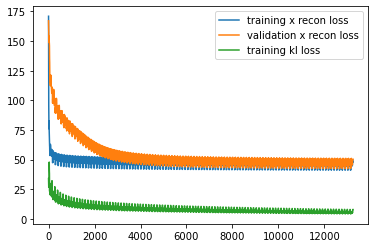

In [13]:
# plt.plot(np.arange(epochs),train_loss_ep)
# plt.plot(np.arange(epochs),val_loss_ep)
plt.plot(np.arange(epochs),train_loss_x_ep)
plt.plot(np.arange(epochs),val_loss_x_ep)
# plt.plot(np.arange(epochs),train_loss_a_ep)
# plt.plot(np.arange(epochs),val_loss_a_ep)
plt.plot(np.arange(epochs),train_loss_kl_ep)
# plt.ylim((0,30))
# plt.xlim((8800,9400))
plt.legend(['training x recon loss','validation x recon loss','training kl loss'],loc='upper right')
# plt.legend(['training loss','validation loss','training x recon loss','validation x recon loss','training a recon loss','validation a recon loss','training kl loss'],loc='upper right')
plt.savefig(os.path.join(plotsavepath,'loss_seed3_xkl.jpg'))
plt.show()


In [ ]:
testepoch=6500
model.load_state_dict(torch.load(os.path.join(modelsavepath,str(testepoch)+'.pt')))
model.eval()
for s in training_samples:
    print(s)
    
#     adj_norm=adjnormlist[s].cuda().float()
    adj_label=adj_list[s].cuda(0).float()
    features=featureslist[s+'X_'+training_sample_X].cuda().float()
    adj_norm=adjnormlist[s]
#     features=featureslist[s+'X_'+training_sample_X]
    pos_weight=pos_weightlist[s]
    norm=normlist[s]
    
    if 'dca' in model_str:
        features_raw=features_raw_list[s+'X_raw'].cuda()
    num_nodes,num_features = features.shape
    maskedgeres= preprocessing.mask_nodes_edges(features.shape[0],testNodeSize=testNodes,valNodeSize=valNodes)
    train_nodes_idx,val_nodes_idx,test_nodes_idx = maskedgeres
    
    if s in training_samples:
        test_nodes_idx_s=test_nodes_idx
    else:
        test_nodes_idx_s=torch.tensor(np.arange(num_nodes))
        

    if adj_decodeName==None:
        adj_recon,mu,logvar,z, features_recon = model(features, adj_norm)
    else:
        adj_decode=adj_decode.cuda()
        adj_recon,mu,logvar,z, features_recon = model(features, adj_norm,adj_decode)
    if adv and (s in list(sampleLabellist_ae.keys())):
        sampleLabel_ae=sampleLabellist_ae[s].cuda().float()
        modelAdv.eval()
        advOut=modelAdv(z)
    if 'dca' in model_str:
        loss_x_test=loss_x(features_recon, features,test_nodes_idx_s,XreconWeight,ridgeL,features_raw)
    else:
        loss_x_test=loss_x(features_recon, features,test_nodes_idx_s,XreconWeight,mse)
    loss_a_test=loss_a(adj_recon, adj_label, pos_weight, norm,test_nodes_idx_s)
    loss_test = loss_x_test+loss_a_test
    
    if adv and (s in list(sampleLabellist_ae.keys())):
        loss_adv_test=loss_adv(advOut,sampleLabel_ae,test_nodes_idx)
        print('loss_adv_test: {:.4f}'.format(loss_adv_test.item()))
        
    print('test results',
          'loss_test: {:.4f}'.format(loss_test.item()),
          'loss_x_test: {:.4f}'.format(loss_x_test.item()),
          'loss_a_test: {:.4f}'.format(loss_a_test.item()))
#          'loss_adv_test: {:.4f}'.format(loss_adv_test.item()))
    if protein:
        test_nodes_idx_s_genes=torch.clone(test_nodes_idx_s)
        test_nodes_idx_s_genes[2112:]=0
        test_nodes_idx_s_proteins=torch.clone(test_nodes_idx_s)
        test_nodes_idx_s_proteins[:2112]=0
        if 'dca' in model_str:
            loss_genes_test=loss_x(features_recon, features,test_nodes_idx_s_genes,XreconWeight,ridgeL,features_raw)
            loss_proteins_test=loss_x(features_recon, features,test_nodes_idx_s_proteins,XreconWeight,ridgeL,features_raw)
        print('loss_x_genes: {:.4f}'.format(loss_genes_test.item()),
          'loss_x_proteins: {:.4f}'.format(loss_proteins_test.item()))

   